# Exploring the Bay Area Single-Family Price Cycles Across Value Groups 
### Reza Taeb - Doctoral Candidate in Business Administration 
#### Golden Gate University, San Francisco
#### Dissertation Code

Source of Data:


https://car.sharefile.com/share/view/s0c02663a5c54e23a

https://fred.stlouisfed.org

<br> 

### Main Goal 

In this project, I am exploring the Bay Area real estate pricing cycles across value groups - recognized by counties - by utilizing some time series approaches on the available historical data of Median Single-Family Houses Across the Bay Area, California. 


### Users

The users of this project and its output could vary from current property owners to prospective property investors, either households or institutions. 

### Dataset 

The original dataset is captured from https://car.sharefile.com/share/view/s0c02663a5c54e23a
 
This dataset originally contains the County sales data, which is generated from a survey of more than 90 associations of REALTORS® throughout the state and represents statistics of existing single-family homes. Sample data has been refined and modified recently to increase the accuracy of the statistics; The dataset has the Monthly Median Price of existing single-family homes in all counties of California starting from January 1990 to December 2019. For this project, I separated the data related to the Bay Area region. S.F. Bay Area has been redefined to include the following counties: Alameda, Contra Costa, Marin, Napa, San Francisco, San Mateo, Santa Clara, Solano, and Sonoma.


<br>



In [1]:
# Importing Necessary Packages and Libraries
%matplotlib inline
import pandas as pd 
import seaborn as sns
import numpy as np
import time
import re
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.ticker as tick
from matplotlib import colors
from pylab import rcParams
import datetime
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge
from sklearn import preprocessing
from sklearn.pipeline import Pipeline, make_pipeline
from collections import defaultdict
import ipywidgets as widgets
import sys
from numpy.polynomial import polynomial
from jdcal import gcal2jd, jd2gcal
from datetime import datetime
from ipywidgets import interact, interact_manual
import scipy.stats
from scipy.stats import pearsonr
from scipy.stats import chi2_contingency
from scipy.stats import t, norm
from math import atanh, pow
from numpy import tanh
sns.set()
matplotlib.rcParams['figure.dpi'] = 100
%config IPCompleter.greedy=True

In [2]:
pwd

'/Users/rtmac/Science/Dissertation'

In [3]:
df = pd.read_csv("Data/Data-Cleaned/202001-MedianPrices-BayArea-Cleaned.csv")

In [4]:
df.head(6)

,Mon-Yr,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,S.F. Bay Area
0,Jan-90,194952,226149,NaN,346153,178888,287499,NaN,271840,NaN,174022,227366
1,Feb-90,196273,219306,NaN,338333,186363,300877,NaN,273100,NaN,180294,234739
2,Mar-90,194856,225162,NaN,358571,180000,290151,NaN,275500,NaN,178823,235337
3,Apr-90,196111,229333,NaN,359574,158571,288725,NaN,274660,NaN,184117,233178
4,May-90,195281,232291,NaN,374999,187692,282626,NaN,266670,NaN,185844,235881
5,Jun-90,194410,231250,NaN,394185,177332,305738,NaN,276960,NaN,185333,240386


In [5]:
df.tail(6)

,Mon-Yr,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,S.F. Bay Area
354,Jul-19,607990,950000,660000.0,1257000,685000,1600000,1562500.0,1298000,465000.0,655000,950000
355,Aug-19,617410,905500,672750.0,1230000,699000,1602500,1545000.0,1190000,459700.0,712000,900000
356,Sep-19,605680,910000,656000.0,1360000,787500,1540000,1470000.0,1225000,455000.0,655750,880000
357,Oct-19,605280,925000,681250.0,1397500,735000,1650000,1560000.0,1234750,470000.0,660000,940000
358,Nov-19,589770,910000,640000.0,1270000,669000,1619000,1595000.0,1259000,462980.0,650000,925000
359,Dec-19,615090,881500,665000.0,1300000,765000,1450000,1475000.0,1225000,455500.0,647500,908750


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360 entries, 0 to 359
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Mon-Yr         360 non-null    object 
 1   CA             360 non-null    int64  
 2   Alameda        360 non-null    int64  
 3   Contra-Costa   168 non-null    float64
 4   Marin          360 non-null    int64  
 5   Napa           360 non-null    int64  
 6   San Francisco  360 non-null    int64  
 7   San Mateo      348 non-null    float64
 8   Santa Clara    360 non-null    int64  
 9   Solano         311 non-null    float64
 10  Sonoma         360 non-null    int64  
 11  S.F. Bay Area  360 non-null    int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 33.9+ KB


### Initial Data Wrangling 

In [7]:
print (df['San Mateo'].iloc[0])
print (type(df['Alameda'].iloc[0]))
print (df['Mon-Yr'].iloc[0])
print (type(df['Mon-Yr'].iloc[0]))

nan
<class 'numpy.int64'>
Jan-90
<class 'str'>


So we need to change the type of column ***'Mon-Yr'*** to **datetime**.

In [8]:
df['Mon-Yr']= pd.to_datetime(df['Mon-Yr'], format='%b-%y')

In [9]:
df['Mon-Yr'].head()

0   1990-01-01
1   1990-02-01
2   1990-03-01
3   1990-04-01
4   1990-05-01
Name: Mon-Yr, dtype: datetime64[ns]

In [10]:
df = df.rename(columns={"Mon-Yr": "Time", "S.F. Bay Area":"Bay Area"})

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360 entries, 0 to 359
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Time           360 non-null    datetime64[ns]
 1   CA             360 non-null    int64         
 2   Alameda        360 non-null    int64         
 3   Contra-Costa   168 non-null    float64       
 4   Marin          360 non-null    int64         
 5   Napa           360 non-null    int64         
 6   San Francisco  360 non-null    int64         
 7   San Mateo      348 non-null    float64       
 8   Santa Clara    360 non-null    int64         
 9   Solano         311 non-null    float64       
 10  Sonoma         360 non-null    int64         
 11  Bay Area       360 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory usage: 33.9 KB


Let's check some main stats of each county:

In [12]:
df.describe()

,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,Bay Area
count,360.000000,3.600000e+02,168.000000,3.600000e+02,360.000000,3.600000e+02,3.480000e+02,3.600000e+02,311.000000,360.000000,3.600000e+02
mean,343064.225000,4.693146e+05,479310.261905,7.495341e+05,406668.466667,7.180662e+05,7.485242e+05,6.098078e+05,282439.472669,386120.005556,5.002346e+05
std,143744.348117,2.252906e+05,150761.048315,3.198139e+05,190086.782054,4.058476e+05,3.762580e+05,3.085105e+05,114455.183454,165138.311856,2.241773e+05
min,167790.000000,1.945280e+05,224620.000000,2.934780e+05,143000.000000,2.456340e+05,2.852560e+05,2.389940e+05,123182.000000,174022.000000,2.222610e+05
25%,198195.250000,2.340372e+05,317867.500000,3.838962e+05,206501.500000,2.997065e+05,4.092158e+05,3.219412e+05,187279.500000,201231.000000,2.760328e+05
50%,305494.000000,4.267065e+05,500000.000000,7.518400e+05,368516.000000,6.966725e+05,6.769000e+05,5.557220e+05,265090.000000,365481.000000,4.636880e+05
75%,477490.000000,6.587475e+05,621610.000000,9.800000e+05,599534.750000,9.225642e+05,9.121250e+05,7.885000e+05,387085.000000,531062.500000,6.903800e+05
max,617410.000000,1.025000e+06,702370.000000,1.450000e+06,787500.000000,1.762500e+06,1.770000e+06,1.454500e+06,492799.000000,712000.000000,1.050000e+06


In [13]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [14]:
## THIS FUNCTION IS JUST FOR BETTER VISUALIZATION ---> YTICK better


def reformat_large_tick_values(tick_val, pos):
    """
    Turns large tick values (in the billions, millions and thousands) such as 4500 into 4.5K and also appropriately turns 4000 into 4K (no zero after the decimal).
    """
    if tick_val >= 1000000000:
        val = round(tick_val/1000000000, 1)
        new_tick_format = '{:}B'.format(val)
    elif tick_val >= 1000000:
        val = round(tick_val/1000000, 1)
        new_tick_format = '{:}M'.format(val)
    elif tick_val >= 1000:
        val = round(tick_val/1000, 1)
        new_tick_format = '{:}K'.format(val)
    elif 0 <= tick_val :
        new_tick_format = round(tick_val, 1)
    elif tick_val < 0 :
        val = round(tick_val/1000, 1)
        new_tick_format = '{:}K'.format(val)
        
    else:
        new_tick_format = tick_val

    # make new_tick_format into a string value
    new_tick_format = str(new_tick_format)
    
    # code below will keep 4.5M as is but change values such as 4.0M to 4M since that zero after the decimal isn't needed
    index_of_decimal = new_tick_format.find(".")
    
    if index_of_decimal != -1:
        value_after_decimal = new_tick_format[index_of_decimal+1]
        if value_after_decimal == "0":
            # remove the 0 after the decimal point since it's not needed
            new_tick_format = new_tick_format[0:index_of_decimal] + new_tick_format[index_of_decimal+2:]
            
    return new_tick_format

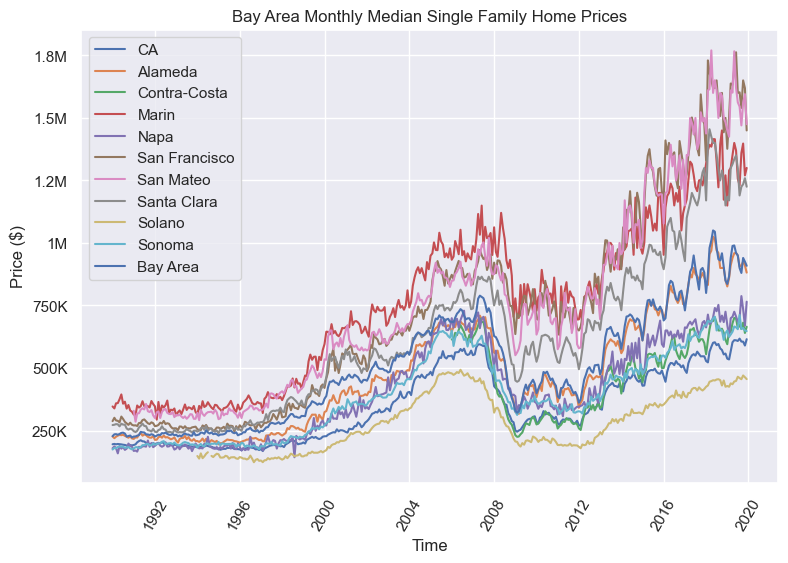

In [15]:
# Getting the whole idea [all counties + Bay Area Average + California Average]

plt.figure(figsize=(9, 6))
plt.plot(df['Time'], df.loc[:, df.columns != 'Time'])
plt.title('Bay Area Monthly Median Single Family Home Prices')
plt.ylabel('Price ($)')
plt.xlabel('Time')
#plt.xlim(('2010-01-01','2019-01-01'))
#plt.ylim((0,950000))
plt.xticks(rotation=60)
plt.legend(df.columns[1:])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

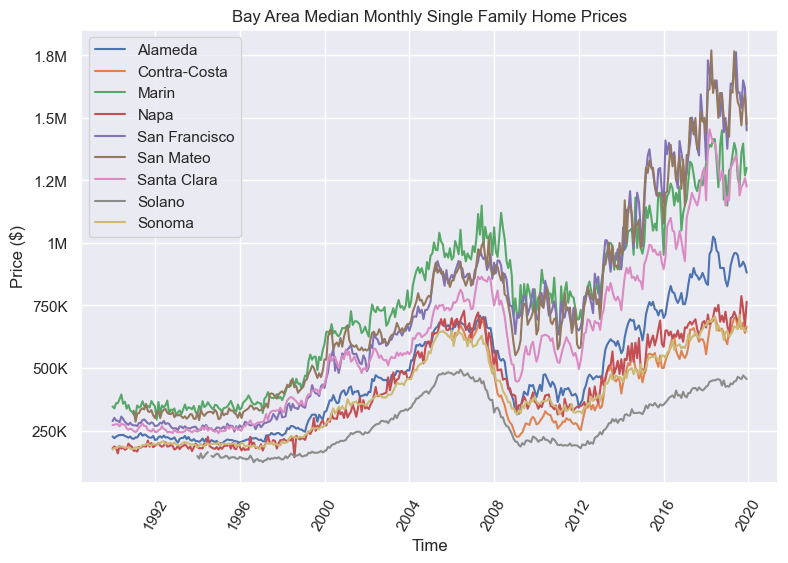

In [16]:
# Getting the whole idea [all counties]

plt.figure(figsize=(9, 6))
plt.plot(df['Time'], df.iloc[:, 2:11])
plt.title('Bay Area Median Monthly Single Family Home Prices')
plt.ylabel('Price ($)')
plt.xlabel('Time')
#plt.xlim(('2010-01-01','2019-01-01'))
#plt.ylim((0,950000))
plt.xticks(rotation=60)
plt.legend(df.columns[2:11])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

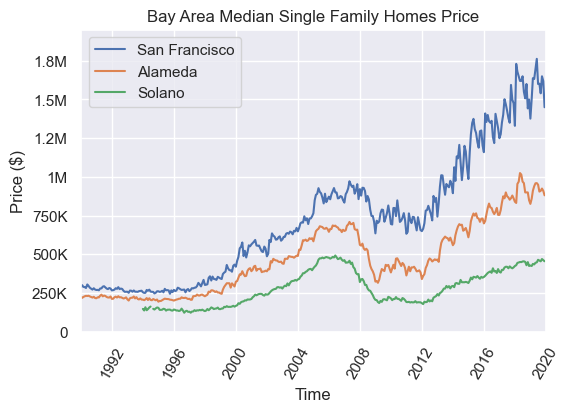

In [17]:
# Just have some initial thought

## Let's start visualizing three columns (San Francisco, Alameda, Solano)

plt.figure(figsize=(6, 4))
#plt.plot(df['Time'], df[['Solano','San Mateo','Bay Area','Napa','Santa Clara','San Francisco']])
plt.plot(df['Time'], df[['San Francisco','Alameda','Solano']])
plt.title('Bay Area Median Single Family Homes Price')
plt.ylabel('Price ($)')
plt.xlabel('Time')
plt.xlim(('1990-01-01','2020-01-01'))
plt.ylim((0,1950000))
plt.xticks(rotation=60)
plt.legend(['San Francisco','Alameda','Solano'])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

Let's Zoom in:

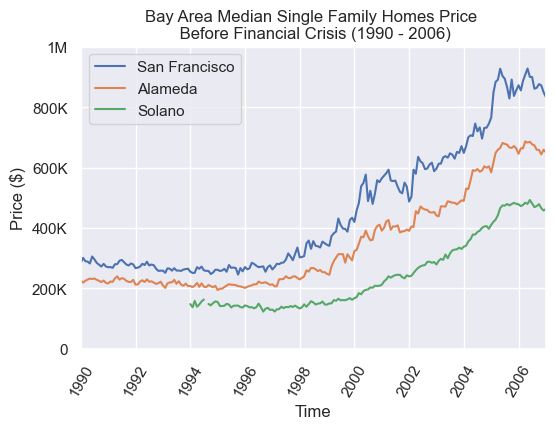

In [18]:
# 1 - Before Financial Crisis

plt.figure(figsize=(6, 4))
#plt.plot(df['Time'], df[['Solano','San Mateo','Bay Area','Napa','Santa Clara','San Francisco']])
plt.plot(df['Time'], df[['San Francisco','Alameda','Solano']])
plt.title('Bay Area Median Single Family Homes Price \n Before Financial Crisis (1990 - 2006)')
plt.ylabel('Price ($)')
plt.xlabel('Time')
plt.xlim(('1990-01-01','2007-01-01'))
plt.ylim((0,1000000))
plt.xticks(rotation=60)
plt.legend(['San Francisco','Alameda','Solano'])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

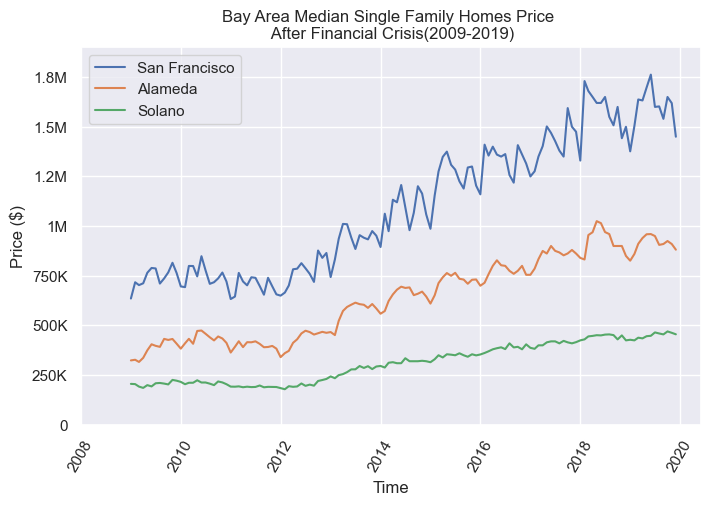

In [19]:
# 2 - After Financial Crisis

plt.figure(figsize=(8, 5))
#plt.plot(df['Time'], df[['Solano','San Mateo','Bay Area','Napa','Santa Clara','San Francisco']])
plt.plot(df[df['Time'] >= '2009-01-01'][['Time']], df[df['Time'] >= '2009-01-01'][['San Francisco','Alameda','Solano']])
plt.title('Bay Area Median Single Family Homes Price \n After Financial Crisis(2009-2019)')
plt.ylabel('Price ($)')
plt.xlabel('Time')
plt.xlim(('2008-01-01','2020-06-01'))
#plt.xticks([2009,2010,2012,2014,2016,2018,2020])
plt.ylim((0,1900000))
plt.xticks(rotation=60)
plt.legend(['San Francisco','Alameda','Solano'])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

# Steps in Time Series Analysis: 

- Look at the trends by doing some initial visualization
- Model drift and remove it
- Find seasonality on residuals by using the Fast Fourier Transform algorithm
- Fit a seasonal model on residuals
- Add back drift and seasonality  

## Test Part on Average Bay Area

### 1 - Look at the trends by doing some basic visualization:

In [20]:
df_bay = df.loc[:,['Time','Bay Area']].copy()

In [21]:
df_bay.head()

,Time,Bay Area
0,1990-01-01,227366
1,1990-02-01,234739
2,1990-03-01,235337
3,1990-04-01,233178
4,1990-05-01,235881


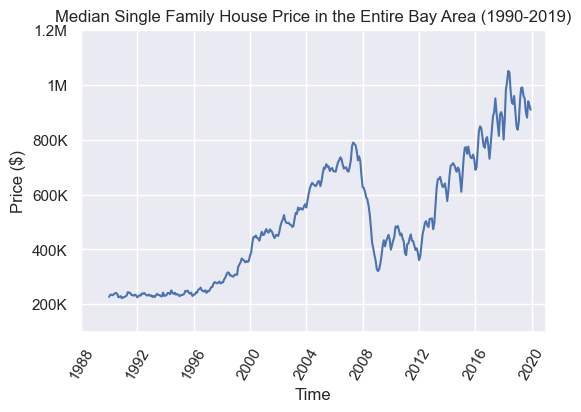

In [22]:
# Basic Visualization of the Average Bay Area Single Family Home Prices

plt.plot(df_bay['Time'],df_bay['Bay Area'])
plt.title('Median Single Family House Price in the Entire Bay Area (1990-2019)')
plt.xlabel('Time')
plt.ylabel('Price ($)')
plt.xticks(rotation=60)
plt.ylim((100000,1200000))
plt.xlim(('1988-01-01','2021-01-01'))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

The financial crisis had a tremendous impact on the real estate market, so it would be better to separate the whole period into two different parts to get better models. 

First, let's check where it is the best time to separate:

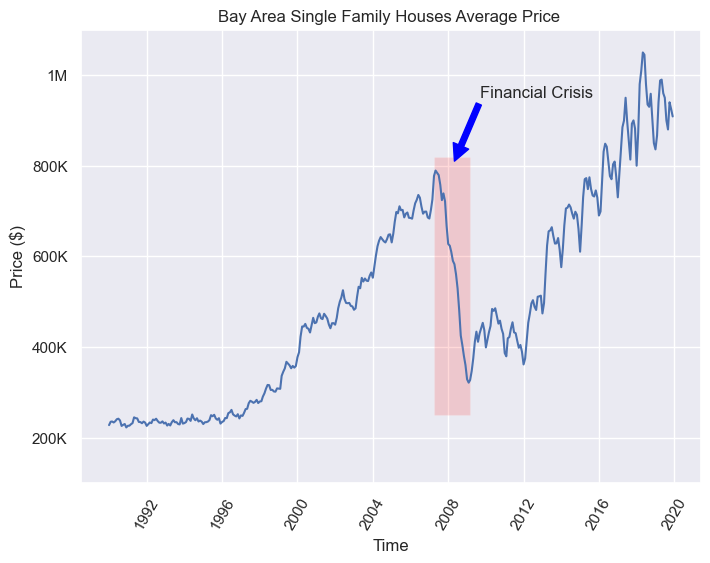

In [23]:
# first see where whould be the best place to separate (2007 to 2009 the area)

plt.figure(figsize=(8,6))
ax = sns.lineplot( x=df_bay['Time'], y=df_bay['Bay Area'])
ax.set(xlabel='Time', ylabel='Price ($)', title='Bay Area Single Family Houses Average Price ')
ax.fill_between([13600,14300], 250000, 820000, facecolor='red', alpha = .15, interpolate=True)
plt.annotate(text='Financial Crisis', xy=(14000,810000), xytext=(14500,950000), arrowprops={'color':'blue','lw':1.01})
plt.xticks(rotation=60)
plt.ylim((100000,1100000))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()
#print (ax.get_xlim())
#print (ax.get_ylim())

More zoom in:

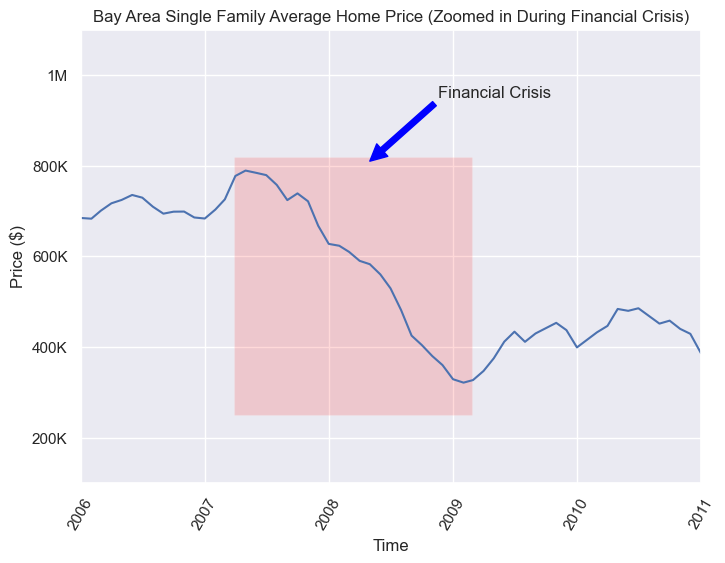

In [24]:
plt.figure(figsize=(8,6))
ax = sns.lineplot( x=df_bay['Time'], y=df_bay['Bay Area'])
ax.set(xlabel='Time', ylabel='Price ($)',title='Bay Area Single Family Average Home Price (Zoomed in During Financial Crisis)')
plt.xlim('2006-01-01','2011-01-01')
plt.ylim((100000,1100000))
ax.fill_between([13600,14300], 250000, 820000, facecolor='red', alpha = .15, interpolate=True)
plt.annotate(text='Financial Crisis', xy=(14000,810000), xytext=(14200,950000), arrowprops={'color':'blue','lw':1.01})
plt.xticks(rotation=60)
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

The financial crisis in the USA started around the year 2007, and real estate also impacted significantly at this time. Modeling such a crisis could be the topic of another research and needs its specific consideration. Hence I separated the real estate into two main periods, 1990 to 2007 and 2009 to 2019 and filtered out the crisis data.

In [25]:
# Separating the whole 'Bay Area' dataframe into two main parts (1990-2006) and (2009-2019)

df_bay_part1 = df_bay.loc[df_bay['Time']<'2007-01-01'].copy()
df_bay_part2 = df_bay.loc[df_bay['Time']>='2009-01-01'].copy()

## Before Financial Crisis (1990 - 2006)

## 1 - Modeling Drift

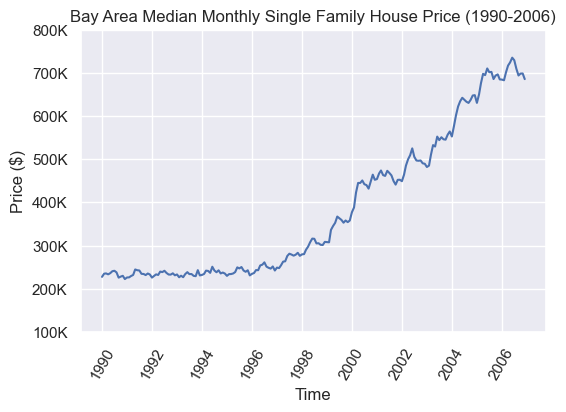

In [26]:
# Initial visualization

plt.plot(df_bay_part1['Time'],df_bay_part1['Bay Area'])
plt.title('Bay Area Median Monthly Single Family House Price (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price ($)')
plt.xticks(rotation=60)
plt.ylim((100000,800000))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

The first step is modeling the **drift**. 

$$ X_t = \mu t + \varepsilon_t $$

The above chart shows that probably a version of **exponential model (** $e^{x}$ **)** can be a good choice to model the main drift. In order to do that I added the column as 'Constant', and used the Ridge regressor on logarithmic values ( $ln { x }$ ) of home price. Also, the 'Time' column should be converted to Julian type before using it as variable in our regression model. 

** Julian date is the form of Time variable which is useful for doing some mathematics operations. 

In [27]:
# Add a constant field for the linear regression

def add_constant(X):
    X['Const'] = pd.Series(np.ones(len(X.index)), index=X.index)
    return X

In [28]:
# Add Julian column + Add Constant Column

df_bay_part1['Julian'] = df_bay_part1['Time'].apply(lambda x: x.to_julian_date() )
df_bay_part1 = add_constant(df_bay_part1) 

In [29]:
# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model = Ridge().fit( 
    X=df_bay_part1[['Julian', 'Const']], 
    y=np.log(df_bay_part1['Bay Area'])
)

# Adding two columns as predicted value by exponential model and its error
df_bay_part1['Exponential_Model'] = np.exp(exponential_model.predict(df_bay_part1[['Julian', 'Const']]))
df_bay_part1['Error_Exponential'] = (df_bay_part1['Exponential_Model'] / df_bay_part1['Bay Area'])-1


<br>

Let's explore **Exponential Model Accuracy** :

</br>

<br>

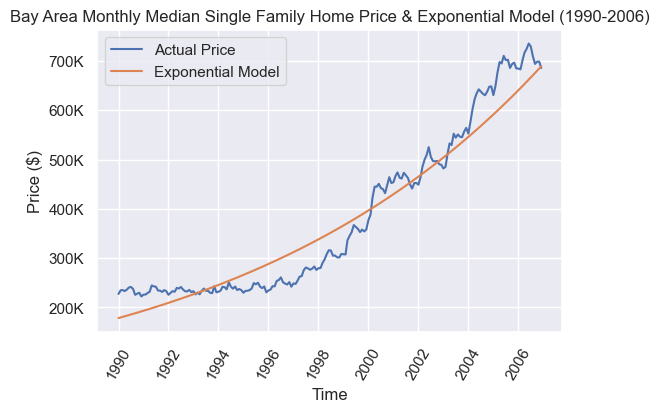

In [30]:
# exponential model visualization

plt.plot(df_bay_part1['Time'], df_bay_part1[['Bay Area','Exponential_Model']])
plt.title('Bay Area Monthly Median Single Family Home Price & Exponential Model (1990-2006)') 
plt.ylabel('Price ($)')
plt.xlabel('Time')
plt.xticks(rotation=60)
plt.legend(['Actual Price','Exponential Model'])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [31]:
## Summary of Exponential Model Error - Before the Financial Crisis

df_bay_part1['Error_Exponential'].describe()

count    204.000000
mean       0.007606
std        0.124788
min       -0.234838
25%       -0.086690
50%       -0.019693
75%        0.105680
max        0.280618
Name: Error_Exponential, dtype: float64

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


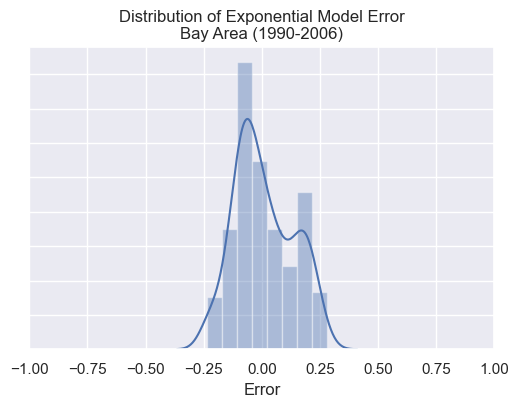

In [32]:
# Histogram of Exponential Model Error 

ax = sns.distplot(df_bay_part1['Error_Exponential'], bins=None, hist=True, kde=True)
ax.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-1,1)
plt.title('Distribution of Exponential Model Error\nBay Area (1990-2006)')
plt.show()

## 2 - Modeling Seasonality

Let's improve our model by modeling the seasonality. We need to figure out the amplitudes and frequency of possible seasonality. In order to do that, we can use a fourier analysis. 

#### Fourier Analysis

Fourier transform is a function that transforms a time domain signal into a frequency domain. The function accepts a time signal as input and produces the signal's frequency representation as an output.

![Fast Fourier Transform Algorithm](fourieralgorithm.png)


Any periodic signal can be represented as the sum of several sine waves with varying amplitude, phase, and frequency. A time series can be converted into its frequency components with the mathematical tool known as the Fourier transform. 

There are two main forms of priodic signals, discrete and contionous. Our case, real estate median price, is considered to be discrete signal since it is measured once in each time stamps (month) and there is no continousy between two consecutive ones. 

For $N$ uniformly sampled data points $x_j$ ($j = 0$,...,$N-1$)

$$ x_j = \frac{1}{N} \sum_{k=0}^{N-1} X_k e^{i2 \pi jk/N} $$
$$ X_k = \sum_{j=0}^{N-1} x_j e^{-i2 \pi jk/N} $$

The common algorithm for computing discrete transforms is the fast Fourier transform, usually abbreviated FFT.

The output of a FFT can be thought of as a representation of all the frequency components of your data. In some sense it is a histogram with each “frequency bin” corresponding to a particular frequency in your signal. Each frequency component has both an amplitude and phase, and is represented as a complex number. In the equations above,  𝑋𝑘
X
k
  can be thought of as the "amount" of frequency  𝑘
k
  in the signal  𝑥
x
 . Generally, we care only about the amplitude, given by the modulus of that complex term. As we are dealing with discrete data, the signal is bounded, and interpretation of the axes requires some consideration.

In order to do that, I need to remove the drift part of the data captured by the exponential model. In other words, the FFT algorithm will apply to the difference between **Exponential Model** and **Actual Values**.

I added the residual of data from drift (exponential model) in the new column as ***residual_exponential_model***:

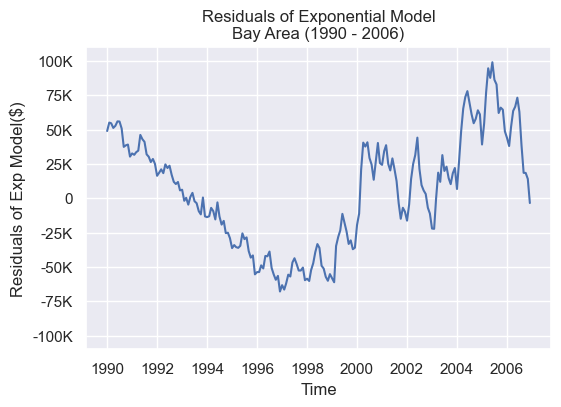

In [33]:
## Add new column as 'residual_exponential_model' and visualzie it:

df_bay_part1['Residual_Exponential_Model'] = df_bay_part1['Bay Area'] - df_bay_part1['Exponential_Model']

## Visualize the residual of the drift: 

ax = sns.lineplot(x=df_bay_part1['Time'],y=df_bay_part1['Residual_Exponential_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Exp Model($)')
plt.title('Residuals of Exponential Model\nBay Area (1990 - 2006)')
plt.ylim((-110000,110000))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [34]:
# Importing FFT package 
from math import pi
from scipy import fftpack

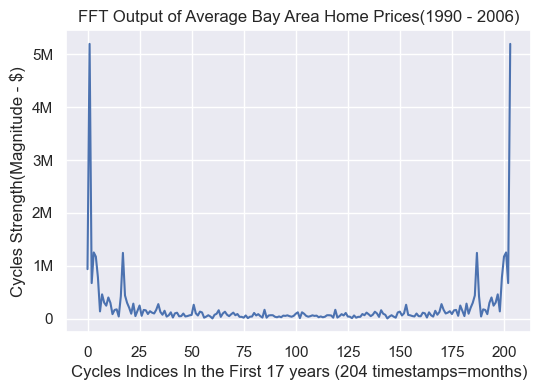

In [35]:
# Let's check the output of Fourier Transform of Bay Area median price


fft_bay_part1 = fftpack.fft(df_bay_part1['Residual_Exponential_Model'])
plt.figure(figsize=(6,4))
plt.plot(np.abs(fft_bay_part1))
plt.title('FFT Output of Average Bay Area Home Prices(1990 - 2006)')
plt.xlabel('Cycles Indices In the First 17 years (204 timestamps=months)')
plt.ylabel('Cycles Strength(Magnitude - $)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

So now the main question is how to interperet the above model? 

Note that we subtract the drift before computing the FFT.  Otherwise, there would be a large zero-frequency component. (? should be right?)

The x-axis is showing frequency.  Low frequencies, corresponding to long times, are on the left; high frequencies and short times are on the right. The lowest non-zero frequency measured has a single cycle over the full 17-year period, corresponding to a frequency of $1/17\, y^{-1}$.  The highest frequency is that of the sampling, $1\, m^{-1}$.

The discrete Fourier transform of real data is symmetric about the center of its frequency range.  Due to the problem of *aliasing*, it cannot distinguish signals with a frequency above half its sampling frequency from those below.  This limiting frequency is called the **Nyquist frequency**, and the results of a FFT for frequencies above it should be ignored.

More formally, the Nyquist frequency is the highest frequency that can be resolved given your sampling rate.

$$ \nu_N = \frac{1}{2 \Delta t} $$

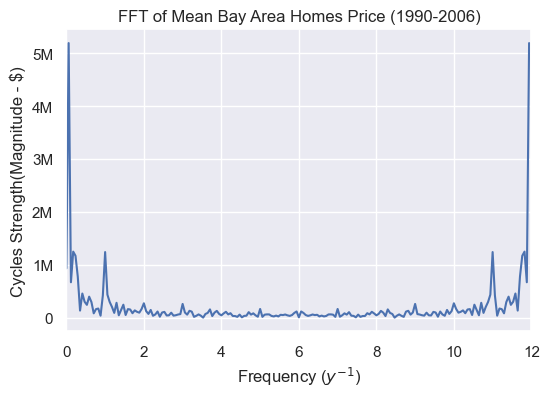

In [36]:
plt.figure(figsize = (6,4))
plt.plot(1./17*np.arange(len(fft_bay_part1)), np.abs(fft_bay_part1)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of Mean Bay Area Homes Price (1990-2006)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.ylabel('Cycles Strength(Magnitude - $)')
plt.xlabel('Frequency ($y^{-1}$)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

Let's zoom in : 

<br>

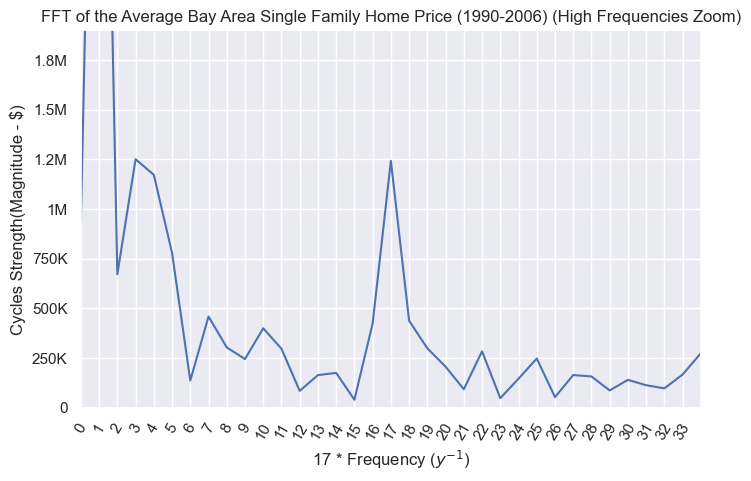

In [37]:
# Zoom in figure of FFT Bay Area (1990 - 2006)
monthly_cycles_in_17_years = 17*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 2,  step=1./17),rotation=60, labels=np.arange(0,34))
plt.plot(1./17 * np.arange(len(fft_bay_part1)), np.abs(fft_bay_part1))
plt.title("FFT of the Average Bay Area Single Family Home Price (1990-2006) (High Frequencies Zoom)")
plt.ylim([0,1900000])
plt.xlim([0, 2])
plt.ylabel('Cycles Strength(Magnitude - $)')
plt.xlabel('17 * Frequency ($y^{-1}$)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **17** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 3), so it is basically: 

**3/17 = 1/Year -> Year = 17/3 = 5.67 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Average Bay Area - 1990 to 2006)

In [38]:
fft_bay_part1_abs = np.abs(fft_bay_part1)
df_bay_part1_cycles = pd.DataFrame(data=fft_bay_part1_abs, columns=['FFT Absolute Value'])

In [39]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (204/2 = 102)

df_bay_part1_cycles.iloc[:102].sort_values(by='FFT Absolute Value', ascending=False).head(15)

,FFT Absolute Value
1,5.190028e+06
3,1.250165e+06
17,1.241850e+06
4,1.171624e+06
0,9.342982e+05
5,7.786890e+05
2,6.712409e+05
7,4.586022e+05
18,4.373552e+05
16,4.233335e+05


So based on the above figure and table,  I separated the top 10 periods that have relatively high FFT Absolute Value ***(indices: 1,3,17,4,0,5,2,7,18,16)***. The 0 index does not mean anything (infinite cycle). 

here are the 9 biggest periods of our **Bay Area Part 1 (1990-2006)**: 

In [40]:
d = {'Index':[1,3,17,4,5,2,7,18,16]}
df_bay_part1_cycles_top = pd.DataFrame(data=d)
df_bay_part1_cycles_top['Cycle(year)'] = df_bay_part1_cycles_top['Index'].apply(lambda x : 17./ x) 
df_bay_part1_cycles_top

,Index,Cycle(year)
0,1,17.000000
1,3,5.666667
2,17,1.000000
3,4,4.250000
4,5,3.400000
5,2,8.500000
6,7,2.428571
7,18,0.944444
8,16,1.062500


The 1 index mean the whole period (17 years), so we end up using **8 cycles** with different frequencies.

Basically, based on the above table, I assume these 8 main cycles **: 5.67 , 1 , 4.25 , 3.4 , 8.5 , 2.43 , 0.94 , 1.06  years**.

Now we want to model seasonality (using that 8 top frequencies) on the residual of exponential model.

Residual_Exp_Model = (Value - Exponential_Model) 

- Since we know that cycles are roughly sinusoidal, we know that a reasonable model for each period might be
$$ y_t = k \sin\left( \frac{t - t_0}{T} \right) + \epsilon$$
where $k$ and $t_0$ are parameters to be learned and $T$ is time of each cycle for seasonal variation.  While this is linear in $k$, it is not linear in $t_0$.  However, we know from Fourier analysis, that the above is equivalent to 
$$ y_t = A \sin\left( \frac{t}{T} \right) + B \cos\left( \frac{t}{T} \right) + \epsilon$$
which is linear in $A$ and $B$.  This can be solved using a linear regression.

Finally, we are going to add the all cycles terms as variables in our final regression model. 

In [41]:
# Take a Glance
df_bay_part1.head()

,Time,Bay Area,Julian,Const,Exponential_Model,Error_Exponential,Residual_Exponential_Model
0,1990-01-01,227366,2447892.5,1.0,178399.504602,-0.215364,48966.495398
1,1990-02-01,234739,2447923.5,1.0,179613.456151,-0.234838,55125.543849
2,1990-03-01,235337,2447951.5,1.0,180717.027083,-0.232093,54619.972917
3,1990-04-01,233178,2447982.5,1.0,181946.748631,-0.219709,51231.251369
4,1990-05-01,235881,2448012.5,1.0,183144.768480,-0.223571,52736.231520


In [42]:
# Add cycle sin and cos to dataframe

# 5.67 years -> (should I change 365.25 * 5.67 since, it is night the same thing as 5.67 years)
df_bay_part1['sin(5.67years)'] = np.sin(df_bay_part1['Julian']/(365.25*5.67) * 2 * np.pi)
df_bay_part1['cos(5.67years)'] = np.cos(df_bay_part1['Julian']/(365.25*5.67) * 2 * np.pi)

# 1 year
df_bay_part1['sin(year)'] = np.sin(df_bay_part1['Julian']/(365.25*1) * 2 * np.pi)
df_bay_part1['cos(year)'] = np.cos(df_bay_part1['Julian']/(365.25*1) * 2 * np.pi)

# 4.25 years 
df_bay_part1['sin(4.25years)'] = np.sin(df_bay_part1['Julian']/(365.25*4.25) * 2 * np.pi)
df_bay_part1['cos(4.25years)'] = np.cos(df_bay_part1['Julian']/(365.25*4.25) * 2 * np.pi)

# 3.4 years 
df_bay_part1['sin(3.4years)'] = np.sin(df_bay_part1['Julian']/(365.25*3.4) * 2 * np.pi)
df_bay_part1['cos(3.4years)'] = np.cos(df_bay_part1['Julian']/(365.25*3.4) * 2 * np.pi)

# 8.5 years 
df_bay_part1['sin(8.5years)'] = np.sin(df_bay_part1['Julian']/(365.25*8.5) * 2 * np.pi)
df_bay_part1['cos(8.5years)'] = np.cos(df_bay_part1['Julian']/(365.25*8.5) * 2 * np.pi)

# 2.43 years 
df_bay_part1['sin(2.43years)'] = np.sin(df_bay_part1['Julian']/(365.25*2.43) * 2 * np.pi)
df_bay_part1['cos(2.43years)'] = np.cos(df_bay_part1['Julian']/(365.25*2.43) * 2 * np.pi)

# 0.94 years 
df_bay_part1['sin(0.94years)'] = np.sin(df_bay_part1['Julian']/(365.25*0.94) * 2 * np.pi)
df_bay_part1['cos(0.94years)'] = np.cos(df_bay_part1['Julian']/(365.25*0.94) * 2 * np.pi)

# 1.06 years 
df_bay_part1['sin(1.06years)'] = np.sin(df_bay_part1['Julian']/(365.25*1.06) * 2 * np.pi)
df_bay_part1['cos(1.06years)'] = np.cos(df_bay_part1['Julian']/(365.25*1.06) * 2 * np.pi)

let's check it very quick:

In [43]:
df_bay_part1.head(4)

,Time,Bay Area,Julian,Const,Exponential_Model,Error_Exponential,Residual_Exponential_Model,sin(5.67years),cos(5.67years),sin(year),...,sin(3.4years),cos(3.4years),sin(8.5years),cos(8.5years),sin(2.43years),cos(2.43years),sin(0.94years),cos(0.94years),sin(1.06years),cos(1.06years)
0,1990-01-01,227366,2447892.5,1.0,178399.504602,-0.215364,48966.495398,0.027044,0.999634,-0.221772,...,0.863931,0.503611,0.209545,-0.977799,0.063069,0.998009,-0.999992,-0.003957,-0.627359,-0.778730
1,1990-02-01,234739,2447923.5,1.0,179613.456151,-0.234838,55125.543849,0.120804,0.992676,0.304719,...,0.931992,0.362480,0.147827,-0.989013,0.278821,0.960343,-0.845467,0.534027,-0.925080,-0.379772
2,1990-03-01,235337,2447951.5,1.0,180717.027083,-0.232093,54619.972917,0.204595,0.978847,0.711276,...,0.973835,0.227257,0.091576,-0.995798,0.462474,0.886633,-0.475056,0.879956,-0.997898,0.064808
3,1990-04-01,233178,2447982.5,1.0,181946.748631,-0.219709,51231.251369,0.295618,0.955306,0.969843,...,0.997379,0.072351,0.028962,-0.999581,0.644400,0.764689,0.072224,0.997388,-0.843009,0.537900


The goal is a prediction based on historical data. For this purpose, I am going to **shift** the value column (Exponential_Model_Residual) to few earlier timestamps (let's do it for **2 months** in advance) and put it as the **Goal** of our predictive model. 

In [44]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Exponential_Model_Residual_Goal'

df_bay_part1['Seasonality_Model_Goal'] = df_bay_part1['Residual_Exponential_Model'].shift(-2)

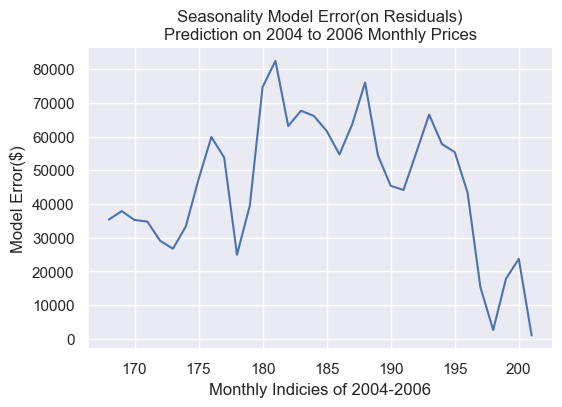

2484608075.498137
49845.843111518705


In [45]:
cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 13 years is training set

train_bay_part1 = df_bay_part1[df_bay_part1.Time.dt.year < cut_year].dropna(how='any')
test_bay_part1  = df_bay_part1[df_bay_part1.Time.dt.year >= cut_year].dropna(how='any')

regress = LinearRegression().fit( 
        X=train_bay_part1[['Residual_Exponential_Model', 'sin(5.67years)', 'cos(5.67years)', 'sin(year)', 'cos(year)','sin(4.25years)','cos(4.25years)','sin(3.4years)','cos(3.4years)','sin(8.5years)','cos(8.5years)',
                           'sin(2.43years)','cos(2.43years)','sin(0.94years)','cos(0.94years)','sin(1.06years)','cos(1.06years)']], 
        y=train_bay_part1['Seasonality_Model_Goal'])

test_bay_part1['Predicted_Residual'] = regress.predict(X=test_bay_part1[['Residual_Exponential_Model', 'sin(5.67years)', 'cos(5.67years)', 'sin(year)', 'cos(year)','sin(4.25years)','cos(4.25years)','sin(3.4years)','cos(3.4years)','sin(8.5years)','cos(8.5years)',
                           'sin(2.43years)','cos(2.43years)','sin(0.94years)','cos(0.94years)','sin(1.06years)','cos(1.06years)']])

(test_bay_part1['Seasonality_Model_Goal'] - test_bay_part1['Predicted_Residual']).plot()
plt.title('Seasonality Model Error(on Residuals)\nPrediction on 2004 to 2006 Monthly Prices')
plt.ylabel('Model Error($)')
plt.xlabel('Monthly Indicies of 2004-2006')
plt.show()



print(mean_squared_error(test_bay_part1['Seasonality_Model_Goal'], test_bay_part1['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_bay_part1['Seasonality_Model_Goal'], test_bay_part1['Predicted_Residual'])))

## 3 - Adding Back Drift and Seasonality

Now let's put back drift and seasonality to compare the models with real data.

#### Example : 
    
For point 3 -> **Predicted value = exponential_model point 3 + seasonality_model (on residuals) predicted from point 1** 

So the predicted residuals should be shifted (2 month forward (.shift(2)) 

In [46]:
test_bay_part1['Shifted_Back_Predicted_Residual'] = test_bay_part1['Predicted_Residual'].shift(2)
test_bay_part1['Final_Predicted_Value'] = test_bay_part1['Bay Area'] + test_bay_part1['Shifted_Back_Predicted_Residual']
test_bay_part1['Error_Final'] = (test_bay_part1['Final_Predicted_Value'] / test_bay_part1['Bay Area'])-1

Let's check some columns:

In [47]:
test_bay_part1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34 entries, 168 to 201
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Time                             34 non-null     datetime64[ns]
 1   Bay Area                         34 non-null     int64         
 2   Julian                           34 non-null     float64       
 3   Const                            34 non-null     float64       
 4   Exponential_Model                34 non-null     float64       
 5   Error_Exponential                34 non-null     float64       
 6   Residual_Exponential_Model       34 non-null     float64       
 7   sin(5.67years)                   34 non-null     float64       
 8   cos(5.67years)                   34 non-null     float64       
 9   sin(year)                        34 non-null     float64       
 10  cos(year)                        34 non-null     float64     

In [48]:
test_bay_part1[['Time','Bay Area','Exponential_Model','Residual_Exponential_Model','Error_Exponential','Final_Predicted_Value','Error_Final']]

,Time,Bay Area,Exponential_Model,Residual_Exponential_Model,Error_Exponential,Final_Predicted_Value,Error_Final
168,2004-01-01,552699,545966.334274,6732.665726,-0.012181,NaN,NaN
169,2004-02-01,577193,549681.460496,27511.539504,-0.047664,NaN,NaN
170,2004-03-01,601622,553179.784193,48442.215807,-0.080519,614695.570864,0.021731
171,2004-04-01,622219,556943.995633,65275.004367,-0.104907,649629.612730,0.044053
172,2004-05-01,634295,560611.167298,73683.832702,-0.116167,672739.039720,0.060609
173,2004-06-01,642459,564425.946922,78033.053078,-0.121460,685725.555168,0.067345
174,2004-07-01,637812,568142.383145,69669.616855,-0.109232,678402.553442,0.063640
175,2004-08-01,633234,572008.410284,61225.589716,-0.096687,667752.016933,0.054511
176,2004-09-01,630555,575900.744500,54654.255500,-0.086676,651938.613609,0.033912
177,2004-10-01,637546,579692.735990,57853.264010,-0.090744,648107.427613,0.016566


In [49]:
print ('The mean and median error of Exponential Model: {} , {}'.format(np.mean(test_bay_part1['Error_Exponential']),np.median(test_bay_part1['Error_Exponential'])))
print ('The mean and median error of Whole Model (Exponential Model + Seasonal Adjusted): {} , {}'.format(np.mean(test_bay_part1['Error_Final']),np.nanmedian(test_bay_part1['Error_Final'])))

The mean and median error of Exponential Model: -0.08760963426850545 , -0.09143373990378617
The mean and median error of Whole Model (Exponential Model + Seasonal Adjusted): 0.021083283901022164 , 0.022165303826115812


let's compare the predicted values with real values:

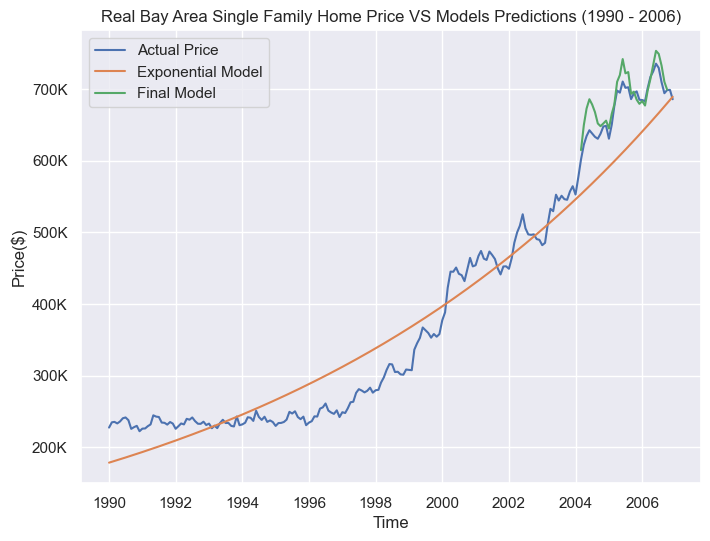

In [50]:
plt.figure(figsize=(8, 6))
plt.plot(df_bay_part1['Time'],df_bay_part1['Bay Area'])
plt.plot(df_bay_part1['Time'],df_bay_part1['Exponential_Model'])
plt.plot(test_bay_part1['Time'],test_bay_part1['Final_Predicted_Value'])
plt.legend(['Actual Price','Exponential Model','Final Model'])
plt.title('Real Bay Area Single Family Home Price VS Models Predictions (1990 - 2006)')
plt.xlabel('Time')
plt.ylabel('Price($)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [51]:
#Final Model Error Summary
test_bay_part1['Error_Final'].describe()

count    32.000000
mean      0.021083
std       0.021984
min      -0.016498
25%       0.003291
50%       0.022165
75%       0.032948
max       0.067345
Name: Error_Final, dtype: float64

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


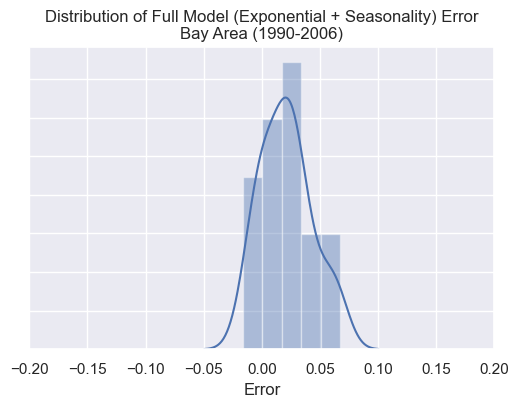

In [52]:
# Histogram of Exponential Model Error 

ax = sns.distplot(test_bay_part1['Error_Final'].dropna(), bins=None, hist=True, kde=True)
ax.set(yticklabels=[])
plt.xlabel('Error')
plt.xlim(-0.2,0.2)
plt.ylabel('')
plt.title('Distribution of Full Model (Exponential + Seasonality) Error\nBay Area (1990-2006)')
plt.show()

# After Financial Crisis (2009 - 2020)

## 1 - Modeling Drift

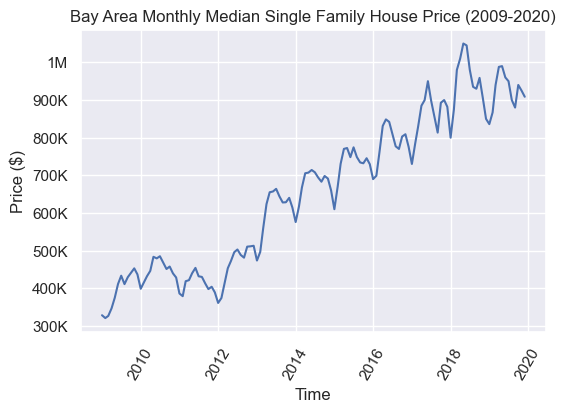

In [53]:
# Initial visualization

plt.plot(df_bay_part2['Time'],df_bay_part2['Bay Area'])
plt.title('Bay Area Monthly Median Single Family House Price (2009-2020)')
plt.xlabel('Time')
plt.ylabel('Price ($)')
plt.xticks(rotation=60)
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [54]:
# Add Julian column + Add Constant Column
df_bay_part2['Julian'] = df_bay_part2['Time'].apply(lambda x: x.to_julian_date() )
df_bay_part2 = add_constant(df_bay_part2) 

In [55]:
# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model = Ridge().fit( 
    X=df_bay_part2[['Julian', 'Const']], 
    y=np.log(df_bay_part2['Bay Area'])
)

#exp_model_df_bay = df_bay_part1

# Adding two columns as predicted value by exponential model and its error
df_bay_part2['Exponential_Model'] = np.exp(exponential_model.predict(df_bay_part2[['Julian', 'Const']]))
df_bay_part2['Error_Exponential'] = (df_bay_part2['Exponential_Model'] / df_bay_part2['Bay Area'])-1

<br>

Let's explore the **Exponential Model Accuracy:**

<br>

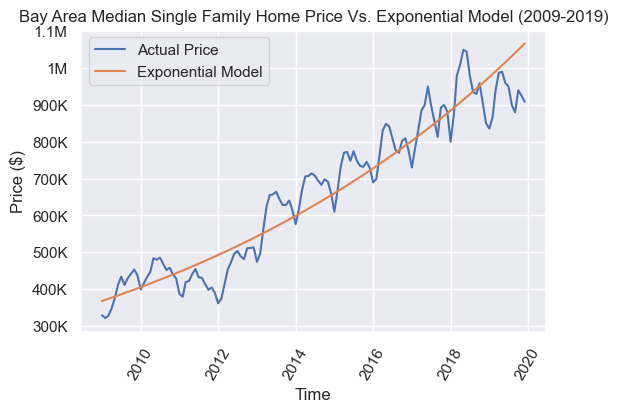

In [56]:
# exponential model visualization

plt.plot(df_bay_part2['Time'], df_bay_part2[['Bay Area','Exponential_Model']])
plt.title('Bay Area Median Single Family Home Price Vs. Exponential Model (2009-2019)') 
plt.ylabel('Price ($)')
plt.xlabel('Time')
plt.xticks(rotation=60)
plt.legend(['Actual Price','Exponential Model'])
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [57]:
## Summary of Exponential Model Error
df_bay_part2['Error_Exponential'].describe()

count    132.000000
mean       0.005163
std        0.104420
min       -0.143994
25%       -0.080214
50%       -0.008399
75%        0.076353
max        0.363070
Name: Error_Exponential, dtype: float64

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


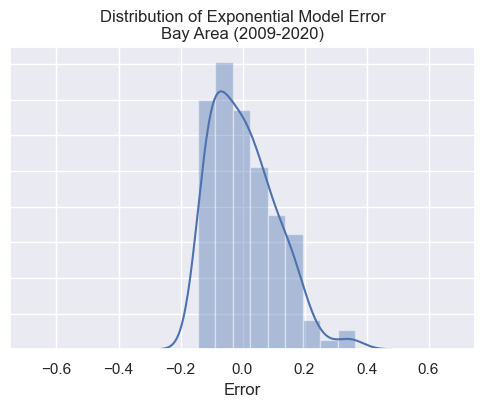

In [58]:
# Histogram of Exponential Model Error 

ax = sns.distplot(df_bay_part2['Error_Exponential'], bins=None, hist=True, kde=True)
ax.set(yticklabels=[])
plt.xlabel('Error')
plt.xlim(-0.75,0.75)
plt.ylabel('')
plt.title('Distribution of Exponential Model Error\nBay Area (2009-2020)')
plt.show()

## 2 - Modeling Seasonality

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


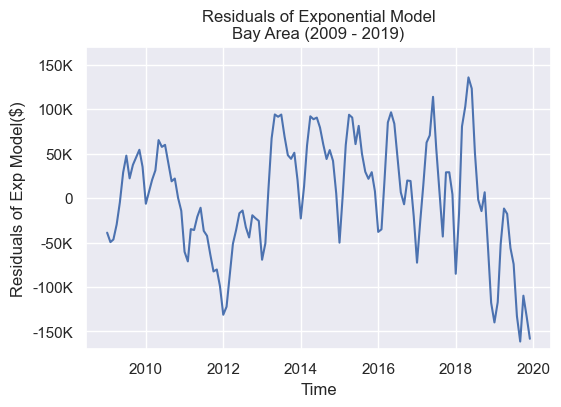

In [59]:
## Add new column as 'residual_exponential_model' and visualzie it:

df_bay_part2['Residual_Exponential_Model'] = df_bay_part2['Bay Area'] - df_bay_part2['Exponential_Model']

## Visualize the residual of the drift: 

ax = sns.lineplot(df_bay_part2['Time'],df_bay_part2['Residual_Exponential_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Exp Model($)')
plt.title('Residuals of Exponential Model\nBay Area (2009 - 2019)')
plt.ylim((-170000,170000))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

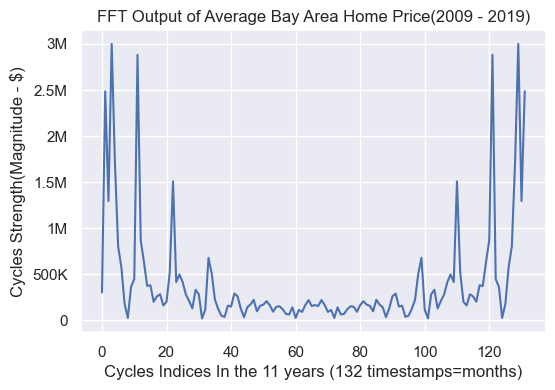

In [60]:
# Let's check the output of Fourier Transform of Bay Area median price

fft_bay_part2 = fftpack.fft(df_bay_part2['Residual_Exponential_Model'])
plt.figure(figsize=(6,4))
plt.plot(np.abs(fft_bay_part2))
plt.title('FFT Output of Average Bay Area Home Price(2009 - 2019)')
plt.xlabel('Cycles Indices In the 11 years (132 timestamps=months)')
plt.ylabel('Cycles Strength(Magnitude - $)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

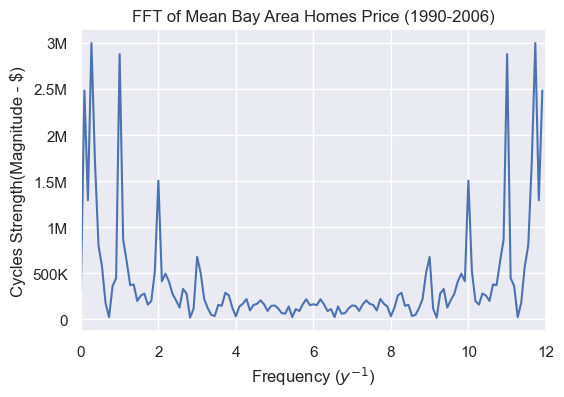

In [61]:
plt.figure(figsize = (6,4))
plt.plot(1./11*np.arange(len(fft_bay_part2)), np.abs(fft_bay_part2)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of Mean Bay Area Homes Price (1990-2006)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.ylabel('Cycles Strength(Magnitude - $)')
plt.xlabel('Frequency ($y^{-1}$)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

<br>

Let's zoom in: 

<br>

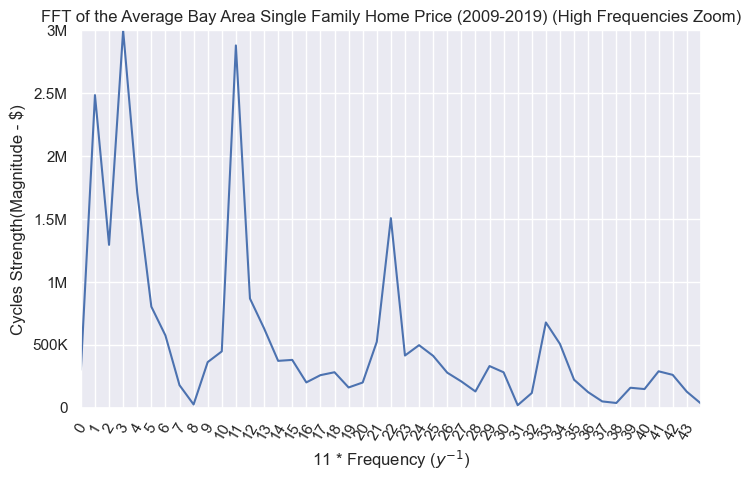

In [62]:
# Zoom in figure of FFT Bay Area (2009 - 2020)
monthly_cycles_in_11_years = 11*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 4,  step=1./11),rotation=60, labels=np.arange(0,44))
plt.plot(1./11 * np.arange(len(fft_bay_part2)), np.abs(fft_bay_part2))
plt.title("FFT of the Average Bay Area Single Family Home Price (2009-2019) (High Frequencies Zoom)")
plt.ylim([0,3000000])
plt.xlim([0, 4])
plt.ylabel('Cycles Strength(Magnitude - $)')
plt.xlabel('11 * Frequency ($y^{-1}$)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()


***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **11** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 3), so it is basically: 

**3/11 = 1/Year -> Year = 11/3 = 3.67 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Average Bay Area - 2009 to 2019)

In [63]:
fft_bay_part2_abs = np.abs(fft_bay_part2)

In [64]:
# Make the dataframe of the absolute part of the FFT output to do some analysis

df_bay_part2_cycles = pd.DataFrame(data=fft_bay_part2_abs, columns=['FFT Absolute Value'])

In [65]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (132/2 = 66)

df_bay_part2_cycles.iloc[:66].sort_values(by='FFT Absolute Value', ascending=False).head(15)

,FFT Absolute Value
3,2.997804e+06
11,2.878392e+06
1,2.483545e+06
4,1.708582e+06
22,1.505768e+06
2,1.293469e+06
12,8.667937e+05
5,8.026977e+05
33,6.769094e+05
13,6.300679e+05


So based on the above figure and table,  I separated the top 8 periods that have relatively high FFT Absolute Value ***(indices: 3,11,1,4,22,2,12,5)***. 

here are the 8 biggest periods of our **Bay Area Part 2 (2009 - 2019)**: 

In [66]:
# Top 8 cycles with highest magnitude -- Making Dataframe 

d = {'Index':[3,11,1,4,22,2,12,5]}
df_bay_part2_cycles_top = pd.DataFrame(data=d)
df_bay_part2_cycles_top['Cycle(year)'] = df_bay_part2_cycles_top['Index'].apply(lambda x : 11./ x) 
df_bay_part2_cycles_top

,Index,Cycle(year)
0,3,3.666667
1,11,1.000000
2,1,11.000000
3,4,2.750000
4,22,0.500000
5,2,5.500000
6,12,0.916667
7,5,2.200000


The 1 index means the whole period (11 years), so we end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 8 main cycles **: 3.67 , 1 , 2.75 , 0.5 , 5.5 , 0.91 , 2.2 years**.

In [67]:
df_bay_part2.head()

,Time,Bay Area,Julian,Const,Exponential_Model,Error_Exponential,Residual_Exponential_Model
228,2009-01-01,328680,2454832.5,1.0,367432.337426,0.117903,-38752.337426
229,2009-02-01,321110,2454863.5,1.0,370491.316921,0.153783,-49381.316921
230,2009-03-01,326840,2454891.5,1.0,373276.149605,0.142076,-46436.149605
231,2009-04-01,346940,2454922.5,1.0,376383.780512,0.084867,-29443.780512
232,2009-05-01,374800,2454952.5,1.0,379415.796571,0.012315,-4615.796571


In [68]:
# 3.67 years -> (should I change 365.25 * 3.67 since, it is night the same thing as 3.67 years)
df_bay_part2['sin(3.67years)'] = np.sin(df_bay_part2['Julian']/(365.25*3.67) * 2 * np.pi)
df_bay_part2['cos(3.67years)'] = np.cos(df_bay_part2['Julian']/(365.25*3.67) * 2 * np.pi)

# 1 year
df_bay_part2['sin(year)'] = np.sin(df_bay_part2['Julian']/(365.25*1) * 2 * np.pi)
df_bay_part2['cos(year)'] = np.cos(df_bay_part2['Julian']/(365.25*1) * 2 * np.pi)

# 2.75 years 
df_bay_part2['sin(2.75years)'] = np.sin(df_bay_part2['Julian']/(365.25*2.75) * 2 * np.pi)
df_bay_part2['cos(2.75years)'] = np.cos(df_bay_part2['Julian']/(365.25*2.75) * 2 * np.pi)

# 0.5 years 
df_bay_part2['sin(0.5years)'] = np.sin(df_bay_part2['Julian']/(365.25*0.5) * 2 * np.pi)
df_bay_part2['cos(0.5years)'] = np.cos(df_bay_part2['Julian']/(365.25*0.5) * 2 * np.pi)

# 5.5 years 
df_bay_part2['sin(5.5years)'] = np.sin(df_bay_part2['Julian']/(365.25*5.5) * 2 * np.pi)
df_bay_part2['cos(5.5years)'] = np.cos(df_bay_part2['Julian']/(365.25*5.5) * 2 * np.pi)

# 0.91 years 
df_bay_part2['sin(0.91years)'] = np.sin(df_bay_part2['Julian']/(365.25*0.91) * 2 * np.pi)
df_bay_part2['cos(0.91years)'] = np.cos(df_bay_part2['Julian']/(365.25*0.91) * 2 * np.pi)

# 2.5 years 
df_bay_part2['sin(2.5years)'] = np.sin(df_bay_part2['Julian']/(365.25*2.5) * 2 * np.pi)
df_bay_part2['cos(2.5years)'] = np.cos(df_bay_part2['Julian']/(365.25*2.5) * 2 * np.pi)

let's check it very quick:

In [69]:
df_bay_part2.head(4)

,Time,Bay Area,Julian,Const,Exponential_Model,Error_Exponential,Residual_Exponential_Model,sin(3.67years),cos(3.67years),sin(year),...,sin(2.75years),cos(2.75years),sin(0.5years),cos(0.5years),sin(5.5years),cos(5.5years),sin(0.91years),cos(0.91years),sin(2.5years),cos(2.5years)
228,2009-01-01,328680,2454832.5,1.0,367432.337426,0.117903,-38752.337426,0.889179,-0.457560,-0.217577,...,-0.079672,0.996821,-0.424728,0.905321,-0.039868,0.999205,-0.893632,-0.448800,0.656411,-0.754404
229,2009-02-01,321110,2454863.5,1.0,370491.316921,0.153783,-49381.316921,0.813555,-0.581487,0.308812,...,0.113914,0.993491,0.587437,0.809270,0.057050,0.998371,-0.992737,0.120302,0.481829,-0.876265
230,2009-03-01,326840,2454891.5,1.0,373276.149605,0.142076,-46436.149605,0.730460,-0.682955,0.714292,...,0.285294,0.958440,0.999791,-0.020426,0.144153,0.989555,-0.796145,0.605106,0.305129,-0.952311
231,2009-04-01,346940,2454922.5,1.0,376383.780512,0.084867,-29443.780512,0.623874,-0.781525,0.970882,...,0.464643,0.885498,0.465162,-0.885225,0.239272,0.970953,-0.328656,0.944450,0.096613,-0.995322


The goal is a prediction based on historical data. For this purpose, I am going to **shift** the value column (Exponential_Model_Residual) to few earlier timestamps (let's do it for **2 months** in advance) and put it as the **Goal** of our predictive model. 

In [70]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Exponential_Model_Residual_Goal'

df_bay_part2['Seasonality_Model_Goal'] = df_bay_part2['Residual_Exponential_Model'].shift(-2)

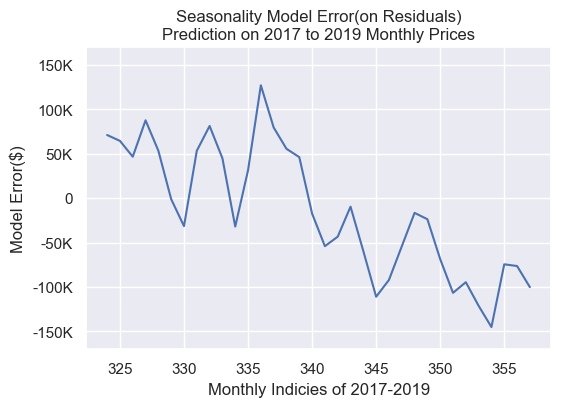

5281881569.456017
72676.554468797


In [71]:
cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

train_bay_part2 = df_bay_part2[df_bay_part2.Time.dt.year < cut_year].dropna(how='any')
test_bay_part2  = df_bay_part2[df_bay_part2.Time.dt.year >= cut_year].dropna(how='any')

regress = LinearRegression().fit( 
        X=train_bay_part2[['Residual_Exponential_Model', 'sin(3.67years)', 'cos(3.67years)', 'sin(year)', 'cos(year)','sin(2.75years)','cos(2.75years)','sin(0.5years)','cos(0.5years)','sin(5.5years)','cos(5.5years)']],
                           #,'sin(0.91years)','cos(0.91years)','sin(2.5years)','cos(2.5years)']], 
        y=train_bay_part2['Seasonality_Model_Goal'])

test_bay_part2['Predicted_Residual'] = regress.predict(X=test_bay_part2[['Residual_Exponential_Model', 'sin(3.67years)', 'cos(3.67years)', 'sin(year)', 'cos(year)','sin(2.75years)','cos(2.75years)','sin(0.5years)','cos(0.5years)','sin(5.5years)','cos(5.5years)']])
                           #,'sin(0.91years)','cos(0.91years)','sin(2.5years)','cos(2.5years)']])

(test_bay_part2['Seasonality_Model_Goal'] - test_bay_part2['Predicted_Residual']).plot()
plt.title('Seasonality Model Error(on Residuals)\nPrediction on 2017 to 2019 Monthly Prices')
plt.ylabel('Model Error($)')
plt.xlabel('Monthly Indicies of 2017-2019')
plt.ylim((-170000,170000))
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

print(mean_squared_error(test_bay_part2['Seasonality_Model_Goal'], test_bay_part2['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_bay_part2['Seasonality_Model_Goal'], test_bay_part2['Predicted_Residual'])))

## 3 - Adding Back Drift and Seasonality

Now let's put back drift and seasonality to compare the models with real data.

#### Example : 
    
For point 3 -> **Predicted value = exponential_model point 3 + seasonality_model (on residuals) of point 1** 

So the predicted residuals should be shifted (2 month forward (.shift(2)) 

In [72]:
# Shift Back the predicted residual to their times (2 months in advance)

test_bay_part2['Shifted_Back_Predicted_Residual'] = test_bay_part2['Predicted_Residual'].shift(2)

In [73]:
# Final Prediction 
test_bay_part2['Final_Predicted_Value'] = test_bay_part2['Bay Area'] + test_bay_part2['Shifted_Back_Predicted_Residual']

In [74]:
# Create 'Error' Column 
test_bay_part2['Error_Final'] = (test_bay_part2['Final_Predicted_Value'] / test_bay_part2['Bay Area'])-1

Let's check some columns:

In [75]:
test_bay_part2[['Time','Bay Area','Exponential_Model','Residual_Exponential_Model','Error_Exponential','Final_Predicted_Value','Error_Final']]

,Time,Bay Area,Exponential_Model,Residual_Exponential_Model,Error_Exponential,Final_Predicted_Value,Error_Final
324,2017-01-01,730200,8.027281e+05,-72528.113193,0.099326,NaN,NaN
325,2017-02-01,784470,8.094111e+05,-24941.054754,0.031794,NaN,NaN
326,2017-03-01,830000,8.154951e+05,14504.931243,-0.017476,7.733991e+05,-0.068194
327,2017-04-01,885000,8.222843e+05,62715.701118,-0.070865,8.832306e+05,-0.001999
328,2017-05-01,899730,8.289083e+05,70821.666479,-0.078714,9.238523e+05,0.026811
329,2017-06-01,950000,8.358092e+05,114190.767082,-0.120201,9.765373e+05,0.027934
330,2017-07-01,898880,8.425422e+05,56337.780306,-0.062676,9.018347e+05,0.003287
331,2017-08-01,856200,8.495566e+05,6643.374899,-0.007759,8.639770e+05,0.009083
332,2017-09-01,813520,8.566294e+05,-43109.427442,0.052991,8.019052e+05,-0.014277
333,2017-10-01,892720,8.635301e+05,29189.865579,-0.032698,8.685361e+05,-0.027090


In [76]:
# Comparing the Errors (Exponential Model vs )

print ('The mean and median error of Exponential Model: {} , {}'.format(np.mean(test_bay_part2['Error_Exponential']),np.median(test_bay_part2['Error_Exponential'])))
print ('The mean and median error of Whole Model (Exponential Model + Seasonal Adjusted): {} , {}'.format(np.mean(test_bay_part2['Error_Final']),np.nanmedian(test_bay_part2['Error_Final'])))

The mean and median error of Exponential Model: 0.016984383463796486 , 0.013632682838354171
The mean and median error of Whole Model (Exponential Model + Seasonal Adjusted): -0.002172068583058847 , 0.0006439107516897358


let's compare the predicted values with real values:

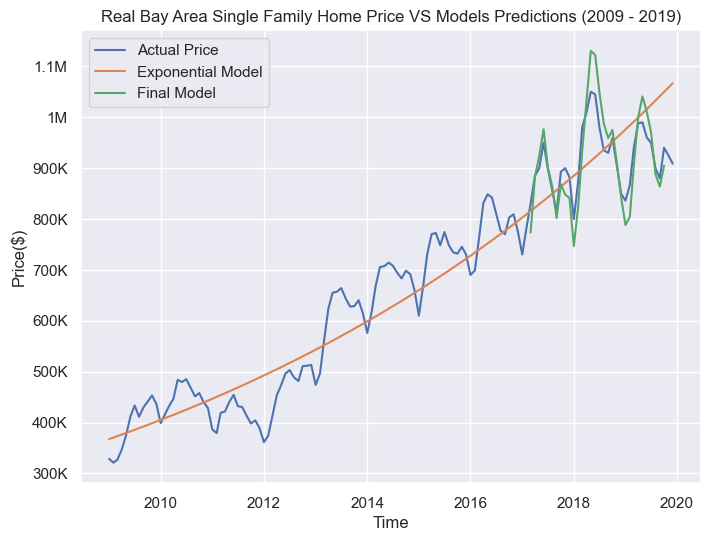

In [77]:
plt.figure(figsize=(8, 6))
plt.plot(df_bay_part2['Time'],df_bay_part2['Bay Area'])
plt.plot(df_bay_part2['Time'],df_bay_part2['Exponential_Model'])
plt.plot(test_bay_part2['Time'],test_bay_part2['Final_Predicted_Value'])
plt.legend(['Actual Price','Exponential Model','Final Model'])
plt.title('Real Bay Area Single Family Home Price VS Models Predictions (2009 - 2019)')
plt.xlabel('Time')
plt.ylabel('Price($)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()


In [78]:
## Final Model Error Summary

test_bay_part2['Error_Final'].describe()

count    32.000000
mean     -0.002172
std       0.044465
min      -0.072254
25%      -0.039634
50%       0.000644
75%       0.027091
max       0.076682
Name: Error_Final, dtype: float64

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


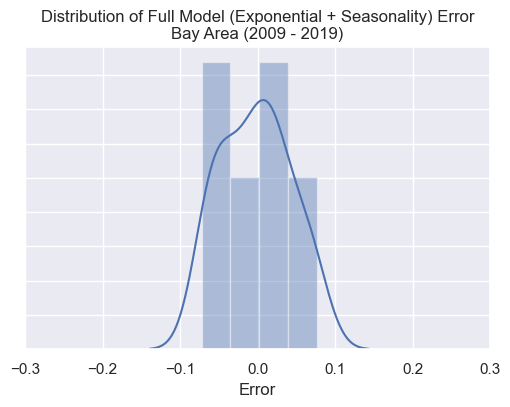

In [79]:
# Histogram of Exponential Model Error 

ax = sns.distplot(test_bay_part2['Error_Final'].dropna(), bins=None, hist=True, kde=True)
ax.set(yticklabels=[])
plt.xlabel('Error')
plt.xlim(-0.3,0.3)
plt.ylabel('')
plt.title('Distribution of Full Model (Exponential + Seasonality) Error\nBay Area (2009 - 2019)')
plt.show()

# <font color='red' size=6>Focus on Dissertation</font>


This dissertation has 3 major parts: 

# <font color='darkblue' size=5> 1 - Single Family Home Price Cycles Presence In Bay Area Across Value Groups </font>
# <font color='darkblue' size=5> 2 - Cycles Comparision Across Value Groups </font>
# <font color='darkblue' size=5> 3 - Macroeconomic Indicators Impact on Bay Area Single Family Home Price Across Value Groups </font>



<br>





<br>

# <font color='blue' size=5>Part One - Cycles Presence In Bay Area Across Value Groups</font>

The first step in this project is investigating the presence of cycle price in single family home price across value groups in the Bay Area. 

<font color=blue size=4 > Major Steps: </font> 




 
<font color='green' size=3 > Grouping Counties Based on Historical Data -> Separating The Whole Time Series Data in Two Parts (Before and After Financial Crisis) -> Split Each Value Group Average Price Index into Train and Test Dataset -> Train different Models on Drift Part (Exponential and Polynomial) -> Model The Seasonality Part (residual of drift part) Using FFT Algorithm on Train Part -> Make Full Model Prediction and Check the Error Distribution </font> 


<br>

First, let's find and group the counties with similar prices. 

In [80]:
df[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].describe()

,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma
count,3.600000e+02,168.000000,3.600000e+02,360.000000,3.600000e+02,3.480000e+02,3.600000e+02,311.000000,360.000000
mean,4.693146e+05,479310.261905,7.495341e+05,406668.466667,7.180662e+05,7.485242e+05,6.098078e+05,282439.472669,386120.005556
std,2.252906e+05,150761.048315,3.198139e+05,190086.782054,4.058476e+05,3.762580e+05,3.085105e+05,114455.183454,165138.311856
min,1.945280e+05,224620.000000,2.934780e+05,143000.000000,2.456340e+05,2.852560e+05,2.389940e+05,123182.000000,174022.000000
25%,2.340372e+05,317867.500000,3.838962e+05,206501.500000,2.997065e+05,4.092158e+05,3.219412e+05,187279.500000,201231.000000
50%,4.267065e+05,500000.000000,7.518400e+05,368516.000000,6.966725e+05,6.769000e+05,5.557220e+05,265090.000000,365481.000000
75%,6.587475e+05,621610.000000,9.800000e+05,599534.750000,9.225642e+05,9.121250e+05,7.885000e+05,387085.000000,531062.500000
max,1.025000e+06,702370.000000,1.450000e+06,787500.000000,1.762500e+06,1.770000e+06,1.454500e+06,492799.000000,712000.000000


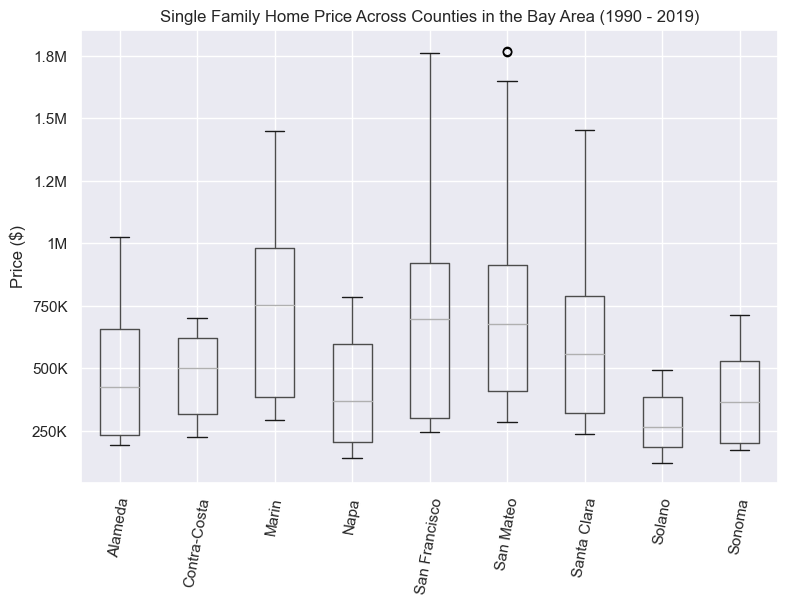

In [81]:
# Boxplot of Counties Single Family Home Price from 1990-2019 

plt.figure(figsize=(9,6))
df[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].boxplot()
plt.xticks(rotation=80)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area (1990 - 2019)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

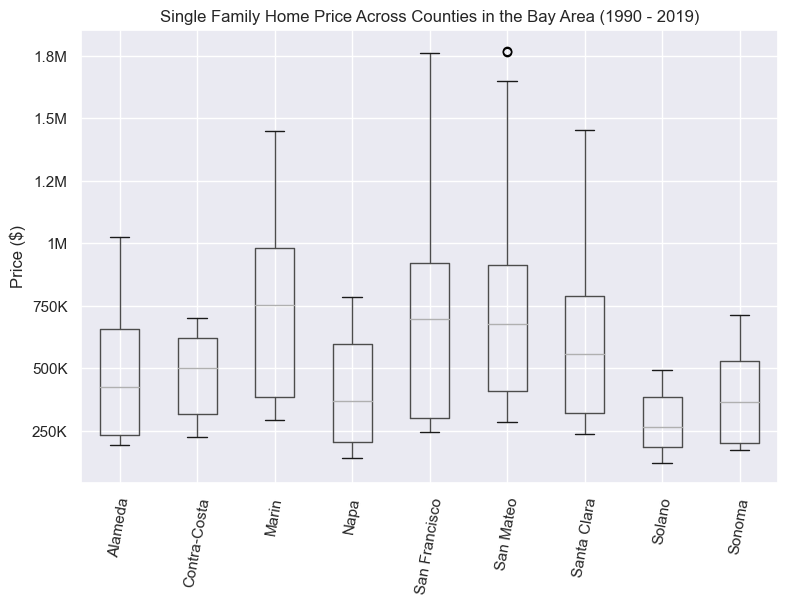

In [82]:
# Boxplot of Counties Single Family Home Price from 1990-2019 

plt.figure(figsize=(9,6))
df[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].boxplot()
plt.xticks(rotation=80)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area (1990 - 2019)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

Since we are going to check the cycles before and after the financial crisis separately, let's check their distribution separately:

In [83]:
### NOV 19 VERSION ----> CHANGED ANY TO ALL
### It will change the boxplots, so I made it all, but for boxplot used the any to have better comparision

# Separating the whole dateset to 2 groups (before and after the crisis)

cut_year_1 = 2007
cut_year_2 = 2009 
df_bfr_crisis = df[df['Time'].dt.year < cut_year_1 ].dropna(how='all')
df_aft_crisis = df[df['Time'].dt.year >= cut_year_2 ].dropna(how='all')

In [84]:
# Check the columns 
df_bfr_crisis.head(3)

,Time,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,Bay Area
0,1990-01-01,194952,226149,NaN,346153,178888,287499,NaN,271840,NaN,174022,227366
1,1990-02-01,196273,219306,NaN,338333,186363,300877,NaN,273100,NaN,180294,234739
2,1990-03-01,194856,225162,NaN,358571,180000,290151,NaN,275500,NaN,178823,235337


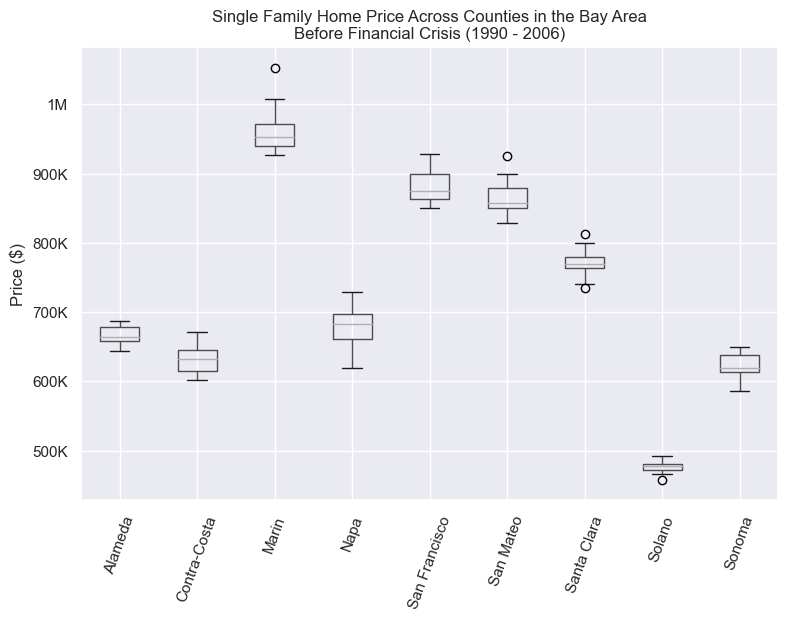

In [85]:
# Boxplot of Bay Area Single Family Home Across Counties - Before Financial Crisis (1990 - 2006)

plt.figure(figsize=(9,6))
df_bfr_crisis[['Alameda','Contra-Costa','Marin','Napa','San Francisco',
               'San Mateo','Santa Clara','Solano','Sonoma']].dropna().boxplot()
plt.xticks(rotation=70)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area\nBefore Financial Crisis (1990 - 2006)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

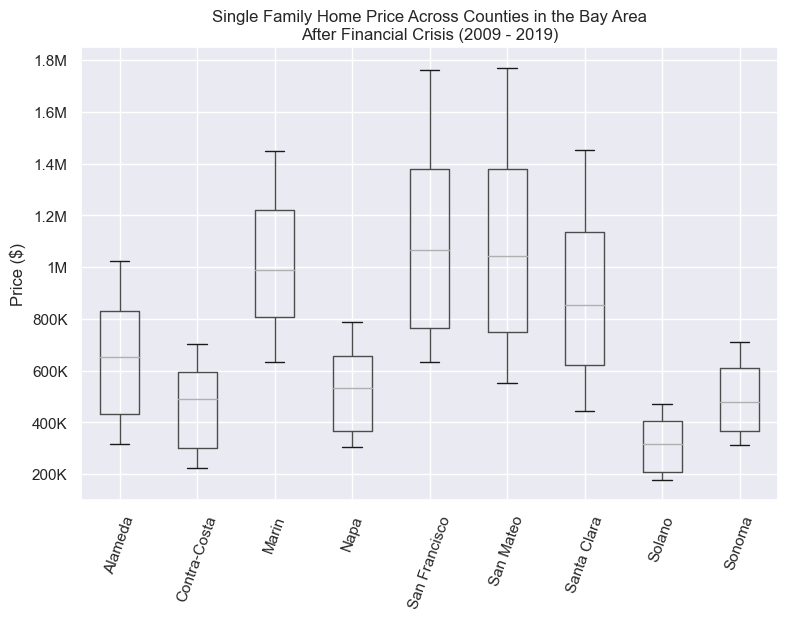

In [86]:
# Boxplot of Bay Area Single Family Home Across Counties - After Financial Crisis (2009 - 2019)

plt.figure(figsize=(9,6))
df_aft_crisis[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].dropna().boxplot()
plt.xticks(rotation=70)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area\nAfter Financial Crisis (2009 - 2019)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [87]:
df_bfr_crisis[['Time','Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].median()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  """Entry point for launching an IPython kernel.


Alameda          253846.0
Contra-Costa     631730.0
Marin            427083.0
Napa             217126.0
San Francisco    340128.0
San Mateo        449752.0
Santa Clara      355741.5
Solano           196490.0
Sonoma           220977.0
dtype: float64

Based on the above figures, for both before and after the financial crisis, my 3 groups are: 

- **Expensive** : Marin, San Francisco, San Mateo, Santa Clara
- **Medium** : Alameda , Contra-Costa, Napa, Sonoma 
- **Low** : Solano


** Low and Cheap are used interchangably through this piece.

But before making detasets, we need to add some columns and do data wrangling that we need through our project in advance: 

1 - Add two columns as  :

                    **Julian** and **Constant**
                   
2 - Add one column as :

                    **Average**  

In [88]:
# Add Julian column + Add Constant Column

df['Julian'] = df['Time'].apply(lambda x: x.to_julian_date() )
df = add_constant(df) 

In [89]:
# Make Separate Datasets for Value Classes

df_exp = df[['Time','Julian','Const','Marin','San Francisco','San Mateo','Santa Clara']].copy()
df_med = df[['Time','Julian','Const','Alameda','Contra-Costa','Napa','Sonoma']].copy()
df_che = df[['Time','Julian','Const','Solano']].copy()

In [90]:
# Add 'Average' Column

df_exp['Average'] = df_exp[['Marin','San Francisco','San Mateo','Santa Clara']].mean(axis=1) 
df_med['Average'] = df_med[['Alameda','Contra-Costa','Napa','Sonoma']].mean(axis=1) 
df_che['Average'] = df_che[['Solano']].mean(axis=1)

<br>

Let's plot all groups' average through time: (copy-delete)

<br>

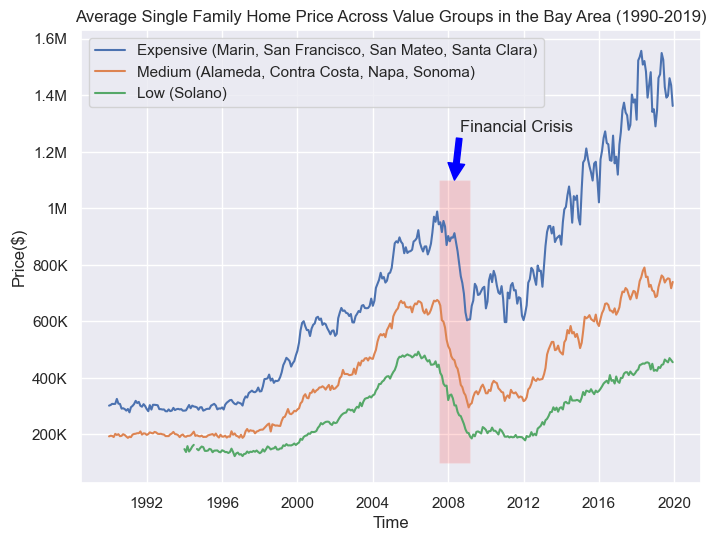

In [91]:
# Plotting Average House Price for 3 Value Groups 

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_exp['Time'], y = df_exp['Average'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_med['Time'], y = df_med['Average'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_che['Time'], y = df_che['Average'], label = 'Low (Solano)')
plt.title('Average Single Family Home Price Across Value Groups in the Bay Area (1990-2019)')
ax_1.fill_between([13700,14300], 100000, 1100000, facecolor='red', alpha = .15, interpolate=True)
plt.annotate(text='Financial Crisis', xy=(14000,1100000), xytext=(14100,1270000), arrowprops={'color':'blue','lw':1.01})
plt.xlabel('Time')
plt.ylabel('Price($)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

#print (ax_1.get_xlim())
#print (ax_1.get_ylim())

<br> 




 
<font size=4> As it's mentioned in the literature review the sudden incident like financial crisis may impact the real estate cycles, therefore it's better to separate the whole dataset of each value group into 2 groups (before and after the financial crisis) </font> 

<br>

In [92]:
# Make Separate Datasets for Before and After Financial Crisis

df_bfr_crisis_exp = df_exp[df_exp['Time'].dt.year < 2007 ].copy()
df_bfr_crisis_med = df_med[df_med['Time'].dt.year < 2007 ].copy()
df_bfr_crisis_che = df_che[df_che['Time'].dt.year < 2007 ].copy()

# -------------------------------- 

df_aft_crisis_exp = df_exp[df_exp['Time'].dt.year >= 2009 ].copy()
df_aft_crisis_med = df_med[df_med['Time'].dt.year >= 2009 ].copy()
df_aft_crisis_che = df_che[df_che['Time'].dt.year >= 2009 ].copy()

Since part of this project is studying the correlation of the single-family home with various macroeconomic indicators, it would be better to use **'House Price Index'** instead of the actual price. The house price in **January 1990** would be the base price for before the financial crisis part and the house price in **January 2009** would be the base price for after the financial crisis part and price index for any point of time would be measured compared to that time for any value group. 

In [93]:
# Creating 'House Price Index' for each value group

# Before Financial Crisis

df_bfr_crisis_exp['Price Index'] = df_bfr_crisis_exp['Average'].apply(lambda x : x*100/df_bfr_crisis_exp['Average'].iloc[0])
df_bfr_crisis_med['Price Index'] = df_bfr_crisis_med['Average'].apply(lambda x : x*100/df_bfr_crisis_med['Average'].iloc[0])
df_bfr_crisis_che['Price Index'] = df_bfr_crisis_che['Average'].apply(lambda x : x*100/df_bfr_crisis_che['Average'].iloc[48])
# Cheap group has its first number in row 48


# After Financial Crisis

df_aft_crisis_exp['Price Index'] = df_aft_crisis_exp['Average'].apply(lambda x : x*100/df_aft_crisis_exp['Average'].iloc[0])
df_aft_crisis_med['Price Index'] = df_aft_crisis_med['Average'].apply(lambda x : x*100/df_aft_crisis_med['Average'].iloc[0])
df_aft_crisis_che['Price Index'] = df_aft_crisis_che['Average'].apply(lambda x : x*100/df_aft_crisis_che['Average'].iloc[0])

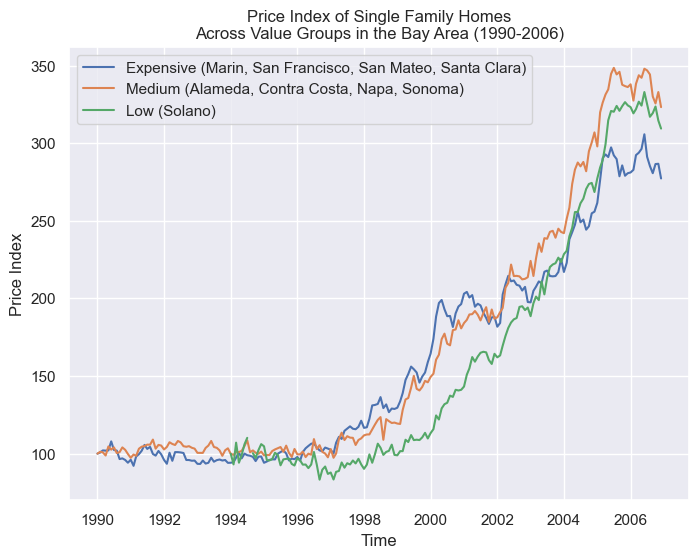

In [94]:
# Visualization of Price Index for 3 Value Groups - Before the Financial Crisis (1990 - 2006)

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'], label = 'Low (Solano)')
plt.title('Price Index of Single Family Homes\nAcross Value Groups in the Bay Area (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

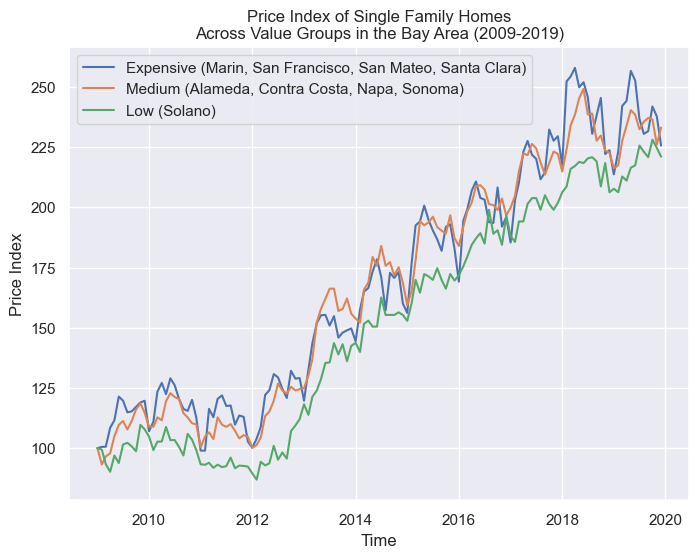

In [95]:
# Visualization of House Price Index for 3 Value Groups - After the Financial Crisis (2009 - 2019)

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'], label = 'Low (Solano)')
plt.title('Price Index of Single Family Homes\nAcross Value Groups in the Bay Area (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

Now it's time to check the presence of cycles price in each value class. In this regard, for each value group - for both before and after the financial crisis - I'll separate the time-series dataset into **Test** and **Training** parts, train both drift and seasonality parts and then predict the test part and compare the test error with real value. 

<br>

<font color='blue' size=5> Before Financial Crisis (1990-2006) </font> 

</br>

## A - Modeling the Drift (Exponential Model & Polynomial Model)

<br>

<font color='green' size=4> Exponential Model </font> 

</br>

### 1 - Cheap Class

In [96]:
train_bfr_crisis_che = df_bfr_crisis_che[df_bfr_crisis_che.Time.dt.year < cut_year].dropna(how='all')
test_bfr_crisis_che = df_bfr_crisis_che[df_bfr_crisis_che.Time.dt.year >= cut_year].dropna(how='all')

In [97]:
train_bfr_crisis_che.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204 entries, 0 to 203
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time         204 non-null    datetime64[ns]
 1   Julian       204 non-null    float64       
 2   Const        204 non-null    float64       
 3   Solano       155 non-null    float64       
 4   Average      155 non-null    float64       
 5   Price Index  155 non-null    float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 11.2 KB


In [98]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

train_bfr_crisis_che = df_bfr_crisis_che[df_bfr_crisis_che.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_bfr_crisis_che = df_bfr_crisis_che[df_bfr_crisis_che.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_bfr_crisis_che = Ridge().fit( 
    X=train_bfr_crisis_che[['Julian', 'Const']], 
    y=np.log(train_bfr_crisis_che['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_bfr_crisis_che['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_che.predict(train_bfr_crisis_che[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_bfr_crisis_che['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_che.predict(test_bfr_crisis_che[['Julian', 'Const']]))
test_bfr_crisis_che['Error_Exponential'] = (test_bfr_crisis_che['Exponential_Model'] / test_bfr_crisis_che['Price Index'])-1



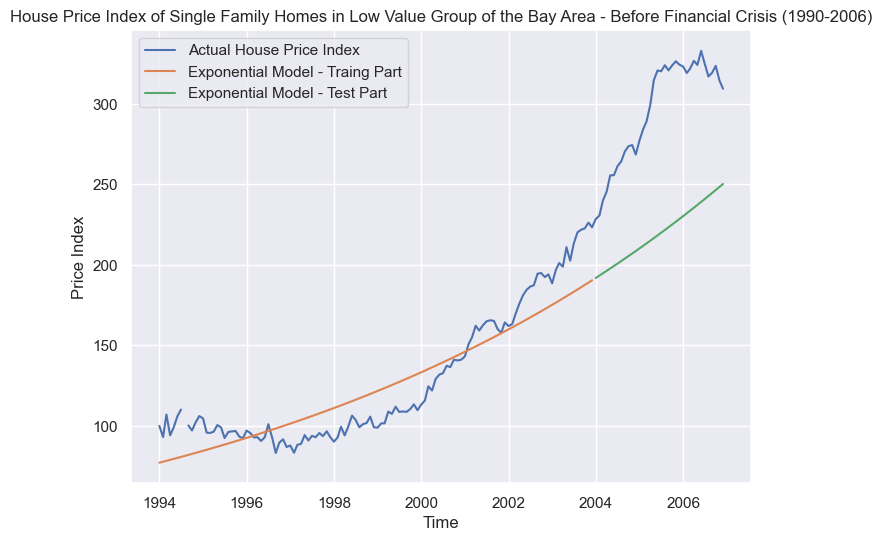

In [99]:
# Plotting the Exponential Model - Cheap Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'])
sns.lineplot(x = train_bfr_crisis_che['Time'], y = train_bfr_crisis_che['Exponential_Model'])
sns.lineplot(x = test_bfr_crisis_che['Time'], y = test_bfr_crisis_che['Exponential_Model'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

6131.466508004632
78.30368131834308


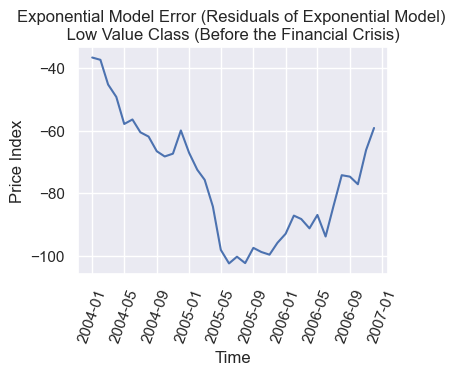

In [100]:
# Exponential Model Error - Cheap Class 

print(mean_squared_error(test_bfr_crisis_che['Price Index'], test_bfr_crisis_che['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_che['Price Index'], test_bfr_crisis_che['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_bfr_crisis_che['Time'], y = test_bfr_crisis_che['Exponential_Model'] - test_bfr_crisis_che['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Low Value Class (Before the Financial Crisis) ')
plt.show()

### 2 - Medium Class

In [101]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

train_bfr_crisis_med = df_bfr_crisis_med[df_bfr_crisis_med.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_bfr_crisis_med = df_bfr_crisis_med[df_bfr_crisis_med.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_bfr_crisis_med = Ridge().fit( 
    X=train_bfr_crisis_med[['Julian', 'Const']], 
    y=np.log(train_bfr_crisis_med['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_bfr_crisis_med['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_med.predict(train_bfr_crisis_med[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_bfr_crisis_med['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_med.predict(test_bfr_crisis_med[['Julian', 'Const']]))
test_bfr_crisis_med['Error_Exponential'] = (test_bfr_crisis_med['Exponential_Model'] / test_bfr_crisis_med['Price Index'])-1




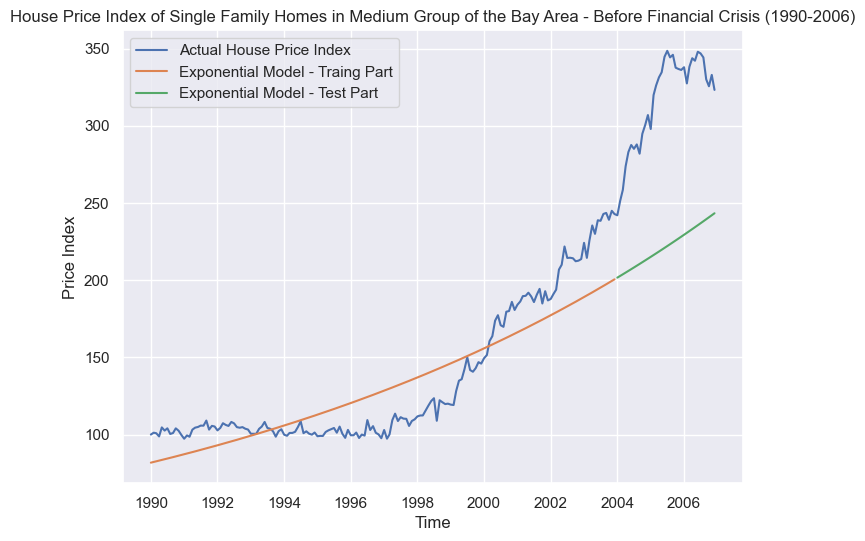

In [102]:
# Plotting the Exponential Model - Medium Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'])
sns.lineplot(x = train_bfr_crisis_med['Time'], y = train_bfr_crisis_med['Exponential_Model'])
sns.lineplot(x = test_bfr_crisis_med['Time'], y = test_bfr_crisis_med['Exponential_Model'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

9426.926889273063
97.0923626722157


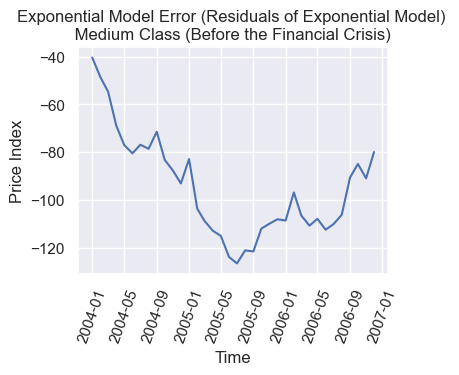

In [103]:
# Exponential Model Error - Medium Class 

print(mean_squared_error(test_bfr_crisis_med['Price Index'], test_bfr_crisis_med['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_med['Price Index'], test_bfr_crisis_med['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_bfr_crisis_med['Time'], y = test_bfr_crisis_med['Exponential_Model'] - test_bfr_crisis_med['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Medium Class (Before the Financial Crisis) ')
plt.show()

### 3 - Expensive Class

In [104]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

train_bfr_crisis_exp = df_bfr_crisis_exp[df_bfr_crisis_exp.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_bfr_crisis_exp = df_bfr_crisis_exp[df_bfr_crisis_exp.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_bfr_crisis_exp = Ridge().fit( 
    X=train_bfr_crisis_exp[['Julian', 'Const']], 
    y=np.log(train_bfr_crisis_exp['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_bfr_crisis_exp['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_exp.predict(train_bfr_crisis_exp[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_bfr_crisis_exp['Exponential_Model'] = np.exp(exponential_model_bfr_crisis_exp.predict(test_bfr_crisis_exp[['Julian', 'Const']]))
test_bfr_crisis_exp['Error_Exponential'] = (test_bfr_crisis_exp['Exponential_Model'] / test_bfr_crisis_exp['Price Index'])-1



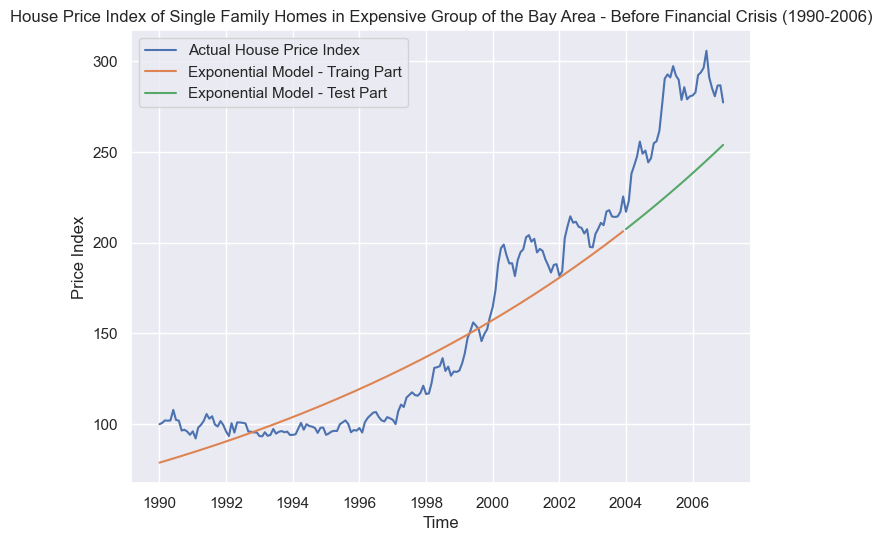

In [105]:
# Plotting the Exponential Model - Expensive Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'])
sns.lineplot(x = train_bfr_crisis_exp['Time'], y = train_bfr_crisis_exp['Exponential_Model'])
sns.lineplot(x = test_bfr_crisis_exp['Time'], y = test_bfr_crisis_exp['Exponential_Model'])


plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

1988.9384008236177
44.59751563510705


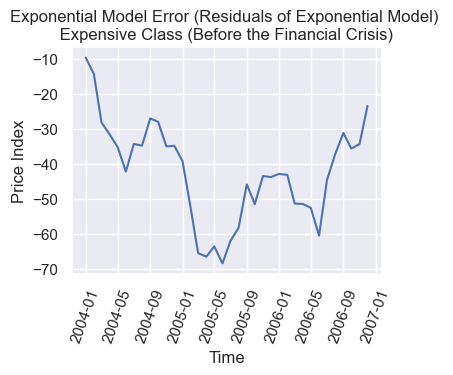

In [106]:
# Exponential Model Error - Expensive Class 

print(mean_squared_error(test_bfr_crisis_exp['Price Index'], test_bfr_crisis_exp['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_exp['Price Index'], test_bfr_crisis_exp['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_bfr_crisis_exp['Time'], y = test_bfr_crisis_exp['Exponential_Model'] - test_bfr_crisis_exp['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Expensive Class (Before the Financial Crisis) ')
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

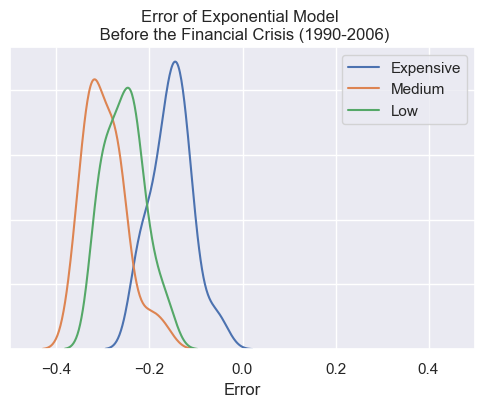

In [107]:
# Histogram of Exponential Model Error Across Value Groups 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_bfr_crisis_exp['Error_Exponential'], bins=None, hist=False, kde=True, label='Expensive')
ax_2 = sns.distplot(test_bfr_crisis_med['Error_Exponential'], bins=None, hist=False, kde=True, label='Medium')
ax_3 = sns.distplot(test_bfr_crisis_che['Error_Exponential'], bins=None, hist=False, kde=True, label='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend()
plt.title('Error of Exponential Model \n Before the Financial Crisis (1990-2006)')
plt.show()

Let's check the Error Distribution of the Exponential Model on the drift part. I will compare this later with a polynomial model to see which model (Exponential or Polynomial) fits better on the drift part.

In [108]:
print (test_bfr_crisis_exp['Error_Exponential'].describe())

count    36.000000
mean     -0.152685
std       0.044050
min      -0.230130
25%      -0.177992
50%      -0.152296
75%      -0.128498
max      -0.043809
Name: Error_Exponential, dtype: float64


As you would see in the above figure the **Exponential model** does not fit very well on real house price index. 

So in the next I would try the **Polynomial Model**. 

<br>

<font color='green' size=4> Polynomial Model </font> 

</br>

In [109]:
## This cell is have visualization purpose - for modify the xticks labels.

# Function to revise the xticks from julian type to datetime in graphs
def jul_to_time(jul):
    date_tuple = jd2gcal((jul - 51544.5), 51544.5)
    date_out = datetime(date_tuple[0], date_tuple[1], date_tuple[2])
    return (date_out)

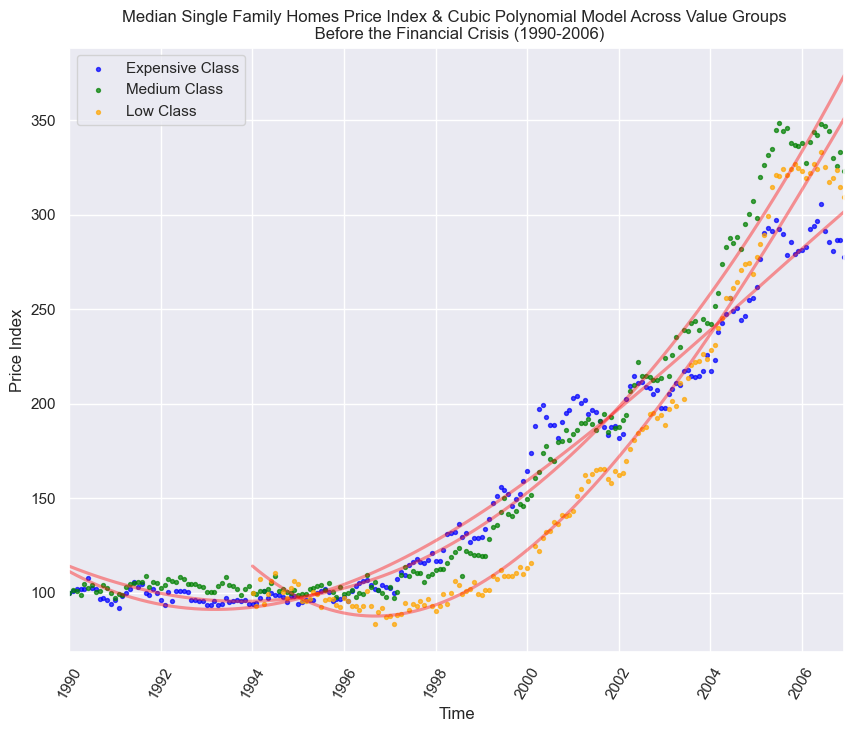

In [110]:
# Polynomial On price index - The whole dataset 

plt.figure(figsize=(10, 8))
ax_1 = sns.regplot(y='Price Index' , x='Julian', data=df_bfr_crisis_exp, order=3,scatter_kws={"color": "blue","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Expensive Class')
ax_2 = sns.regplot(y='Price Index' , x='Julian', data=df_bfr_crisis_med, order=3,scatter_kws={"color": "green","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Medium Class')
ax_3 = sns.regplot(y='Price Index' , x='Julian', data=df_bfr_crisis_che, order=3,scatter_kws={"color": "orange","alpha":0.7,'s':8}, ci=0,  line_kws={"color": "red","alpha":0.4},truncate=True,label='Low Class')
#plt.xlim([2447892.5,2454070.5])
#plt.ylim([0,1000000])
plt.xticks(np.arange(2447892.5,2454070.5, step = 365*2),  labels = np.arange(1990,2008,step=2),rotation=60)
plt.ylabel('Price Index')
plt.xlabel('Time')
ax_1.legend()
ax_2.legend()
ax_3.legend()
plt.title('Median Single Family Homes Price Index & Cubic Polynomial Model Across Value Groups \n Before the Financial Crisis (1990-2006)')
plt.show()

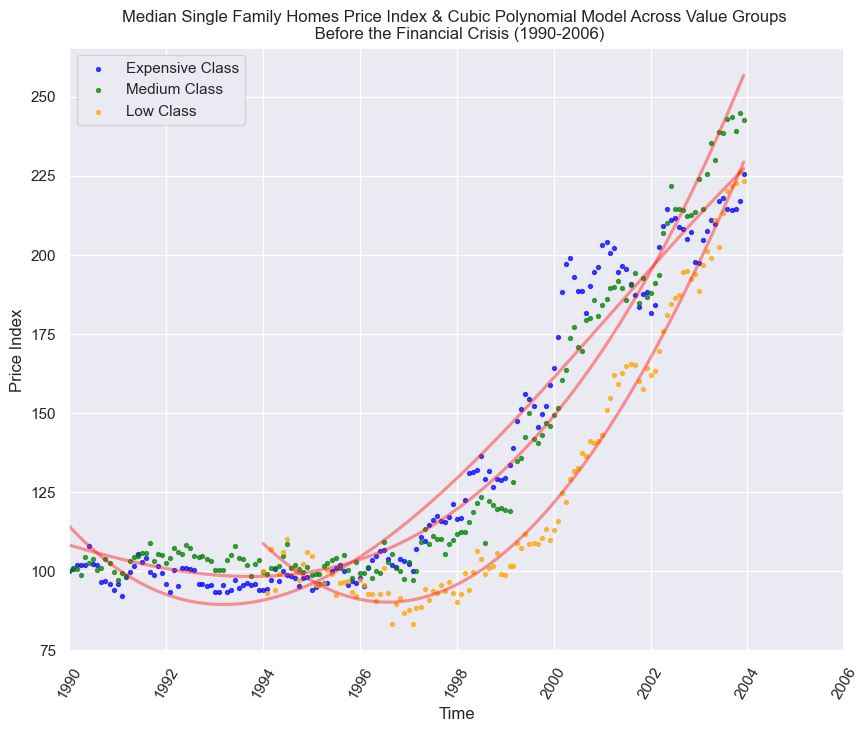

In [111]:
# Polynomial On price index - The training dataset 


plt.figure(figsize=(10, 8))
ax_1 = sns.regplot(y='Price Index' , x='Julian', data=train_bfr_crisis_exp, order=3,scatter_kws={"color": "blue","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Expensive Class')
ax_2 = sns.regplot(y='Price Index' , x='Julian', data=train_bfr_crisis_med, order=3,scatter_kws={"color": "green","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Medium Class')
ax_3 = sns.regplot(y='Price Index' , x='Julian', data=train_bfr_crisis_che, order=3,scatter_kws={"color": "orange","alpha":0.7,'s':8}, ci=0,  line_kws={"color": "red","alpha":0.4},truncate=True,label='Low Class')
#plt.xlim([2447892.5,2454070.5])
#plt.ylim([0,1000000])
plt.xticks(np.arange(2447892.5,2454070.5, step = 365*2),  labels = np.arange(1990,2008,step=2),rotation=60)
plt.ylabel('Price Index')
plt.xlabel('Time')
ax_1.legend()
ax_2.legend()
ax_3.legend()
plt.title('Median Single Family Homes Price Index & Cubic Polynomial Model Across Value Groups \n Before the Financial Crisis (1990-2006)')
plt.show()

Now, let's fit the **Cubic Polynomial** model on 3 value groups (Expensive, Medium, Cheap): 

### 1 - Cheap Class

In [112]:
# 'Cheap Class' before the financial crisis (1990 - 2006)
c, stats = polynomial.polyfit(train_bfr_crisis_che['Julian'],train_bfr_crisis_che['Price Index'],3,full=True)
train_bfr_crisis_che['Poly_Model'] = train_bfr_crisis_che['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_bfr_crisis_che['Error_Poly'] = (train_bfr_crisis_che['Poly_Model']/train_bfr_crisis_che['Price Index']) - 1 
test_bfr_crisis_che['Poly_Model'] = test_bfr_crisis_che['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_bfr_crisis_che['Error_Poly'] = (test_bfr_crisis_che['Poly_Model']/test_bfr_crisis_che['Price Index']) - 1

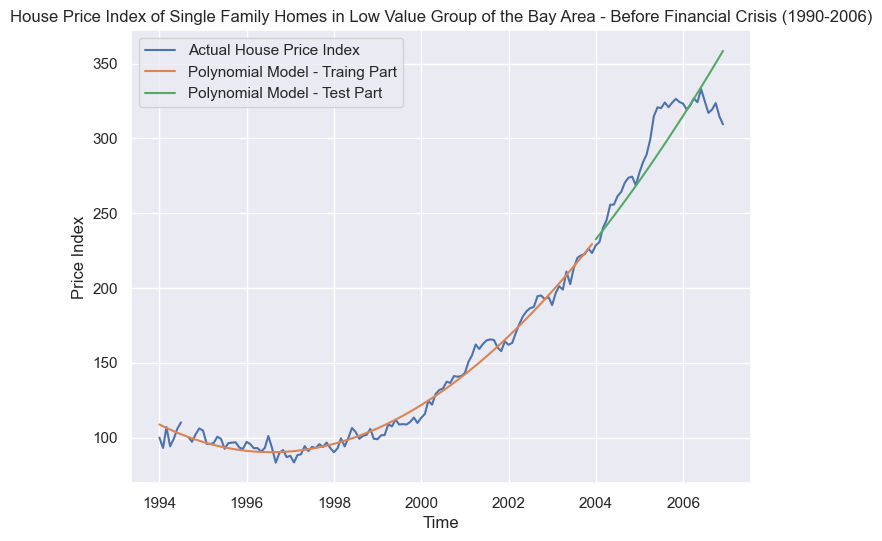

In [113]:
# Plotting the Polynomial Model - Cheap Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'])
sns.lineplot(x = train_bfr_crisis_che['Time'], y = train_bfr_crisis_che['Poly_Model'])
sns.lineplot(x = test_bfr_crisis_che['Time'], y = test_bfr_crisis_che['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

### 2 - Medium Class

In [114]:
# 'Medium Class' before the financial crisis (1990 - 2006)
c, stats = polynomial.polyfit(train_bfr_crisis_med['Julian'],train_bfr_crisis_med['Price Index'],3,full=True)
train_bfr_crisis_med['Poly_Model'] = train_bfr_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_bfr_crisis_med['Error_Poly'] = (train_bfr_crisis_med['Poly_Model']/train_bfr_crisis_med['Price Index']) - 1 
test_bfr_crisis_med['Poly_Model'] = test_bfr_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_bfr_crisis_med['Error_Poly'] = (test_bfr_crisis_med['Poly_Model']/test_bfr_crisis_med['Price Index']) - 1 

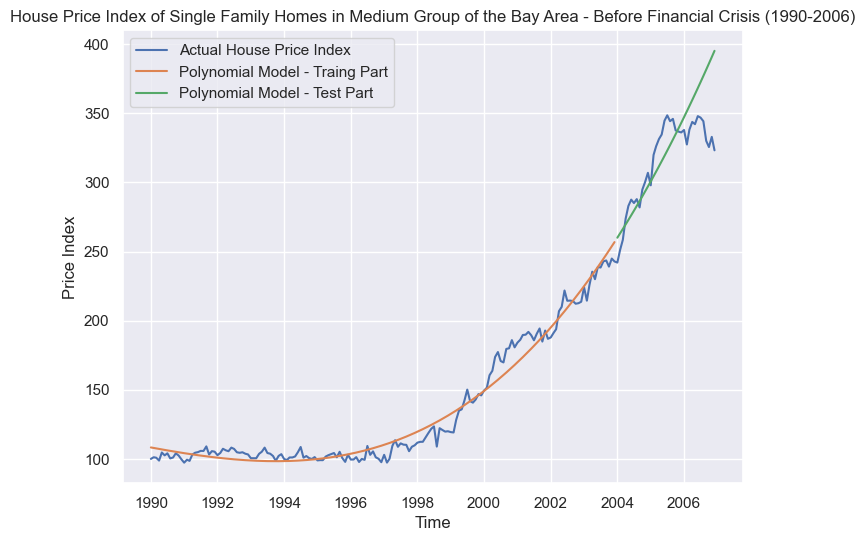

In [115]:
# Plotting the Polynomial Model - Medium Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'])
sns.lineplot(x = train_bfr_crisis_med['Time'], y = train_bfr_crisis_med['Poly_Model'])
sns.lineplot(x = test_bfr_crisis_med['Time'], y = test_bfr_crisis_med['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

### 3 - Expensive Class

In [116]:
# 'Expensive Class' before the financial crisis (1990 - 2006)
c, stats = polynomial.polyfit(train_bfr_crisis_exp['Julian'],train_bfr_crisis_exp['Price Index'],3,full=True)
train_bfr_crisis_exp['Poly_Model'] = train_bfr_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_bfr_crisis_exp['Error_Poly'] = (train_bfr_crisis_exp['Poly_Model']/train_bfr_crisis_exp['Price Index']) - 1 
test_bfr_crisis_exp['Poly_Model'] = test_bfr_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_bfr_crisis_exp['Error_Poly'] = (test_bfr_crisis_exp['Poly_Model']/test_bfr_crisis_exp['Price Index']) - 1

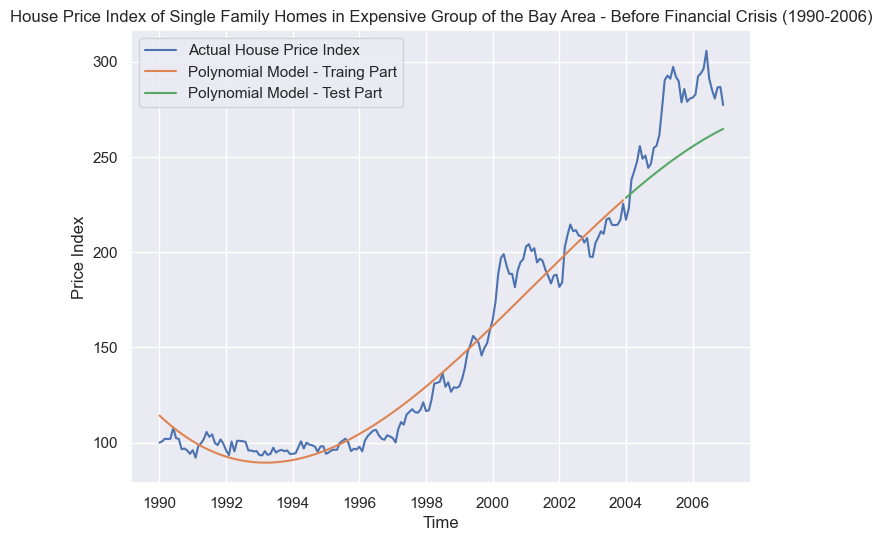

In [117]:
# Plotting the Polynomial Model - Expensive Class Before Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'])
sns.lineplot(x = train_bfr_crisis_exp['Time'], y = train_bfr_crisis_exp['Poly_Model'])
sns.lineplot(x = test_bfr_crisis_exp['Time'], y = test_bfr_crisis_exp['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

In [118]:
print (train_bfr_crisis_exp['Error_Poly'].describe())
print (test_bfr_crisis_exp['Error_Poly'].describe())

count    168.000000
mean       0.003811
std        0.069253
min       -0.161226
25%       -0.052925
50%        0.010023
75%        0.061218
max        0.169052
Name: Error_Poly, dtype: float64
count    36.000000
mean     -0.084552
std       0.050555
min      -0.164069
25%      -0.120054
50%      -0.086893
75%      -0.054388
max       0.053207
Name: Error_Poly, dtype: float64


/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

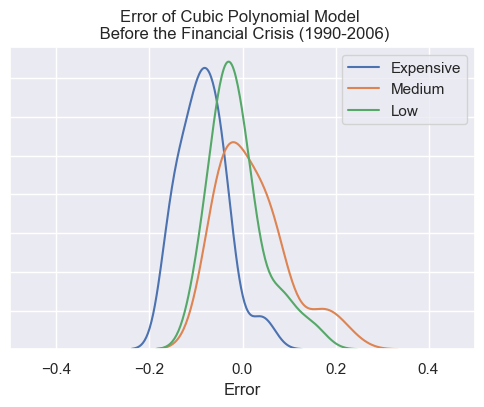

In [119]:
# Histogram of Polynomial Model Error Across Value Groups 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_bfr_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Expensive')
ax_2 = sns.distplot(test_bfr_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Medium')
ax_3 = sns.distplot(test_bfr_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend()
plt.title('Error of Cubic Polynomial Model \n Before the Financial Crisis (1990-2006)')
plt.show()

<br>

Now it's time to compare Exponential and Polynomial Model Errors. 


<br>

In [120]:
# Comparing Errors of Polynomial Vs Exponential Model on drift part 

# 1 - Expensive Class
print (test_bfr_crisis_exp['Error_Exponential'].describe())
print (test_bfr_crisis_exp['Error_Poly'].describe())

# 2 - Medium Class
print (test_bfr_crisis_med['Error_Exponential'].describe())
print (test_bfr_crisis_med['Error_Poly'].describe())

# 3 - Cheap Class
print (test_bfr_crisis_che['Error_Exponential'].describe())
print (test_bfr_crisis_che['Error_Poly'].describe())

count    36.000000
mean     -0.152685
std       0.044050
min      -0.230130
25%      -0.177992
50%      -0.152296
75%      -0.128498
max      -0.043809
Name: Error_Exponential, dtype: float64
count    36.000000
mean     -0.084552
std       0.050555
min      -0.164069
25%      -0.120054
50%      -0.086893
75%      -0.054388
max       0.053207
Name: Error_Poly, dtype: float64
count    36.000000
mean     -0.295654
std       0.045523
min      -0.362857
25%      -0.324471
50%      -0.305672
75%      -0.272648
max      -0.166890
Name: Error_Exponential, dtype: float64
count    36.000000
mean      0.021167
std       0.075153
min      -0.073818
25%      -0.036674
50%       0.008038
75%       0.059552
max       0.222608
Name: Error_Poly, dtype: float64
count    36.000000
mean     -0.253528
std       0.042818
min      -0.319383
25%      -0.283252
50%      -0.252095
75%      -0.230211
max      -0.160112
Name: Error_Exponential, dtype: float64
count    36.000000
mean     -0.011449
std       0.0592

As you would see, the polynomial model's average test error is much lower than the test error of the exponential model across all value groups. So I am going to use the polynomial model to get the residuals from the actual value. In the next part, I am going to model seasonality using the residuals. 

## B - Modeling Seasonality

### 1 - Cheap Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


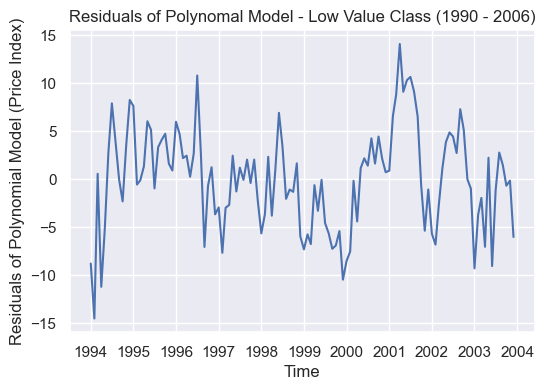

In [121]:
## Add new column as 'residual_poly_model' to both train and test set and visualzie it:

train_bfr_crisis_che['Residual_Poly_Model'] = train_bfr_crisis_che['Price Index'] - train_bfr_crisis_che['Poly_Model']
test_bfr_crisis_che['Residual_Poly_Model'] = test_bfr_crisis_che['Price Index'] - test_bfr_crisis_che['Poly_Model']

## Visualize the residual of the Cubic Polynomial drift: 

ax = sns.lineplot(train_bfr_crisis_che['Time'],train_bfr_crisis_che['Residual_Poly_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Polynomial Model (Price Index)')
plt.title('Residuals of Polynomal Model - Low Value Class (1990 - 2006)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 10 years (168->120 timestamps=months)')

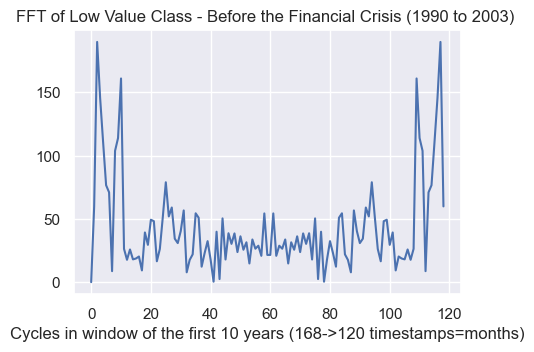

In [122]:
# Let's check the output of Fast Fourier Transform of Cheap Class median price

fft_train_bfr_crisis_che = fftpack.fft(train_bfr_crisis_che['Residual_Poly_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_bfr_crisis_che))
plt.title('FFT of Low Value Class - Before the Financial Crisis (1990 to 2003) ')
plt.xlabel('Cycles in window of the first 10 years (168->120 timestamps=months)')

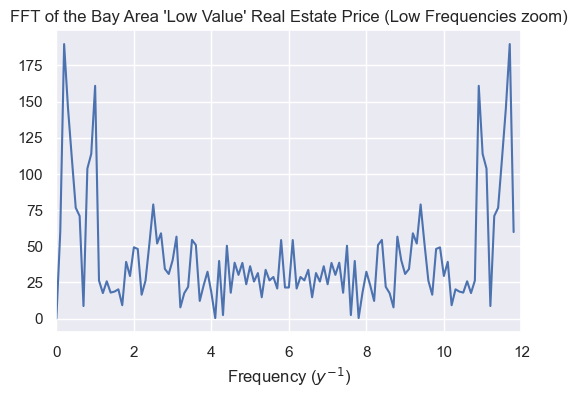

In [123]:
plt.figure(figsize = (6,4))
plt.plot(1./10*np.arange(len(fft_train_bfr_crisis_che)), np.abs(fft_train_bfr_crisis_che)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Low Value' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

<br> 

Let's zoom in: 

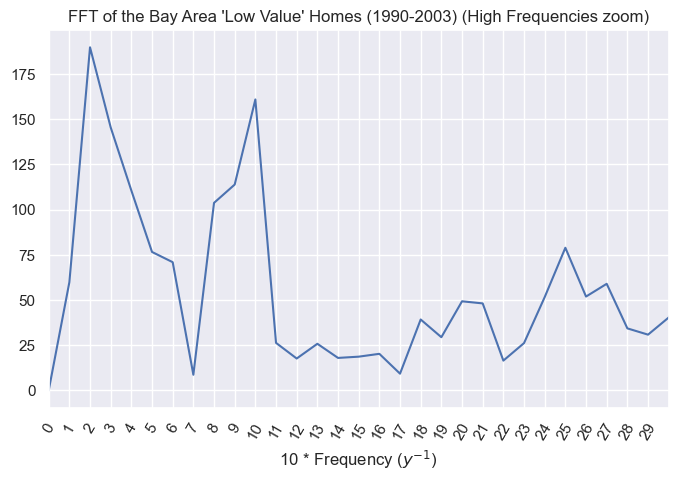

In [124]:
# Zoom in figure of FFT Bay Area (1990 - 2006--> 2003)
monthly_cycles_in_10_years = 10*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./10),rotation=60, labels=np.arange(0,30))
plt.plot(1./10 * np.arange(len(fft_train_bfr_crisis_che)), np.abs(fft_train_bfr_crisis_che))
plt.title("FFT of the Bay Area 'Low Value' Homes (1990-2003) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('10 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **10** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 2), so it is basically: 

**2/10 = 1/Year -> Year = 10/2 = 5 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Cheap Class Bay Area - 1990 to 2003)

In [125]:
# FFt output is complex number, we just need the real part

fft_train_bfr_crisis_abs_che = np.abs(fft_train_bfr_crisis_che)
train_bfr_crisis_cycles_che = pd.DataFrame(data=fft_train_bfr_crisis_abs_che, columns=['FFT Absolute Value'])

In [126]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (120/2 = 60)

train_bfr_crisis_cycles_che.iloc[:84].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
2,189.776605
10,160.915967
3,145.472802
9,113.868426
4,110.556237
8,103.741424
25,78.916727
5,76.592781
6,70.941620
1,59.854418


So based on the above figure and table,  I separated the top 7 periods that have relatively high FFT Absolute Value ***(indices: 2, 10, 3, 9, 4, 8, 25)***. 

Here are the 7 biggest periods of our **Cheap Class Before the Financial Crisis (1990-2003)**: 

In [127]:
train_bfr_crisis_cycles_che_top = train_bfr_crisis_cycles_che.iloc[:60].sort_values(by='FFT Absolute Value', ascending=False).iloc[:7]
train_bfr_crisis_cycles_che_top['Cycle(year)'] = train_bfr_crisis_cycles_che_top.index.map(lambda x : 10./x)
print (train_bfr_crisis_cycles_che_top)

    FFT Absolute Value  Cycle(year)
2           189.776605     5.000000
10          160.915967     1.000000
3           145.472802     3.333333
9           113.868426     1.111111
4           110.556237     2.500000
8           103.741424     1.250000
25           78.916727     0.400000


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **: 5 , 1 , 3.33 , 1.11 , 2.5 , 1.25 , 0.4  years**.

In [128]:
# 5 years -> (should I change 365.25 * 5 since, it is night the same thing as 5 years)
train_bfr_crisis_che['sin(5years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*5) * 2 * np.pi)
train_bfr_crisis_che['cos(5years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*5) * 2 * np.pi)

# 1 years 
train_bfr_crisis_che['sin(1years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*1) * 2 * np.pi)
train_bfr_crisis_che['cos(1years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*1) * 2 * np.pi)

# 3.33 years 
train_bfr_crisis_che['sin(3.33years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*3.33) * 2 * np.pi)
train_bfr_crisis_che['cos(3.33years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*3.33) * 2 * np.pi)

# 1.11 year
train_bfr_crisis_che['sin(1.11years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*1.11) * 2 * np.pi)
train_bfr_crisis_che['cos(1.11years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*1.11) * 2 * np.pi)

# 2.5 years 
train_bfr_crisis_che['sin(2.5years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*2.5) * 2 * np.pi)
train_bfr_crisis_che['cos(2.5years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*2.5) * 2 * np.pi)

# 1.25 years 
train_bfr_crisis_che['sin(1.25years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*1.25) * 2 * np.pi)
train_bfr_crisis_che['cos(1.25years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*1.25) * 2 * np.pi)

# 0.4 years 
train_bfr_crisis_che['sin(0.4years)'] = np.sin(train_bfr_crisis_che['Julian']/(365.25*0.4) * 2 * np.pi)
train_bfr_crisis_che['cos(0.4years)'] = np.cos(train_bfr_crisis_che['Julian']/(365.25*0.4) * 2 * np.pi)

Add these columns to test dataset: 

In [129]:
# 5 years -> (should I change 365.25 * 5 since, it is night the same thing as 5 years)
test_bfr_crisis_che['sin(5years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*5) * 2 * np.pi)
test_bfr_crisis_che['cos(5years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*5) * 2 * np.pi)

# 1 years 
test_bfr_crisis_che['sin(1years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*1) * 2 * np.pi)
test_bfr_crisis_che['cos(1years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*1) * 2 * np.pi)

# 3.33 years 
test_bfr_crisis_che['sin(3.33years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*3.33) * 2 * np.pi)
test_bfr_crisis_che['cos(3.33years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*3.33) * 2 * np.pi)

# 1.11 year
test_bfr_crisis_che['sin(1.11years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*1.11) * 2 * np.pi)
test_bfr_crisis_che['cos(1.11years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*1.11) * 2 * np.pi)

# 2.5 years 
test_bfr_crisis_che['sin(2.5years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*2.5) * 2 * np.pi)
test_bfr_crisis_che['cos(2.5years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*2.5) * 2 * np.pi)

# 1.25 years 
test_bfr_crisis_che['sin(1.25years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*1.25) * 2 * np.pi)
test_bfr_crisis_che['cos(1.25years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*1.25) * 2 * np.pi)

# 0.4 years 
test_bfr_crisis_che['sin(0.4years)'] = np.sin(test_bfr_crisis_che['Julian']/(365.25*0.4) * 2 * np.pi)
test_bfr_crisis_che['cos(0.4years)'] = np.cos(test_bfr_crisis_che['Julian']/(365.25*0.4) * 2 * np.pi)

### There are two ways to do the next part which is about Price Index Prediction for Test Part:

Now that we found the duration and amplitude of the cycle, we can approach in two ways.

1 - Just use sin and cos of 7 top cycles and fit the regression model on the residual of polynomial from real value. (**Without Noise Correction**)

2 - Fit the sin and cos of 7 top cycles and the noise (residual) of the current time to predict the noise of the two months ahead. (**With Noise Correction - more accurate**) 

#### Method 1:  Full Model Without Noise Correction

In method 1, for all parts of the model (exponential, polynomial, and seasonality) the data of the training set (1990 to 2003) is just used to fit the model and then calculate the target value in the test part using fitted model features.

For training part fitting process the input and output (target value) are :


 - Input :  Seasonality Features 

 - Output : Polynomial Residual 

301.2443665489989
17.356392670972816


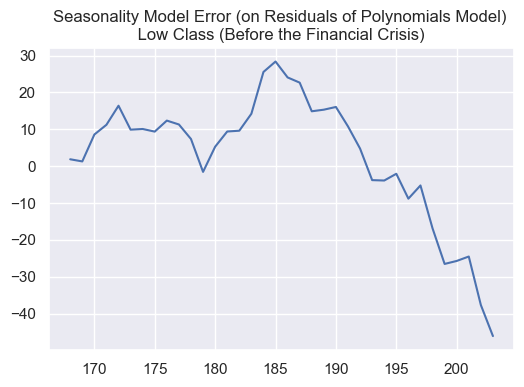

In [130]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

regress = LinearRegression().fit( 
        X=train_bfr_crisis_che[[ 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)',
                                'sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)',
                           'sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']], 
        y=train_bfr_crisis_che['Residual_Poly_Model'])

train_bfr_crisis_che['Predicted_Residual'] = regress.predict(X=train_bfr_crisis_che[[ 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)','sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)','sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']])
test_bfr_crisis_che['Predicted_Residual'] = regress.predict(X=test_bfr_crisis_che[[ 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)','sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)','sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']])
(test_bfr_crisis_che['Residual_Poly_Model'] - test_bfr_crisis_che['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Polynomials Model) \n Low Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_che['Residual_Poly_Model'], test_bfr_crisis_che['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_che['Residual_Poly_Model'], test_bfr_crisis_che['Predicted_Residual'])))

Now that we predict the drift and seasonality part we will add them back to calculate the **Final Predicted Value**.

Now we have to add back two predicted part: 

Drift + Seasonality 

I will do that for both training and test set. 

In [131]:
train_bfr_crisis_che['Final_Predicted_Value'] = train_bfr_crisis_che['Poly_Model'] + train_bfr_crisis_che['Predicted_Residual']
test_bfr_crisis_che['Final_Predicted_Value'] = test_bfr_crisis_che['Poly_Model'] + test_bfr_crisis_che['Predicted_Residual']

In [132]:
# Calculate the Test and Training Error
train_bfr_crisis_che['Error_Full_Model'] = (train_bfr_crisis_che['Final_Predicted_Value']/train_bfr_crisis_che['Price Index'])-1
test_bfr_crisis_che['Error_Full_Model'] = (test_bfr_crisis_che['Final_Predicted_Value']/test_bfr_crisis_che['Price Index'])-1

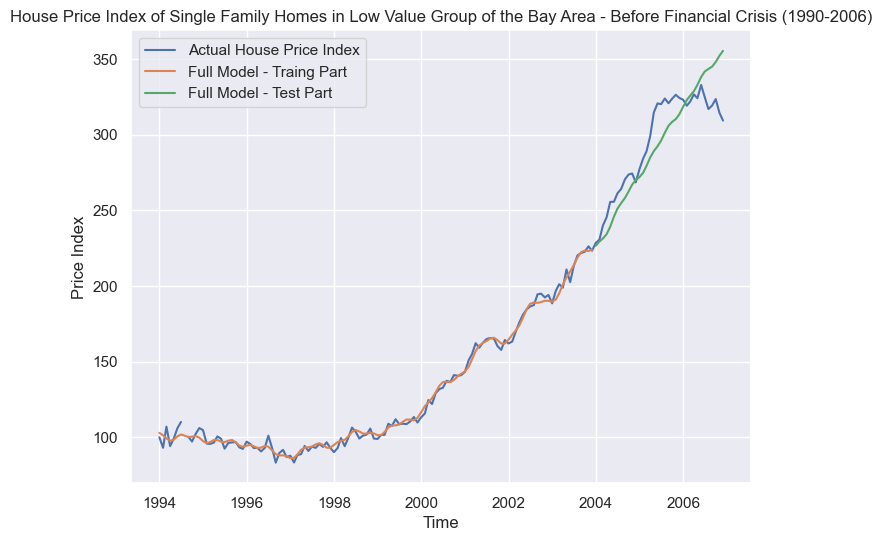

In [133]:
# Plotting the Full Model (Polynomial + Seasonality) - Cheap Class Before Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'])
sns.lineplot(x = train_bfr_crisis_che['Time'], y = train_bfr_crisis_che['Final_Predicted_Value'])
sns.lineplot(x = test_bfr_crisis_che['Time'], y = test_bfr_crisis_che['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

Let's compare the error of full model with the error of just polynomial model.

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

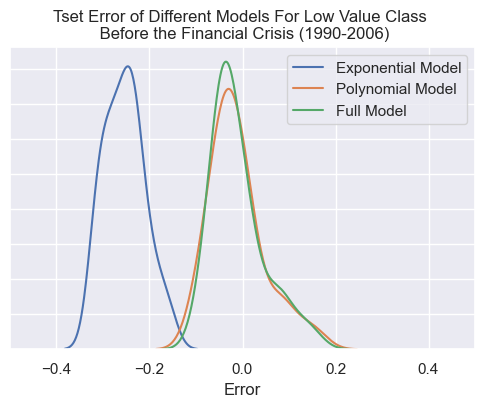

In [134]:
# Compare the Test Error of Full Model (polynomial + seasonality) with Polynomial Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_bfr_crisis_che['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_bfr_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_bfr_crisis_che['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Low Value Class \n Before the Financial Crisis (1990-2006)')
plt.show()

In the above figure, the monthly median single-family home price indices for 1990 to 2003 are used to predict the house price index of 2004 to 2006.
<br>
As you would see, the model could predict the overall shape relatively well. However, there should be some noises that the model could not get them completely. 
In method 2, I will add one feature, which is the impact of the short-term noise at each point to make the model more accurate. 

#### Method 2:  Full Model With Noise Correction

As you noticed in Method 1, which is not using any part of the test set during the prediction, although the model could predict the overall pattern, it could not get the **some noises (sum of seasonality and noises)**. I am going to use the seasonality features(sin and cos waves) and residuals(from the polynomial model) at each point to predict the noises two months in advance. 

In method 2, **one extra variable - Residual of Polynomial Model at each point** compared to method 1 comes into play in our model to predict the Polynomial Model Residual two months in advance. 

<br>

In other words: 

     - Input: Current Polynomial Model Residual + Seasonality Features

     - Output: Polynomial Model Residual 2 Months Ahead

<br>

I will **shift** the value column (Residual_Poly_Model) to few earlier timestamps (let's do it for **2 months** in advance) and put it as the **Goal** of our predictive model. 

In [135]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_bfr_crisis_che['Seasonality_Model_Goal'] = train_bfr_crisis_che['Residual_Poly_Model'].shift(-2)
test_bfr_crisis_che['Seasonality_Model_Goal'] = test_bfr_crisis_che['Residual_Poly_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_bfr_crisis_che.loc[166 , 'Seasonality_Model_Goal'] = test_bfr_crisis_che['Residual_Poly_Model'].iloc[0]
train_bfr_crisis_che.loc[167 , 'Seasonality_Model_Goal'] = test_bfr_crisis_che['Residual_Poly_Model'].iloc[1]


347.8621338367541
18.651062539082165


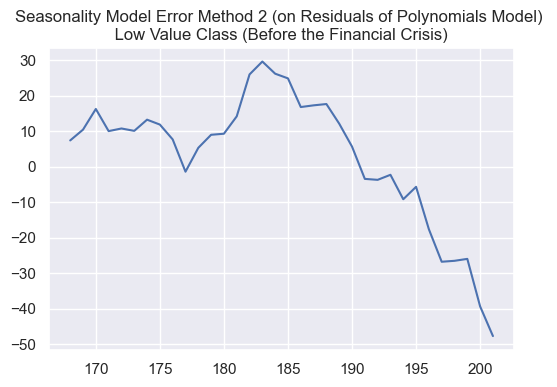

In [136]:
# Fit the regression model on Polynomial model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_bfr_crisis_che[['Residual_Poly_Model', 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)','sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)','sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']], 
        y=train_bfr_crisis_che['Seasonality_Model_Goal'])

train_bfr_crisis_che['Predicted_Residual_2'] = regress_2.predict(X=train_bfr_crisis_che[['Residual_Poly_Model', 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)','sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)','sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']])
test_bfr_crisis_che['Predicted_Residual_2'] = regress_2.predict(X=test_bfr_crisis_che[['Residual_Poly_Model', 'sin(5years)', 'cos(5years)', 'sin(1years)','cos(1years)','sin(3.33years)','cos(3.33years)', 'sin(1.11years)', 'cos(1.11years)','sin(2.5years)','cos(2.5years)','sin(1.25years)','cos(1.25years)','sin(0.4years)','cos(0.4years)']])

# These predicted values should be shifted back 

(test_bfr_crisis_che['Seasonality_Model_Goal'] - test_bfr_crisis_che['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Polynomials Model) \n Low Value Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_che['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_che['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_bfr_crisis_che['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_che['Predicted_Residual_2'].iloc[:-2])))

If you compare the **square root of mean squared error** of these two methods, you can see that there is not much difference in these two methods (with vs. without noise correction) (18.65 vs. 17.5). 

### Adding Back Seasonality and Drift

Now let's put back drift and seasonality to compare the models with real data.

#### Example : 
    
For point 3 -> **Predicted value = poly_model point 3 + seasonality_model (on residuals) of point 1** 

So the predicted residuals should be shifted (2 month forward (.shift(2)) 

In [137]:
# Shifted back predicted residuals to two months in advance

train_bfr_crisis_che['Shifted_Back_Predicted_Residual_2'] = train_bfr_crisis_che['Predicted_Residual_2'].shift(2)
test_bfr_crisis_che['Shifted_Back_Predicted_Residual_2'] = test_bfr_crisis_che['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to polynomial model

train_bfr_crisis_che['Final_Predicted_Value_2'] = train_bfr_crisis_che['Poly_Model'] + train_bfr_crisis_che['Shifted_Back_Predicted_Residual_2']
test_bfr_crisis_che['Final_Predicted_Value_2'] = test_bfr_crisis_che['Poly_Model'] + test_bfr_crisis_che['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Polynomial + Seasonality + 2 months beforehand residuals)
test_bfr_crisis_che['Error_Full_Model_2'] = (test_bfr_crisis_che['Final_Predicted_Value_2'] / test_bfr_crisis_che['Price Index'])-1
train_bfr_crisis_che['Error_Full_Model_2'] = (train_bfr_crisis_che['Final_Predicted_Value_2'] / train_bfr_crisis_che['Price Index'])-1

In [138]:
print (train_bfr_crisis_che['Error_Full_Model_2'].describe())

print (test_bfr_crisis_che['Error_Full_Model_2'].describe())
print (test_bfr_crisis_che['Error_Full_Model'].describe())

count    117.000000
mean       0.001385
std        0.026271
min       -0.073735
25%       -0.016148
50%        0.003799
75%        0.015744
max        0.060883
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean     -0.011662
std       0.060049
min      -0.092416
25%      -0.048665
50%      -0.031960
75%       0.011225
max       0.154072
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean     -0.010679
std       0.056038
min      -0.088466
25%      -0.045874
50%      -0.033139
75%       0.011937
max       0.148970
Name: Error_Full_Model, dtype: float64


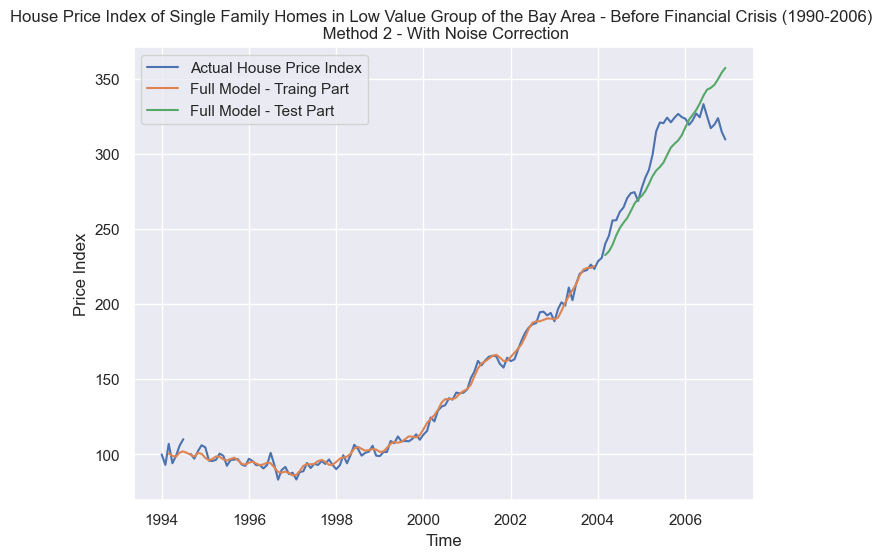

In [139]:
# Plotting the Full Model Method 2(Polynomial + Seasonality + 2 months beforehand correction) 
# Cheap Class Before Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'])
sns.lineplot(x = train_bfr_crisis_che['Time'], y = train_bfr_crisis_che['Final_Predicted_Value_2'])
sns.lineplot(x = test_bfr_crisis_che['Time'], y = test_bfr_crisis_che['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - Before Financial Crisis (1990-2006) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

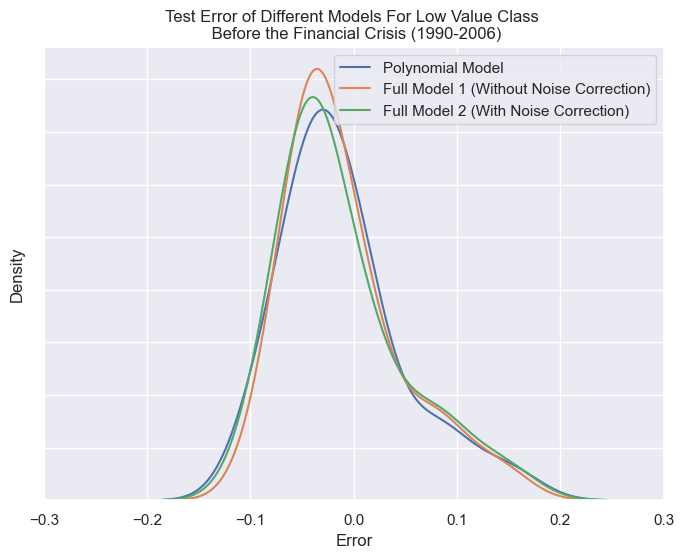

In [140]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_bfr_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_2 = sns.distplot(test_bfr_crisis_che['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_bfr_crisis_che['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.xlim(-0.3,0.3)
plt.legend(loc='upper right')
plt.title('Test Error of Different Models For Low Value Class \n Before the Financial Crisis (1990-2006)')
plt.show()

In [141]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_bfr_crisis_che['Error_Poly']),3),round(np.median(test_bfr_crisis_che['Error_Poly']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_bfr_crisis_che['Error_Full_Model']),3),round(np.nanmedian(test_bfr_crisis_che['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_bfr_crisis_che['Error_Full_Model_2']),3),round(np.nanmedian(test_bfr_crisis_che['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: -0.011 , -0.027
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): -0.011 , -0.033
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): -0.012 , -0.032


In [142]:
# std deviation of error - Polynomial Model vs Final Model 1 vs Final Model 2
print (round(test_bfr_crisis_che['Error_Poly'].std(),3))
print (round(test_bfr_crisis_che['Error_Full_Model'].std(),3))
print (round(test_bfr_crisis_che['Error_Full_Model_2'].std(),3))

0.059
0.056
0.06


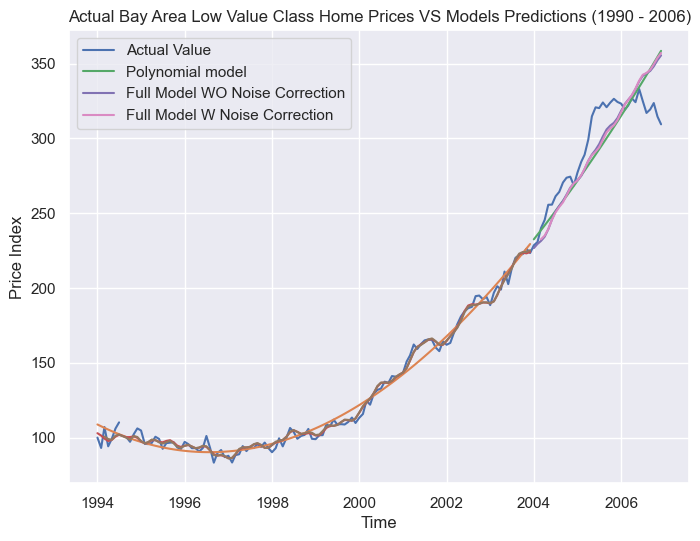

In [143]:
# Plot All models together (Poly , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_bfr_crisis_che['Time'],y = train_bfr_crisis_che['Poly_Model'])
ax_3 = sns.lineplot(x = test_bfr_crisis_che['Time'],y = test_bfr_crisis_che['Poly_Model'], label= 'Polynomial model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_bfr_crisis_che['Time'],y=train_bfr_crisis_che['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_bfr_crisis_che['Time'],y=test_bfr_crisis_che['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_bfr_crisis_che['Time'],y=train_bfr_crisis_che['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_bfr_crisis_che['Time'],y=test_bfr_crisis_che['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Low Value Class Home Prices VS Models Predictions (1990 - 2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

### 2 - Medium Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


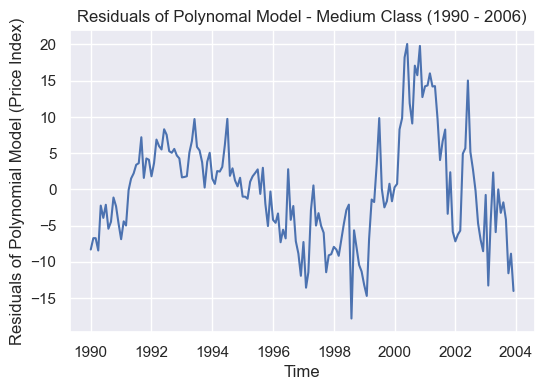

In [144]:
## Add new column as 'residual_poly_model' to both train and test set and visualzie it:

train_bfr_crisis_med['Residual_Poly_Model'] = train_bfr_crisis_med['Price Index'] - train_bfr_crisis_med['Poly_Model']
test_bfr_crisis_med['Residual_Poly_Model'] = test_bfr_crisis_med['Price Index'] - test_bfr_crisis_med['Poly_Model']

## Visualize the residual of the Cubic Polynomial drift: 

ax = sns.lineplot(train_bfr_crisis_med['Time'],train_bfr_crisis_med['Residual_Poly_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Polynomial Model (Price Index)')
plt.title('Residuals of Polynomal Model - Medium Class (1990 - 2006)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 14 years (204->168 timestamps=months)')

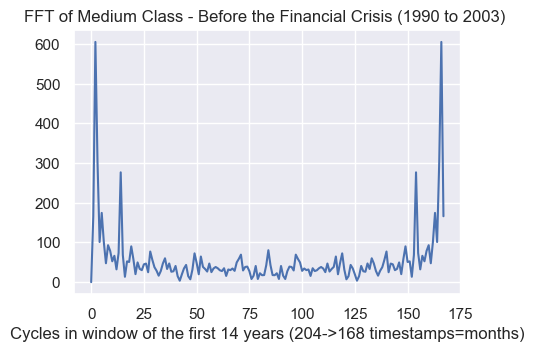

In [145]:
# Let's check the output of Fast Fourier Transform of Cheap Class median price

fft_train_bfr_crisis_med = fftpack.fft(train_bfr_crisis_med['Residual_Poly_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_bfr_crisis_med))
plt.title('FFT of Medium Class - Before the Financial Crisis (1990 to 2003) ')
plt.xlabel('Cycles in window of the first 14 years (204->168 timestamps=months)')

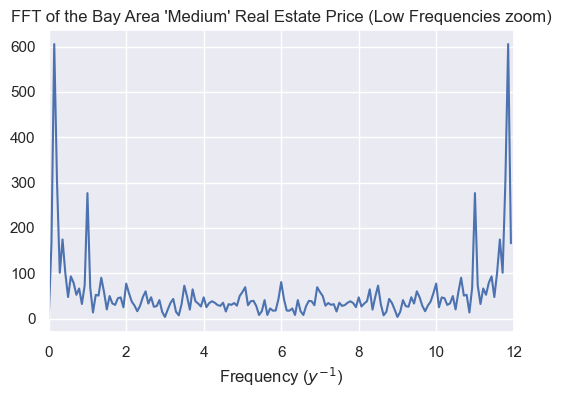

In [146]:
plt.figure(figsize = (6,4))
plt.plot(1./14*np.arange(len(fft_train_bfr_crisis_med)), np.abs(fft_train_bfr_crisis_med)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Medium' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

Let's Zoom in: 

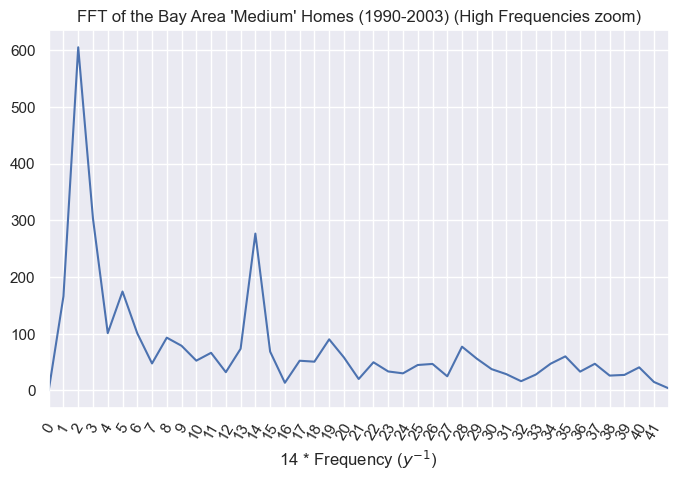

In [147]:
# Zoom in figure of FFT Bay Area (1990 - 2006--> 2003)
monthly_cycles_in_14_years = 14*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./14),rotation=60, labels=np.arange(0,42))
plt.plot(1./14 * np.arange(len(fft_train_bfr_crisis_med)), np.abs(fft_train_bfr_crisis_med))
plt.title("FFT of the Bay Area 'Medium' Homes (1990-2003) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('14 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **14** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 2), so it is basically: 

**2/14 = 1/Year -> Year = 14/2 = 7 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Medium Class Bay Area - 1990 to 2003)

In [148]:
# FFt output is complex number, we just need the real part

fft_train_bfr_crisis_abs_med = np.abs(fft_train_bfr_crisis_med)
train_bfr_crisis_cycles_med = pd.DataFrame(data=fft_train_bfr_crisis_abs_med, columns=['FFT Absolute Value'])

In [149]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (168/2 = 84)

train_bfr_crisis_cycles_med.iloc[:84].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
2,605.357633
3,303.206335
14,276.730296
5,174.540960
1,166.120757
4,101.142343
6,100.835340
8,93.154915
19,90.197430
9,78.832729


So based on the above figure and table,  I separated the top 7 periods that have relatively high FFT Absolute Value ***(indices: 2, 3, 14, 5, 1, 4, 6)***. 

Here are the 7 biggest periods of our **Medium Class Before the Financial Crisis (1990-2003)**: 

In [150]:
train_bfr_crisis_cycles_med_top = train_bfr_crisis_cycles_med.iloc[:84].sort_values(by='FFT Absolute Value', ascending=False).iloc[:7]
train_bfr_crisis_cycles_med_top['Cycle(year)'] = train_bfr_crisis_cycles_med_top.index.map(lambda x : 14./x)
print (train_bfr_crisis_cycles_med_top)

    FFT Absolute Value  Cycle(year)
2           605.357633     7.000000
3           303.206335     4.666667
14          276.730296     1.000000
5           174.540960     2.800000
1           166.120757    14.000000
4           101.142343     3.500000
6           100.835340     2.333333


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **: 7 , 4.66 , 1 , 2.8 , 14 , 3.5 , 2.33 years**.

In [151]:
# 7 years -> (should I change 365.25 * 7 since, it is night the same thing as 5 years)
train_bfr_crisis_med['sin(7years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*7) * 2 * np.pi)
train_bfr_crisis_med['cos(7years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*7) * 2 * np.pi)

# 4.66 years 
train_bfr_crisis_med['sin(4.66years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*4.66) * 2 * np.pi)
train_bfr_crisis_med['cos(4.66years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*4.66) * 2 * np.pi)

# 1 years 
train_bfr_crisis_med['sin(1years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*1) * 2 * np.pi)
train_bfr_crisis_med['cos(1years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*1) * 2 * np.pi)

# 2.8 year
train_bfr_crisis_med['sin(2.8years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*2.8) * 2 * np.pi)
train_bfr_crisis_med['cos(2.8years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*2.8) * 2 * np.pi)

# 14 years 
train_bfr_crisis_med['sin(14years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*14) * 2 * np.pi)
train_bfr_crisis_med['cos(14years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*14) * 2 * np.pi)

# 3.5 years 
train_bfr_crisis_med['sin(3.5years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*3.5) * 2 * np.pi)
train_bfr_crisis_med['cos(3.5years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*3.5) * 2 * np.pi)

# 2.33 years 
train_bfr_crisis_med['sin(2.33years)'] = np.sin(train_bfr_crisis_med['Julian']/(365.25*2.33) * 2 * np.pi)
train_bfr_crisis_med['cos(2.33years)'] = np.cos(train_bfr_crisis_med['Julian']/(365.25*2.33) * 2 * np.pi)

Add columns to test dataset: 

In [152]:
# 7 years -> (should I change 365.25 * 7 since, it is night the same thing as 5 years)
test_bfr_crisis_med['sin(7years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*7) * 2 * np.pi)
test_bfr_crisis_med['cos(7years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*7) * 2 * np.pi)

# 4.66 years 
test_bfr_crisis_med['sin(4.66years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*4.66) * 2 * np.pi)
test_bfr_crisis_med['cos(4.66years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*4.66) * 2 * np.pi)

# 1 years 
test_bfr_crisis_med['sin(1years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*1) * 2 * np.pi)
test_bfr_crisis_med['cos(1years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*1) * 2 * np.pi)

# 2.8 year
test_bfr_crisis_med['sin(2.8years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*2.8) * 2 * np.pi)
test_bfr_crisis_med['cos(2.8years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*2.8) * 2 * np.pi)

# 14 years 
test_bfr_crisis_med['sin(14years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*14) * 2 * np.pi)
test_bfr_crisis_med['cos(14years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*14) * 2 * np.pi)

# 3.5 years 
test_bfr_crisis_med['sin(3.5years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*3.5) * 2 * np.pi)
test_bfr_crisis_med['cos(3.5years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*3.5) * 2 * np.pi)

# 2.33 years 
test_bfr_crisis_med['sin(2.33years)'] = np.sin(test_bfr_crisis_med['Julian']/(365.25*2.33) * 2 * np.pi)
test_bfr_crisis_med['cos(2.33years)'] = np.cos(test_bfr_crisis_med['Julian']/(365.25*2.33) * 2 * np.pi)

#### Method 1 : Full Model Without Noise Correction

734.8559061769507
27.108225802825068


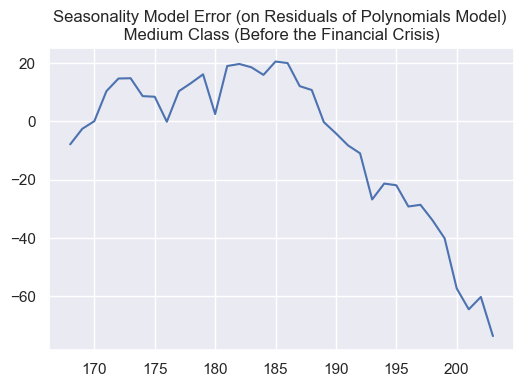

In [153]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

regress = LinearRegression().fit( 
        X=train_bfr_crisis_med[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)',
                                'sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)',
                           'sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']], 
        y=train_bfr_crisis_med['Residual_Poly_Model'])

train_bfr_crisis_med['Predicted_Residual'] = regress.predict(X=train_bfr_crisis_med[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']])
test_bfr_crisis_med['Predicted_Residual'] = regress.predict(X=test_bfr_crisis_med[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']])
(test_bfr_crisis_med['Residual_Poly_Model'] - test_bfr_crisis_med['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Polynomials Model) \n Medium Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_med['Residual_Poly_Model'], test_bfr_crisis_med['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_med['Residual_Poly_Model'], test_bfr_crisis_med['Predicted_Residual'])))

In [154]:
train_bfr_crisis_med['Final_Predicted_Value'] = train_bfr_crisis_med['Poly_Model'] + train_bfr_crisis_med['Predicted_Residual']
test_bfr_crisis_med['Final_Predicted_Value'] = test_bfr_crisis_med['Poly_Model'] + test_bfr_crisis_med['Predicted_Residual']

In [155]:
# Calculate the Test and Training Error
train_bfr_crisis_med['Error_Full_Model'] = (train_bfr_crisis_med['Final_Predicted_Value']/train_bfr_crisis_med['Price Index'])-1
test_bfr_crisis_med['Error_Full_Model'] = (test_bfr_crisis_med['Final_Predicted_Value']/test_bfr_crisis_med['Price Index'])-1

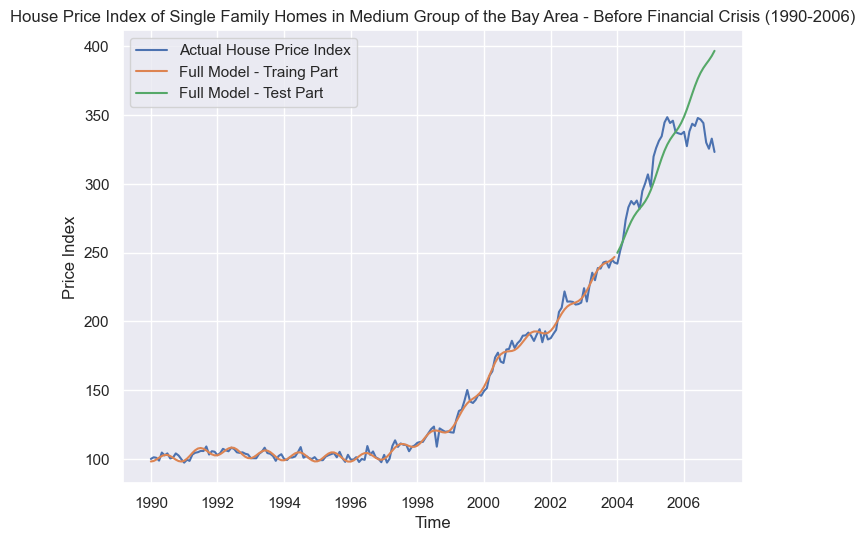

In [156]:
# Plotting the Full Model (Polynomial + Seasonality) - Medium Class Before Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'])
sns.lineplot(x = train_bfr_crisis_med['Time'], y = train_bfr_crisis_med['Final_Predicted_Value'])
sns.lineplot(x = test_bfr_crisis_med['Time'], y = test_bfr_crisis_med['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

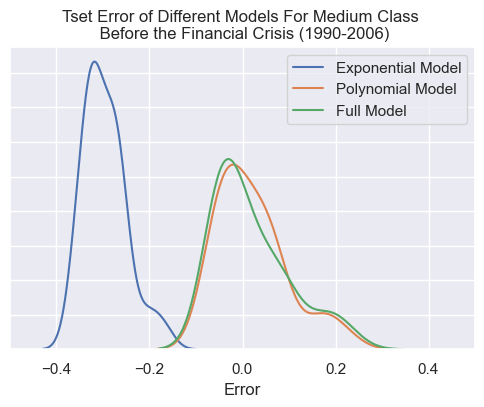

In [157]:
# Compare the Test Error of Full Model (polynomial + seasonality) with Polynomial Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_bfr_crisis_med['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_bfr_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_bfr_crisis_med['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Medium Class \n Before the Financial Crisis (1990-2006)')
plt.show()

#### Method 2 : Full Model With Noise Correction

In [158]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_bfr_crisis_med['Seasonality_Model_Goal'] = train_bfr_crisis_med['Residual_Poly_Model'].shift(-2)
test_bfr_crisis_med['Seasonality_Model_Goal'] = test_bfr_crisis_med['Residual_Poly_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_bfr_crisis_med.loc[166 , 'Seasonality_Model_Goal'] = test_bfr_crisis_med['Residual_Poly_Model'].iloc[0]
train_bfr_crisis_med.loc[167 , 'Seasonality_Model_Goal'] = test_bfr_crisis_med['Residual_Poly_Model'].iloc[1]



715.0560419970928
26.740531819638385


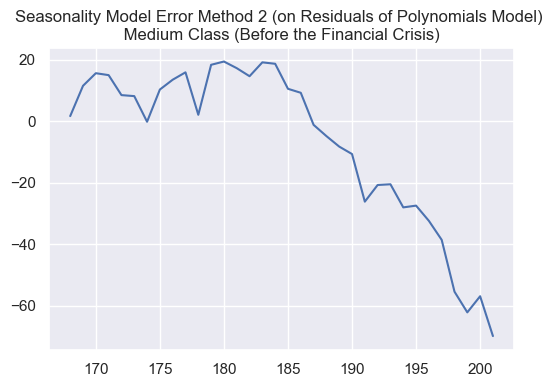

In [159]:
# Fit the regression model on Polynomial model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_bfr_crisis_med[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']], 
       y=train_bfr_crisis_med['Seasonality_Model_Goal'])

train_bfr_crisis_med['Predicted_Residual_2'] = regress_2.predict(X=train_bfr_crisis_med[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']])
test_bfr_crisis_med['Predicted_Residual_2'] = regress_2.predict(X=test_bfr_crisis_med[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(3.5years)','cos(3.5years)','sin(2.33years)','cos(2.33years)']])

# These predicted values should be shifted back 

(test_bfr_crisis_med['Seasonality_Model_Goal'] - test_bfr_crisis_med['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Polynomials Model) \n Medium Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_med['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_med['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_bfr_crisis_med['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_med['Predicted_Residual_2'].iloc[:-2])))

### Adding Back Drift and Seasonality

In [160]:
# Shifted back predicted residuals to two months in advance

train_bfr_crisis_med['Shifted_Back_Predicted_Residual_2'] = train_bfr_crisis_med['Predicted_Residual_2'].shift(2)
test_bfr_crisis_med['Shifted_Back_Predicted_Residual_2'] = test_bfr_crisis_med['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to polynomial model

train_bfr_crisis_med['Final_Predicted_Value_2'] = train_bfr_crisis_med['Poly_Model'] + train_bfr_crisis_med['Shifted_Back_Predicted_Residual_2']
test_bfr_crisis_med['Final_Predicted_Value_2'] = test_bfr_crisis_med['Poly_Model'] + test_bfr_crisis_med['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Polynomial + Seasonality + 2 months beforehand residuals)
test_bfr_crisis_med['Error_Full_Model_2'] = (test_bfr_crisis_med['Final_Predicted_Value_2'] / test_bfr_crisis_med['Price Index'])-1
train_bfr_crisis_med['Error_Full_Model_2'] = (train_bfr_crisis_med['Final_Predicted_Value_2'] / train_bfr_crisis_med['Price Index'])-1

In [161]:
print (train_bfr_crisis_med['Error_Full_Model_2'].describe())

print (test_bfr_crisis_med['Error_Full_Model_2'].describe())
print (test_bfr_crisis_med['Error_Full_Model'].describe())

count    166.000000
mean      -0.000012
std        0.023723
min       -0.063488
25%       -0.016415
50%       -0.000127
75%        0.014981
max        0.109930
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean      0.019184
std       0.080191
min      -0.059659
25%      -0.044764
50%      -0.006867
75%       0.074425
max       0.216158
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean      0.020426
std       0.080962
min      -0.060306
25%      -0.044640
50%       0.000057
75%       0.068170
max       0.227580
Name: Error_Full_Model, dtype: float64


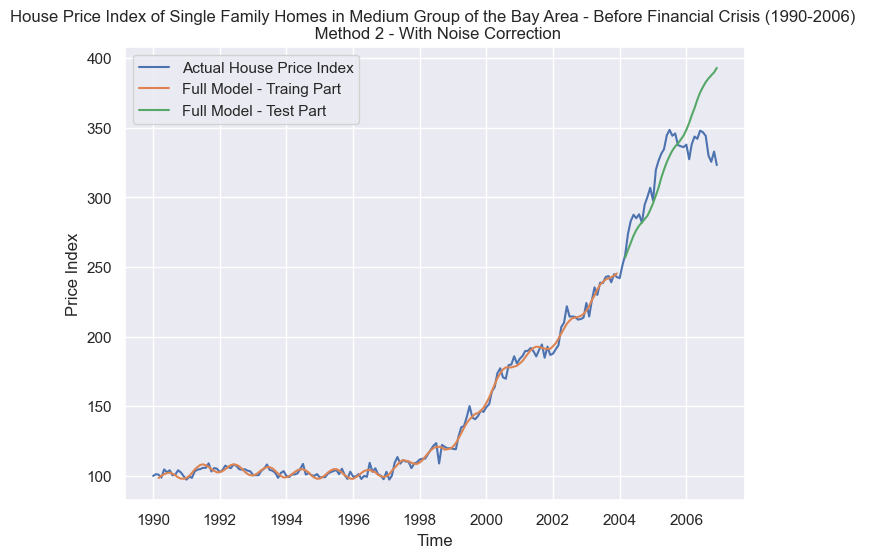

In [162]:
# Plotting the Full Model Method 2(Polynomial + Seasonality + 2 months beforehand correction) 
# Medium Class Before Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'])
sns.lineplot(x = train_bfr_crisis_med['Time'], y = train_bfr_crisis_med['Final_Predicted_Value_2'])
sns.lineplot(x = test_bfr_crisis_med['Time'], y = test_bfr_crisis_med['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - Before Financial Crisis (1990-2006) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

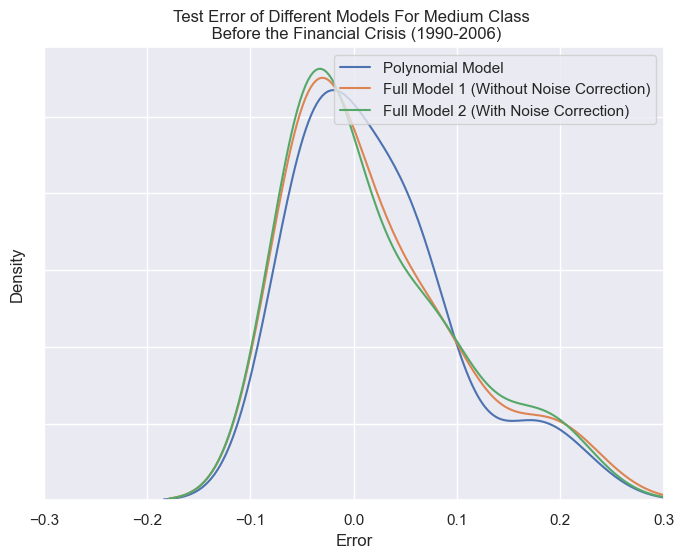

In [163]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_bfr_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_2 = sns.distplot(test_bfr_crisis_med['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_bfr_crisis_med['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.xlim(-0.3,0.3)
plt.legend(loc='upper right')
plt.title('Test Error of Different Models For Medium Class \n Before the Financial Crisis (1990-2006)')
plt.show()

In [164]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_bfr_crisis_med['Error_Poly']),3),round(np.median(test_bfr_crisis_med['Error_Poly']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_bfr_crisis_med['Error_Full_Model']),3),round(np.nanmedian(test_bfr_crisis_med['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_bfr_crisis_med['Error_Full_Model_2']),3),round(np.nanmedian(test_bfr_crisis_med['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: 0.021 , 0.008
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): 0.02 , 0.0
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): 0.019 , -0.007


In [165]:
# std deviation of error - Polynomial Model vs Final Model 1 vs Final Model 2
print (round(test_bfr_crisis_med['Error_Poly'].std(),3))
print (round(test_bfr_crisis_med['Error_Full_Model'].std(),3))
print (round(test_bfr_crisis_med['Error_Full_Model_2'].std(),3))

0.075
0.081
0.08


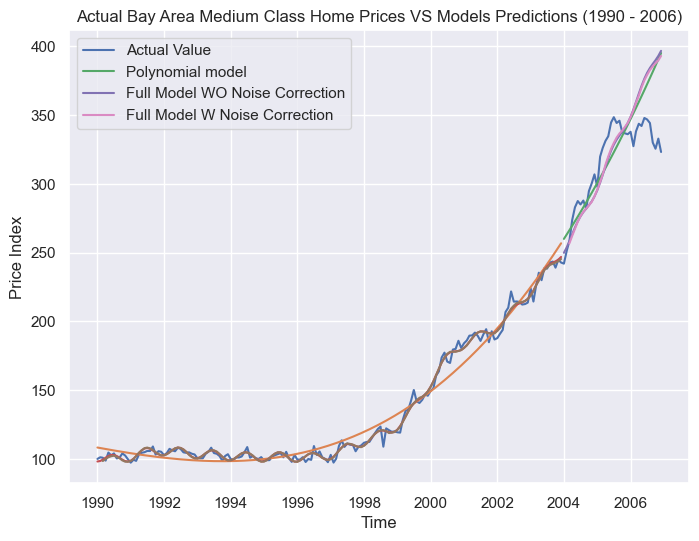

In [166]:
# Plot All models together (Poly , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_bfr_crisis_med['Time'],y = train_bfr_crisis_med['Poly_Model'])
ax_3 = sns.lineplot(x = test_bfr_crisis_med['Time'],y = test_bfr_crisis_med['Poly_Model'], label= 'Polynomial model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_bfr_crisis_med['Time'],y=train_bfr_crisis_med['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_bfr_crisis_med['Time'],y=test_bfr_crisis_med['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_bfr_crisis_med['Time'],y=train_bfr_crisis_med['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_bfr_crisis_med['Time'],y=test_bfr_crisis_med['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Medium Class Home Prices VS Models Predictions (1990 - 2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

### 3 - Expensive Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


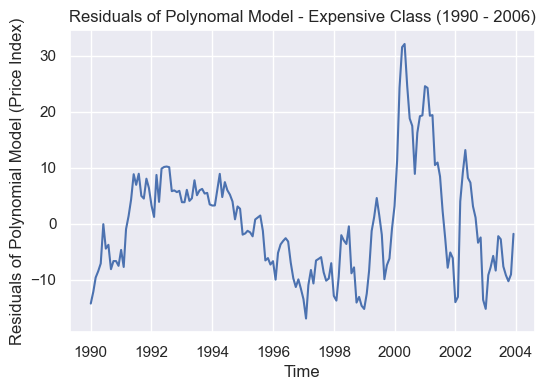

In [167]:
## Add new column as 'residual_poly_model' to both train and test set and visualzie it:

train_bfr_crisis_exp['Residual_Poly_Model'] = train_bfr_crisis_exp['Price Index'] - train_bfr_crisis_exp['Poly_Model']
test_bfr_crisis_exp['Residual_Poly_Model'] = test_bfr_crisis_exp['Price Index'] - test_bfr_crisis_exp['Poly_Model']

## Visualize the residual of the Cubic Polynomial drift: 

ax = sns.lineplot(train_bfr_crisis_exp['Time'],train_bfr_crisis_exp['Residual_Poly_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Polynomial Model (Price Index)')
plt.title('Residuals of Polynomal Model - Expensive Class (1990 - 2006)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 14 years (204->168 timestamps=months)')

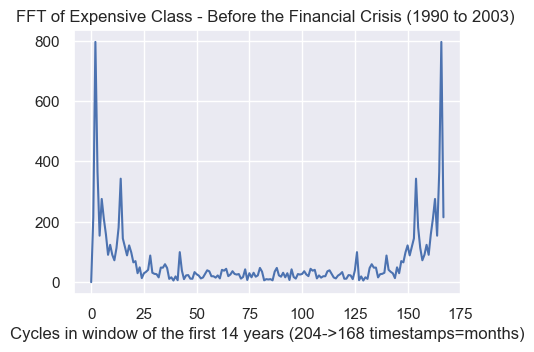

In [168]:
# Let's check the output of Fast Fourier Transform of Cheap Class median price

fft_train_bfr_crisis_exp = fftpack.fft(train_bfr_crisis_exp['Residual_Poly_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_bfr_crisis_exp))
plt.title('FFT of Expensive Class - Before the Financial Crisis (1990 to 2003) ')
plt.xlabel('Cycles in window of the first 14 years (204->168 timestamps=months)')

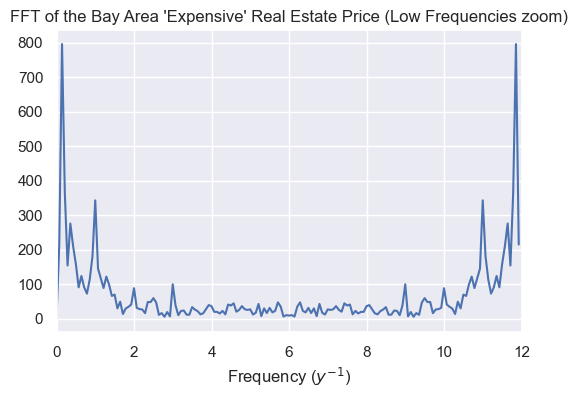

In [169]:
plt.figure(figsize = (6,4))
plt.plot(1./14*np.arange(len(fft_train_bfr_crisis_exp)), np.abs(fft_train_bfr_crisis_exp)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Expensive' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

Let's zoom in: 

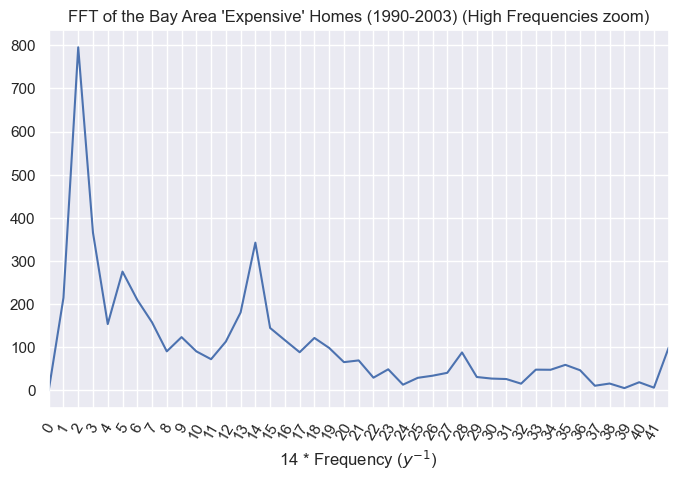

In [170]:
# Zoom in figure of FFT Bay Area (1990 - 2006--> 2003)
monthly_cycles_in_14_years = 14*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./14),rotation=60, labels=np.arange(0,42))
plt.plot(1./14 * np.arange(len(fft_train_bfr_crisis_exp)), np.abs(fft_train_bfr_crisis_exp))
plt.title("FFT of the Bay Area 'Expensive' Homes (1990-2003) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('14 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **14** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 2), so it is basically: 

**2/14 = 1/Year -> Year = 14/2 = 7 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Expensive Class Bay Area - 1990 to 2003)

In [171]:
# FFt output is complex number, we just need the real part

fft_train_bfr_crisis_abs_exp = np.abs(fft_train_bfr_crisis_exp)
train_bfr_crisis_cycles_exp = pd.DataFrame(data=fft_train_bfr_crisis_abs_exp, columns=['FFT Absolute Value'])

In [172]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (168/2 = 84)

train_bfr_crisis_cycles_exp.iloc[:84].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
2,795.480530
3,365.683392
14,342.681398
5,275.533713
1,214.807692
6,210.057970
13,180.748668
7,157.938423
4,153.886798
15,144.902065


So based on the above figure and table,  I separated the top 7 periods that have relatively high FFT Absolute Value ***(indices: 2, 3, 14, 5, 1, 6, 13)***. 

Here are the 7 biggest periods of our **Expensive Class Before the Financial Crisis (1990-2003)**: 

In [173]:
train_bfr_crisis_cycles_exp_top = train_bfr_crisis_cycles_exp.iloc[:84].sort_values(by='FFT Absolute Value', ascending=False).iloc[:7]
train_bfr_crisis_cycles_exp_top['Cycle(year)'] = train_bfr_crisis_cycles_exp_top.index.map(lambda x : 14./x)
print (train_bfr_crisis_cycles_exp_top)

    FFT Absolute Value  Cycle(year)
2           795.480530     7.000000
3           365.683392     4.666667
14          342.681398     1.000000
5           275.533713     2.800000
1           214.807692    14.000000
6           210.057970     2.333333
13          180.748668     1.076923


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **: 7 , 4.66 , 1 , 2.8 , 14 , 2.33 , 1.07 years**.

Add columns to dataset: 

In [174]:
# 7 years -> (should I change 365.25 * 7 since, it is night the same thing as 7 years)
train_bfr_crisis_exp['sin(7years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*7) * 2 * np.pi)
train_bfr_crisis_exp['cos(7years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*7) * 2 * np.pi)

# 4.66 years 
train_bfr_crisis_exp['sin(4.66years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*4.66) * 2 * np.pi)
train_bfr_crisis_exp['cos(4.66years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*4.66) * 2 * np.pi)

# 1 years 
train_bfr_crisis_exp['sin(1years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)
train_bfr_crisis_exp['cos(1years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)

# 2.8 year
train_bfr_crisis_exp['sin(2.8years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*2.8) * 2 * np.pi)
train_bfr_crisis_exp['cos(2.8years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*2.8) * 2 * np.pi)

# 14 years 
train_bfr_crisis_exp['sin(14years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*14) * 2 * np.pi)
train_bfr_crisis_exp['cos(14years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*14) * 2 * np.pi)


# 2.33 years 
train_bfr_crisis_exp['sin(2.33years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*2.33) * 2 * np.pi)
train_bfr_crisis_exp['cos(2.33years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*2.33) * 2 * np.pi)


# 1.07 years 
train_bfr_crisis_exp['sin(1.07years)'] = np.sin(train_bfr_crisis_exp['Julian']/(365.25*1.07) * 2 * np.pi)
train_bfr_crisis_exp['cos(1.07years)'] = np.cos(train_bfr_crisis_exp['Julian']/(365.25*1.07) * 2 * np.pi)

Add columns to test dataset:

In [175]:
# 7 years -> (should I change 365.25 * 7 since, it is night the same thing as 7 years)
test_bfr_crisis_exp['sin(7years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*7) * 2 * np.pi)
test_bfr_crisis_exp['cos(7years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*7) * 2 * np.pi)

# 4.66 years 
test_bfr_crisis_exp['sin(4.66years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*4.66) * 2 * np.pi)
test_bfr_crisis_exp['cos(4.66years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*4.66) * 2 * np.pi)

# 1 years 
test_bfr_crisis_exp['sin(1years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)
test_bfr_crisis_exp['cos(1years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)

# 2.8 year
test_bfr_crisis_exp['sin(2.8years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*2.8) * 2 * np.pi)
test_bfr_crisis_exp['cos(2.8years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*2.8) * 2 * np.pi)

# 14 years 
test_bfr_crisis_exp['sin(14years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*14) * 2 * np.pi)
test_bfr_crisis_exp['cos(14years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*14) * 2 * np.pi)


# 2.33 years 
test_bfr_crisis_exp['sin(2.33years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*2.33) * 2 * np.pi)
test_bfr_crisis_exp['cos(2.33years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*2.33) * 2 * np.pi)


# 1.07 years 
test_bfr_crisis_exp['sin(1.07years)'] = np.sin(test_bfr_crisis_exp['Julian']/(365.25*1.07) * 2 * np.pi)
test_bfr_crisis_exp['cos(1.07years)'] = np.cos(test_bfr_crisis_exp['Julian']/(365.25*1.07) * 2 * np.pi)

616.5528277320939
24.83048182641839


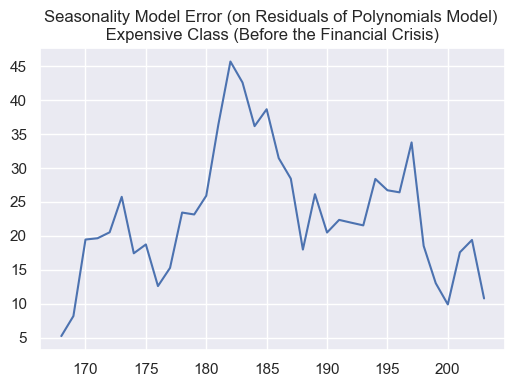

In [176]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2004  # The whole dataset have monthly data from 1990 to the end of 2006
                 # So basically 3 years out of 17 years is testing dataset and 14 years is training set

regress = LinearRegression().fit( 
        X=train_bfr_crisis_exp[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)',
                                'sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)',
                           'sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)']], 
        y=train_bfr_crisis_exp['Residual_Poly_Model'])

train_bfr_crisis_exp['Predicted_Residual'] = regress.predict(X=train_bfr_crisis_exp[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)']])
test_bfr_crisis_exp['Predicted_Residual'] = regress.predict(X=test_bfr_crisis_exp[[ 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)']])
(test_bfr_crisis_exp['Residual_Poly_Model'] - test_bfr_crisis_exp['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Polynomials Model) \n Expensive Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_exp['Residual_Poly_Model'], test_bfr_crisis_exp['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_bfr_crisis_exp['Residual_Poly_Model'], test_bfr_crisis_exp['Predicted_Residual'])))

In [177]:
train_bfr_crisis_exp['Final_Predicted_Value'] = train_bfr_crisis_exp['Poly_Model'] + train_bfr_crisis_exp['Predicted_Residual']
test_bfr_crisis_exp['Final_Predicted_Value'] = test_bfr_crisis_exp['Poly_Model'] + test_bfr_crisis_exp['Predicted_Residual']

In [178]:
# Calculate the Test and Training Error
train_bfr_crisis_exp['Error_Full_Model'] = (train_bfr_crisis_exp['Final_Predicted_Value']/train_bfr_crisis_exp['Price Index'])-1
test_bfr_crisis_exp['Error_Full_Model'] = (test_bfr_crisis_exp['Final_Predicted_Value']/test_bfr_crisis_exp['Price Index'])-1

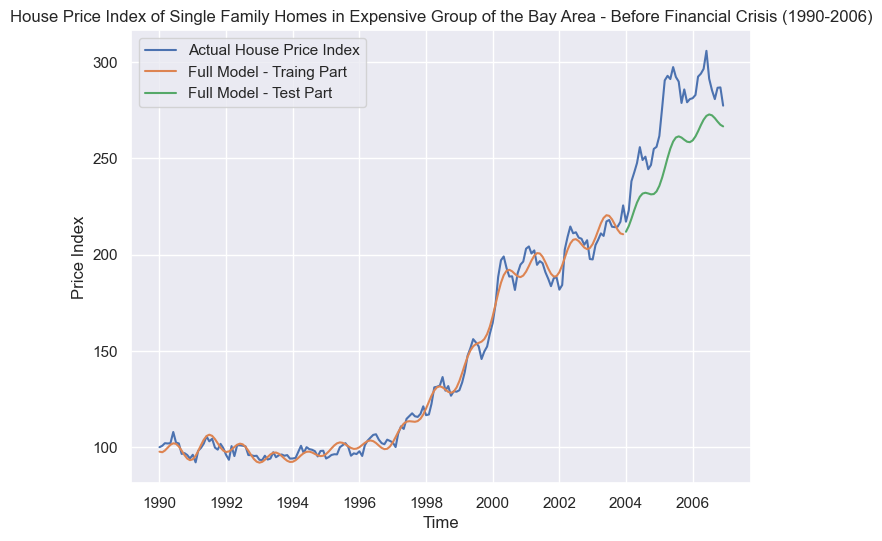

In [179]:
# Plotting the Full Model (Polynomial + Seasonality) - Expensive Class Before Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'])
sns.lineplot(x = train_bfr_crisis_exp['Time'], y = train_bfr_crisis_exp['Final_Predicted_Value'])
sns.lineplot(x = test_bfr_crisis_exp['Time'], y = test_bfr_crisis_exp['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - Before Financial Crisis (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

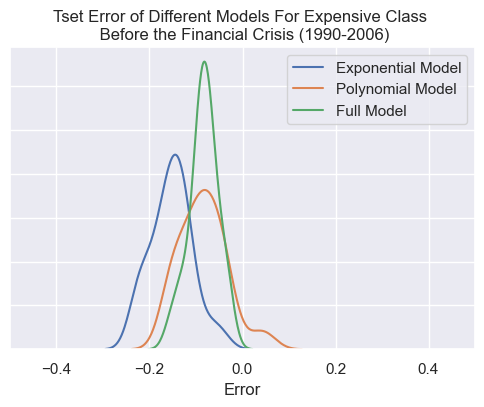

In [180]:
# Compare the Test Error of Full Model (polynomial + seasonality) with Polynomial Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_bfr_crisis_exp['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_bfr_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_bfr_crisis_exp['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Expensive Class \n Before the Financial Crisis (1990-2006)')
plt.show()

#### 2 - Full Model With Noise Correction

In [181]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_bfr_crisis_exp['Seasonality_Model_Goal'] = train_bfr_crisis_exp['Residual_Poly_Model'].shift(-2)
test_bfr_crisis_exp['Seasonality_Model_Goal'] = test_bfr_crisis_exp['Residual_Poly_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_bfr_crisis_exp.loc[166 , 'Seasonality_Model_Goal'] = test_bfr_crisis_exp['Residual_Poly_Model'].iloc[0]
train_bfr_crisis_exp.loc[167 , 'Seasonality_Model_Goal'] = test_bfr_crisis_exp['Residual_Poly_Model'].iloc[1]



298.2553950647727
17.27007223681397


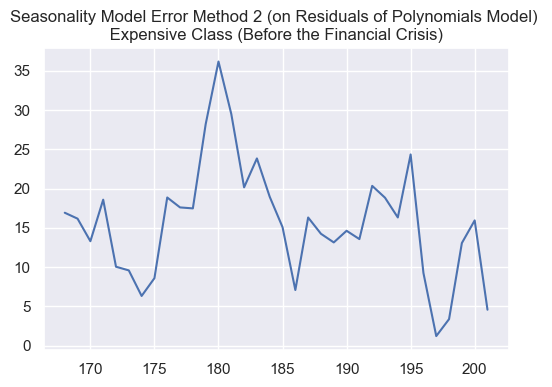

In [182]:
# Fit the regression model on Polynomial model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_bfr_crisis_exp[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)']], 
       y=train_bfr_crisis_exp['Seasonality_Model_Goal'])

train_bfr_crisis_exp['Predicted_Residual_2'] = regress_2.predict(X=train_bfr_crisis_exp[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)']])
test_bfr_crisis_exp['Predicted_Residual_2'] = regress_2.predict(X=test_bfr_crisis_exp[['Residual_Poly_Model', 'sin(7years)', 'cos(7years)', 'sin(4.66years)','cos(4.66years)','sin(1years)','cos(1years)', 'sin(2.8years)', 'cos(2.8years)','sin(14years)','cos(14years)','sin(2.33years)','cos(2.33years)','sin(1.07years)','cos(1.07years)',]])

# These predicted values should be shifted back 

(test_bfr_crisis_exp['Seasonality_Model_Goal'] - test_bfr_crisis_exp['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Polynomials Model) \n Expensive Class (Before the Financial Crisis) ')
print(mean_squared_error(test_bfr_crisis_exp['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_exp['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_bfr_crisis_exp['Seasonality_Model_Goal'].iloc[:-2], test_bfr_crisis_exp['Predicted_Residual_2'].iloc[:-2])))

### Adding Back Drift and Seasonality

In [183]:
# Shifted back predicted residuals to two months in advance

train_bfr_crisis_exp['Shifted_Back_Predicted_Residual_2'] = train_bfr_crisis_exp['Predicted_Residual_2'].shift(2)
test_bfr_crisis_exp['Shifted_Back_Predicted_Residual_2'] = test_bfr_crisis_exp['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to polynomial model

train_bfr_crisis_exp['Final_Predicted_Value_2'] = train_bfr_crisis_exp['Poly_Model'] + train_bfr_crisis_exp['Shifted_Back_Predicted_Residual_2']
test_bfr_crisis_exp['Final_Predicted_Value_2'] = test_bfr_crisis_exp['Poly_Model'] + test_bfr_crisis_exp['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Polynomial + Seasonality + 2 months beforehand residuals)
test_bfr_crisis_exp['Error_Full_Model_2'] = (test_bfr_crisis_exp['Final_Predicted_Value_2'] / test_bfr_crisis_exp['Price Index'])-1
train_bfr_crisis_exp['Error_Full_Model_2'] = (train_bfr_crisis_exp['Final_Predicted_Value_2'] / train_bfr_crisis_exp['Price Index'])-1

In [184]:
print (train_bfr_crisis_med['Error_Full_Model_2'].describe())

print (test_bfr_crisis_med['Error_Full_Model_2'].describe())
print (test_bfr_crisis_med['Error_Full_Model'].describe())

count    166.000000
mean      -0.000012
std        0.023723
min       -0.063488
25%       -0.016415
50%       -0.000127
75%        0.014981
max        0.109930
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean      0.019184
std       0.080191
min      -0.059659
25%      -0.044764
50%      -0.006867
75%       0.074425
max       0.216158
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean      0.020426
std       0.080962
min      -0.060306
25%      -0.044640
50%       0.000057
75%       0.068170
max       0.227580
Name: Error_Full_Model, dtype: float64


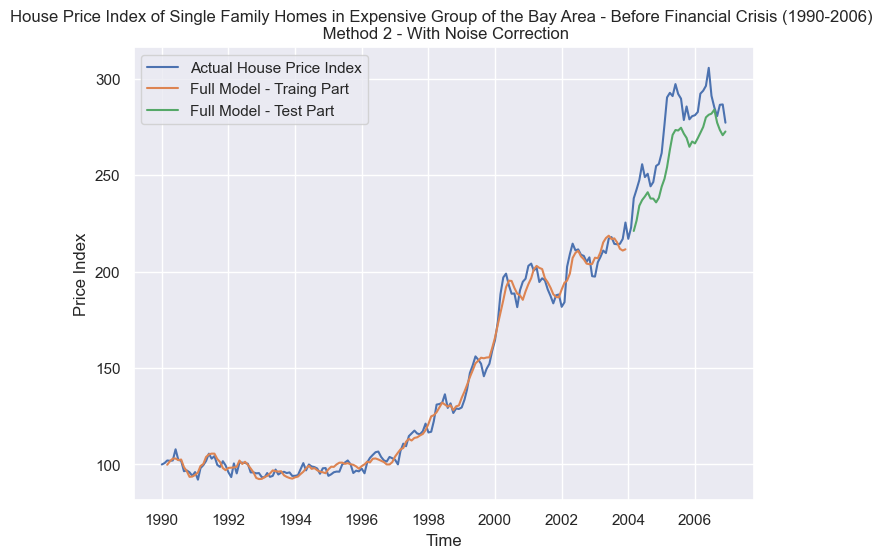

In [185]:
# Plotting the Full Model Method 2(Polynomial + Seasonality + 2 months beforehand correction) 
# Medium Class Before Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'])
sns.lineplot(x = train_bfr_crisis_exp['Time'], y = train_bfr_crisis_exp['Final_Predicted_Value_2'])
sns.lineplot(x = test_bfr_crisis_exp['Time'], y = test_bfr_crisis_exp['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - Before Financial Crisis (1990-2006) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

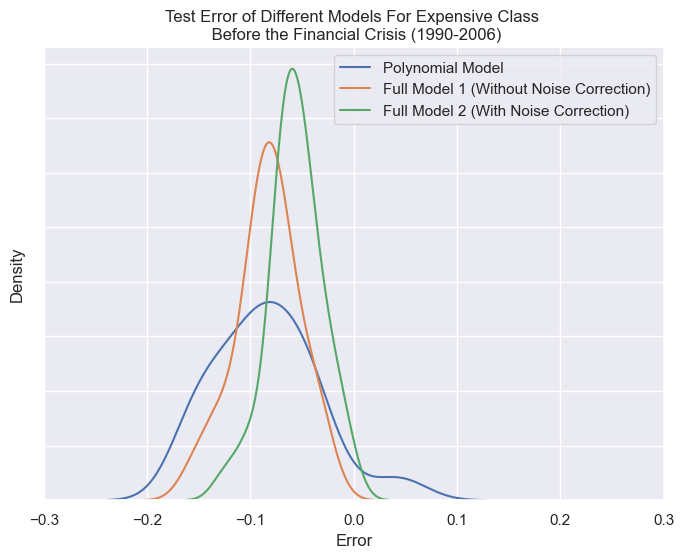

In [186]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_bfr_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_2 = sns.distplot(test_bfr_crisis_exp['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_bfr_crisis_exp['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.xlim(-0.3,0.3)
plt.legend(loc='upper right')
plt.title('Test Error of Different Models For Expensive Class \n Before the Financial Crisis (1990-2006)')
plt.show()

In [187]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_bfr_crisis_exp['Error_Poly']),3),round(np.median(test_bfr_crisis_exp['Error_Poly']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_bfr_crisis_exp['Error_Full_Model']),3),round(np.nanmedian(test_bfr_crisis_exp['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_bfr_crisis_exp['Error_Full_Model_2']),3),round(np.nanmedian(test_bfr_crisis_exp['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: -0.085 , -0.087
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): -0.083 , -0.081
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): -0.057 , -0.055


In [188]:
# std deviation of error - Polynomial Model vs Final Model 1 vs Final Model 2
print (round(test_bfr_crisis_exp['Error_Poly'].std(),3))
print (round(test_bfr_crisis_exp['Error_Full_Model'].std(),3))
print (round(test_bfr_crisis_exp['Error_Full_Model_2'].std(),3))

0.051
0.031
0.026


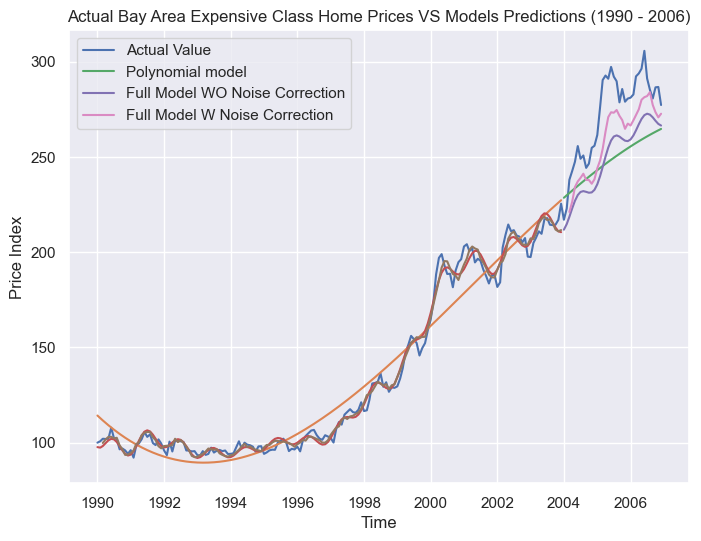

In [189]:
# Plot All models together (Poly , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_bfr_crisis_exp['Time'],y = train_bfr_crisis_exp['Poly_Model'])
ax_3 = sns.lineplot(x = test_bfr_crisis_exp['Time'],y = test_bfr_crisis_exp['Poly_Model'], label= 'Polynomial model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_bfr_crisis_exp['Time'],y=train_bfr_crisis_exp['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_bfr_crisis_exp['Time'],y=test_bfr_crisis_exp['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_bfr_crisis_exp['Time'],y=train_bfr_crisis_exp['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_bfr_crisis_exp['Time'],y=test_bfr_crisis_exp['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Expensive Class Home Prices VS Models Predictions (1990 - 2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

<br>


<br>


<br>

I am going to repeat all steps for after the financial crisis part.

<br>

<font color='blue' size=5> After Financial Crisis (2009 - 2019) </font> 

</br>

## A - Modeling the Drift (Exponential Model & Polynomial Model)

<br>

<font color='green' size=4> Exponential Model </font> 

</br>

### 1 - Cheap Class

In [190]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2017  # The whole dataset have monthly data from 1990 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

train_aft_crisis_che = df_aft_crisis_che[df_aft_crisis_che.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_aft_crisis_che = df_aft_crisis_che[df_aft_crisis_che.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_aft_crisis_che = Ridge().fit( 
    X=train_aft_crisis_che[['Julian', 'Const']], 
    y=np.log(train_aft_crisis_che['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_aft_crisis_che['Exponential_Model'] = np.exp(exponential_model_aft_crisis_che.predict(train_aft_crisis_che[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_aft_crisis_che['Exponential_Model'] = np.exp(exponential_model_aft_crisis_che.predict(test_aft_crisis_che[['Julian', 'Const']]))
test_aft_crisis_che['Error_Exponential'] = (test_aft_crisis_che['Exponential_Model'] / test_aft_crisis_che['Price Index'])-1




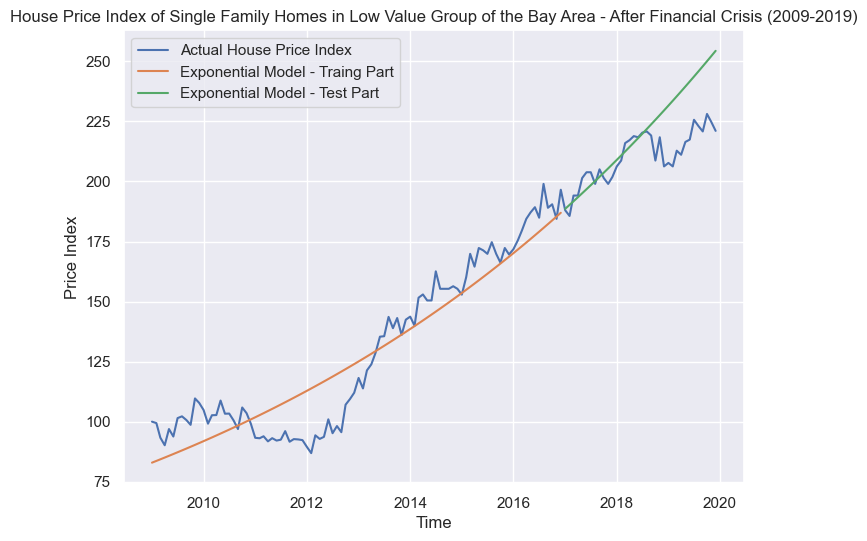

In [191]:
# Plotting the Exponential Model - Cheap Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'])
sns.lineplot(x = train_aft_crisis_che['Time'], y = train_aft_crisis_che['Exponential_Model'])
sns.lineplot(x = test_aft_crisis_che['Time'], y = test_aft_crisis_che['Exponential_Model'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

243.97040496879293
15.619552009222062


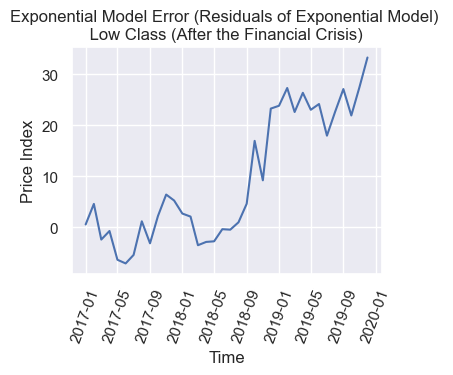

In [192]:
# Exponential Model Error - Cheap Class 

print(mean_squared_error(test_aft_crisis_che['Price Index'], test_aft_crisis_che['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_aft_crisis_che['Price Index'], test_aft_crisis_che['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_aft_crisis_che['Time'], y = test_aft_crisis_che['Exponential_Model'] - test_aft_crisis_che['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Low Class (After the Financial Crisis) ')
plt.show()

### 2 - Medium Class

In [193]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

train_aft_crisis_med = df_aft_crisis_med[df_aft_crisis_med.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_aft_crisis_med = df_aft_crisis_med[df_aft_crisis_med.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_aft_crisis_med = Ridge().fit( 
    X=train_aft_crisis_med[['Julian', 'Const']], 
    y=np.log(train_aft_crisis_med['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_aft_crisis_med['Exponential_Model'] = np.exp(exponential_model_aft_crisis_med.predict(train_aft_crisis_med[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_aft_crisis_med['Exponential_Model'] = np.exp(exponential_model_aft_crisis_med.predict(test_aft_crisis_med[['Julian', 'Const']]))
test_aft_crisis_med['Error_Exponential'] = (test_aft_crisis_med['Exponential_Model'] / test_aft_crisis_med['Price Index'])-1



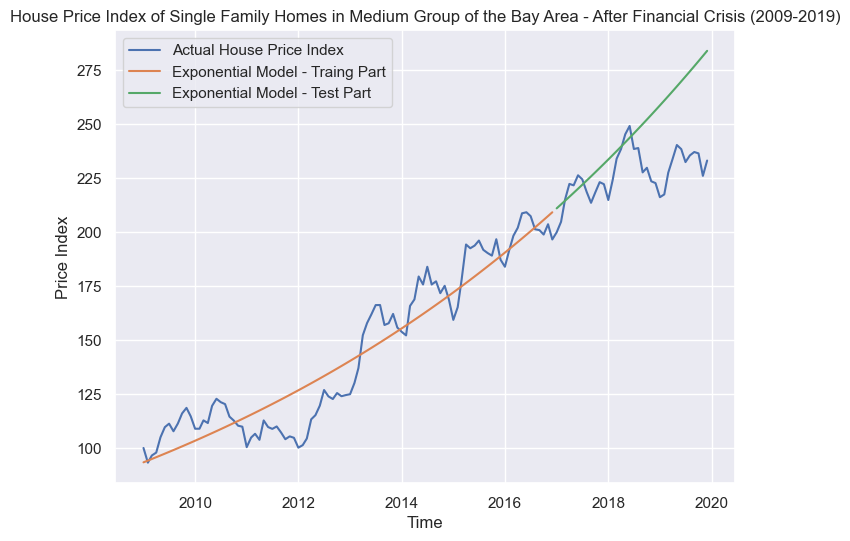

In [194]:
# Plotting the Exponential Model - Medium Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'])
sns.lineplot(x = train_aft_crisis_med['Time'], y = train_aft_crisis_med['Exponential_Model'])
sns.lineplot(x = test_aft_crisis_med['Time'], y = test_aft_crisis_med['Exponential_Model'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

674.3674537475495
25.968585901961422


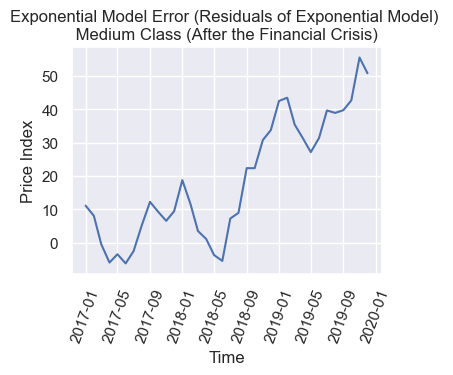

In [195]:
# Exponential Model Error - Medium Class 

print(mean_squared_error(test_aft_crisis_med['Price Index'], test_aft_crisis_med['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_aft_crisis_med['Price Index'], test_aft_crisis_med['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_aft_crisis_med['Time'], y = test_aft_crisis_med['Exponential_Model'] - test_aft_crisis_med['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Medium Class (After the Financial Crisis) ')
plt.show()

### 3 - Expensive Class

In [196]:
# lets split the whole dataset to train and test and check the error of the exponential model 

cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

train_aft_crisis_exp = df_aft_crisis_exp[df_aft_crisis_exp.Time.dt.year < cut_year].dropna(subset=['Price Index'])
test_aft_crisis_exp = df_aft_crisis_exp[df_aft_crisis_exp.Time.dt.year >= cut_year].dropna(subset=['Price Index'])


# We can actually train a simple exponential model using the log(value), then train further models on the error.
exponential_model_aft_crisis_exp = Ridge().fit( 
    X=train_aft_crisis_exp[['Julian', 'Const']], 
    y=np.log(train_aft_crisis_exp['Price Index'])
)

# Add a column for train set if we just use the exponential model (just for visualization)
train_aft_crisis_exp['Exponential_Model'] = np.exp(exponential_model_aft_crisis_exp.predict(train_aft_crisis_exp[['Julian', 'Const']]))

# Adding two columns as predicted value by exponential model and its error
test_aft_crisis_exp['Exponential_Model'] = np.exp(exponential_model_aft_crisis_exp.predict(test_aft_crisis_exp[['Julian', 'Const']]))
test_aft_crisis_exp['Error_Exponential'] = (test_aft_crisis_exp['Exponential_Model'] / test_aft_crisis_exp['Price Index'])-1




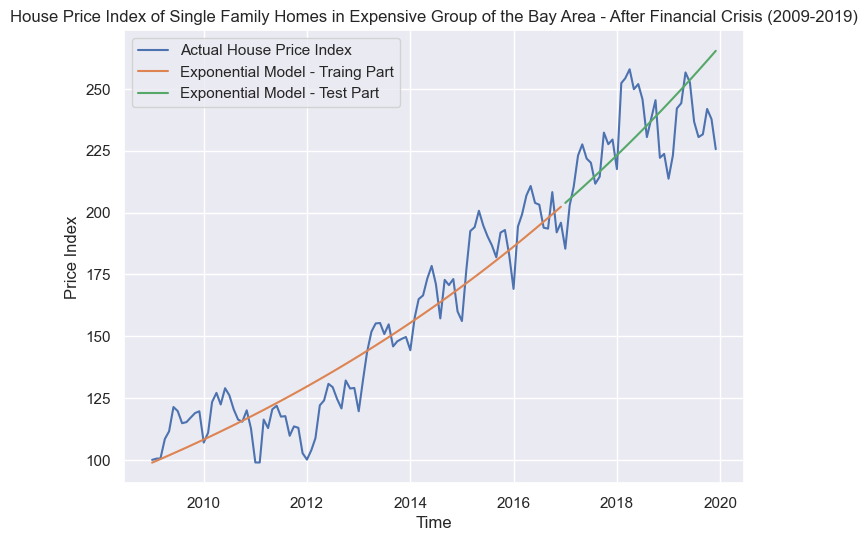

In [197]:
# Plotting the Exponential Model - Medium Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'])
sns.lineplot(x = train_aft_crisis_exp['Time'], y = train_aft_crisis_exp['Exponential_Model'])
sns.lineplot(x = test_aft_crisis_exp['Time'], y = test_aft_crisis_exp['Exponential_Model'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Exponential Model - Traing Part','Exponential Model - Test Part'])
plt.show()

321.3766055759722
17.926979823048057


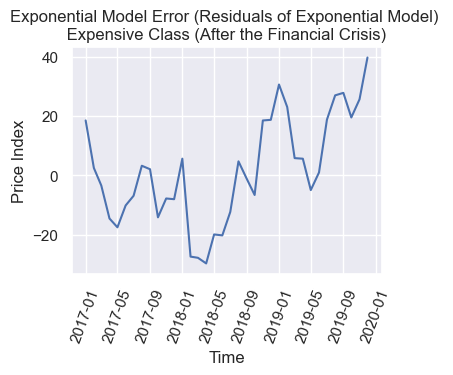

In [198]:
# Exponential Model Error - Medium Class 

print(mean_squared_error(test_aft_crisis_exp['Price Index'], test_aft_crisis_exp['Exponential_Model']))
print (np.sqrt(mean_squared_error(test_aft_crisis_exp['Price Index'], test_aft_crisis_exp['Exponential_Model'])))

plt.figure(figsize=(4,3))
ax = sns.lineplot(x = test_aft_crisis_exp['Time'], y = test_aft_crisis_exp['Exponential_Model'] - test_aft_crisis_exp['Price Index'])
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.xticks(rotation=70)
plt.title('Exponential Model Error (Residuals of Exponential Model) \n Expensive Class (After the Financial Crisis) ')
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

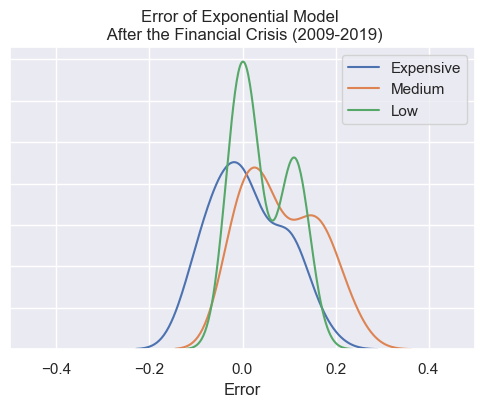

In [199]:
# Histogram of Exponential Model Error Across Value Groups 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_aft_crisis_exp['Error_Exponential'], bins=None, hist=False, kde=True, label='Expensive')
ax_2 = sns.distplot(test_aft_crisis_med['Error_Exponential'], bins=None, hist=False, kde=True, label='Medium')
ax_3 = sns.distplot(test_aft_crisis_che['Error_Exponential'], bins=None, hist=False, kde=True, label='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend()
plt.title('Error of Exponential Model \n After the Financial Crisis (2009-2019)')
plt.show()

Let's check the Error Distribution of the Exponential Model on the drift part. I will compare this later with a polynomial model to see which model (Exponential or Polynomial) fits better on the drift part.

In [200]:
print (test_aft_crisis_exp['Error_Exponential'].describe())

count    36.000000
mean      0.010245
std       0.077614
min      -0.115186
25%      -0.046877
50%       0.006732
75%       0.081378
max       0.176151
Name: Error_Exponential, dtype: float64


As you would see in the above figure, the **Exponential model** does not fit the real house price index very well. 

So in the next, I would try the **Polynomial Model**. 

<br>

<font color='green' size=4> Polynomial Model </font> 

</br>

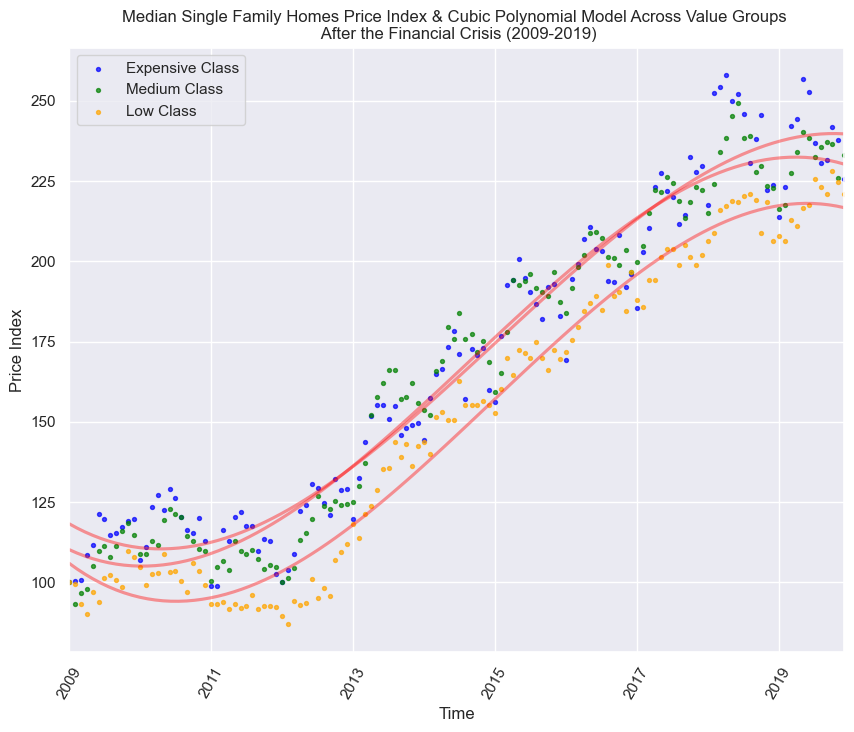

In [201]:
# Polynomial On price index - The whole dataset 

plt.figure(figsize=(10, 8))
ax_1 = sns.regplot(y='Price Index' , x='Julian', data=df_aft_crisis_exp, order=3,scatter_kws={"color": "blue","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Expensive Class')
ax_2 = sns.regplot(y='Price Index' , x='Julian', data=df_aft_crisis_med, order=3,scatter_kws={"color": "green","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Medium Class')
ax_3 = sns.regplot(y='Price Index' , x='Julian', data=df_aft_crisis_che, order=3,scatter_kws={"color": "orange","alpha":0.7,'s':8}, ci=0,  line_kws={"color": "red","alpha":0.4},truncate=True,label='Low Class')
#plt.xlim([2454832.5, 2458818.5])
#print (ax_1.get_xlim())
#plt.ylim([0,1000000])
plt.xticks(np.arange(2454832.5,2458818.5, step = 365*2),  labels = np.arange(2009,2021,step=2),rotation=60)
plt.ylabel('Price Index')
plt.xlabel('Time')

ax_1.legend()
ax_2.legend()
ax_3.legend()
plt.title('Median Single Family Homes Price Index & Cubic Polynomial Model Across Value Groups \n After the Financial Crisis (2009-2019)')
plt.show()

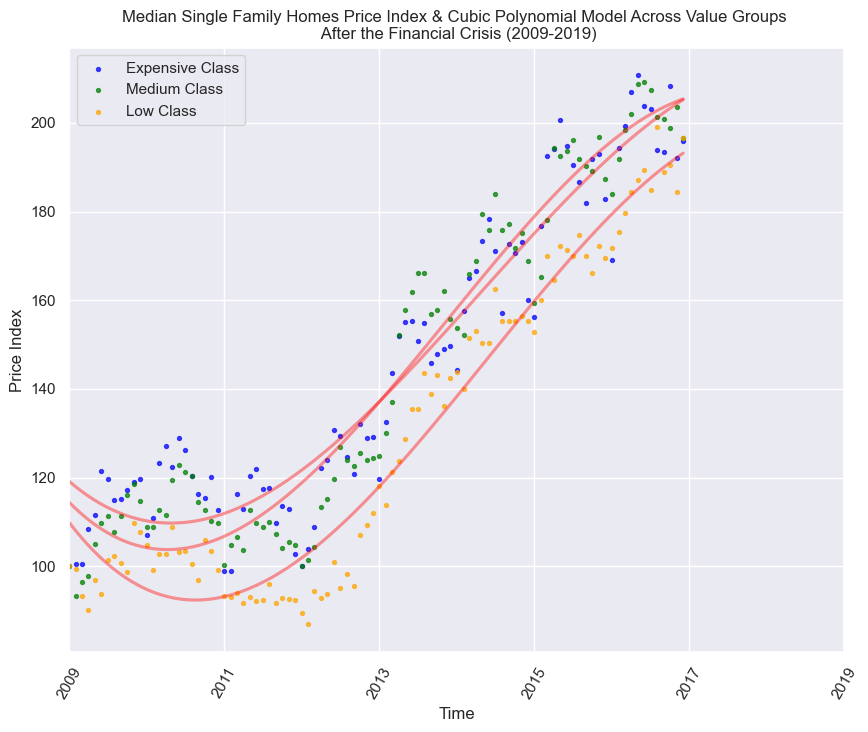

In [202]:
# Polynomial On price index - The training dataset 


plt.figure(figsize=(10, 8))
ax_1 = sns.regplot(y='Price Index' , x='Julian', data=train_aft_crisis_exp, order=3,scatter_kws={"color": "blue","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Expensive Class')
ax_2 = sns.regplot(y='Price Index' , x='Julian', data=train_aft_crisis_med, order=3,scatter_kws={"color": "green","alpha":0.7,'s':8}, ci=0, line_kws={"color": "red","alpha":0.4},truncate=True,label='Medium Class')
ax_3 = sns.regplot(y='Price Index' , x='Julian', data=train_aft_crisis_che, order=3,scatter_kws={"color": "orange","alpha":0.7,'s':8}, ci=0,  line_kws={"color": "red","alpha":0.4},truncate=True,label='Low Class')
plt.xticks(np.arange(2454832.5,2458818.5, step = 365*2),  labels = np.arange(2009,2021,step=2),rotation=60)
plt.ylabel('Price Index')
plt.xlabel('Time')
ax_1.legend()
ax_2.legend()
ax_3.legend()
plt.title('Median Single Family Homes Price Index & Cubic Polynomial Model Across Value Groups \n After the Financial Crisis (2009-2019)')
plt.show()

Now, let's fit the **Cubic Polynomial** model on 3 value groups (Expensive, Medium, Cheap): 

### 1 - Cheap Class

In [203]:
# 'Cheap Class' after the financial crisis (2009-2019)
c, stats = polynomial.polyfit(train_aft_crisis_che['Julian'],train_aft_crisis_che['Price Index'],3,full=True)
train_aft_crisis_che['Poly_Model'] = train_aft_crisis_che['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_aft_crisis_che['Error_Poly'] = (train_aft_crisis_che['Poly_Model']/train_aft_crisis_che['Price Index']) - 1 
test_aft_crisis_che['Poly_Model'] = test_aft_crisis_che['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_aft_crisis_che['Error_Poly'] = (test_aft_crisis_che['Poly_Model']/test_aft_crisis_che['Price Index']) - 1

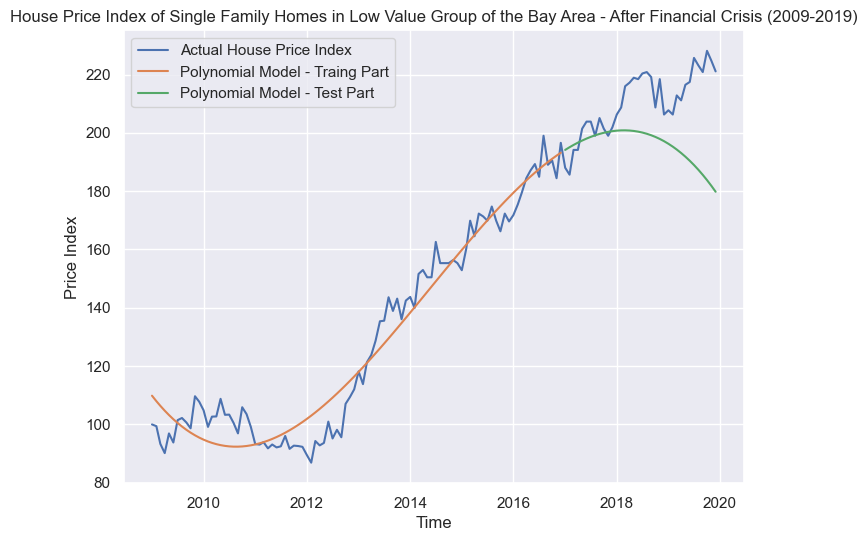

In [204]:
# Plotting the Polynomial Model - Cheap Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'])
sns.lineplot(x = train_aft_crisis_che['Time'], y = train_aft_crisis_che['Poly_Model'])
sns.lineplot(x = test_aft_crisis_che['Time'], y = test_aft_crisis_che['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

### 2 - Medium Class

In [205]:
# 'Medium Class' after the financial crisis (2009-2019)
c, stats = polynomial.polyfit(train_aft_crisis_med['Julian'],train_aft_crisis_med['Price Index'],3,full=True)
train_aft_crisis_med['Poly_Model'] = train_aft_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_aft_crisis_med['Error_Poly'] = (train_aft_crisis_med['Poly_Model']/train_aft_crisis_med['Price Index']) - 1 
test_aft_crisis_med['Poly_Model'] = test_aft_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_aft_crisis_med['Error_Poly'] = (test_aft_crisis_med['Poly_Model']/test_aft_crisis_med['Price Index']) - 1 

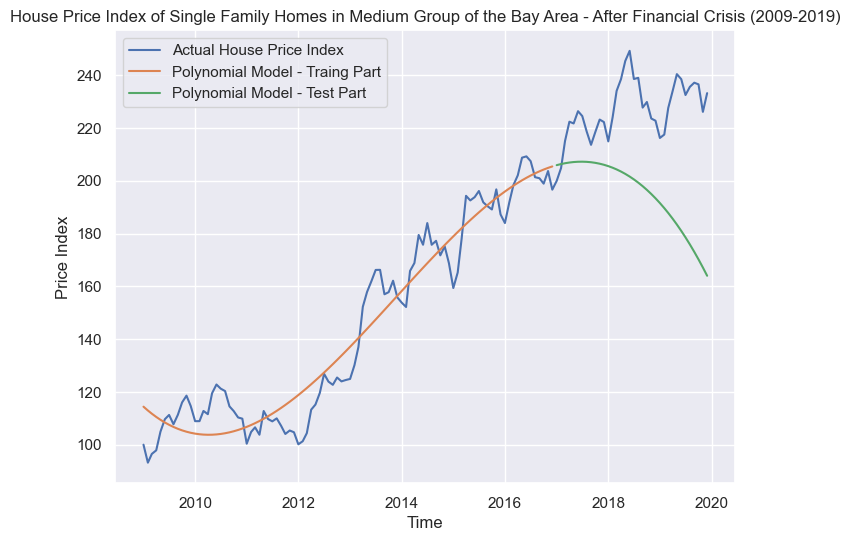

In [206]:
# Plotting the Exponential Model - Medium Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'])
sns.lineplot(x = train_aft_crisis_med['Time'], y = train_aft_crisis_med['Poly_Model'])
sns.lineplot(x = test_aft_crisis_med['Time'], y = test_aft_crisis_med['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

### 3 - Expensive Class

In [207]:
# 'Expensive Class' before the financial crisis (1990 - 2006)
c, stats = polynomial.polyfit(train_aft_crisis_exp['Julian'],train_aft_crisis_exp['Price Index'],3,full=True)
train_aft_crisis_exp['Poly_Model'] = train_aft_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
train_aft_crisis_exp['Error_Poly'] = (train_aft_crisis_exp['Poly_Model']/train_aft_crisis_exp['Price Index']) - 1 
test_aft_crisis_exp['Poly_Model'] = test_aft_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
test_aft_crisis_exp['Error_Poly'] = (test_aft_crisis_exp['Poly_Model']/test_aft_crisis_exp['Price Index']) - 1

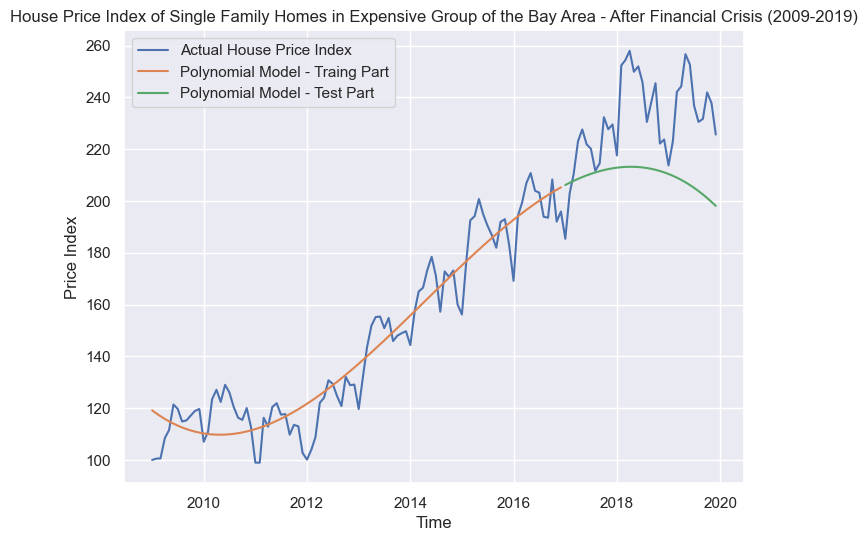

In [208]:
# Plotting the Exponential Model - Expensive Class After Crisis
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'])
sns.lineplot(x = train_aft_crisis_exp['Time'], y = train_aft_crisis_exp['Poly_Model'])
sns.lineplot(x = test_aft_crisis_exp['Time'], y = test_aft_crisis_exp['Poly_Model'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Polynomial Model - Traing Part','Polynomial Model - Test Part'])
plt.show()

In [209]:
print (train_aft_crisis_exp['Error_Poly'].describe())
print (test_aft_crisis_exp['Error_Poly'].describe())

count    96.000000
mean      0.005389
std       0.077567
min      -0.148923
25%      -0.050262
50%      -0.008430
75%       0.045517
max       0.215403
Name: Error_Poly, dtype: float64
count    36.000000
mean     -0.091930
std       0.067685
min      -0.192777
25%      -0.147143
50%      -0.098099
75%      -0.052406
max       0.111941
Name: Error_Poly, dtype: float64


/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

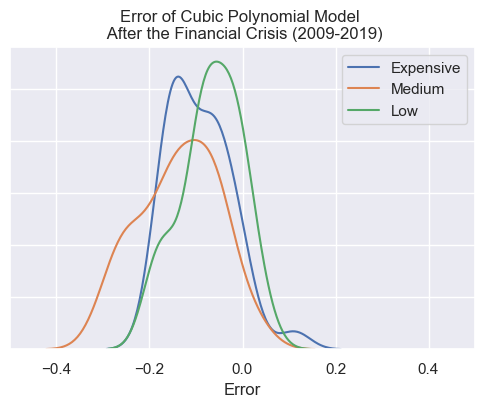

In [210]:
# Histogram of Polynomial Model Error Across Value Groups 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_aft_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Expensive')
ax_2 = sns.distplot(test_aft_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Medium')
ax_3 = sns.distplot(test_aft_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend()
plt.title('Error of Cubic Polynomial Model \n After the Financial Crisis (2009-2019)')
plt.show()

<br>

Now it's time to compare Exponential and Polynomial Model Test Errors. 


<br>

In [211]:
# Comparing Tset Errors of Polynomial Vs Exponential Model on drift part 

# 1 - Expensive Class
print (test_aft_crisis_exp['Error_Exponential'].describe())
print (test_aft_crisis_exp['Error_Poly'].describe())

# 2 - Medium Class
print (test_aft_crisis_med['Error_Exponential'].describe())
print (test_aft_crisis_med['Error_Poly'].describe())

# 3 - Cheap Class
print (test_aft_crisis_che['Error_Exponential'].describe())
print (test_aft_crisis_che['Error_Poly'].describe())

count    36.000000
mean      0.010245
std       0.077614
min      -0.115186
25%      -0.046877
50%       0.006732
75%       0.081378
max       0.176151
Name: Error_Exponential, dtype: float64
count    36.000000
mean     -0.091930
std       0.067685
min      -0.192777
25%      -0.147143
50%      -0.098099
75%      -0.052406
max       0.111941
Name: Error_Poly, dtype: float64
count    36.000000
mean      0.082233
std       0.079677
min      -0.027510
25%       0.021674
50%       0.056442
75%       0.152660
max       0.245764
Name: Error_Exponential, dtype: float64
count    36.000000
mean     -0.136359
std       0.085262
min      -0.296687
25%      -0.194994
50%      -0.129444
75%      -0.072009
max       0.029878
Name: Error_Poly, dtype: float64
count    36.000000
mean      0.044197
std       0.058131
min      -0.034630
25%      -0.002396
50%       0.023010
75%       0.106423
max       0.150720
Name: Error_Exponential, dtype: float64
count    36.000000
mean     -0.067164
std       0.0645

In contrast to before the financial crisis, as you would see, the **average test error of the exponential model is much lower than the test error of the polynomial model across all value groups**. So I will use the exponential model to get the residuals from the actual value, and in the next part, I will model seasonality using the residuals. 

<br>

Now it's time to model the seasonality on residuals of drift part. 

<br>

## B - Modeling Seasonality

As I mentioned, the big difference between before and after the financial crisis is that the exponential model fits better on the drift part than the polynomial model after the financial crisis single-family price index. 

### 1 - Cheap Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


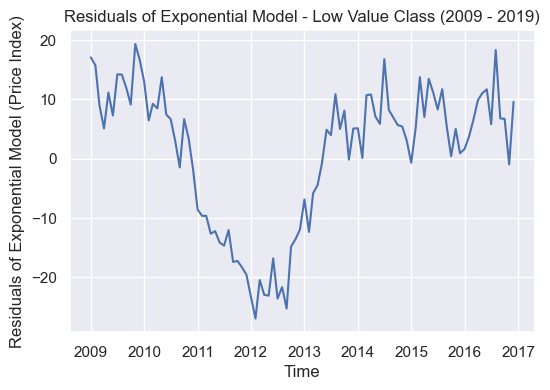

In [212]:
## Add new column as 'residual_exponential_model' to both train and test set and visualzie it:

train_aft_crisis_che['Residual_Exponential_Model'] = train_aft_crisis_che['Price Index'] - train_aft_crisis_che['Exponential_Model']
test_aft_crisis_che['Residual_Exponential_Model'] = test_aft_crisis_che['Price Index'] - test_aft_crisis_che['Exponential_Model']

## Visualize the residual of the Exponential drift: 

ax = sns.lineplot(train_aft_crisis_che['Time'],train_aft_crisis_che['Residual_Exponential_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Exponential Model (Price Index)')
plt.title('Residuals of Exponential Model - Low Value Class (2009 - 2019)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 8 years (132->96 timestamps=months)')

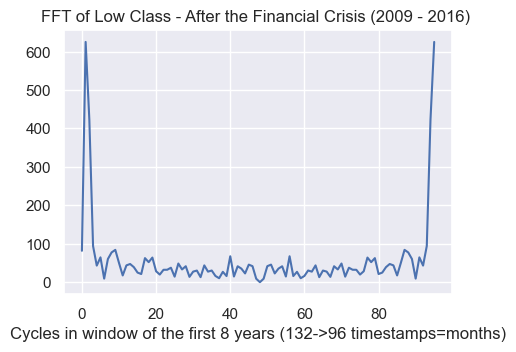

In [213]:
# Let's check the output of Fast Fourier Transform of Cheap Class median price

fft_train_aft_crisis_che = fftpack.fft(train_aft_crisis_che['Residual_Exponential_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_aft_crisis_che))
plt.title('FFT of Low Class - After the Financial Crisis (2009 - 2016) ')
plt.xlabel('Cycles in window of the first 8 years (132->96 timestamps=months)')

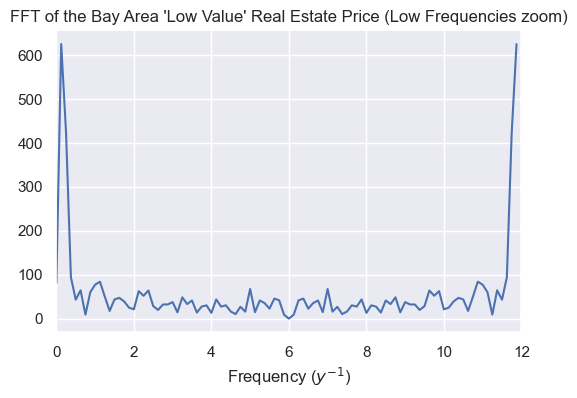

In [214]:
plt.figure(figsize = (6,4))
plt.plot(1./8*np.arange(len(fft_train_aft_crisis_che)), np.abs(fft_train_aft_crisis_che)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Low Value' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

Let's zoom in: 

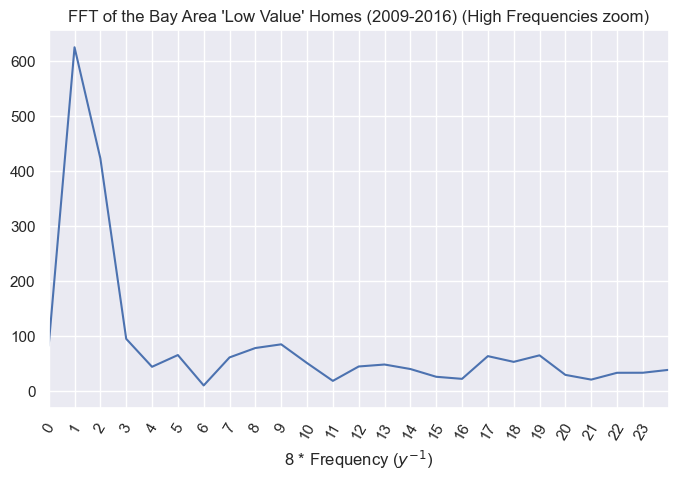

In [215]:
# Zoom in figure of FFT Bay Area (2009 - 2019 --> 2016)
monthly_cycles_in_8_years = 8*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./8),rotation=60, labels=np.arange(0,24))
plt.plot(1./8 * np.arange(len(fft_train_aft_crisis_che)), np.abs(fft_train_aft_crisis_che))
plt.title("FFT of the Bay Area 'Low Value' Homes (2009-2016) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('8 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **8** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 1), so it is basically: 

**1/8 = 1/Year -> Year = 8/1 = 8 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Cheap Class Bay Area - 2009 to 2016)

In [216]:
# FFt output is complex number, we just need the real part

fft_train_aft_crisis_abs_che = np.abs(fft_train_aft_crisis_che)
train_aft_crisis_cycles_che = pd.DataFrame(data=fft_train_aft_crisis_abs_che, columns=['FFT Absolute Value'])

In [217]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (96/2 = 48)

train_aft_crisis_cycles_che.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
1,624.911466
2,422.824056
3,94.483620
9,84.440325
0,82.048390
8,77.732303
40,67.857059
5,64.931562
19,64.422665
17,62.962662


Based on the above figure and table,  I separated the top 7 periods with a relatively high FFT Absolute Value ***(indices: 1, 2, 3, 9, 8, 40, 5)***.

Zero index means infinity which does not make sense.

Here are the 7 biggest periods of our **Cheap Class After the Financial Crisis (2009 - 2016)**: 

In [218]:
train_aft_crisis_cycles_che_top = train_aft_crisis_cycles_che.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).iloc[:8].drop(0)
train_aft_crisis_cycles_che_top['Cycle(year)'] = train_aft_crisis_cycles_che_top.index.map(lambda x : 8./x)
print (train_aft_crisis_cycles_che_top)

    FFT Absolute Value  Cycle(year)
1           624.911466     8.000000
2           422.824056     4.000000
3            94.483620     2.666667
9            84.440325     0.888889
8            77.732303     1.000000
40           67.857059     0.200000
5            64.931562     1.600000


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **: 8 , 4 , 2.66 , 0.88 , 1 , 0.2 , 1.6  years**.

In [219]:
# 8 years -> (should I change 365.25 * 8 since, it is night the same thing as 8 years)
train_aft_crisis_che['sin(8years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*8) * 2 * np.pi)
train_aft_crisis_che['cos(8years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*8) * 2 * np.pi)

# 4 years 
train_aft_crisis_che['sin(4years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*4) * 2 * np.pi)
train_aft_crisis_che['cos(4years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*4) * 2 * np.pi)

# 2.66 years 
train_aft_crisis_che['sin(2.66years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*2.66) * 2 * np.pi)
train_aft_crisis_che['cos(2.66years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.88 year
train_aft_crisis_che['sin(0.88years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*0.88) * 2 * np.pi)
train_aft_crisis_che['cos(0.88years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*0.88) * 2 * np.pi)

# 1 years 
train_aft_crisis_che['sin(1years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*1) * 2 * np.pi)
train_aft_crisis_che['cos(1years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*1) * 2 * np.pi)

# 0.2 years 
train_aft_crisis_che['sin(0.2years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*.2) * 2 * np.pi)
train_aft_crisis_che['cos(0.2years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*.2) * 2 * np.pi)

# 1.6 years 
train_aft_crisis_che['sin(1.6years)'] = np.sin(train_aft_crisis_che['Julian']/(365.25*1.6) * 2 * np.pi)
train_aft_crisis_che['cos(1.6years)'] = np.cos(train_aft_crisis_che['Julian']/(365.25*1.6) * 2 * np.pi)

Add columns to test dataset:

In [220]:
# 8 years -> (should I change 365.25 * 8 since, it is night the same thing as 8 years)
test_aft_crisis_che['sin(8years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*8) * 2 * np.pi)
test_aft_crisis_che['cos(8years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*8) * 2 * np.pi)

# 4 years 
test_aft_crisis_che['sin(4years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*4) * 2 * np.pi)
test_aft_crisis_che['cos(4years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*4) * 2 * np.pi)

# 2.66 years 
test_aft_crisis_che['sin(2.66years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*2.66) * 2 * np.pi)
test_aft_crisis_che['cos(2.66years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.88 year
test_aft_crisis_che['sin(0.88years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*0.88) * 2 * np.pi)
test_aft_crisis_che['cos(0.88years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*0.88) * 2 * np.pi)

# 1 years 
test_aft_crisis_che['sin(1years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*1) * 2 * np.pi)
test_aft_crisis_che['cos(1years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*1) * 2 * np.pi)

# 0.2 years 
test_aft_crisis_che['sin(0.2years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*.2) * 2 * np.pi)
test_aft_crisis_che['cos(0.2years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*.2) * 2 * np.pi)

# 1.6 years 
test_aft_crisis_che['sin(1.6years)'] = np.sin(test_aft_crisis_che['Julian']/(365.25*1.6) * 2 * np.pi)
test_aft_crisis_che['cos(1.6years)'] = np.cos(test_aft_crisis_che['Julian']/(365.25*1.6) * 2 * np.pi)

#### 1 - Full Model Without Noise Correction

138.66759575175877
11.775720604351937


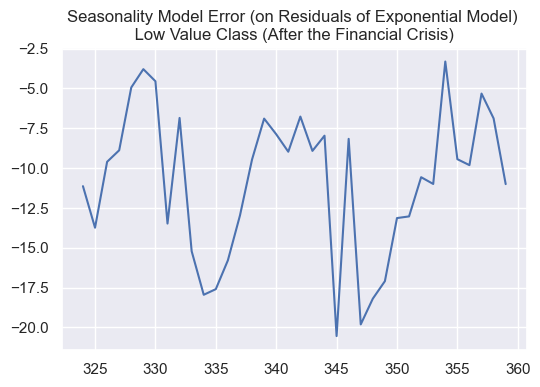

In [221]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

regress = LinearRegression().fit( 
        X=train_aft_crisis_che[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)',
                           'sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']], 
        y=train_aft_crisis_che['Residual_Exponential_Model'])

train_aft_crisis_che['Predicted_Residual'] = regress.predict(X=train_aft_crisis_che[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']]) 
test_aft_crisis_che['Predicted_Residual'] = regress.predict(X=test_aft_crisis_che[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']]) 
        
(test_aft_crisis_che['Residual_Exponential_Model'] - test_aft_crisis_che['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Exponential Model) \n Low Value Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_che['Residual_Exponential_Model'], test_aft_crisis_che['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_aft_crisis_che['Residual_Exponential_Model'], test_aft_crisis_che['Predicted_Residual'])))

In [222]:
train_aft_crisis_che['Final_Predicted_Value'] = train_aft_crisis_che['Exponential_Model'] + train_aft_crisis_che['Predicted_Residual']
test_aft_crisis_che['Final_Predicted_Value'] = test_aft_crisis_che['Exponential_Model'] + test_aft_crisis_che['Predicted_Residual']

In [223]:
# Calculate the Test and Training Error
train_aft_crisis_che['Error_Full_Model'] = (train_aft_crisis_che['Final_Predicted_Value']/train_aft_crisis_che['Price Index'])-1
test_aft_crisis_che['Error_Full_Model'] = (test_aft_crisis_che['Final_Predicted_Value']/test_aft_crisis_che['Price Index'])-1

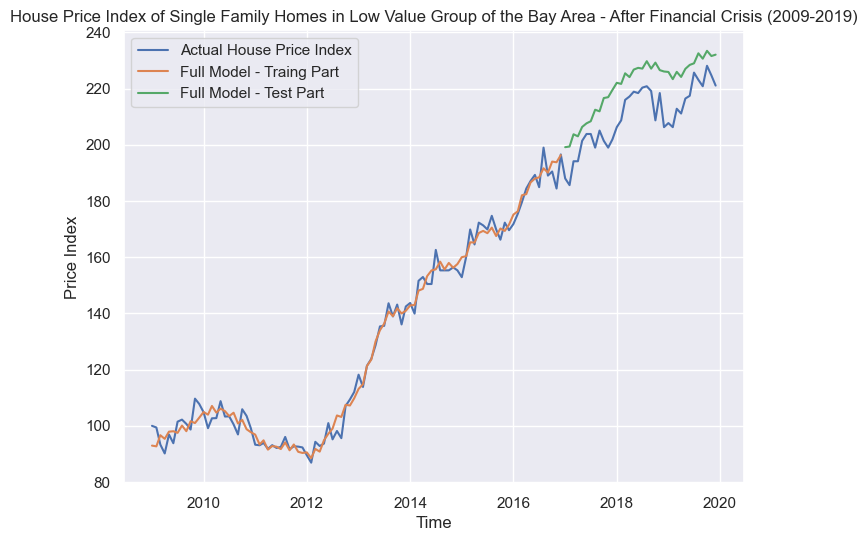

In [224]:
# Plotting the Full Model (Polynomial + Seasonality) - Cheap Class After Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'])
sns.lineplot(x = train_aft_crisis_che['Time'], y = train_aft_crisis_che['Final_Predicted_Value'])
sns.lineplot(x = test_aft_crisis_che['Time'], y = test_aft_crisis_che['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

Let's compare the error of different models: 

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

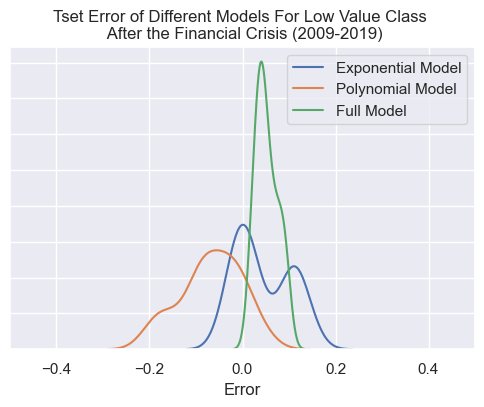

In [225]:
# Compare the Test Error of Full Model (Exponential + seasonality) with Polynomial Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_aft_crisis_che['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_aft_crisis_che['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Low Value Class \n After the Financial Crisis (2009-2019)')
plt.show()

#### 2 - Full Model With Noise Correction 

In [226]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_aft_crisis_che['Seasonality_Model_Goal'] = train_aft_crisis_che['Residual_Exponential_Model'].shift(-2)
test_aft_crisis_che['Seasonality_Model_Goal'] = test_aft_crisis_che['Residual_Exponential_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_aft_crisis_che.loc[322 , 'Seasonality_Model_Goal'] = test_aft_crisis_che['Residual_Exponential_Model'].iloc[0]
train_aft_crisis_che.loc[323 , 'Seasonality_Model_Goal'] = test_aft_crisis_che['Residual_Exponential_Model'].iloc[1]

138.52154518876307
11.769517627700935


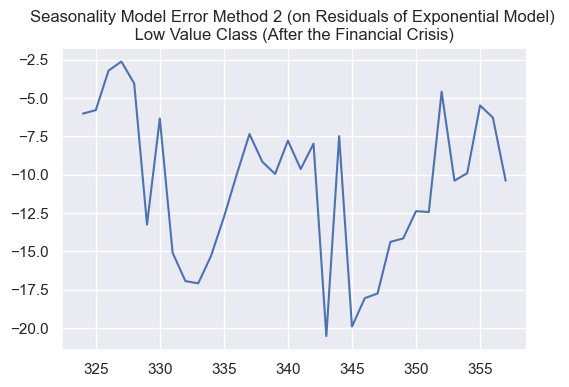

In [227]:
# Fit the regression model on Exponential model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_aft_crisis_che[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)', 'sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']], 
        y=train_aft_crisis_che['Seasonality_Model_Goal'])

train_aft_crisis_che['Predicted_Residual_2'] = regress_2.predict(X=train_aft_crisis_che[['Residual_Exponential_Model',  'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']]) 
        
test_aft_crisis_che['Predicted_Residual_2'] = regress_2.predict(X=test_aft_crisis_che[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)', 'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.2years)','cos(0.2years)','sin(1.6years)','cos(1.6years)']])
# These predicted values should be shifted back 

(test_aft_crisis_che['Seasonality_Model_Goal'] - test_aft_crisis_che['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Exponential Model) \n Low Value Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_che['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_che['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_aft_crisis_che['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_che['Predicted_Residual_2'].iloc[:-2])))

### Adding Back Seasonality and Drift

In [228]:
# Shifted back predicted residuals to two months in advance

train_aft_crisis_che['Shifted_Back_Predicted_Residual_2'] = train_aft_crisis_che['Predicted_Residual_2'].shift(2)
test_aft_crisis_che['Shifted_Back_Predicted_Residual_2'] = test_aft_crisis_che['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to exponential model

train_aft_crisis_che['Final_Predicted_Value_2'] = train_aft_crisis_che['Exponential_Model'] + train_aft_crisis_che['Shifted_Back_Predicted_Residual_2']
test_aft_crisis_che['Final_Predicted_Value_2'] = test_aft_crisis_che['Exponential_Model'] + test_aft_crisis_che['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Exponential + Seasonality + 2 months beforehand residuals)
test_aft_crisis_che['Error_Full_Model_2'] = (test_aft_crisis_che['Final_Predicted_Value_2'] / test_aft_crisis_che['Price Index'])-1
train_aft_crisis_che['Error_Full_Model_2'] = (train_aft_crisis_che['Final_Predicted_Value_2'] / train_aft_crisis_che['Price Index'])-1

In [229]:
print (train_aft_crisis_che['Error_Full_Model_2'].describe())

print (test_aft_crisis_che['Error_Full_Model_2'].describe())
print (test_aft_crisis_che['Error_Full_Model'].describe())

count    94.000000
mean     -0.000768
std       0.027338
min      -0.089311
25%      -0.017231
50%      -0.002071
75%       0.015903
max       0.080640
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean      0.050920
std       0.024374
min       0.012832
25%       0.031677
50%       0.045913
75%       0.067437
max       0.098351
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean      0.052126
std       0.023378
min       0.014658
25%       0.035321
50%       0.047277
75%       0.069299
max       0.098423
Name: Error_Full_Model, dtype: float64


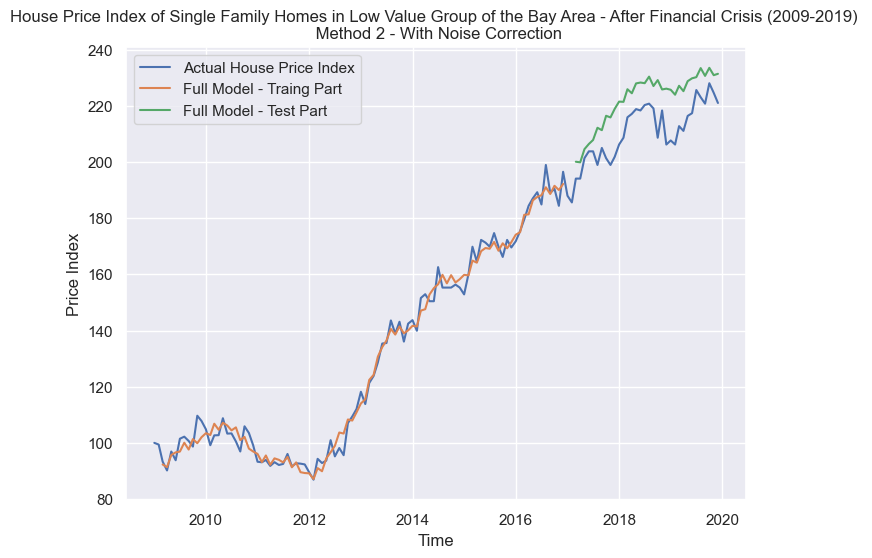

In [230]:
# Plotting the Full Model Method 2(Exponential + Seasonality + 2 months beforehand correction) 
# Cheap Class after Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'])
sns.lineplot(x = train_aft_crisis_che['Time'], y = train_aft_crisis_che['Final_Predicted_Value_2'])
sns.lineplot(x = test_aft_crisis_che['Time'], y = test_aft_crisis_che['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Low Value Group of the Bay Area - After Financial Crisis (2009-2019) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

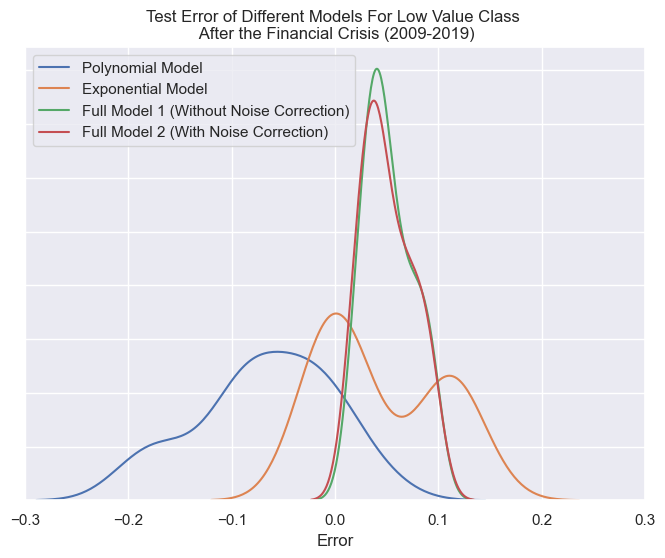

In [231]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_aft_crisis_che['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_4 = sns.distplot(test_aft_crisis_che['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_che['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_aft_crisis_che['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.3,0.3)
plt.legend(loc='upper left')
plt.title('Test Error of Different Models For Low Value Class \n After the Financial Crisis (2009-2019)')
plt.show()

In [232]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_aft_crisis_che['Error_Exponential']),3),round(np.median(test_aft_crisis_che['Error_Exponential']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_aft_crisis_che['Error_Full_Model']),3),round(np.nanmedian(test_aft_crisis_che['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_aft_crisis_che['Error_Full_Model_2']),3),round(np.nanmedian(test_aft_crisis_che['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: 0.044 , 0.023
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): 0.052 , 0.047
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): 0.051 , 0.046


In [233]:
# std deviation of error - Exponential Model vs Final Model 1 vs Final Model 2
print (round(test_aft_crisis_che['Error_Exponential'].std(),3))
print (round(test_aft_crisis_che['Error_Full_Model'].std(),3))
print (round(test_aft_crisis_che['Error_Full_Model_2'].std(),3))

0.058
0.023
0.024


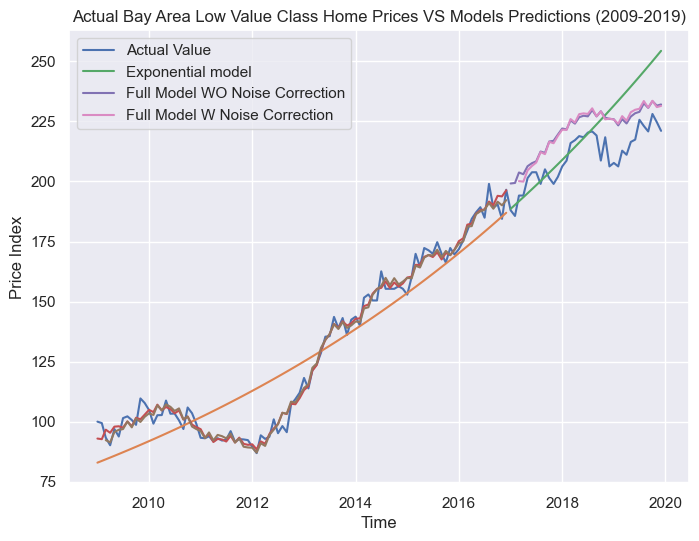

In [234]:
# Plot All models together (Exponential , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_aft_crisis_che['Time'],y = train_aft_crisis_che['Exponential_Model'])
ax_3 = sns.lineplot(x = test_aft_crisis_che['Time'],y = test_aft_crisis_che['Exponential_Model'], label= 'Exponential model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_aft_crisis_che['Time'],y=train_aft_crisis_che['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_aft_crisis_che['Time'],y=test_aft_crisis_che['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_aft_crisis_che['Time'],y=train_aft_crisis_che['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_aft_crisis_che['Time'],y=test_aft_crisis_che['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Low Value Class Home Prices VS Models Predictions (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

### 2 - Medium Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


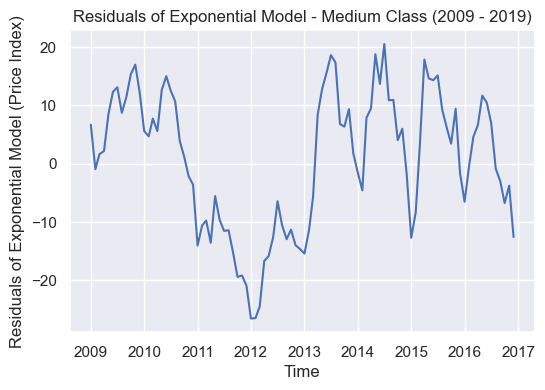

In [235]:
## Add new column as 'residual_exponential_model' to both train and test set and visualzie it:

train_aft_crisis_med['Residual_Exponential_Model'] = train_aft_crisis_med['Price Index'] - train_aft_crisis_med['Exponential_Model']
test_aft_crisis_med['Residual_Exponential_Model'] = test_aft_crisis_med['Price Index'] - test_aft_crisis_med['Exponential_Model']

## Visualize the residual of the Exponential drift: 

ax = sns.lineplot(train_aft_crisis_med['Time'],train_aft_crisis_med['Residual_Exponential_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Exponential Model (Price Index)')
plt.title('Residuals of Exponential Model - Medium Class (2009 - 2019)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 8 years (132->96 timestamps=months)')

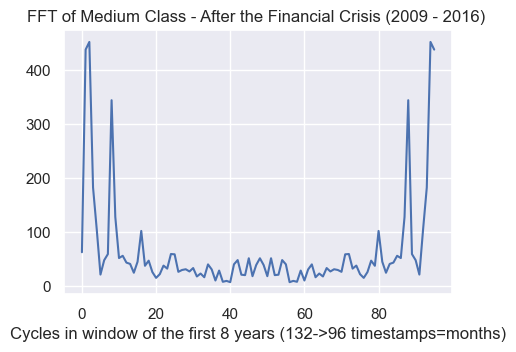

In [236]:
# Let's check the output of Fast Fourier Transform of Medium Class median price

fft_train_aft_crisis_med = fftpack.fft(train_aft_crisis_med['Residual_Exponential_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_aft_crisis_med))
plt.title('FFT of Medium Class - After the Financial Crisis (2009 - 2016) ')
plt.xlabel('Cycles in window of the first 8 years (132->96 timestamps=months)')

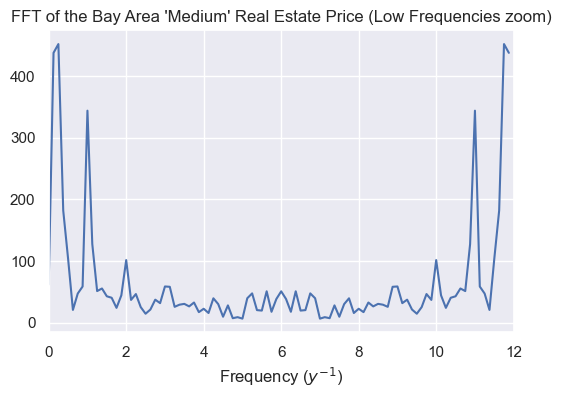

In [237]:
plt.figure(figsize = (6,4))
plt.plot(1./8*np.arange(len(fft_train_aft_crisis_med)), np.abs(fft_train_aft_crisis_med)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Medium' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

Let's Zoom in:

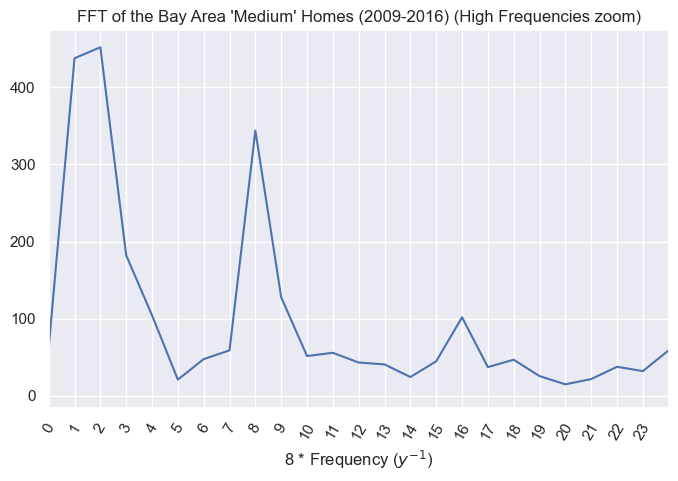

In [238]:
# Zoom in figure of FFT Bay Area (2009 - 2019 --> 2016)
monthly_cycles_in_8_years = 8*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./8),rotation=60, labels=np.arange(0,24))
plt.plot(1./8 * np.arange(len(fft_train_aft_crisis_med)), np.abs(fft_train_aft_crisis_med))
plt.title("FFT of the Bay Area 'Medium' Homes (2009-2016) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('8 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **8** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 1), so it is basically: 

**1/8 = 1/Year -> Year = 8/2 = 4 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Medium Class Bay Area - 2009 to 2016)

In [239]:
# FFt output is complex number, we just need the real part

fft_train_aft_crisis_abs_med = np.abs(fft_train_aft_crisis_med)
train_aft_crisis_cycles_med = pd.DataFrame(data=fft_train_aft_crisis_abs_med, columns=['FFT Absolute Value'])

In [240]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (96/2 = 48)

train_aft_crisis_cycles_med.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
2,452.066754
1,437.857500
8,344.024862
3,182.109680
9,127.601949
4,104.231366
16,101.657608
0,62.173150
24,58.850000
7,58.764894


Based on the above figure and table,  I separated the top 7 periods with a relatively high FFT Absolute Value ***(indices: 2, 1, 8, 3 , 9 , 4 , 16)***. 

Here are the 7 biggest periods of our **Medium Class After the Financial Crisis (2009 - 2016)**: 

In [241]:
train_aft_crisis_cycles_med_top = train_aft_crisis_cycles_med.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).iloc[:7]
train_aft_crisis_cycles_med_top['Cycle(year)'] = train_aft_crisis_cycles_med_top.index.map(lambda x : 8./x)
print (train_aft_crisis_cycles_med_top)

    FFT Absolute Value  Cycle(year)
2           452.066754     4.000000
1           437.857500     8.000000
8           344.024862     1.000000
3           182.109680     2.666667
9           127.601949     0.888889
4           104.231366     2.000000
16          101.657608     0.500000


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **:  4 , 8 , 1 , 2.66 , 0.88 , 2 , 0.5 years**.

In [242]:
# 4 years 
train_aft_crisis_med['sin(4years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*4) * 2 * np.pi)
train_aft_crisis_med['cos(4years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*4) * 2 * np.pi)

# 8 years 
train_aft_crisis_med['sin(8years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*8) * 2 * np.pi)
train_aft_crisis_med['cos(8years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*8) * 2 * np.pi)

# 1 years 
train_aft_crisis_med['sin(1years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*1) * 2 * np.pi)
train_aft_crisis_med['cos(1years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*1) * 2 * np.pi)


# 2.66 years 
train_aft_crisis_med['sin(2.66years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*2.66) * 2 * np.pi)
train_aft_crisis_med['cos(2.66years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.88 year
train_aft_crisis_med['sin(0.88years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*0.88) * 2 * np.pi)
train_aft_crisis_med['cos(0.88years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*0.88) * 2 * np.pi)


# 2 years 
train_aft_crisis_med['sin(2years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*2) * 2 * np.pi)
train_aft_crisis_med['cos(2years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*2) * 2 * np.pi)

# 0.5 years 
train_aft_crisis_med['sin(0.5years)'] = np.sin(train_aft_crisis_med['Julian']/(365.25*0.5) * 2 * np.pi)
train_aft_crisis_med['cos(0.5years)'] = np.cos(train_aft_crisis_med['Julian']/(365.25*0.5) * 2 * np.pi)

Add columns to test dataset:

In [243]:
# 4 years 
test_aft_crisis_med['sin(4years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*4) * 2 * np.pi)
test_aft_crisis_med['cos(4years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*4) * 2 * np.pi)

# 8 years 
test_aft_crisis_med['sin(8years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*8) * 2 * np.pi)
test_aft_crisis_med['cos(8years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*8) * 2 * np.pi)

# 1 years 
test_aft_crisis_med['sin(1years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*1) * 2 * np.pi)
test_aft_crisis_med['cos(1years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*1) * 2 * np.pi)


# 2.66 years 
test_aft_crisis_med['sin(2.66years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*2.66) * 2 * np.pi)
test_aft_crisis_med['cos(2.66years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.88 year
test_aft_crisis_med['sin(0.88years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*0.88) * 2 * np.pi)
test_aft_crisis_med['cos(0.88years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*0.88) * 2 * np.pi)


# 2 years 
test_aft_crisis_med['sin(2years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*2) * 2 * np.pi)
test_aft_crisis_med['cos(2years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*2) * 2 * np.pi)

# 0.5 years 
test_aft_crisis_med['sin(0.5years)'] = np.sin(test_aft_crisis_med['Julian']/(365.25*0.5) * 2 * np.pi)
test_aft_crisis_med['cos(0.5years)'] = np.cos(test_aft_crisis_med['Julian']/(365.25*0.5) * 2 * np.pi)

#### 1 - Full Model Without Noise Correction

445.2242888576896
21.100338595806694


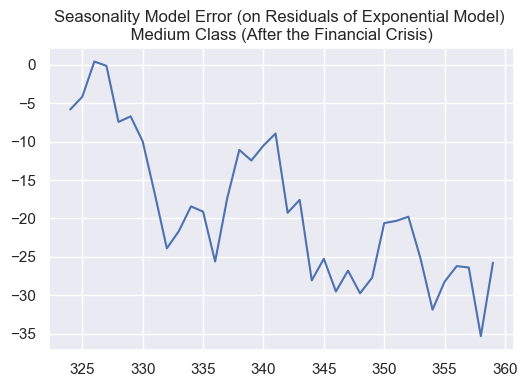

In [244]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

regress = LinearRegression().fit( 
        X=train_aft_crisis_med[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)',
                           'sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']], 
        y=train_aft_crisis_med['Residual_Exponential_Model'])

train_aft_crisis_med['Predicted_Residual'] = regress.predict(X=train_aft_crisis_med[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']]) 
test_aft_crisis_med['Predicted_Residual'] = regress.predict(X=test_aft_crisis_med[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']]) 
        
(test_aft_crisis_med['Residual_Exponential_Model'] - test_aft_crisis_med['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Exponential Model) \n Medium Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_med['Residual_Exponential_Model'], test_aft_crisis_med['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_aft_crisis_med['Residual_Exponential_Model'], test_aft_crisis_med['Predicted_Residual'])))

In [245]:
train_aft_crisis_med['Final_Predicted_Value'] = train_aft_crisis_med['Exponential_Model'] + train_aft_crisis_med['Predicted_Residual']
test_aft_crisis_med['Final_Predicted_Value'] = test_aft_crisis_med['Exponential_Model'] + test_aft_crisis_med['Predicted_Residual']

In [246]:
# Calculate the Test and Training Error
train_aft_crisis_med['Error_Full_Model'] = (train_aft_crisis_med['Final_Predicted_Value']/train_aft_crisis_med['Price Index'])-1
test_aft_crisis_med['Error_Full_Model'] = (test_aft_crisis_med['Final_Predicted_Value']/test_aft_crisis_med['Price Index'])-1

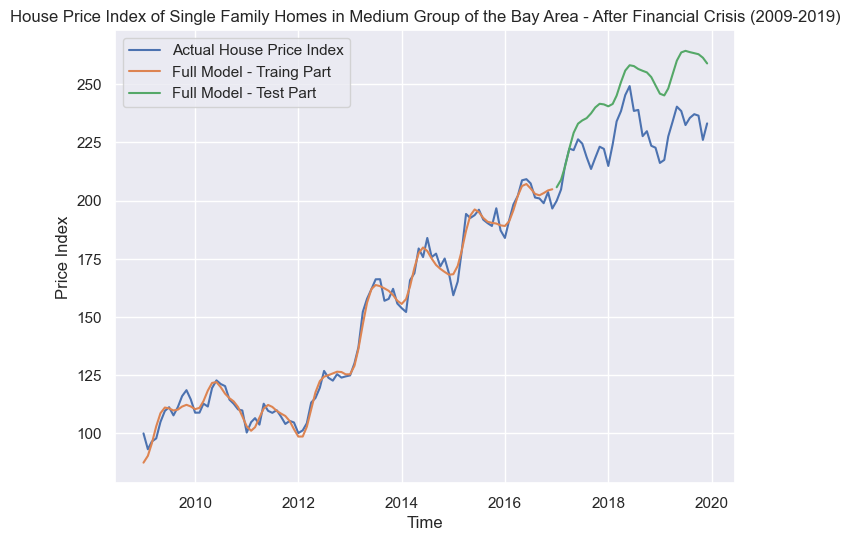

In [247]:
# Plotting the Full Model (Polynomial + Seasonality) - Cheap Class After Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'])
sns.lineplot(x = train_aft_crisis_med['Time'], y = train_aft_crisis_med['Final_Predicted_Value'])
sns.lineplot(x = test_aft_crisis_med['Time'], y = test_aft_crisis_med['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

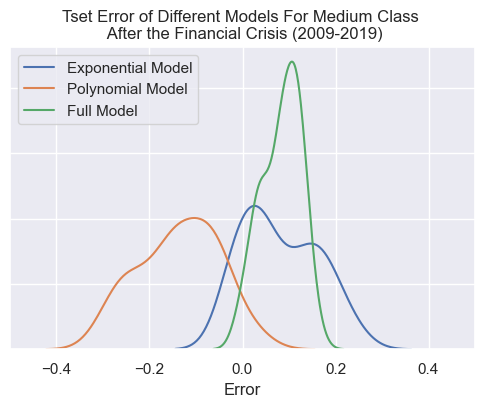

In [248]:
# Compare the Test Error of Full Model (Exponential + seasonality) with Exponential Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_aft_crisis_med['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_aft_crisis_med['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Medium Class \n After the Financial Crisis (2009-2019)')
plt.show()

#### 2 - Full Model With Noise Correction

In [249]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_aft_crisis_med['Seasonality_Model_Goal'] = train_aft_crisis_med['Residual_Exponential_Model'].shift(-2)
test_aft_crisis_med['Seasonality_Model_Goal'] = test_aft_crisis_med['Residual_Exponential_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_aft_crisis_med.loc[322 , 'Seasonality_Model_Goal'] = test_aft_crisis_med['Residual_Exponential_Model'].iloc[0]
train_aft_crisis_med.loc[323 , 'Seasonality_Model_Goal'] = test_aft_crisis_med['Residual_Exponential_Model'].iloc[1]

472.1888318852372
21.72990639384434


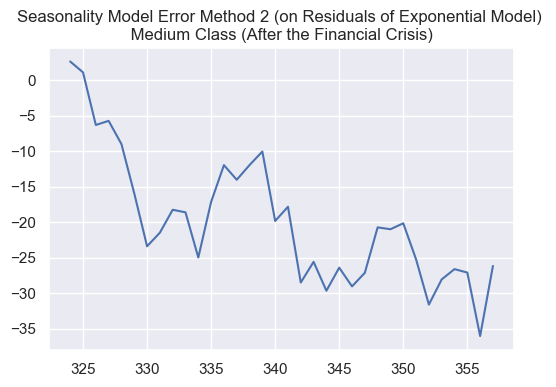

In [250]:
# Fit the regression model on Exponential model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_aft_crisis_med[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)', 'sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']], 
        y=train_aft_crisis_med['Seasonality_Model_Goal'])

train_aft_crisis_med['Predicted_Residual_2'] = regress_2.predict(X=train_aft_crisis_med[['Residual_Exponential_Model',  'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']]) 
        
test_aft_crisis_med['Predicted_Residual_2'] = regress_2.predict(X=test_aft_crisis_med[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)', 'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(2years)','cos(2years)','sin(0.5years)','cos(0.5years)']])
# These predicted values should be shifted back 

(test_aft_crisis_med['Seasonality_Model_Goal'] - test_aft_crisis_med['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Exponential Model) \n Medium Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_med['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_med['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_aft_crisis_med['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_med['Predicted_Residual_2'].iloc[:-2])))

### Adding Back Seasonality And Drift

In [251]:
# Shifted back predicted residuals to two months in advance

train_aft_crisis_med['Shifted_Back_Predicted_Residual_2'] = train_aft_crisis_med['Predicted_Residual_2'].shift(2)
test_aft_crisis_med['Shifted_Back_Predicted_Residual_2'] = test_aft_crisis_med['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to exponential model

train_aft_crisis_med['Final_Predicted_Value_2'] = train_aft_crisis_med['Exponential_Model'] + train_aft_crisis_med['Shifted_Back_Predicted_Residual_2']
test_aft_crisis_med['Final_Predicted_Value_2'] = test_aft_crisis_med['Exponential_Model'] + test_aft_crisis_med['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Exponential + Seasonality + 2 months beforehand residuals)
test_aft_crisis_med['Error_Full_Model_2'] = (test_aft_crisis_med['Final_Predicted_Value_2'] / test_aft_crisis_med['Price Index'])-1
train_aft_crisis_med['Error_Full_Model_2'] = (train_aft_crisis_med['Final_Predicted_Value_2'] / train_aft_crisis_med['Price Index'])-1

In [252]:
print (train_aft_crisis_med['Error_Full_Model_2'].describe())

print (test_aft_crisis_med['Error_Full_Model_2'].describe())
print (test_aft_crisis_med['Error_Full_Model'].describe())

count    94.000000
mean      0.000023
std       0.022911
min      -0.056497
25%      -0.015457
50%       0.000004
75%       0.014183
max       0.072920
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean      0.086520
std       0.040958
min      -0.012276
25%       0.062280
50%       0.090370
75%       0.115767
max       0.159382
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean      0.083430
std       0.041361
min      -0.001950
25%       0.046618
50%       0.086450
75%       0.113717
max       0.156222
Name: Error_Full_Model, dtype: float64


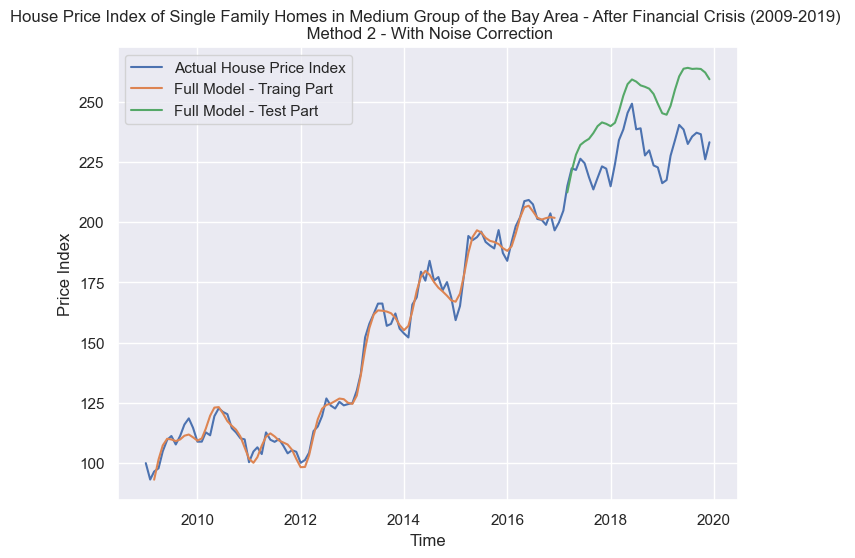

In [253]:
# Plotting the Full Model Method 2(Exponential + Seasonality + 2 months beforehand correction) 
# Cheap Class after Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'])
sns.lineplot(x = train_aft_crisis_med['Time'], y = train_aft_crisis_med['Final_Predicted_Value_2'])
sns.lineplot(x = test_aft_crisis_med['Time'], y = test_aft_crisis_med['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Medium Group of the Bay Area - After Financial Crisis (2009-2019) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

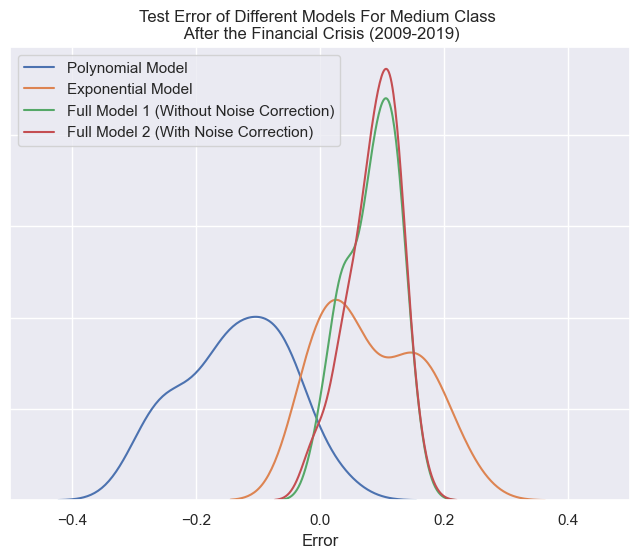

In [254]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_aft_crisis_med['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_4 = sns.distplot(test_aft_crisis_med['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_med['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_aft_crisis_med['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend(loc='upper left')
plt.title('Test Error of Different Models For Medium Class \n After the Financial Crisis (2009-2019)')
plt.show()

In [255]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_aft_crisis_med['Error_Exponential']),3),round(np.median(test_aft_crisis_med['Error_Exponential']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_aft_crisis_med['Error_Full_Model']),3),round(np.nanmedian(test_aft_crisis_med['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_aft_crisis_med['Error_Full_Model_2']),3),round(np.nanmedian(test_aft_crisis_med['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: 0.082 , 0.056
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): 0.083 , 0.086
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): 0.087 , 0.09


In [256]:
# std deviation of error - Exponential Model vs Final Model 1 vs Final Model 2
print (round(test_aft_crisis_med['Error_Exponential'].std(),3))
print (round(test_aft_crisis_med['Error_Full_Model'].std(),5))
print (round(test_aft_crisis_med['Error_Full_Model_2'].std(),5))

0.08
0.04136
0.04096


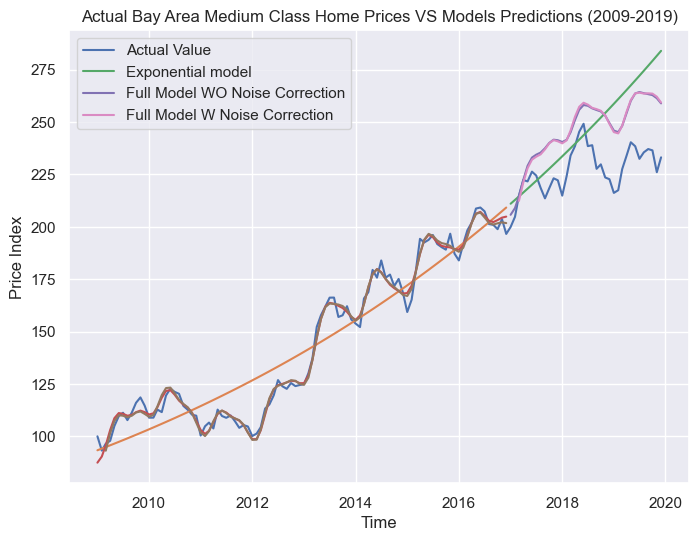

In [257]:
# Plot All models together (Exponential , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_aft_crisis_med['Time'],y = train_aft_crisis_med['Exponential_Model'])
ax_3 = sns.lineplot(x = test_aft_crisis_med['Time'],y = test_aft_crisis_med['Exponential_Model'], label= 'Exponential model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_aft_crisis_med['Time'],y=train_aft_crisis_med['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_aft_crisis_med['Time'],y=test_aft_crisis_med['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_aft_crisis_med['Time'],y=train_aft_crisis_med['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_aft_crisis_med['Time'],y=test_aft_crisis_med['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Medium Class Home Prices VS Models Predictions (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

### 3 - Expensive Class

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


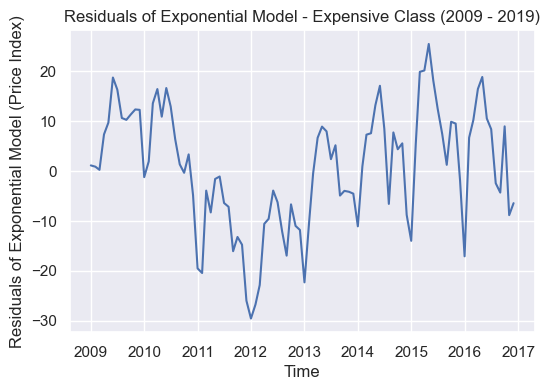

In [258]:
## Add new column as 'residual_exponential_model' to both train and test set and visualzie it:

train_aft_crisis_exp['Residual_Exponential_Model'] = train_aft_crisis_exp['Price Index'] - train_aft_crisis_exp['Exponential_Model']
test_aft_crisis_exp['Residual_Exponential_Model'] = test_aft_crisis_exp['Price Index'] - test_aft_crisis_exp['Exponential_Model']

## Visualize the residual of the Exponential drift: 

ax = sns.lineplot(train_aft_crisis_exp['Time'],train_aft_crisis_exp['Residual_Exponential_Model'])
plt.xlabel('Time')
plt.ylabel('Residuals of Exponential Model (Price Index)')
plt.title('Residuals of Exponential Model - Expensive Class (2009 - 2019)')
plt.show()

Text(0.5, 0, 'Cycles in window of the first 8 years (132->96 timestamps=months)')

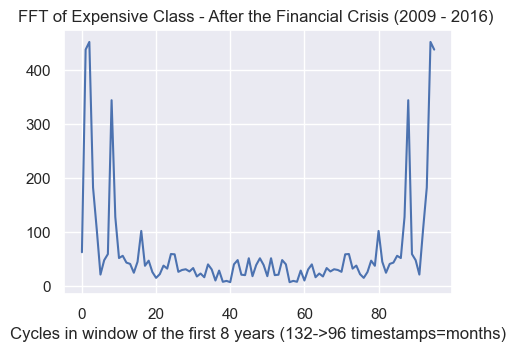

In [259]:
# Let's check the output of Fast Fourier Transform of Expensive Class median price

fft_train_aft_crisis_exp = fftpack.fft(train_aft_crisis_exp['Residual_Exponential_Model'])
plt.figure(figsize=(5,3.5))
plt.plot(np.abs(fft_train_aft_crisis_med))
plt.title('FFT of Expensive Class - After the Financial Crisis (2009 - 2016) ')
plt.xlabel('Cycles in window of the first 8 years (132->96 timestamps=months)')

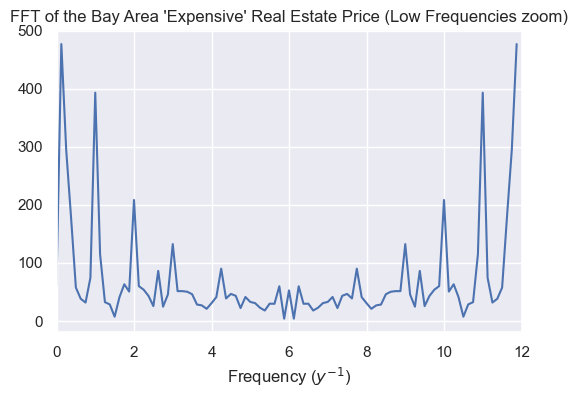

In [260]:
plt.figure(figsize = (6,4))
plt.plot(1./8*np.arange(len(fft_train_aft_crisis_exp)), np.abs(fft_train_aft_crisis_exp)) #we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex
plt.title("FFT of the Bay Area 'Expensive' Real Estate Price (Low Frequencies zoom)")
plt.xlim([0,12])
#plt.ylim([0,1900000])
plt.xlabel('Frequency ($y^{-1}$)');

Let's zoom in:

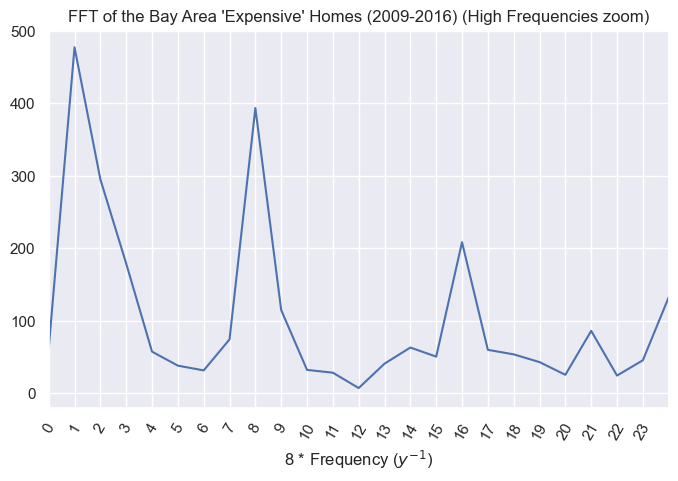

In [261]:
# Zoom in figure of FFT Bay Area (2009 - 2019 --> 2016)
monthly_cycles_in_8_years = 8*12

plt.figure(figsize=(8, 5))
plt.xticks(np.arange(0, 3,  step=1./8),rotation=60, labels=np.arange(0,24))
plt.plot(1./8 * np.arange(len(fft_train_aft_crisis_exp)), np.abs(fft_train_aft_crisis_exp))
plt.title("FFT of the Bay Area 'Expensive' Homes (2009-2016) (High Frequencies zoom)")
#plt.ylim([0,2500000])
plt.xlim([0, 3])
plt.xlabel('8 * Frequency ($y^{-1}$)'); 

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **8** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 1), so it is basically: 

**1/8 = 1/Year -> Year = 8/1 = 8 years**

- Now, let's find the frequencies with highest impact (amplitude of above chart) (Expensive Class Bay Area - 2009 to 2016)

In [262]:
# FFt output is complex number, we just need the real part

fft_train_aft_crisis_abs_exp = np.abs(fft_train_aft_crisis_exp)
train_aft_crisis_cycles_exp = pd.DataFrame(data=fft_train_aft_crisis_abs_exp, columns=['FFT Absolute Value'])

In [263]:
# Based on the Nyquist frequency, we just need to check the half of the frequencies (96/2 = 48)

train_aft_crisis_cycles_exp.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).head(10)

,FFT Absolute Value
1,477.273661
8,393.474061
2,295.220527
16,208.506591
3,179.038912
24,132.484629
9,114.880475
34,90.067996
21,86.217203
7,74.441580


Based on the above figure and table,  I separated the top 7 periods with a relatively high FFT Absolute Value ***(indices:  1, 8, 2, 16, 3, 24, 9)***. 

Here are the 7 biggest periods of our **Expensive Class After the Financial Crisis (2009 - 2016)**: 

In [264]:
train_aft_crisis_cycles_exp_top = train_aft_crisis_cycles_exp.iloc[:48].sort_values(by='FFT Absolute Value', ascending=False).iloc[:7]
train_aft_crisis_cycles_exp_top['Cycle(year)'] = train_aft_crisis_cycles_exp_top.index.map(lambda x : 8./x)
print (train_aft_crisis_cycles_exp_top)

    FFT Absolute Value  Cycle(year)
1           477.273661     8.000000
8           393.474061     1.000000
2           295.220527     4.000000
16          208.506591     0.500000
3           179.038912     2.666667
24          132.484629     0.333333
9           114.880475     0.888889


We end up using **7 cycles** with different frequencies.

Basically, based on the above table, I assume these 7 main cycles **:   8 , 1 , 4 , 0.5 , 2.66 , 0.33, 0.88 years**.

In [265]:
# 8 years 
train_aft_crisis_exp['sin(8years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*8) * 2 * np.pi)
train_aft_crisis_exp['cos(8years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*8) * 2 * np.pi)

# 1 years 
train_aft_crisis_exp['sin(1years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)
train_aft_crisis_exp['cos(1years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)

# 4 years 
train_aft_crisis_exp['sin(4years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*4) * 2 * np.pi)
train_aft_crisis_exp['cos(4years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*4) * 2 * np.pi)

# 0.5 years 
train_aft_crisis_exp['sin(0.5years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*0.5) * 2 * np.pi)
train_aft_crisis_exp['cos(0.5years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*0.5) * 2 * np.pi)


# 2.66 years 
train_aft_crisis_exp['sin(2.66years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*2.66) * 2 * np.pi)
train_aft_crisis_exp['cos(2.66years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.33 years 
train_aft_crisis_exp['sin(0.33years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*0.33) * 2 * np.pi)
train_aft_crisis_exp['cos(0.33years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*0.33) * 2 * np.pi)

# 0.88 year
train_aft_crisis_exp['sin(0.88years)'] = np.sin(train_aft_crisis_exp['Julian']/(365.25*0.88) * 2 * np.pi)
train_aft_crisis_exp['cos(0.88years)'] = np.cos(train_aft_crisis_exp['Julian']/(365.25*0.88) * 2 * np.pi)


Add columns to test dataset:

In [266]:
# 8 years 
test_aft_crisis_exp['sin(8years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*8) * 2 * np.pi)
test_aft_crisis_exp['cos(8years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*8) * 2 * np.pi)

# 1 years 
test_aft_crisis_exp['sin(1years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)
test_aft_crisis_exp['cos(1years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*1) * 2 * np.pi)

# 4 years 
test_aft_crisis_exp['sin(4years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*4) * 2 * np.pi)
test_aft_crisis_exp['cos(4years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*4) * 2 * np.pi)

# 0.5 years 
test_aft_crisis_exp['sin(0.5years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*0.5) * 2 * np.pi)
test_aft_crisis_exp['cos(0.5years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*0.5) * 2 * np.pi)


# 2.66 years 
test_aft_crisis_exp['sin(2.66years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*2.66) * 2 * np.pi)
test_aft_crisis_exp['cos(2.66years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*2.66) * 2 * np.pi)

# 0.33 years 
test_aft_crisis_exp['sin(0.33years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*0.33) * 2 * np.pi)
test_aft_crisis_exp['cos(0.33years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*0.33) * 2 * np.pi)

# 0.88 year
test_aft_crisis_exp['sin(0.88years)'] = np.sin(test_aft_crisis_exp['Julian']/(365.25*0.88) * 2 * np.pi)
test_aft_crisis_exp['cos(0.88years)'] = np.cos(test_aft_crisis_exp['Julian']/(365.25*0.88) * 2 * np.pi)



#### 1 - Full Model Without Noise Correction

83.41509543570339
9.133186488608638


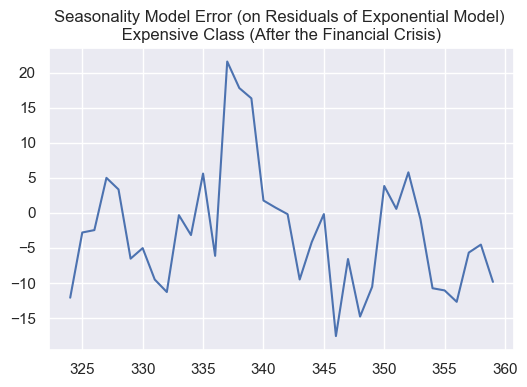

In [267]:
# Test: Use sin and cos of 7 top cycles to predict rediduals at each point (not using 2 months in advance noises)

cut_year = 2017  # The whole dataset have monthly data from 2009 to the end of 2019
                 # So basically 3 years out of 11 years is testing dataset and 8 years is training set

regress = LinearRegression().fit( 
        X=train_aft_crisis_exp[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)',
                           'sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']], 
        y=train_aft_crisis_exp['Residual_Exponential_Model'])

train_aft_crisis_exp['Predicted_Residual'] = regress.predict(X=train_aft_crisis_exp[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']]) 
test_aft_crisis_exp['Predicted_Residual'] = regress.predict(X=test_aft_crisis_exp[[ 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']]) 
        
(test_aft_crisis_exp['Residual_Exponential_Model'] - test_aft_crisis_exp['Predicted_Residual']).plot()
plt.title('Seasonality Model Error (on Residuals of Exponential Model) \n Expensive Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_exp['Residual_Exponential_Model'], test_aft_crisis_exp['Predicted_Residual']))
print (np.sqrt(mean_squared_error(test_aft_crisis_exp['Residual_Exponential_Model'], test_aft_crisis_exp['Predicted_Residual'])))

In [268]:
train_aft_crisis_exp['Final_Predicted_Value'] = train_aft_crisis_exp['Exponential_Model'] + train_aft_crisis_exp['Predicted_Residual']
test_aft_crisis_exp['Final_Predicted_Value'] = test_aft_crisis_exp['Exponential_Model'] + test_aft_crisis_exp['Predicted_Residual']

In [269]:
# Calculate the Test and Training Error
train_aft_crisis_exp['Error_Full_Model'] = (train_aft_crisis_exp['Final_Predicted_Value']/train_aft_crisis_exp['Price Index'])-1
test_aft_crisis_exp['Error_Full_Model'] = (test_aft_crisis_exp['Final_Predicted_Value']/test_aft_crisis_exp['Price Index'])-1

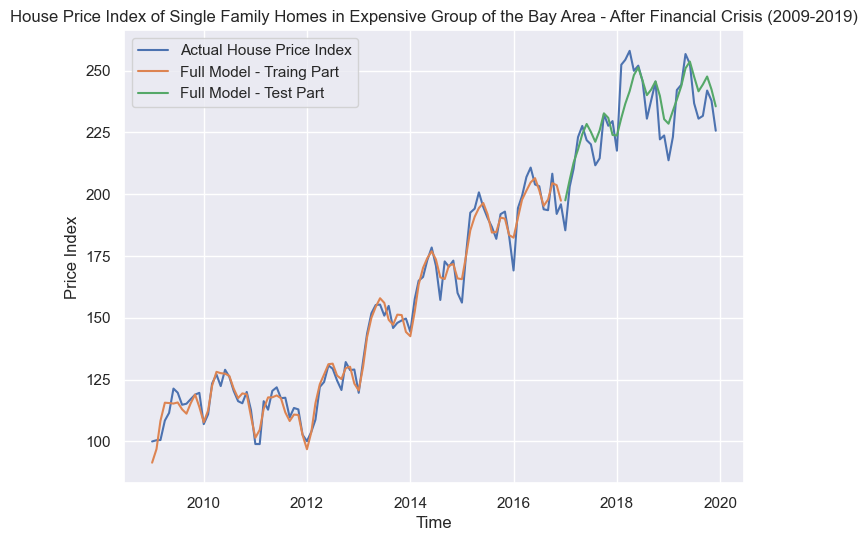

In [270]:
# Plotting the Full Model (Polynomial + Seasonality) - Expensive Class After Crisis
# Without Noise (Method 1)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'])
sns.lineplot(x = train_aft_crisis_exp['Time'], y = train_aft_crisis_exp['Final_Predicted_Value'])
sns.lineplot(x = test_aft_crisis_exp['Time'], y = test_aft_crisis_exp['Final_Predicted_Value'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - After Financial Crisis (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

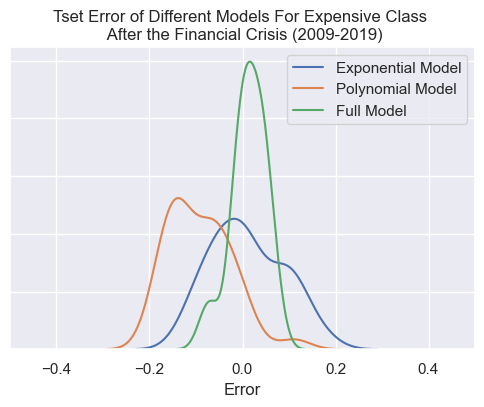

In [271]:
# Compare the Test Error of Full Model (Exponential + seasonality) with Exponential Model

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(6,4))
ax_1 = sns.distplot(test_aft_crisis_exp['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_3 = sns.distplot(test_aft_crisis_exp['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model')
ax_1.set(yticklabels=[])
plt.ylabel('')
plt.xlabel('Error')
plt.xlim(-0.5,0.5)

plt.legend()
plt.title('Tset Error of Different Models For Expensive Class \n After the Financial Crisis (2009-2019)')
plt.show()

#### 2 - Full Model With Noise Correction

In [272]:
# Let's shift the data to 2 month (shift(-2)) in advance and create the new column as 'Seasonality_Model_Goal'

train_aft_crisis_exp['Seasonality_Model_Goal'] = train_aft_crisis_exp['Residual_Exponential_Model'].shift(-2)
test_aft_crisis_exp['Seasonality_Model_Goal'] = test_aft_crisis_exp['Residual_Exponential_Model'].shift(-2)

## The last two training of Seasonality Model Goal would be NAN so I will use the first two of test set

train_aft_crisis_exp.loc[322 , 'Seasonality_Model_Goal'] = test_aft_crisis_exp['Residual_Exponential_Model'].iloc[0]
train_aft_crisis_exp.loc[323 , 'Seasonality_Model_Goal'] = test_aft_crisis_exp['Residual_Exponential_Model'].iloc[1]

79.92018199873206
8.939808834574263


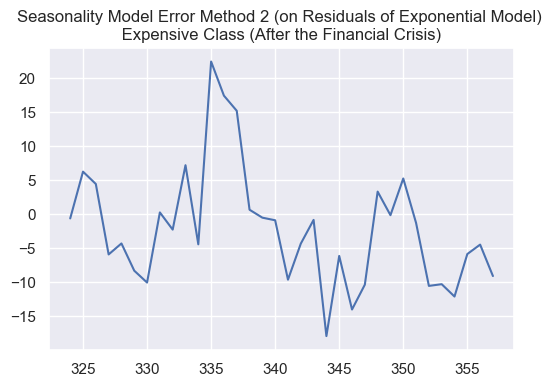

In [273]:
# Fit the regression model on Exponential model residual using the seasonality features and residuals of two months before
regress_2 = LinearRegression().fit( 
        X=train_aft_crisis_exp[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)',
                                'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)', 'sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']], 
        y=train_aft_crisis_exp['Seasonality_Model_Goal'])

train_aft_crisis_exp['Predicted_Residual_2'] = regress_2.predict(X=train_aft_crisis_exp[['Residual_Exponential_Model',  'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)','sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']]) 
        
test_aft_crisis_exp['Predicted_Residual_2'] = regress_2.predict(X=test_aft_crisis_exp[['Residual_Exponential_Model', 'sin(8years)', 'cos(8years)', 'sin(4years)','cos(4years)', 'sin(2.66years)','cos(2.66years)', 'sin(0.88years)', 'cos(0.88years)','sin(1years)','cos(1years)','sin(0.33years)','cos(0.33years)','sin(0.5years)','cos(0.5years)']])
# These predicted values should be shifted back 

(test_aft_crisis_exp['Seasonality_Model_Goal'] - test_aft_crisis_exp['Predicted_Residual_2']).plot()
plt.title('Seasonality Model Error Method 2 (on Residuals of Exponential Model) \n Expensive Class (After the Financial Crisis) ')
print(mean_squared_error(test_aft_crisis_exp['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_exp['Predicted_Residual_2'].iloc[:-2]))
print (np.sqrt(mean_squared_error(test_aft_crisis_exp['Seasonality_Model_Goal'].iloc[:-2], test_aft_crisis_exp['Predicted_Residual_2'].iloc[:-2])))

### Adding Back Seasonality and Drift

In [274]:
# Shifted back predicted residuals to two months in advance

train_aft_crisis_exp['Shifted_Back_Predicted_Residual_2'] = train_aft_crisis_exp['Predicted_Residual_2'].shift(2)
test_aft_crisis_exp['Shifted_Back_Predicted_Residual_2'] = test_aft_crisis_exp['Predicted_Residual_2'].shift(2)

# --------------
# Add shifted back predicted residuals to exponential model

train_aft_crisis_exp['Final_Predicted_Value_2'] = train_aft_crisis_exp['Exponential_Model'] + train_aft_crisis_exp['Shifted_Back_Predicted_Residual_2']
test_aft_crisis_exp['Final_Predicted_Value_2'] = test_aft_crisis_exp['Exponential_Model'] + test_aft_crisis_exp['Shifted_Back_Predicted_Residual_2']

# ----------------
# Error of Full Model 2 (Exponential + Seasonality + 2 months beforehand residuals)
test_aft_crisis_exp['Error_Full_Model_2'] = (test_aft_crisis_exp['Final_Predicted_Value_2'] / test_aft_crisis_exp['Price Index'])-1
train_aft_crisis_exp['Error_Full_Model_2'] = (train_aft_crisis_exp['Final_Predicted_Value_2'] / train_aft_crisis_exp['Price Index'])-1

In [275]:
print (train_aft_crisis_exp['Error_Full_Model_2'].describe())

print (test_aft_crisis_exp['Error_Full_Model_2'].describe())
print (test_aft_crisis_exp['Error_Full_Model'].describe())

count    94.000000
mean     -0.000021
std       0.029256
min      -0.059967
25%      -0.020413
50%      -0.002838
75%       0.015387
max       0.068047
Name: Error_Full_Model_2, dtype: float64
count    34.000000
mean      0.010263
std       0.037234
min      -0.089116
25%      -0.002345
50%       0.013990
75%       0.039976
max       0.080637
Name: Error_Full_Model_2, dtype: float64
count    36.000000
mean      0.013266
std       0.037850
min      -0.085474
25%      -0.003948
50%       0.015729
75%       0.043978
max       0.079133
Name: Error_Full_Model, dtype: float64


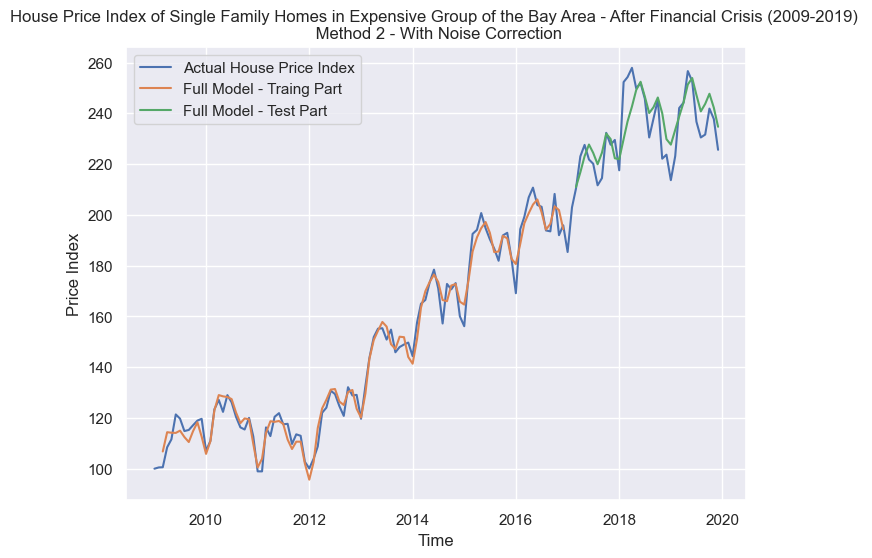

In [276]:
# Plotting the Full Model Method 2(Exponential + Seasonality + 2 months beforehand correction) 
# Expensive Class after Crisis
# With Noise Correction (Method 2)
 
plt.figure(figsize=(8,6))
ax = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'])
sns.lineplot(x = train_aft_crisis_exp['Time'], y = train_aft_crisis_exp['Final_Predicted_Value_2'])
sns.lineplot(x = test_aft_crisis_exp['Time'], y = test_aft_crisis_exp['Final_Predicted_Value_2'])

plt.title('House Price Index of Single Family Homes in Expensive Group of the Bay Area - After Financial Crisis (2009-2019) \n Method 2 - With Noise Correction')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.legend(['Actual House Price Index','Full Model - Traing Part','Full Model - Test Part'])
plt.show()

/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/rtmac/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with simil

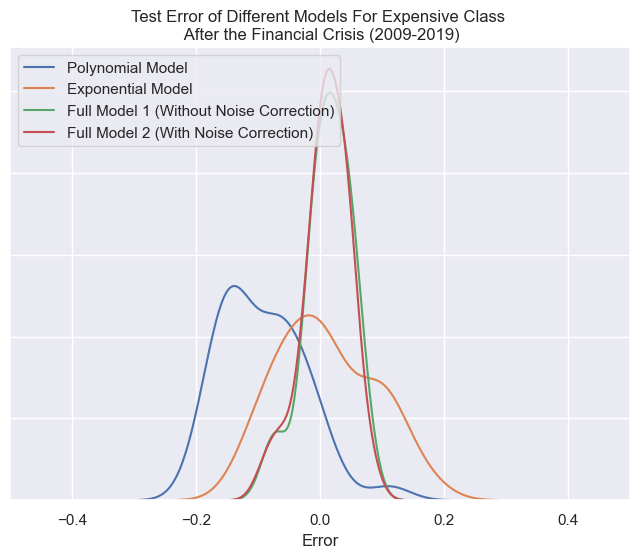

In [277]:
# Compare the Error of Full Model 2 (With Noise Correction)  with Full Model 1 (Without Noise Correction) 

#f, axes = plt.subplots(ncols=3, figsize=(15, 4), sharex=True)
plt.figure(figsize=(8,6))
ax_1 = sns.distplot(test_aft_crisis_exp['Error_Poly'], bins=None, hist=False, kde=True, label='Polynomial Model')
ax_4 = sns.distplot(test_aft_crisis_exp['Error_Exponential'], bins=None, hist=False, kde=True, label='Exponential Model')
ax_2 = sns.distplot(test_aft_crisis_exp['Error_Full_Model'], bins=None, hist=False, kde=True, label='Full Model 1 (Without Noise Correction)')
ax_3 = sns.distplot(test_aft_crisis_exp['Error_Full_Model_2'], bins=None, hist=False, kde=True, label='Full Model 2 (With Noise Correction)')

ax_1.set(yticklabels=[])

plt.xlabel('Error')
plt.ylabel('')
plt.xlim(-0.5,0.5)
plt.legend(loc='upper left')
plt.title('Test Error of Different Models For Expensive Class \n After the Financial Crisis (2009-2019)')
plt.show()

In [278]:
print ('The mean and median error of Exponential Model: {} , {}'.format(round(np.mean(test_aft_crisis_exp['Error_Exponential']),3),round(np.median(test_aft_crisis_exp['Error_Exponential']),3)))
print ('The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): {} , {}'.format(round(np.mean(test_aft_crisis_exp['Error_Full_Model']),3),round(np.nanmedian(test_aft_crisis_exp['Error_Full_Model']),3)))
print ('The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): {} , {}'.format(round(np.mean(test_aft_crisis_exp['Error_Full_Model_2']),3),round(np.nanmedian(test_aft_crisis_exp['Error_Full_Model_2']),3)))

The mean and median error of Exponential Model: 0.01 , 0.007
The mean and median error of Full Model 1 (Exponential Model + Seasonal Adjusted): 0.013 , 0.016
The mean and median error of Full Model 2 (Exponential Model + Seasonal Adjusted + 2 Months Noise Corrections): 0.01 , 0.014


In [279]:
# std deviation of error - Exponential Model vs Final Model 1 vs Final Model 2
print (round(test_aft_crisis_exp['Error_Exponential'].std(),3))
print (round(test_aft_crisis_exp['Error_Full_Model'].std(),5))
print (round(test_aft_crisis_exp['Error_Full_Model_2'].std(),5))

0.078
0.03785
0.03723


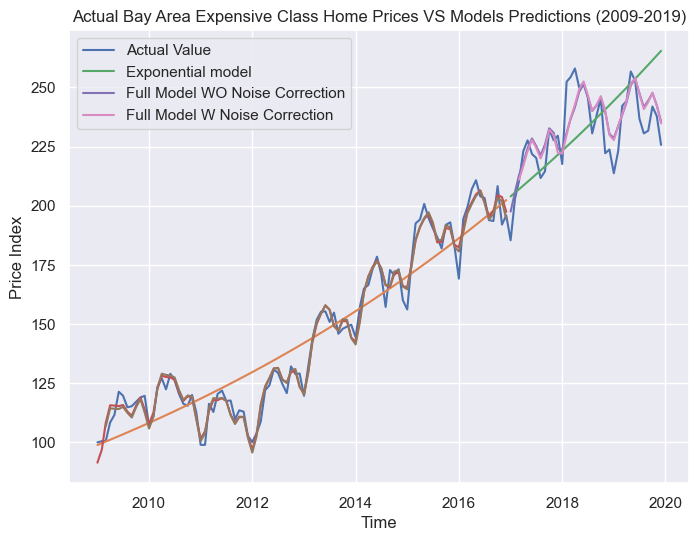

In [280]:
# Plot All models together (Exponential , Full Model 1 , Full Model 2)
plt.figure(figsize=(8, 6))

ax_1 = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'], label= 'Actual Value')


# Poly Model
ax_2 = sns.lineplot(x= train_aft_crisis_exp['Time'],y = train_aft_crisis_exp['Exponential_Model'])
ax_3 = sns.lineplot(x = test_aft_crisis_exp['Time'],y = test_aft_crisis_exp['Exponential_Model'], label= 'Exponential model')


# Full Model 1 
ax_4 = sns.lineplot(x=train_aft_crisis_exp['Time'],y=train_aft_crisis_exp['Final_Predicted_Value'])
ax_5 = sns.lineplot(x=test_aft_crisis_exp['Time'],y=test_aft_crisis_exp['Final_Predicted_Value'], label = 'Full Model WO Noise Correction')


# Full Model 2
ax_6 = sns.lineplot(x=train_aft_crisis_exp['Time'],y=train_aft_crisis_exp['Final_Predicted_Value_2'])
ax_7 = sns.lineplot(x=test_aft_crisis_exp['Time'],y=test_aft_crisis_exp['Final_Predicted_Value_2'], label = 'Full Model W Noise Correction')


plt.title('Actual Bay Area Expensive Class Home Prices VS Models Predictions (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

<br>

These Models and approaches help us to **predict** the house price indexes in advance. However, our main goal is not prediction so let's go one step back and model the house price index on the **whole dataset** to get the new cycles feature and then compare the cycles' features across value groups. 

# <font color='blue' size=5>Part Two - Cycles Comparision Across Value Groups</font>

<font color=blue size=4 > Major Steps: </font> 




 
<font color='green' size=3 > Grouping Counties Based on Historical Data -> 
    Drift part (polynomial) 
    -> Residuals -> Cycles (using FFT) -> Grouping Cycles -> Comparing Cycles Across Groups Using Test Statistics </font> 


<br>

# Check the Model Across Value Groups

Now that we found the process, let's see how the model and cycles work across value groups:

In [281]:
df[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].describe()

,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma
count,3.600000e+02,168.000000,3.600000e+02,360.000000,3.600000e+02,3.480000e+02,3.600000e+02,311.000000,360.000000
mean,4.693146e+05,479310.261905,7.495341e+05,406668.466667,7.180662e+05,7.485242e+05,6.098078e+05,282439.472669,386120.005556
std,2.252906e+05,150761.048315,3.198139e+05,190086.782054,4.058476e+05,3.762580e+05,3.085105e+05,114455.183454,165138.311856
min,1.945280e+05,224620.000000,2.934780e+05,143000.000000,2.456340e+05,2.852560e+05,2.389940e+05,123182.000000,174022.000000
25%,2.340372e+05,317867.500000,3.838962e+05,206501.500000,2.997065e+05,4.092158e+05,3.219412e+05,187279.500000,201231.000000
50%,4.267065e+05,500000.000000,7.518400e+05,368516.000000,6.966725e+05,6.769000e+05,5.557220e+05,265090.000000,365481.000000
75%,6.587475e+05,621610.000000,9.800000e+05,599534.750000,9.225642e+05,9.121250e+05,7.885000e+05,387085.000000,531062.500000
max,1.025000e+06,702370.000000,1.450000e+06,787500.000000,1.762500e+06,1.770000e+06,1.454500e+06,492799.000000,712000.000000


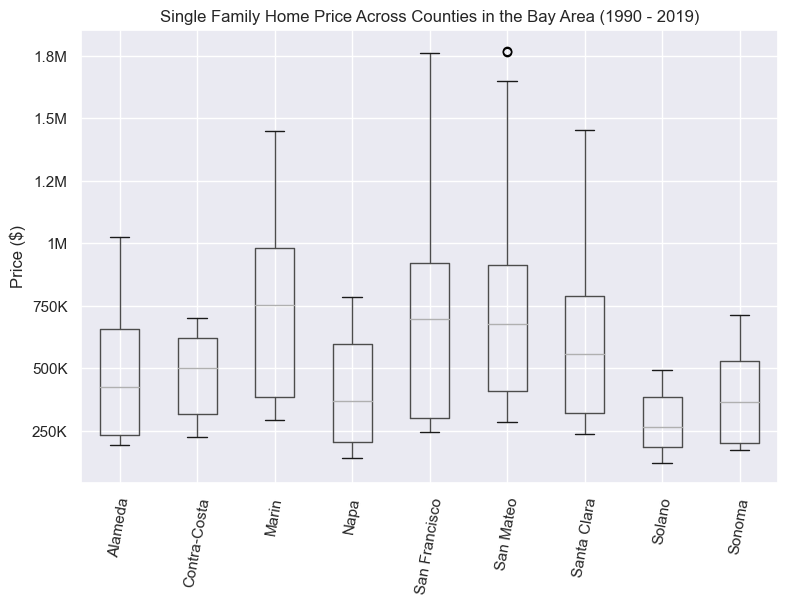

In [282]:
# Boxplot of Counties Single Family Home Price from 1990-2019 

plt.figure(figsize=(9,6))
df[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].boxplot()
plt.xticks(rotation=80)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area (1990 - 2019)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

In [283]:
### NOV 19 VERSION ----> CHANGED ANY TO ALL
### It will change the boxplots, so I made it all, but for boxplot used the any to have better comparision

# Separating the whole dateset to 2 groups (before and after the crisis)

cut_year_1 = 2007
cut_year_2 = 2009 
df_bfr_crisis = df[df['Time'].dt.year < cut_year_1 ].dropna(how='all')
df_aft_crisis = df[df['Time'].dt.year >= cut_year_2 ].dropna(how='all')

In [284]:
# Check the columns 
df_bfr_crisis.head(3)

,Time,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,Bay Area,Julian,Const
0,1990-01-01,194952,226149,NaN,346153,178888,287499,NaN,271840,NaN,174022,227366,2447892.5,1.0
1,1990-02-01,196273,219306,NaN,338333,186363,300877,NaN,273100,NaN,180294,234739,2447923.5,1.0
2,1990-03-01,194856,225162,NaN,358571,180000,290151,NaN,275500,NaN,178823,235337,2447951.5,1.0


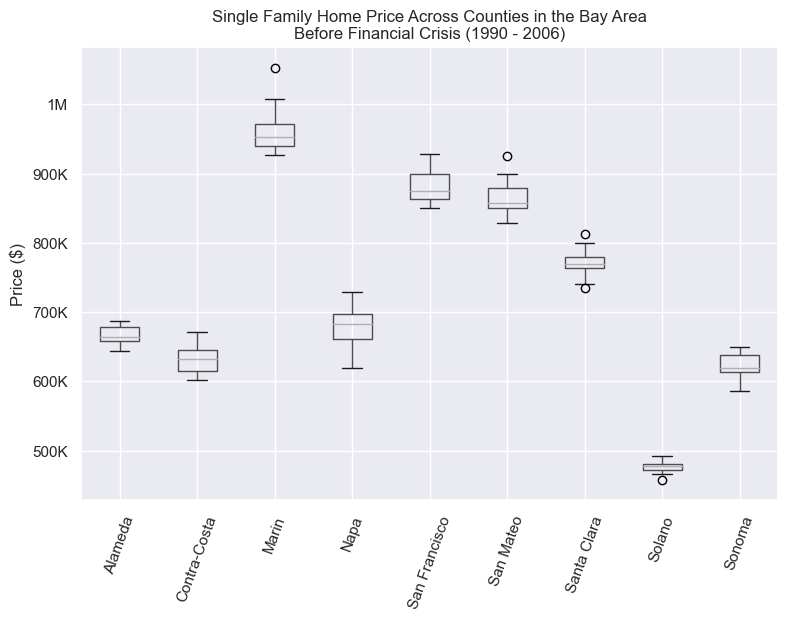

In [285]:
# Boxplot of Bay Area Single Family Home Across Counties - Before Financial Crisis (1990 - 2006)

plt.figure(figsize=(9,6))
df_bfr_crisis[['Alameda','Contra-Costa','Marin','Napa','San Francisco',
               'San Mateo','Santa Clara','Solano','Sonoma']].dropna().boxplot()
plt.xticks(rotation=70)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area\nBefore Financial Crisis (1990 - 2006)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

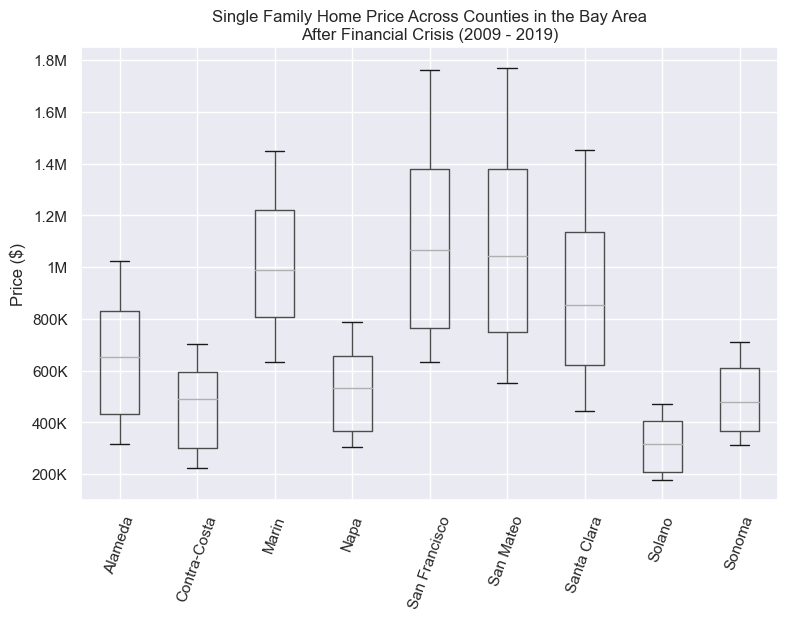

In [286]:
# Boxplot of Bay Area Single Family Home Across Counties - After Financial Crisis (2009 - 2019)

plt.figure(figsize=(9,6))
df_aft_crisis[['Alameda','Contra-Costa','Marin','Napa','San Francisco','San Mateo','Santa Clara','Solano','Sonoma']].dropna().boxplot()
plt.xticks(rotation=70)
plt.ylabel('Price ($)')
plt.title('Single Family Home Price Across Counties in the Bay Area\nAfter Financial Crisis (2009 - 2019)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

Based on the above figures, for both before and after the financial crisis, my 3 groups are: 

- **Expensive** : Marin, San Francisco, San Mateo, Santa Clara
- **Medium** : Alameda , Contra-Costa, Napa, Sonoma 
- **Low** : Solano (copy-delete)

In [287]:
# Add Julian column + Add Constant Column

df['Julian'] = df['Time'].apply(lambda x: x.to_julian_date() )
df = add_constant(df) 

In [288]:
# Make Separate Datasets for Value Classes

df_exp = df[['Time','Julian','Const','Marin','San Francisco','San Mateo','Santa Clara']].copy()
df_med = df[['Time','Julian','Const','Alameda','Contra-Costa','Napa','Sonoma']].copy()
df_che = df[['Time','Julian','Const','Solano']].copy()

In [289]:
# Add 'Average' Column

df_exp['Average'] = df_exp[['Marin','San Francisco','San Mateo','Santa Clara']].mean(axis=1) 
df_med['Average'] = df_med[['Alameda','Contra-Costa','Napa','Sonoma']].mean(axis=1) 
df_che['Average'] = df_che[['Solano']].mean(axis=1)

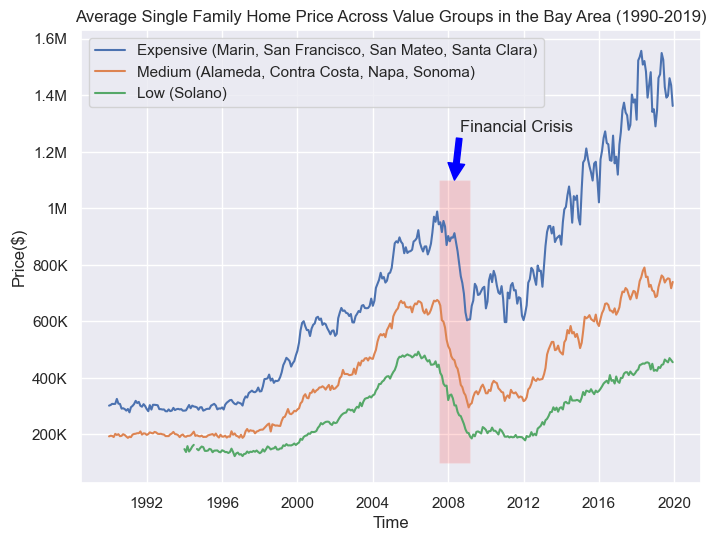

In [290]:
# Plotting Average House Price for 3 Value Groups 

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_exp['Time'], y = df_exp['Average'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_med['Time'], y = df_med['Average'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_che['Time'], y = df_che['Average'], label = 'Low (Solano)')
plt.title('Average Single Family Home Price Across Value Groups in the Bay Area (1990-2019)')
ax_1.fill_between([13700,14300], 100000, 1100000, facecolor='red', alpha = .15, interpolate=True)
plt.annotate(text='Financial Crisis', xy=(14000,1100000), xytext=(14100,1270000), arrowprops={'color':'blue','lw':1.01})
plt.xlabel('Time')
plt.ylabel('Price($)')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

#print (ax_1.get_xlim())
#print (ax_1.get_ylim())

In [291]:
# Make Separate Datasets for Before and After Financial Crisis

df_bfr_crisis_exp = df_exp[df_exp['Time'].dt.year < 2007 ].copy()
df_bfr_crisis_med = df_med[df_med['Time'].dt.year < 2007 ].copy()
df_bfr_crisis_che = df_che[df_che['Time'].dt.year < 2007 ].copy()

# -------------------------------- 

df_aft_crisis_exp = df_exp[df_exp['Time'].dt.year >= 2009 ].copy()
df_aft_crisis_med = df_med[df_med['Time'].dt.year >= 2009 ].copy()
df_aft_crisis_che = df_che[df_che['Time'].dt.year >= 2009 ].copy()

In [292]:
# Creating 'House Price Index' for each value group

# Before Financial Crisis

df_bfr_crisis_exp['Price Index'] = df_bfr_crisis_exp['Average'].apply(lambda x : x*100/df_bfr_crisis_exp['Average'].iloc[0])
df_bfr_crisis_med['Price Index'] = df_bfr_crisis_med['Average'].apply(lambda x : x*100/df_bfr_crisis_med['Average'].iloc[0])
df_bfr_crisis_che['Price Index'] = df_bfr_crisis_che['Average'].apply(lambda x : x*100/df_bfr_crisis_che['Average'].iloc[48])
# Cheap group has its first number in row 48


# After Financial Crisis

df_aft_crisis_exp['Price Index'] = df_aft_crisis_exp['Average'].apply(lambda x : x*100/df_aft_crisis_exp['Average'].iloc[0])
df_aft_crisis_med['Price Index'] = df_aft_crisis_med['Average'].apply(lambda x : x*100/df_aft_crisis_med['Average'].iloc[0])
df_aft_crisis_che['Price Index'] = df_aft_crisis_che['Average'].apply(lambda x : x*100/df_aft_crisis_che['Average'].iloc[0])

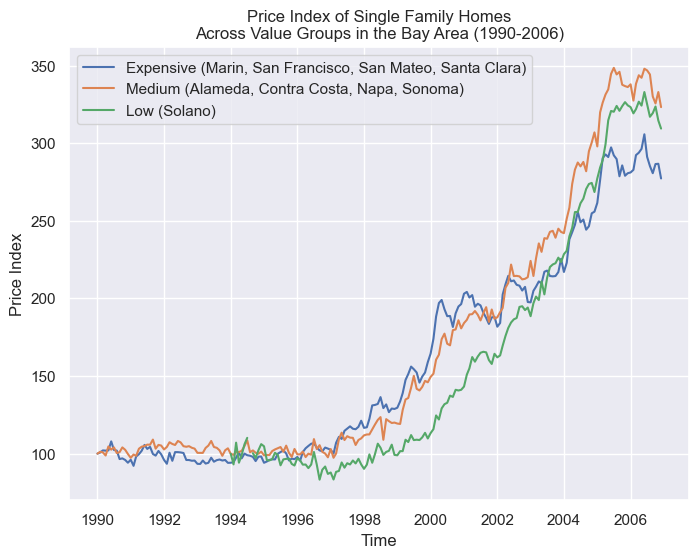

In [293]:
# Visualization of Price Index for 3 Value Groups - Before the Financial Crisis (1990 - 2006)

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_bfr_crisis_exp['Time'], y = df_bfr_crisis_exp['Price Index'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_bfr_crisis_med['Time'], y = df_bfr_crisis_med['Price Index'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_bfr_crisis_che['Time'], y = df_bfr_crisis_che['Price Index'], label = 'Low (Solano)')
plt.title('Price Index of Single Family Homes\nAcross Value Groups in the Bay Area (1990-2006)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

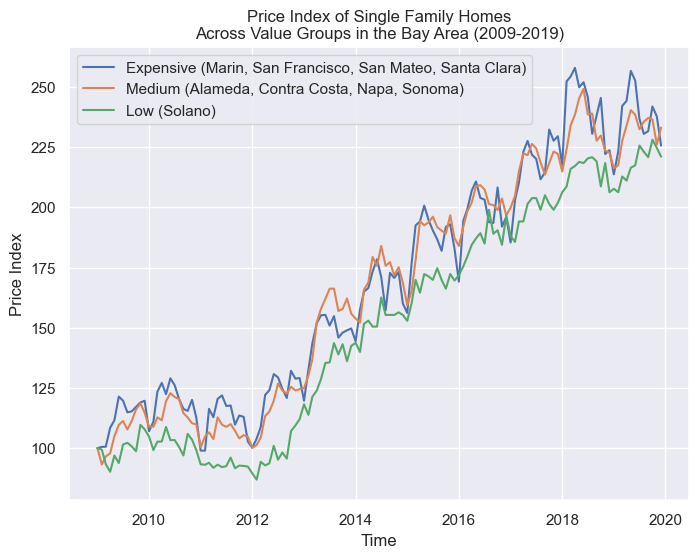

In [294]:
# Visualization of House Price Index for 3 Value Groups - After the Financial Crisis (2009 - 2019)

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'], label = 'Low (Solano)')
plt.title('Price Index of Single Family Homes\nAcross Value Groups in the Bay Area (2009-2019)')
plt.xlabel('Time')
plt.ylabel('Price Index')
plt.show()

<br>
 
<font color='red' size=6> Cycles in Different Value Groups </font> 

</br>

Now it's time to extract the ***cycles' features*** of each class for before and after financial crisis separately.

<br>

<font color='blue' size=5> Before Financial Crisis (1990-2006) </font> 

</br>

First, we have to model the drift part of the house price indices. 

For modeling drift, I will use two different models: **Exponential** and **Polynomial**. 

## 1 - Modeling Drift: 

#### A - Exponential Model

In [295]:
# Fit Exponential Model on Drift Part 

## Expensive Class 

exponential_model = Ridge().fit( 
    X = df_bfr_crisis_exp[['Julian', 'Const']], 
    y = np.log(df_bfr_crisis_exp['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error from actual value

df_bfr_crisis_exp['Exponential_Model'] = np.exp(exponential_model.predict(df_bfr_crisis_exp[['Julian', 'Const']]))
df_bfr_crisis_exp['Error_Exponential'] = (df_bfr_crisis_exp['Exponential_Model'] / df_bfr_crisis_exp['Price Index'])-1



# -------------------

## Medium Class 

exponential_model = Ridge().fit( 
    X = df_bfr_crisis_med[['Julian', 'Const']], 
    y = np.log(df_bfr_crisis_med['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error

df_bfr_crisis_med['Exponential_Model'] = np.exp(exponential_model.predict(df_bfr_crisis_med[['Julian', 'Const']]))
df_bfr_crisis_med['Error_Exponential'] = (df_bfr_crisis_med['Exponential_Model'] / df_bfr_crisis_med['Price Index'])-1




# -------------------

## Cheap Class (This one has some NaN values in the begining that should be removed)
df_bfr_crisis_che_clean = df_bfr_crisis_che.dropna(how='any')

exponential_model = Ridge().fit( 
    X = df_bfr_crisis_che_clean[['Julian', 'Const']], 
    y = np.log(df_bfr_crisis_che_clean['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error

df_bfr_crisis_che['Exponential_Model'] = np.exp(exponential_model.predict(df_bfr_crisis_che[['Julian', 'Const']]))
df_bfr_crisis_che['Error_Exponential'] = (df_bfr_crisis_che['Exponential_Model'] / df_bfr_crisis_che['Price Index'])-1

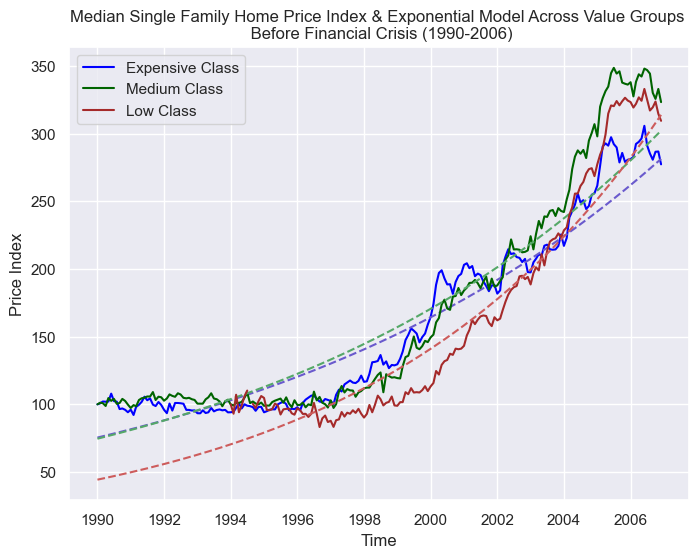

In [296]:
# Exponential Model Visualization

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_bfr_crisis_exp , color = 'slateblue', linestyle='--')
ax_3 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_med , label='Medium Class', color = 'darkgreen')
ax_4 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_bfr_crisis_med , color = 'g', linestyle='--')
ax_5 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_che , label='Low Class' , color = 'brown')
ax_6 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_bfr_crisis_che , color = 'indianred', linestyle='--')
plt.ylabel('Price Index')
plt.xlabel('Time')
plt.title('Median Single Family Home Price Index & Exponential Model Across Value Groups \n Before Financial Crisis (1990-2006)')
plt.show()

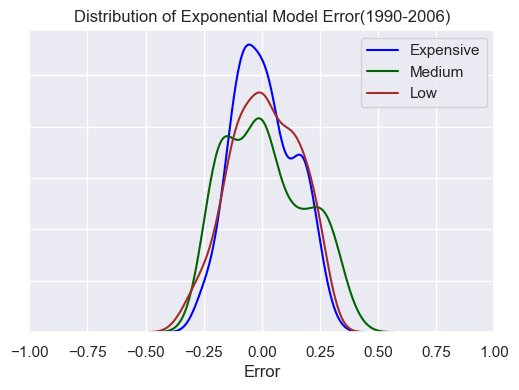

In [297]:
# Histogram of Exponential Model Error 

ax_1 = sns.kdeplot(df_bfr_crisis_exp['Error_Exponential'],  color = 'blue', label='Expensive')
ax_2 = sns.kdeplot(df_bfr_crisis_med['Error_Exponential'],  color = 'darkgreen', label='Medium')
ax_3 = sns.kdeplot(df_bfr_crisis_che['Error_Exponential'],  color = 'brown', label ='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.legend()
plt.xlim(-1,1)
plt.title('Distribution of Exponential Model Error(1990-2006)')
plt.show()

As you would see in the above figure, the Exponential model does not fit the real house index price very well.
So the next, I would try the Polynomial Model.

#### B - Polynomial Model

In [298]:
# Fit Polynomial Model on Drift part [before the financial crisis (1990 - 2006)]

# Expensive Class

c, stats = polynomial.polyfit(df_bfr_crisis_exp['Julian'],df_bfr_crisis_exp['Price Index'],3,full=True)
df_bfr_crisis_exp['Poly_Model'] = df_bfr_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_bfr_crisis_exp['Error_Poly'] = (df_bfr_crisis_exp['Poly_Model']/df_bfr_crisis_exp['Price Index']) - 1 


# -------------------

# Medium Class 

c, stats = polynomial.polyfit(df_bfr_crisis_med['Julian'],df_bfr_crisis_med['Price Index'],3,full=True)
df_bfr_crisis_med['Poly_Model'] = df_bfr_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_bfr_crisis_med['Error_Poly'] = (df_bfr_crisis_med['Poly_Model']/df_bfr_crisis_med['Price Index']) - 1 

# -------------------

# Cheap Class

df_bfr_crisis_che_clean = df_bfr_crisis_che.dropna(how='any')
c, stats = polynomial.polyfit(df_bfr_crisis_che_clean['Julian'],df_bfr_crisis_che_clean['Price Index'],3,full=True)
df_bfr_crisis_che['Poly_Model'] = df_bfr_crisis_che['Julian'].iloc[48:].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_bfr_crisis_che['Error_Poly'] = (df_bfr_crisis_che['Poly_Model']/df_bfr_crisis_che['Price Index']) - 1 

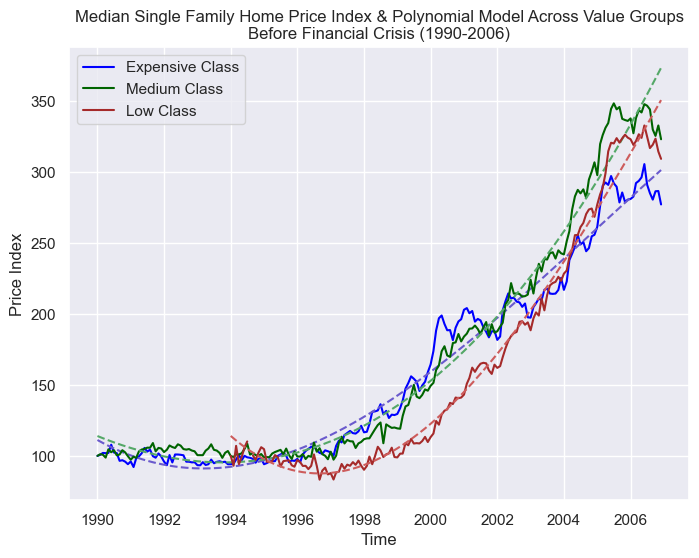

In [299]:
# Polynomial Model Visualization

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Poly_Model' , x='Time', data=df_bfr_crisis_exp , color = 'slateblue', linestyle='--')
ax_3 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_med , label='Medium Class', color = 'darkgreen')
ax_4 = sns.lineplot(y='Poly_Model' , x='Time', data=df_bfr_crisis_med , color = 'g', linestyle='--')
ax_5 = sns.lineplot(y='Price Index' , x='Time', data=df_bfr_crisis_che , label='Low Class' , color = 'brown')
ax_6 = sns.lineplot(y='Poly_Model' , x='Time', data=df_bfr_crisis_che , color = 'indianred', linestyle='--')
plt.ylabel('Price Index')
plt.xlabel('Time')
plt.title('Median Single Family Home Price Index & Polynomial Model Across Value Groups\nBefore Financial Crisis (1990-2006)')
plt.show()

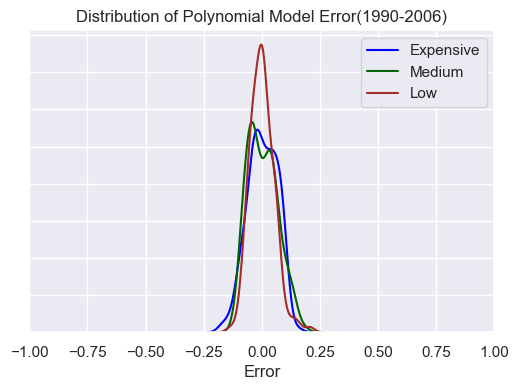

In [300]:
# Histogram of Polynomial Model Error 

ax_1 = sns.kdeplot(df_bfr_crisis_exp['Error_Poly'], color = 'blue', label='Expensive')
ax_2 = sns.kdeplot(df_bfr_crisis_med['Error_Poly'], color = 'darkgreen', label='Medium')
ax_3 = sns.kdeplot(df_bfr_crisis_che['Error_Poly'],  color = 'brown', label ='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.legend()
plt.xlim(-1,1)
plt.title('Distribution of Polynomial Model Error(1990-2006)')
plt.show()

Keep in mind that this dissertation's purpose is **comparing the cycles' features across value groups and not price prediction**. Otherwise, I had to separate the whole time series dataset into training and test sets and then extract the cycle features based on the training test and apply the same cylces features to get the price of test sets. 

It's clear that the polynomial models have lower errors. Therefore, I'll model the drift part with the polynomial model and then calculate these models' residuals from the actual values. 

## 2- Modeling Seasonality

There would be 2 steps in this regard: 

    A - Calculating the Residuals of Drift Part (Polynomial Model) From Actual Value
    B - Finding the Cycles Charactristis (applying the FFT algorithm)

### A - Residuals

In [301]:
## Add new columns as 'Residual_Polynomial_Model' and Visualzie It:


df_bfr_crisis_exp['Residual_Poly_Model'] = df_bfr_crisis_exp['Price Index'] - df_bfr_crisis_exp['Poly_Model']
df_bfr_crisis_med['Residual_Poly_Model'] = df_bfr_crisis_med['Price Index'] - df_bfr_crisis_med['Poly_Model']
df_bfr_crisis_che['Residual_Poly_Model'] = df_bfr_crisis_che['Price Index'] - df_bfr_crisis_che['Poly_Model']


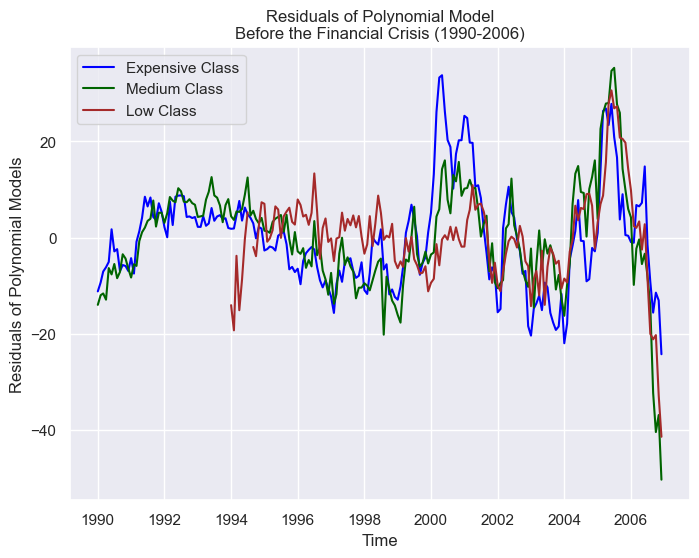

In [302]:
## Visualize the Polynomial Models Residuals: 

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_bfr_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_bfr_crisis_med , label='Medium Class', color = 'darkgreen')
ax_3 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_bfr_crisis_che , label='Low Class' , color = 'brown')
plt.ylabel('Residuals of Polynomial Models')
plt.xlabel('Time')
plt.title('Residuals of Polynomial Model\nBefore the Financial Crisis (1990-2006)')
plt.show()

### B - Finding Cycles Charactristics

Now I am applying the FFT (Fast Fourier Transform) algorithm to extract the cycles' characteristics **(magnitude and length)** .

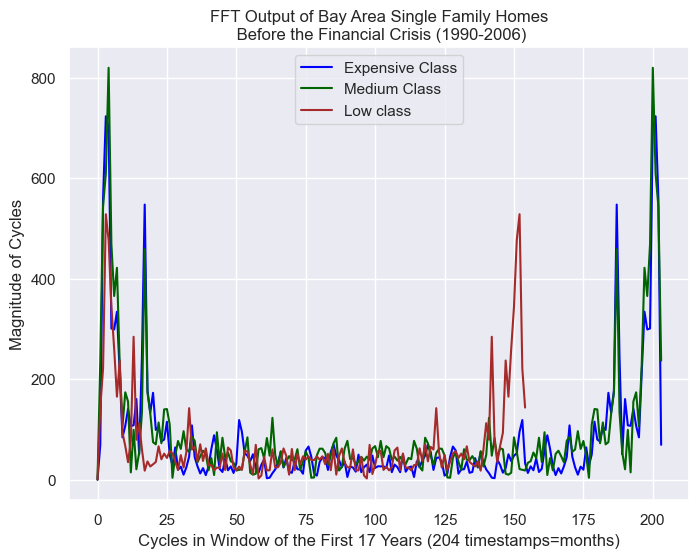

In [303]:
# Let's apply and check the output of Fast Fourier Transform 

fft_bfr_crisis_exp = fftpack.fft(df_bfr_crisis_exp['Residual_Poly_Model'])
fft_bfr_crisis_med = fftpack.fft(df_bfr_crisis_med['Residual_Poly_Model'])
fft_bfr_crisis_che = fftpack.fft(df_bfr_crisis_che['Residual_Poly_Model'].dropna())

# Visualize the FFT output


plt.figure(figsize=(8,6))
plt.plot(np.abs(fft_bfr_crisis_exp), color = 'blue', label='Expensive Class')
plt.plot(np.abs(fft_bfr_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(np.abs(fft_bfr_crisis_che), color = 'brown', label='Low class')
plt.title('FFT Output of Bay Area Single Family Homes\n Before the Financial Crisis (1990-2006)')
plt.ylabel('Magnitude of Cycles')
plt.xlabel('Cycles in Window of the First 17 Years (204 timestamps=months)')
plt.legend()
plt.show()


The x-axis is showing frequency.  Low frequency waves, corresponding to long times, are on the left.

The lowest non-zero frequency measured has a single cycle over the full 17-year period, corresponding to a frequency of $1/17\, y^{-1}$.  The highest frequency is that of the sampling, $1\, m^{-1}$.

The discrete Fourier transform of real data is symmetric about the center of its frequency range.  Due to the problem of *aliasing*, it cannot distinguish signals with a frequency above half its sampling frequency from those below.  This limiting frequency is called the **Nyquist frequency**, and the results of a FFT for frequencies above it should be ignored.

More formally, the Nyquist frequency is the highest frequency that can be resolved given your sampling rate.

$$ \nu_N = \frac{1}{2 \Delta t} $$

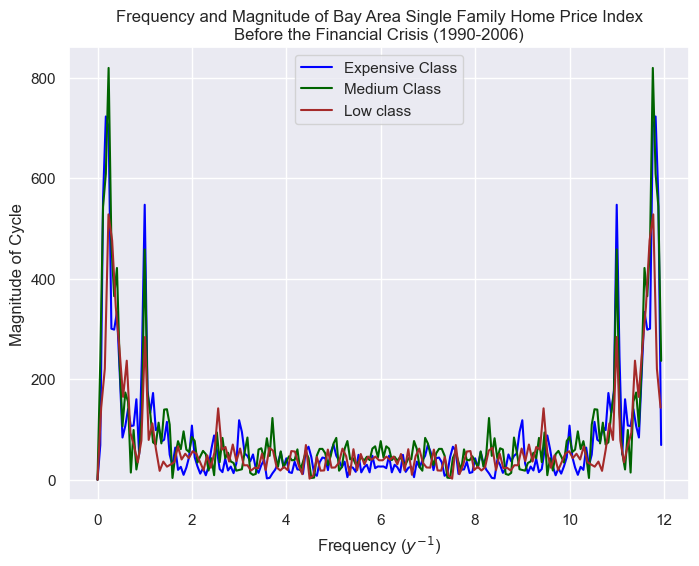

In [304]:
# Visualize the cycles frequencies in scale of '1/year'

plt.figure(figsize = (8,6))
plt.plot(1./17*np.arange(len(fft_bfr_crisis_exp)), np.abs(fft_bfr_crisis_exp), color = 'blue', label='Expensive Class')
plt.plot(1./17*np.arange(len(fft_bfr_crisis_med)), np.abs(fft_bfr_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(1./12.91*np.arange(len(fft_bfr_crisis_che)), np.abs(fft_bfr_crisis_che), color = 'brown', label='Low class')
#we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex


plt.title("Frequency and Magnitude of Bay Area Single Family Home Price Index\nBefore the Financial Crisis (1990-2006)")
plt.ylabel('Magnitude of Cycle')
plt.xlabel('Frequency ($y^{-1}$)')
plt.legend()
plt.show()

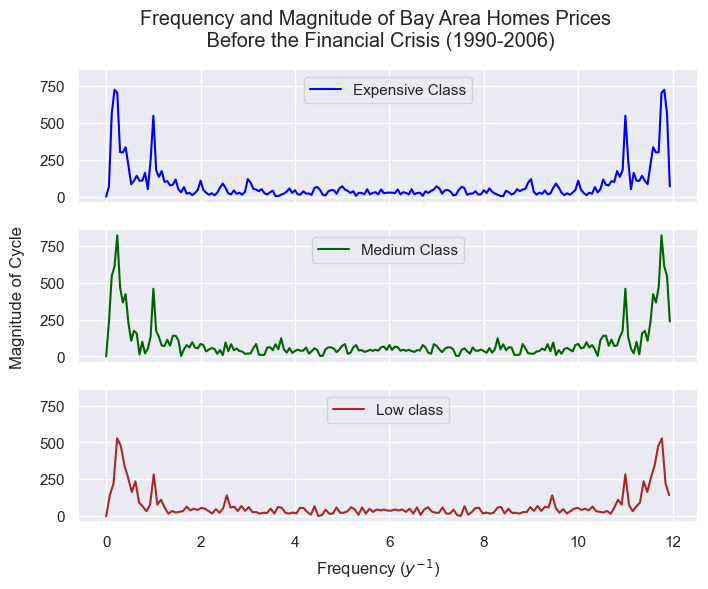

In [305]:
# Visualize the cycles frequencies in scale of '1/year' - Separate Figures


fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize = (8,6))

fig.suptitle("Frequency and Magnitude of Bay Area Homes Prices \n Before the Financial Crisis (1990-2006)")
axs[0].plot(1./17*np.arange(len(fft_bfr_crisis_exp)), np.abs(fft_bfr_crisis_exp), color = 'blue', label='Expensive Class') #we use np.abs(fft_bfr_crisis_exp) since, the fft_bfr_crisis_exp is complex
axs[0].legend(loc="upper center")
axs[1].plot(1./17*np.arange(len(fft_bfr_crisis_med)), np.abs(fft_bfr_crisis_med), color = 'darkgreen', label='Medium Class')
axs[1].legend(loc="upper center")
axs[2].plot(1./12.91*np.arange(len(fft_bfr_crisis_che)), np.abs(fft_bfr_crisis_che), color = 'brown', label='Low class') #cheap class has 12 years and 11 months of data before the financial crisis
axs[2].legend(loc="upper center")

fig.text(0.5, 0.04, 'Frequency ($y^{-1}$)', ha='center')
fig.text(0.04, 0.5, 'Magnitude of Cycle', va='center', rotation='vertical')

plt.show()

The above figure shows all three different class values cycles before the financial crisis (1990 - 2006). As it can be seen, **the major cycles have the frequency of less than 3 in the above figures (the lowest major cycle can be quarterly)**.

As mentioned earlier, the figures are symmetrical, so all we need to do is pay attention to the one half of the whole figure (left half of the figure). The left side of the figure represents the long term cycles (low-frequency zone), and as it moves toward the middle of the figure, the cycles represent the shorter-term cycles (high-frequency zone)

So let's zoom in and have a bigger picture of those:

<br>

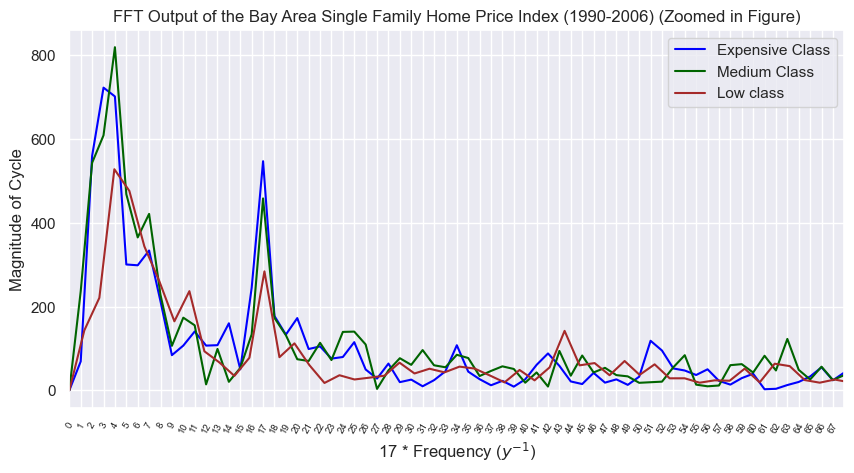

In [306]:
# Zoomed in Figure of Cycles - Before the Financial Crisis (1990 - 2006)

monthly_cycles_in_17_years = 17*12

plt.figure(figsize=(10, 5))
plt.xticks(np.arange(0, 4,  step=1./17),rotation=60, labels=np.arange(0,68), fontsize = 7)
plt.plot(1./17*np.arange(len(fft_bfr_crisis_exp)), np.abs(fft_bfr_crisis_exp), color = 'blue', label='Expensive Class') #we use np.abs(fft_bfr_crisis_exp) since, the fft_bfr_crisis_exp is complex
plt.plot(1./17*np.arange(len(fft_bfr_crisis_med)), np.abs(fft_bfr_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(1./12.91*np.arange(len(fft_bfr_crisis_che)), np.abs(fft_bfr_crisis_che), color = 'brown', label='Low class')
plt.Circle((0.5, 0.5), 0.2, color='blue')
plt.title("FFT Output of the Bay Area Single Family Home Price Index (1990-2006) (Zoomed in Figure)")
#plt.ylim([0,850])
plt.xlim([0, 4])
plt.xlabel('17 * Frequency ($y^{-1}$)')
plt.ylabel('Magnitude of Cycle')
plt.legend()
plt.show()

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **17** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 3) for expensive class (blue line), so it is basically: 

**3/17 = 1/Year -> Year = 17/3 = 5.67 years (length of cycle)**

Just by taking a glimpse at the above chart, we could say that the expensive and medium classes show more similar behavior than the cheap class. In general, the expensive and medium classes have higher cycle magnitude, which means they have a wider range of oscillation.

Also, the number of significant lower period cycles in the medium and expensive classes are higher than the cheap class. 

<br> 

<font color='green' size=4>

At this point, if we want to do some **value prediction** , we should extract the cycles features (magnitude and length) and use the below formula and solve a linear regression equation:  

    
$$ y_t = A \sin\left( \frac{t}{T} \right) + B \cos\left( \frac{t}{T} \right) + \epsilon$$
which is linear in $A$ and $B$.  </font>

<br>

<font color='green' size=4>

However, the main purpose of this research is not a prediction but a cycle comparison. To do cycles comparison across value groups, we can go two different ways: 

</font>


### Cycles Comparision

Statistical Testing: 

It would not be easy to compare cycle magnitude with different frequencies across value groups. Based on the major cycles in the figure, I grouped the cycles in 4 different groups and then did a statistical test on these groups. 

PS. These groups are recognized after some sorting and visualization in several steps ahead. Here this comes just for an explanation of the method. 



***


    - Short term cycles (1 year)
    - Semi Medium term cycles (2 to 3.5 years)
    - Medium term cycles (4 to 6 years)
    - Long term cycles (more than 6 years)
***

''The comparison can be similar to the comparison between a ***variable of individuals in 3 different countries, and we have variables of some samples with different ages (let's say comparing the blood pressure of different age groups in 3 different countries)***''



<br>





<br>

In [307]:
## Creating Cycles DataFrames - Part one Magnitude 



# 'Expensive class' cycle magnitudes (The first cycle with zero index is the representive of infinite cycle so it is removed)
df_bfr_crisis_cycles_exp = pd.DataFrame(data=np.abs(fft_bfr_crisis_exp), columns=['FFT Absolute Value']).iloc[1:]
df_bfr_crisis_cycles_exp.index.name = 'Index'


# 'Medium class' cycle magnitudes
df_bfr_crisis_cycles_med = pd.DataFrame(data=np.abs(fft_bfr_crisis_med), columns=['FFT Absolute Value']).iloc[1:]
df_bfr_crisis_cycles_med.index.name = 'Index'


# 'Cheap class' cycle magnitudes
df_bfr_crisis_cycles_che = pd.DataFrame(data=np.abs(fft_bfr_crisis_che), columns=['FFT Absolute Value']).iloc[1:]
df_bfr_crisis_cycles_che.index.name = 'Index'


## ------------------
## ------------------


## Cycles DataFrames - Part two Duration (Length)

df_bfr_crisis_cycles_exp['Cycle(year)'] = df_bfr_crisis_cycles_exp.index.to_series().apply(lambda x : round(17./int(x),2))
df_bfr_crisis_cycles_med['Cycle(year)'] = df_bfr_crisis_cycles_med.index.to_series().apply(lambda x : round(17./int(x),2))
df_bfr_crisis_cycles_che['Cycle(year)'] = df_bfr_crisis_cycles_che.index.to_series().apply(lambda x : round(12.91/int(x),2))

Based on the Nyquist frequency, we just need to check half of the frequencies (204/2 = 102) and for cheap class (155/2 = 77). Also, the first one (index = 0) does not mean anything in terms of duration (infinity duration).

In [308]:
# Final Version of Cycles Dataframes 

df_bfr_crisis_cycles_exp = df_bfr_crisis_cycles_exp.iloc[0:102].copy()
df_bfr_crisis_cycles_med = df_bfr_crisis_cycles_med.iloc[0:102].copy()
df_bfr_crisis_cycles_che = df_bfr_crisis_cycles_che.iloc[0:77].copy()

 Apply Statistical Testing on Cycle Groups

Steps : 

- Find All Cycles of Each Group (length and magnitude)

- Grouping Cycles into Several Groups Based on Their Frequencies (Length)

- Calculating the Average of Cycle Magnitudes for Each Sub Group

- Perform Statistical Test (Chi-Square Test for Independence)

Previously, we extracted the cycles features. The next step would be grouping cycle frequencies based on the importance of cycles that will be illustrated later.

How to group the cycle can impact our results. There is no certain method to make a cycle comparison, and it's more based on the researcher's perspective. In this research, I decided to do a comparison on **Major Cycles**. 
So, the first step would be extracting more **influential regions of cycles (based on the strongest magnitude)**, and then compare similar duration across value groups. 

In [309]:
## Creating new Cycles DataFrames just with top 30 Cycles (based on Magnitudes)

df_bfr_crisis_cycles_exp_top = df_bfr_crisis_cycles_exp.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]
df_bfr_crisis_cycles_med_top = df_bfr_crisis_cycles_med.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]
df_bfr_crisis_cycles_che_top = df_bfr_crisis_cycles_che.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]

Now let's do some visualization to have the better idea of where these major cycles locate: 

In [310]:
# This cell is just for getting some insight

df_bfr_crisis_cycles_che.sort_values(by='Cycle(year)',ascending=False).head(10)

,FFT Absolute Value,Cycle(year)
Index,,
1,143.347212,12.91
2,220.995730,6.46
3,528.135003,4.30
4,476.334048,3.23
5,343.941495,2.58
6,260.418629,2.15
7,164.955671,1.84
8,236.973482,1.61
9,93.328590,1.43


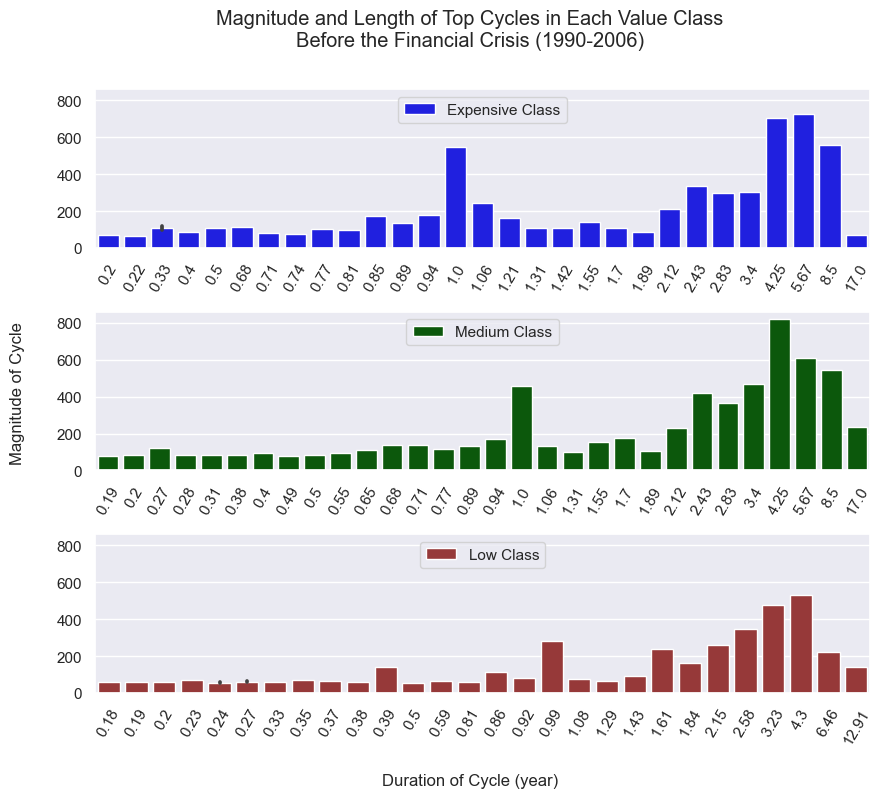

In [311]:
## Top 30 Cycles for Each Value Group Visualziation 

fig, axs = plt.subplots(3,1, sharex=False, sharey=True, figsize = (10,8))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.4)
fig.suptitle("Magnitude and Length of Top Cycles in Each Value Class\nBefore the Financial Crisis (1990-2006)")

sns.barplot(ax =axs[0], x='Cycle(year)',y='FFT Absolute Value', data = df_bfr_crisis_cycles_exp_top, color = 'blue', label='Expensive Class')
sns.barplot(ax =axs[1], x='Cycle(year)',y='FFT Absolute Value', data = df_bfr_crisis_cycles_med_top, color = 'darkgreen', label='Medium Class')
sns.barplot(ax= axs[2], x='Cycle(year)',y='FFT Absolute Value', data = df_bfr_crisis_cycles_che_top, color = 'brown', label='Low Class')


for ax in axs.flat:
    ax.tick_params(axis='x', labelrotation= 60)

for ax in axs.flat: 
    ax.legend(loc="upper center")

for ax in axs.flat:
    ax.set(xlabel='', ylabel='')

fig.text(0.04, 0.5, 'Magnitude of Cycle', va='center', rotation='vertical')
fig.text(0.5, 0.01, 'Duration of Cycle (year)', ha='center')
plt.show()

By looking at the above figure, we can realize that there are 4 regions of major cycles: 

    - Short term cycles (1 year)
    - Semi Medium term cycles (2 to 3.5 years)
    - Medium term cycles (4 to 6 years)
    - Long term cycles (more than 6 years)
    

Now let's make the new column as **Cycle(group)** so we can compare groups across different value groups.

In [312]:
# Function for grouping the cycle duration

def cycle_grouper_bfr(row):
    
    if row < 0.25:
        val = 'noise'  
    elif 0.95 <= row < 1.05 :
        val = 'Short'
    elif 2 <= row < 3.5 : 
        val = 'Semi Medium'
    elif 4 <= row < 6 :
        val = 'Medium'
    elif  6 <= row: 
        val = 'Long'
    else: 
        val = None
        
    return val

In [313]:
# Create 'Cycle(group)' Column in "Cycle" DataFrames

df_bfr_crisis_cycles_exp['Cycle(group)'] = df_bfr_crisis_cycles_exp['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )
df_bfr_crisis_cycles_med['Cycle(group)'] = df_bfr_crisis_cycles_med['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )
df_bfr_crisis_cycles_che['Cycle(group)'] = df_bfr_crisis_cycles_che['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )

In [314]:
# Create 'Cycle(group)' Column in "Top Cycle" DataFrames

df_bfr_crisis_cycles_exp_top['Cycle(group)'] = df_bfr_crisis_cycles_exp_top['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )
df_bfr_crisis_cycles_med_top['Cycle(group)'] = df_bfr_crisis_cycles_med_top['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )
df_bfr_crisis_cycles_che_top['Cycle(group)'] = df_bfr_crisis_cycles_che_top['Cycle(year)'].apply(lambda x : cycle_grouper_bfr(x) )

In [315]:
# Checking Some Entries of Top Cylces Across Value Groups --- This cell is just for getting some insight 

print (df_bfr_crisis_cycles_exp_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))
print (df_bfr_crisis_cycles_med_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))
print (df_bfr_crisis_cycles_che_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))

       FFT Absolute Value  Cycle(year) Cycle(group)
Index                                              
3              722.998802         5.67       Medium
4              701.995960         4.25       Medium
2              560.020524         8.50         Long
17             547.306690         1.00        Short
7              334.056367         2.43  Semi Medium
5              300.668800         3.40  Semi Medium
6              298.744506         2.83  Semi Medium
16             244.820385         1.06         None
8              212.617513         2.12  Semi Medium
18             177.605101         0.94         None
20             172.656431         0.85         None
14             160.227726         1.21         None
11             140.646788         1.55         None
       FFT Absolute Value  Cycle(year) Cycle(group)
Index                                              
4              819.583163         4.25       Medium
3              609.078196         5.67       Medium
2           

In [316]:
# Checking the Average of Cycle Magnitudes in Each 'Time Group' Across All Value Groups

print ((df_bfr_crisis_cycles_exp_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))
print ((df_bfr_crisis_cycles_med_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))
print ((df_bfr_crisis_cycles_che_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))

              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Long                  314.605246       12.750
Medium                712.497381        4.960
Semi Medium           286.521797        2.695
Short                 547.306690        1.000
noise                  67.853174        0.210
              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Long                  390.100083       12.750
Medium                714.330679        4.960
Semi Medium           370.842993        2.695
Short                 458.427019        1.000
noise                  80.176669        0.195
              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Long                  182.171471     9.685000
Medium                528.135003     4.300000
Semi Medium           360.231391     2.653333
Short                 284.235035     0.990000
noise                  60.870983     0.213333


The test that I am going to use is ***Chi Square test of independence of variables***


Example and the definition of the test:  https://web.mit.edu/~csvoss/Public/usabo/stats_handout.pdf

<br>

''' Is there a relationship between fitness level and smoking habits?

Is there a relationship between value class and cycle magnitude? '''




<br>

![Chi_Square](Chi_Square.png)

Source: https://web.mit.edu/~csvoss/Public/usabo/stats_handout.pdf

<br>

In this research, since the cycle groups are the same across value groups, it can be assumed as ***the two categorial independent research***. 

**Variable 1** : Cycle Groups (Categories are short, semi medium, medium, and long cycles)

**Variable 2** : Value Classes (Categories are cheap, medium, and expensive class)

<br>

In order to do the chi-square test, first, we need to form a **Contingency Table** or crosstab table. In other words, I need to integrate 'before crisis cycles' data frames of all groups together. The data frame should have:

- Value Classes (Cheap, Medium, and Expensive) as rows
- Cycle Lengths (Short, Semi Medium, Medium, and Long) as columns 

and each entry has the average cycle magnitude calculated a step earlier.

<br>

In [317]:
# Creating Contingency Table of Before the Financial Crisis Cycles 

data_bfr_crisis_all_values_all_cycles = {'Short Cycle':[284.24,458.43,547.31],
                                        'Semi Medium Cycle':[360.23,370.84,286.52],
                                        'Medium Cycle':[528.14,714.33,712.50],
                                        'Long Cycle':[182.17,390.10,314.61]}

df_bfr_crisis_all_values_all_cycles = pd.DataFrame(data_bfr_crisis_all_values_all_cycles, 
                                                columns = ['Short Cycle','Semi Medium Cycle','Medium Cycle','Long Cycle'],
                                                index=['Low Class','Medium Class','Expensive Class'])

In [318]:
# Let's check the contingency table (crosstab) of cycles Magnitudes across value groups 

df_bfr_crisis_all_values_all_cycles

,Short Cycle,Semi Medium Cycle,Medium Cycle,Long Cycle
Low Class,284.24,360.23,528.14,182.17
Medium Class,458.43,370.84,714.33,390.10
Expensive Class,547.31,286.52,712.50,314.61


In [319]:
# Do Chi-square test of independence of variables

chi2_contingency(df_bfr_crisis_all_values_all_cycles)

(96.76888227293982,
 1.1836751619286943e-18,
 6,
 array([[339.38562098, 267.72152596, 514.34030563, 233.33254743],
        [484.4107348 , 382.12338147, 734.12646259, 333.03942114],
        [466.18364422, 367.74509257, 706.50323178, 320.50803143]]))

<br>

Here they are the Chi Square test resutls: 
    
<br>    
    
    - g (test statistic)              : 96.77
    - p (p-value of the test)         : 1.18 e-18
    - dof (degree of freedom)         : 6
    - Expected (expected frequencies) : array([[339.38562098, 267.72152596, 514.34030563, 233.33254743],
                                                [484.4107348 , 382.12338147, 734.12646259, 333.03942114],
                                                [466.18364422, 367.74509257, 706.50323178, 320.50803143]]))
                                                
                                                
<br>

As you would see the **P-value** of the Chi-Square test is very low (p=1.18e-18) < 0.05 . So we can say the cycles show different patterns across value groups in Bay Area. 

<br>

<font color='blue' size=5> After Financial Crisis (2009-2019) </font> 

</br>

Let's first do some visualization again to refresh our minds: 

In [320]:
# Initial Dataset Info

df_aft_crisis.head(3)

,Time,CA,Alameda,Contra-Costa,Marin,Napa,San Francisco,San Mateo,Santa Clara,Solano,Sonoma,Bay Area,Julian,Const
228,2009-01-01,249960,324170,231250.0,778409,387499,635638,551000.0,450000,206034.0,326000,328680,2454832.5,1.0
229,2009-02-01,245230,327370,224620.0,702380,318182,717390,562500.0,445000,204779.0,312338,321110,2454863.5,1.0
230,2009-03-01,249790,316440,225820.0,699999,351351,703124,576940.0,448750,192285.0,330952,326840,2454891.5,1.0


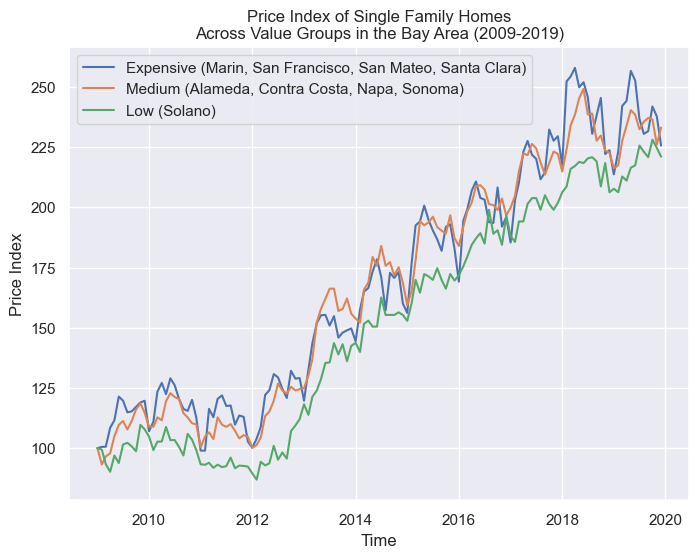

In [321]:
# Visualization of House Price Index for 3 value groups - After the Financial Crisis (2009 - 2019)

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(x = df_aft_crisis_exp['Time'], y = df_aft_crisis_exp['Price Index'], label = 'Expensive (Marin, San Francisco, San Mateo, Santa Clara)')
ax_2 = sns.lineplot(x = df_aft_crisis_med['Time'], y = df_aft_crisis_med['Price Index'], label = 'Medium (Alameda, Contra Costa, Napa, Sonoma)')
ax_3 = sns.lineplot(x = df_aft_crisis_che['Time'], y = df_aft_crisis_che['Price Index'], label = 'Low (Solano)')
plt.title('Price Index of Single Family Homes\nAcross Value Groups in the Bay Area (2009-2019)')
plt.ylabel('Price Index')
plt.xlabel('Time')
plt.show()

First we have to model the drift part of the house price indices. 

I am going to use two different models: **Exponential** and **Polynomial**.

In the last part, before the financial crisis, we observed that it would be better to model the drift part with a polynomial model rather than an exponential model. However, I'll do the same process (comparing these two models) to make sure that it is also correct after the financial model as well. 

## 1 - Modeling Drift: 

#### A - Exponential Model

In [322]:
# Fit exponential model on drift part 

# Expensive Class 

exponential_model = Ridge().fit( 
    X = df_aft_crisis_exp[['Julian', 'Const']], 
    y = np.log(df_aft_crisis_exp['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error

df_aft_crisis_exp['Exponential_Model'] = np.exp(exponential_model.predict(df_aft_crisis_exp[['Julian', 'Const']]))
df_aft_crisis_exp['Error_Exponential'] = (df_aft_crisis_exp['Exponential_Model'] / df_aft_crisis_exp['Price Index'])-1



# -------------------

# Medium Class 

exponential_model = Ridge().fit( 
    X = df_aft_crisis_med[['Julian', 'Const']], 
    y = np.log(df_aft_crisis_med['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error

df_aft_crisis_med['Exponential_Model'] = np.exp(exponential_model.predict(df_aft_crisis_med[['Julian', 'Const']]))
df_aft_crisis_med['Error_Exponential'] = (df_aft_crisis_med['Exponential_Model'] / df_aft_crisis_med['Price Index'])-1



# -------------------


# Cheap Class (This one has some NaN values in the begining that should be removed)

exponential_model = Ridge().fit( 
    X = df_aft_crisis_che[['Julian', 'Const']], 
    y = np.log(df_aft_crisis_che['Price Index'])
)

# Adding two columns as predicted value by exponential model and its error

df_aft_crisis_che['Exponential_Model'] = np.exp(exponential_model.predict(df_aft_crisis_che[['Julian', 'Const']]))
df_aft_crisis_che['Error_Exponential'] = (df_aft_crisis_che['Exponential_Model'] / df_aft_crisis_che['Price Index'])-1

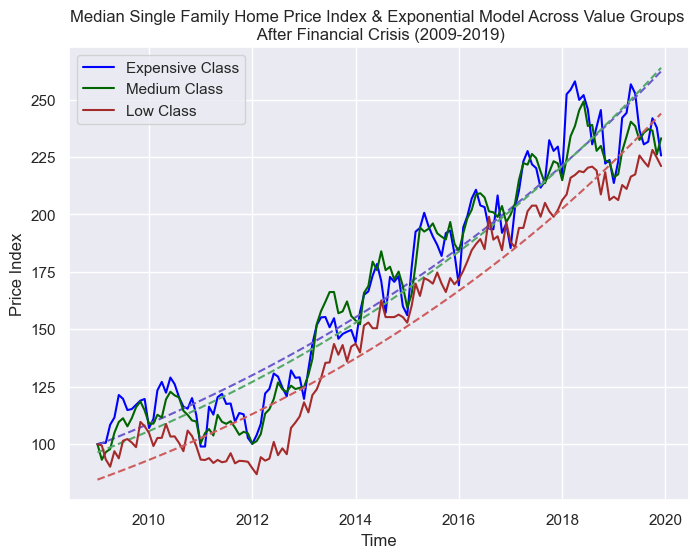

In [323]:
# Exponential Model Visualization

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_aft_crisis_exp , color = 'slateblue', linestyle='--')
ax_3 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_med , label='Medium Class', color = 'darkgreen')
ax_4 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_aft_crisis_med , color = 'g', linestyle='--')
ax_5 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_che , label='Low Class' , color = 'brown')
ax_6 = sns.lineplot(y='Exponential_Model' , x='Time', data=df_aft_crisis_che , color = 'indianred', linestyle='--')
plt.ylabel('Price Index')
plt.xlabel('Time')
plt.title('Median Single Family Home Price Index & Exponential Model Across Value Groups \n After Financial Crisis (2009-2019)')
plt.show()

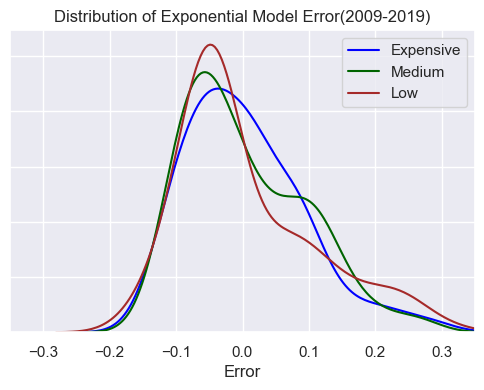

In [324]:
# Histogram of Exponential Model Error 

ax_1 = sns.kdeplot(df_aft_crisis_exp['Error_Exponential'],  color = 'blue', label='Expensive')
ax_2 = sns.kdeplot(df_aft_crisis_med['Error_Exponential'],  color = 'darkgreen', label='Medium')
ax_3 = sns.kdeplot(df_aft_crisis_che['Error_Exponential'],  color = 'brown', label ='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.legend()
plt.xlim(-0.35,0.35)
plt.title('Distribution of Exponential Model Error(2009-2019)')
plt.show()

As you would see in the above figure, the Exponential model does not fit the real house index price very well.
So in the next, I would try the Polynomial Model.

#### B - Polynomial Model

In [325]:
# Fit Polynomial Model on Drift part [After the financial crisis (2009-2019)]

# Expensive Class

c, stats = polynomial.polyfit(df_aft_crisis_exp['Julian'],df_aft_crisis_exp['Price Index'],3,full=True)
df_aft_crisis_exp['Poly_Model'] = df_aft_crisis_exp['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_aft_crisis_exp['Error_Poly'] = (df_aft_crisis_exp['Poly_Model']/df_aft_crisis_exp['Price Index']) - 1 


# -------------------

# Medium Class 

c, stats = polynomial.polyfit(df_aft_crisis_med['Julian'],df_aft_crisis_med['Price Index'],3,full=True)
df_aft_crisis_med['Poly_Model'] = df_aft_crisis_med['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_aft_crisis_med['Error_Poly'] = (df_aft_crisis_med['Poly_Model']/df_aft_crisis_med['Price Index']) - 1 

# -------------------

# Cheap Class


c, stats = polynomial.polyfit(df_aft_crisis_che['Julian'],df_aft_crisis_che['Price Index'],3,full=True)
df_aft_crisis_che['Poly_Model'] = df_aft_crisis_che['Julian'].apply(lambda x :  c[0] + c[1] * x + c[2] * (x**2) + c[3] * (x **3))
df_aft_crisis_che['Error_Poly'] = (df_aft_crisis_che['Poly_Model']/df_aft_crisis_che['Price Index']) - 1 

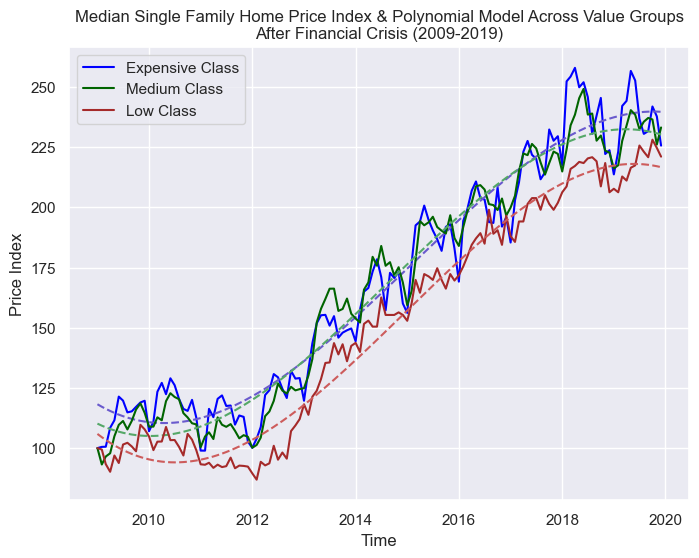

In [326]:
# Polynomial Model Visualization

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Poly_Model' , x='Time', data=df_aft_crisis_exp , color = 'slateblue', linestyle='--')
ax_3 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_med , label='Medium Class', color = 'darkgreen')
ax_4 = sns.lineplot(y='Poly_Model' , x='Time', data=df_aft_crisis_med , color = 'g', linestyle='--')
ax_5 = sns.lineplot(y='Price Index' , x='Time', data=df_aft_crisis_che , label='Low Class' , color = 'brown')
ax_6 = sns.lineplot(y='Poly_Model' , x='Time', data=df_aft_crisis_che , color = 'indianred', linestyle='--')
plt.ylabel('Price Index')
plt.xlabel('Time')
plt.title('Median Single Family Home Price Index & Polynomial Model Across Value Groups\nAfter Financial Crisis (2009-2019)')
plt.show()

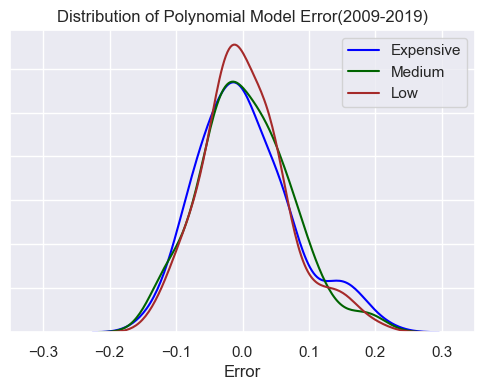

In [327]:
# Histogram of Polynomial Model Error 

ax_1 = sns.kdeplot(df_aft_crisis_exp['Error_Poly'], color = 'blue', label='Expensive')
ax_2 = sns.kdeplot(df_aft_crisis_med['Error_Poly'], color = 'darkgreen', label='Medium')
ax_3 = sns.kdeplot(df_aft_crisis_che['Error_Poly'],  color = 'brown', label ='Low')
ax_1.set(yticklabels=[])
plt.xlabel('Error')
plt.ylabel('')
plt.legend()
plt.xlim(-0.35,0.35)
plt.title('Distribution of Polynomial Model Error(2009-2019)')
plt.show()

In [328]:
# Comparing error of polynomial model and exponential model

print ('-----------Expensive Class---------------')
print (df_aft_crisis_exp['Error_Poly'].describe())
print (df_aft_crisis_exp['Error_Exponential'].describe())


print ('-----------Medium Class---------------')
print (df_aft_crisis_med['Error_Poly'].describe())
print (df_aft_crisis_med['Error_Exponential'].describe())


print ('-----------Low Class---------------')
print (df_aft_crisis_che['Error_Poly'].describe())
print (df_aft_crisis_che['Error_Exponential'].describe())

-----------Expensive Class---------------
count    132.000000
mean       0.004802
std        0.072372
min       -0.143643
25%       -0.045579
50%       -0.006479
75%        0.045688
max        0.213769
Name: Error_Poly, dtype: float64
count    132.000000
mean       0.003794
std        0.089360
min       -0.148440
25%       -0.056953
50%       -0.006899
75%        0.059607
max        0.298438
Name: Error_Exponential, dtype: float64
-----------Medium Class---------------
count    132.000000
mean       0.004570
std        0.068180
min       -0.139362
25%       -0.042811
50%       -0.001954
75%        0.045135
max        0.198778
Name: Error_Poly, dtype: float64
count    132.000000
mean       0.003931
std        0.090847
min       -0.130122
25%       -0.071114
50%       -0.022899
75%        0.079812
max        0.269204
Name: Error_Exponential, dtype: float64
-----------Low Class---------------
count    132.000000
mean       0.004246
std        0.064079
min       -0.133886
25%       -0.0339

Again, By comparing the polynomial and exponential model's distribution of error, it seems that the polynomial model fits better to the drift part. Therefore, I'll model the drift part with the polynomial model and then calculate these models' residuals from the real values. 

All groups have a lower standard deviation for the polynomial model. 

## 2- Modeling Seasonality

There would be 2 steps in this regard: 

    A - Calculating the Residuals of Drift Part (Polynomial Model) From Actual Value
    B - Finding the Cycles Charactristis (applying the FFT algorithm)

### A - Residuals

In [329]:
## Add new columns as 'Residual_Polynomial_Model' and Visualzie It:


df_aft_crisis_exp['Residual_Poly_Model'] = df_aft_crisis_exp['Price Index'] - df_aft_crisis_exp['Poly_Model']
df_aft_crisis_med['Residual_Poly_Model'] = df_aft_crisis_med['Price Index'] - df_aft_crisis_med['Poly_Model']
df_aft_crisis_che['Residual_Poly_Model'] = df_aft_crisis_che['Price Index'] - df_aft_crisis_che['Poly_Model']


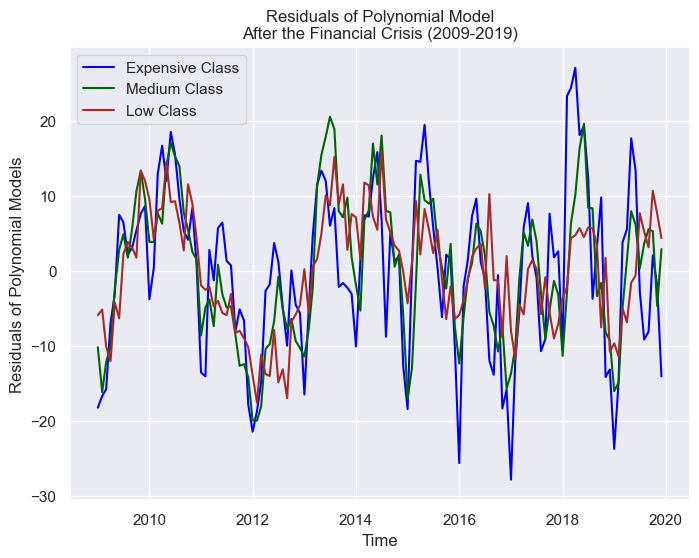

In [330]:
## Visualize the Polynomial Models Residuals: 

plt.figure(figsize=(8,6))
ax_1 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_aft_crisis_exp , label='Expensive Class' , color = 'blue')
ax_2 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_aft_crisis_med , label='Medium Class', color = 'darkgreen')
ax_3 = sns.lineplot(y='Residual_Poly_Model' , x='Time', data=df_aft_crisis_che , label='Low Class' , color = 'brown')
plt.ylabel('Residuals of Polynomial Models')
plt.xlabel('Time')
plt.title('Residuals of Polynomial Model\nAfter the Financial Crisis (2009-2019)')
plt.show()

### B - Finding Cycles Charactristics

Now I am applying the FFT (Fast Fourier Transform) algorithm to extract the cycles' characteristics **(magnitude and length)** .

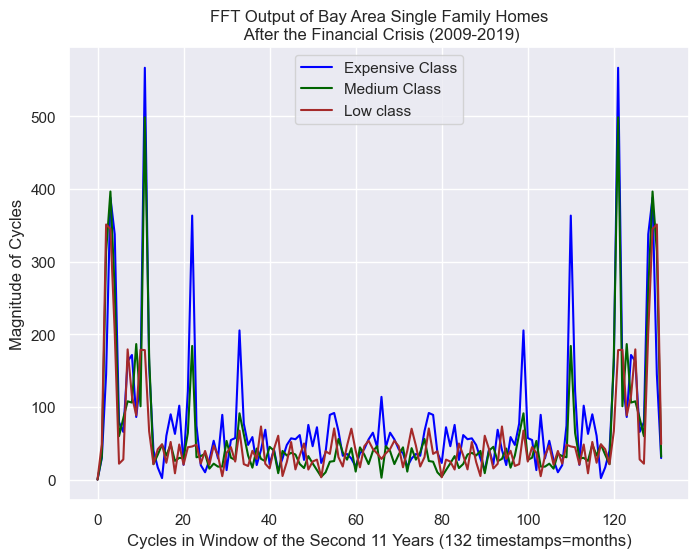

In [331]:
# Let's apply and check the output of Fast Fourier Transform 

fft_aft_crisis_exp = fftpack.fft(df_aft_crisis_exp['Residual_Poly_Model'])
fft_aft_crisis_med = fftpack.fft(df_aft_crisis_med['Residual_Poly_Model'])
fft_aft_crisis_che = fftpack.fft(df_aft_crisis_che['Residual_Poly_Model'])

# Visualize the FFT output


plt.figure(figsize=(8,6))
plt.plot(np.abs(fft_aft_crisis_exp), color = 'blue', label='Expensive Class')
plt.plot(np.abs(fft_aft_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(np.abs(fft_aft_crisis_che), color = 'brown', label='Low class')
plt.title('FFT Output of Bay Area Single Family Homes\n After the Financial Crisis (2009-2019)')
plt.ylabel('Magnitude of Cycles')
plt.xlabel('Cycles in Window of the Second 11 Years (132 timestamps=months)')
plt.legend()
plt.show()


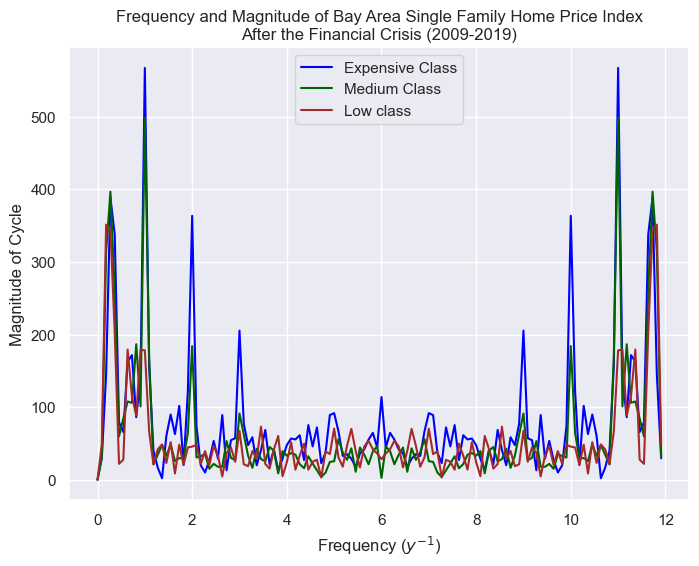

In [332]:
# Visualize the cycles frequencies in scale of '1/year'

plt.figure(figsize = (8,6))
plt.plot(1./11*np.arange(len(fft_aft_crisis_exp)), np.abs(fft_aft_crisis_exp), color = 'blue', label='Expensive Class')
plt.plot(1./11*np.arange(len(fft_aft_crisis_med)), np.abs(fft_aft_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(1./11*np.arange(len(fft_aft_crisis_che)), np.abs(fft_aft_crisis_che), color = 'brown', label='Low class')
#we use np.abs(fft_bay_part) since, the fft_bay_part1 is complex


plt.title("Frequency and Magnitude of Bay Area Single Family Home Price Index\nAfter the Financial Crisis (2009-2019)")
plt.ylabel('Magnitude of Cycle')
plt.xlabel('Frequency ($y^{-1}$)')
plt.legend()
plt.show()

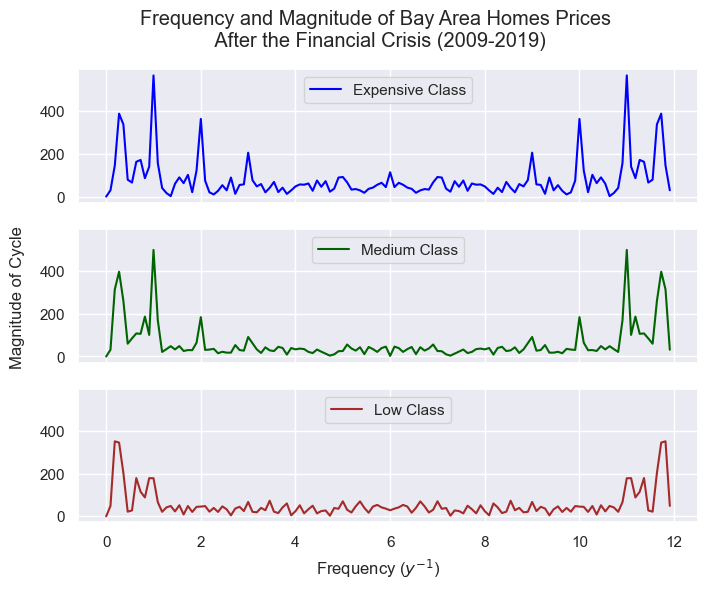

In [387]:
# Visualize the cycles frequencies in scale of '1/year' - Separate Figures


fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize = (8,6))

fig.suptitle("Frequency and Magnitude of Bay Area Homes Prices \n After the Financial Crisis (2009-2019)")
axs[0].plot(1./11*np.arange(len(fft_aft_crisis_exp)), np.abs(fft_aft_crisis_exp), color = 'blue', label='Expensive Class') #we use np.abs(fft_bfr_crisis_exp) since, the fft_bfr_crisis_exp is complex
axs[0].legend(loc="upper center")
axs[1].plot(1./11*np.arange(len(fft_aft_crisis_med)), np.abs(fft_aft_crisis_med), color = 'darkgreen', label='Medium Class')
axs[1].legend(loc="upper center")
axs[2].plot(1./11*np.arange(len(fft_aft_crisis_che)), np.abs(fft_aft_crisis_che), color = 'brown', label='Low Class')
axs[2].legend(loc="upper center")

fig.text(0.5, 0.04, 'Frequency ($y^{-1}$)', ha='center')
fig.text(0.04, 0.5, 'Magnitude of Cycle', va='center', rotation='vertical')

plt.show()

The above figure shows all the cycles of three different class values after the financial crisis (2009-2019). As it can be seen, **the major cycles have the frequency of less than 3 in the above figures (the lowest major cycle can be quarterly)** which is **Similar to Before Crisis. However, the magnitudes and the length of top cycles look different.**

As it is mentioned earlier, the figures are symmetrical so all we need to do is paying attention to the one half of the whole figure (left half of the figure). The left side of the figure represents the long term cycles (low-frequency zone), and as it moves toward the middle of the figure, the cycles represent the shorter term cycles (high-frequency zone)

So let's zoom in and have a bigger picture of those:

<br>

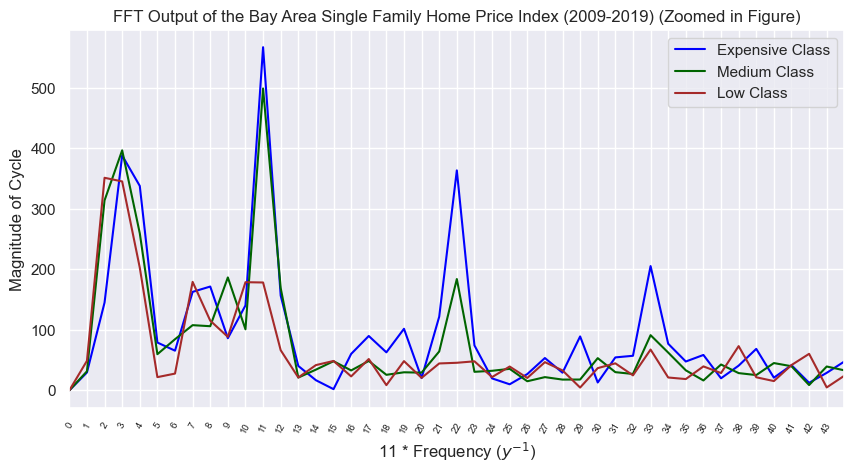

In [334]:
# Zoomed in Figure of Cycles - After the Financial Crisis (2009-2019)

monthly_cycles_in_11_years = 11*12

plt.figure(figsize=(10, 5))
plt.xticks(np.arange(0, 4,  step=1./11),rotation=60, labels=np.arange(0,44), fontsize = 7)
plt.plot(1./11*np.arange(len(fft_aft_crisis_exp)), np.abs(fft_aft_crisis_exp), color = 'blue', label='Expensive Class') #we use np.abs(fft_bfr_crisis_exp) since, the fft_bfr_crisis_exp is complex
plt.plot(1./11*np.arange(len(fft_aft_crisis_med)), np.abs(fft_aft_crisis_med), color = 'darkgreen', label='Medium Class')
plt.plot(1./11*np.arange(len(fft_aft_crisis_che)), np.abs(fft_aft_crisis_che), color = 'brown', label='Low Class')
plt.Circle((0.5, 0.5), 0.2, color='blue')
plt.title("FFT Output of the Bay Area Single Family Home Price Index (2009-2019) (Zoomed in Figure)")
#plt.ylim([0,850])
plt.xlim([0, 4])
plt.xlabel('11 * Frequency ($y^{-1}$)')
plt.ylabel('Magnitude of Cycle')
plt.legend()
plt.show()

***Description of the above chart:*** 
    
Each tick point on x axis should be divided by **11** and then put it as 1/Year to get the frequency.

For example:

there is a local maximum at tick point (x = 3) for expensive class (blue line), so it is basically: 

**3/11 = 1/Year -> Year = 11/3 = 3.67 years (length of cycle)**

Just by taking a glimpse at the above chart, we could say that the expensive and medium classes show more similar behavior compared to the cheap class. In general, the expensive and medium classes have higher cycle magnitude, which means they have a wider range of oscillation.

Also the number of significant lower period cycles in the medium and expensive classes are higher than the cheap class. 

Expensive class shows significant short term cycles (less than one year) 

### Cycles Comparision

Statistical Testing: 

It would not be easy to compare cycles magnitude with different frequencies across value groups. 
Two approaches can be taken at this step. One is using the same groups as the previous part (before the financial crisis) to be easier to compare the results of the same group for before and after the financial crisis. Approach 2 is finding the groups based on the current part (after the financial crisis), so the results can be more promising for this section. 
Since this research's main purpose is to compare the cycle behavior across value groups at any certain period, I decided to base my research using the second approach, which is coming up with new grouping boundaries for this section. 


***

** These groups are the results of the next several cells ahead and came at this section for documentation purposes)

    - Semi Short term cycles (0.3 - 0.6 year)
    - Short term cycles (1 - ~ 1.5 year)  # I used 1.57 in calculation
    - Semi Medium term cycles (2 to ~3.5 years) # I used 3.67 in calculation
    - Medium term cycles (4 to 6 years) 
    - Long term cycles (more than 6 years)--> this is very weak in medium and expensive class ! 

***

In [335]:
## Creating Cycles DataFrames - Part one Magnitude 



# 'Expensive class' cycle magnitudes (The first cycle with zero index is the representive of infinite cycle so it is removed)
df_aft_crisis_cycles_exp = pd.DataFrame(data=np.abs(fft_aft_crisis_exp), columns=['FFT Absolute Value']).iloc[1:]
df_aft_crisis_cycles_exp.index.name = 'Index'


# 'Medium class' cycle magnitudes
df_aft_crisis_cycles_med = pd.DataFrame(data=np.abs(fft_aft_crisis_med), columns=['FFT Absolute Value']).iloc[1:]
df_aft_crisis_cycles_med.index.name = 'Index'


# 'Cheap class' cycle magnitudes
df_aft_crisis_cycles_che = pd.DataFrame(data=np.abs(fft_aft_crisis_che), columns=['FFT Absolute Value']).iloc[1:]
df_aft_crisis_cycles_che.index.name = 'Index'


## ------------------
## ------------------


## Cycles DataFrames - Part two Duration (Length)

df_aft_crisis_cycles_exp['Cycle(year)'] = df_aft_crisis_cycles_exp.index.to_series().apply(lambda x : round(11./int(x),2))
df_aft_crisis_cycles_med['Cycle(year)'] = df_aft_crisis_cycles_med.index.to_series().apply(lambda x : round(11./int(x),2))
df_aft_crisis_cycles_che['Cycle(year)'] = df_aft_crisis_cycles_che.index.to_series().apply(lambda x : round(11./int(x),2))

Based on the Nyquist frequency, we just need to check the half of the frequencies (132/2 = 66). Also the first one (index = 0) does not mean anything in terms of duration (infinity duration).

In [336]:
# Final Version of Cycles Dataframes 

df_aft_crisis_cycles_exp = df_aft_crisis_cycles_exp.iloc[0:66].copy()
df_aft_crisis_cycles_med = df_aft_crisis_cycles_med.iloc[0:66].copy()
df_aft_crisis_cycles_che = df_aft_crisis_cycles_che.iloc[0:66].copy()

####  Apply Statistical Testing on Cycle Groups

Steps : 

- Find All Cycles of Each Group (length and magnitude)

- Grouping Cycles into Several Groups Based on Their Frequencies (Length)

- Calculating the Average of Cycle Magnitudes for Each Sub Group

- Perform Statistical Test (Chi-Square Test for Independence)

Previously, we extracted the cycles features. The next step would be grouping cycle frequencies based on the importance of cycles that will be illustrated later.

How to group the cycle can impact our results. There is no certain method to make cycle comparison, and it's more based on the researcher's perspective. In this research, I decided to do a comparision on **Major Cycles**. 
So, the first step would be extracting more **influential regions of cycles (based on the strongest magnitude)**, and then compare similar duration across value groups. 

In [337]:
## Creating new Cycles DataFrames just with top 30 Cycles (based on Magnitudes)

df_aft_crisis_cycles_exp_top = df_aft_crisis_cycles_exp.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]
df_aft_crisis_cycles_med_top = df_aft_crisis_cycles_med.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]
df_aft_crisis_cycles_che_top = df_aft_crisis_cycles_che.sort_values(by='FFT Absolute Value', ascending=False).iloc[:30]

Now let's do some visualization to have the better idea of where these major cycles locate: 

In [338]:
# This cell is just for getting some insight

print (df_aft_crisis_cycles_exp.sort_values(by='Cycle(year)',ascending=False).head(10))
print (df_aft_crisis_cycles_exp.sort_values(by='FFT Absolute Value',ascending=False).head(10))


print (df_aft_crisis_cycles_che.sort_values(by='Cycle(year)',ascending=False).head(10))

       FFT Absolute Value  Cycle(year)
Index                                 
1               29.587096        11.00
2              145.106342         5.50
3              388.218959         3.67
4              337.873399         2.75
5               79.059932         2.20
6               65.628008         1.83
7              162.793158         1.57
8              171.604375         1.38
9               86.208244         1.22
10             140.368163         1.10
       FFT Absolute Value  Cycle(year)
Index                                 
11             567.113040         1.00
3              388.218959         3.67
22             363.542094         0.50
4              337.873399         2.75
33             205.425961         0.33
8              171.604375         1.38
7              162.793158         1.57
12             156.699722         0.92
2              145.106342         5.50
10             140.368163         1.10
       FFT Absolute Value  Cycle(year)
Index                    

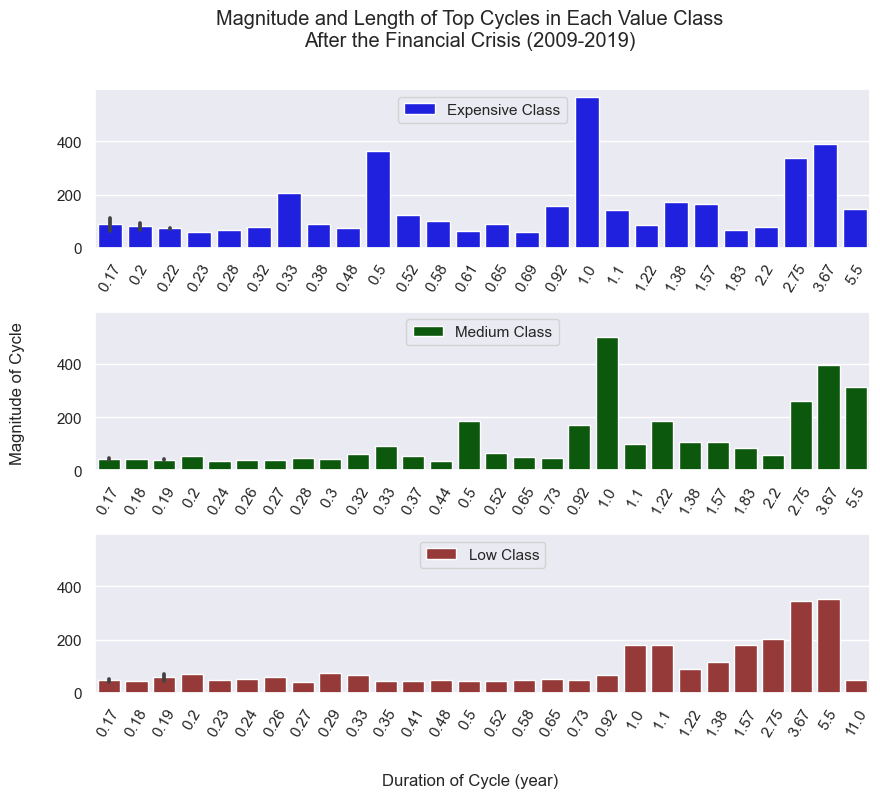

In [339]:
## Top 30 Cycles for Each Value Group Visualziation 

fig, axs = plt.subplots(3,1, sharex=False, sharey=True, figsize = (10,8))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.4)
fig.suptitle("Magnitude and Length of Top Cycles in Each Value Class\nAfter the Financial Crisis (2009-2019)")

sns.barplot(ax =axs[0], x='Cycle(year)',y='FFT Absolute Value', data = df_aft_crisis_cycles_exp_top, color = 'blue', label='Expensive Class')
sns.barplot(ax =axs[1], x='Cycle(year)',y='FFT Absolute Value', data = df_aft_crisis_cycles_med_top, color = 'darkgreen', label='Medium Class')
sns.barplot(ax= axs[2], x='Cycle(year)',y='FFT Absolute Value', data = df_aft_crisis_cycles_che_top, color = 'brown', label='Low Class')


for ax in axs.flat:
    ax.tick_params(axis='x', labelrotation= 60)

for ax in axs.flat: 
    ax.legend(loc="upper center")

for ax in axs.flat:
    ax.set(xlabel='', ylabel='')

fig.text(0.04, 0.5, 'Magnitude of Cycle', va='center', rotation='vertical')
fig.text(0.5, 0.01, 'Duration of Cycle (year)', ha='center')
plt.show()

Some insight by comparison before and after the financial crisis : 
    
    
      1 - Short-term cycles are more significant after the financial crisis compared to before the financial crisis.
      2 - Long term cycles after the financial crisis decreased significantly, especially for expensive and medium classes and long term cycles. They are not in the top 30 cycles anymore after the financial crisis part. 
      3 - As opposed to before the financial crisis, where the most significant cycles are in the medium-term group, after the financial crisis, short term and semi medium term have the highest magnitude, especialy for expensive and medium classes. 

By looking at the above figure, we can realize that there are 5 regions of major cycles: 

    - Semi Short term cycles (0.3 - 0.6 year)
    - Short term cycles (1 - ~ 1.5 year)  # I used 1.57 in calculation
    - Semi Medium term cycles (2 to ~3.5 years) # I used 3.67 in calculation
    - Medium term cycles (4 to 6 years) 
    - Long term cycles (more than 6 years)--> this is very weak in medium and expensive class ! 

Now let's make the new column as **Cycle(group)** so we can compare groups across different value groups.

In [340]:
# Function for grouping the cycle duration

def cycle_grouper_aft(row):
    
    if row < 0.25:
        val = 'Noise'  
    elif 0.28 <= row <= 0.65 : 
        val ='Semi Short'
    elif 0.92 <= row <= 1.57 :
        val = 'Short'
    elif 2.2 < row <= 3.67 : 
        val = 'Semi Medium'
    elif 4 <= row < 6 :
        val = 'Medium'
    elif  6 <= row: 
        val = 'Long'
    else: 
        val = None
        
    return val

In [341]:
# Create 'Cycle(group)' Column in "Cycle" DataFrames

df_aft_crisis_cycles_exp['Cycle(group)'] = df_aft_crisis_cycles_exp['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )
df_aft_crisis_cycles_med['Cycle(group)'] = df_aft_crisis_cycles_med['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )
df_aft_crisis_cycles_che['Cycle(group)'] = df_aft_crisis_cycles_che['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )

In [342]:
# Create 'Cycle(group)' Column in "Top Cycle" DataFrames

df_aft_crisis_cycles_exp_top['Cycle(group)'] = df_aft_crisis_cycles_exp_top['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )
df_aft_crisis_cycles_med_top['Cycle(group)'] = df_aft_crisis_cycles_med_top['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )
df_aft_crisis_cycles_che_top['Cycle(group)'] = df_aft_crisis_cycles_che_top['Cycle(year)'].apply(lambda x : cycle_grouper_aft(x) )

In [343]:
# Checking Some Entries of Top Cylces Across Value Groups --- This cell is just for getting some insight 

print (df_aft_crisis_cycles_exp_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))
print (df_aft_crisis_cycles_med_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))
print (df_aft_crisis_cycles_che_top.sort_values(by='FFT Absolute Value', ascending=False).head(13))

       FFT Absolute Value  Cycle(year) Cycle(group)
Index                                              
11             567.113040         1.00        Short
3              388.218959         3.67  Semi Medium
22             363.542094         0.50   Semi Short
4              337.873399         2.75  Semi Medium
33             205.425961         0.33   Semi Short
8              171.604375         1.38        Short
7              162.793158         1.57        Short
12             156.699722         0.92        Short
2              145.106342         5.50       Medium
10             140.368163         1.10        Short
21             121.786121         0.52   Semi Short
66             113.918067         0.17        Noise
19             101.781614         0.58   Semi Short
       FFT Absolute Value  Cycle(year) Cycle(group)
Index                                              
11             498.895071         1.00        Short
3              396.708927         3.67  Semi Medium
2           

In [344]:
# Checking the Average of Cycle Magnitudes in Each 'Time Group' Across All Value Groups

print ((df_aft_crisis_cycles_exp_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))
print ((df_aft_crisis_cycles_med_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))
print ((df_aft_crisis_cycles_che_top).groupby(by = 'Cycle(group)').mean().sort_values(by='Cycle(year)', ascending=False))

              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Medium                145.106342     5.500000
Semi Medium           363.046179     3.210000
Short                 214.131117     1.198333
Semi Short            125.447377     0.465000
Noise                  79.346298     0.201250
              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Medium                313.993535     5.500000
Semi Medium           328.177413     3.210000
Short                 194.902521     1.198333
Semi Short             69.715471     0.412222
Noise                  43.303182     0.191429
              FFT Absolute Value  Cycle(year)
Cycle(group)                                 
Long                   48.821830    11.000000
Medium                351.315222     5.500000
Semi Medium           274.013697     3.210000
Short                 134.408658     1.198333
Semi Short             52.251184     0.456667
Noise                  53.788503  

The test that I am going to use is **Chi Square test of independence of variables**.



In this research, since the cycle groups are the same across value groups, it can be assumed as ***the two categorial independent research***. 

**Variable 1**: Cycle Groups (Categories are semi-short, short, semi medium, medium, and long cycles)

**Variable 2**: Value Classes (Categories are cheap, medium, and expensive class)

<br>

To do the chi-square test, we first need to form a **Contingency Table** or crosstab table. In other words, I need to integrate 'before crisis cycles' data frames of all groups together. The data frame should have:

- Value Classes (Cheap, Medium, and Expensive) as rows
- Cycle Lengths (Semi Short, Short, Semi Medium, Medium, and Long) as columns 

and each entry has the average cycle magnitude calculated a step earlier.

<br>

In [345]:
# Creating Contingency Table of After the Financial Crisis Cycles 

data_aft_crisis_all_values_all_cycles = {'Semi Short Cycle': [52.25,69.72,125.45],
                                        'Short Cycle':[134.41,194.90,214.13],
                                        'Semi Medium Cycle':[274.01,328.18,363.05],
                                        'Medium Cycle':[351.32,314.00,145.11],
                                        'Long Cycle':[48.82,31.52,29.59]}

df_aft_crisis_all_values_all_cycles = pd.DataFrame(data_aft_crisis_all_values_all_cycles, 
                                                columns = ['Semi Short Cycle','Short Cycle','Semi Medium Cycle','Medium Cycle','Long Cycle'],
                                                index=['Low Class','Medium Class','Expensive Class'])

In [346]:
# Let's check the contingency table (crosstab) of cycles Magnitudes across value groups 

df_aft_crisis_all_values_all_cycles

,Semi Short Cycle,Short Cycle,Semi Medium Cycle,Medium Cycle,Long Cycle
Low Class,52.25,134.41,274.01,351.32,48.82
Medium Class,69.72,194.90,328.18,314.00,31.52
Expensive Class,125.45,214.13,363.05,145.11,29.59


In [347]:
# Do Chi-square test of independence of variables

chi2_contingency(df_aft_crisis_all_values_all_cycles)

(162.07077455136442,
 5.899647224762852e-31,
 8,
 array([[ 79.57586147, 174.78258087, 310.44298977, 260.65259645,
          35.35597143],
        [ 86.74111864, 190.52054609, 338.39623861, 284.12256398,
          38.53953267],
        [ 81.10301988, 178.13687303, 316.40077162, 265.65483956,
          36.0344959 ]]))

<br>

Here they are the Chi Square test resutls: 
    
<br>    
    
    - g (test statistic)              : 162.07
    - p (p-value of the test)         : 5.90 e-31
    - dof (degree of freedom)         : 8
    - Expected (expected frequencies) : array([[ 79.58, 174.78, 310.44, 260.65, 35.36],
                                               [ 86.74, 190.52, 338.40, 284.12, 38.54],
                                               [ 81.10, 178.14, 316.40, 265.65, 36.03 ]]))
                                                
<br>

As you would see the **P-value** of the Chi Square test is very low (p=5.90 e-31) < 0.05 . So we can say the cycles show different pattern across value groups in Bay Area. 

# <font color='blue' size=5> Part Three - Macroeconomic Indicators Impact on Bay Area Single Family Home Price Across Value Groups </font>

<font color=blue size=4 > Major Steps: </font> 




 
<font color='green' size=3 >  -> 
    Acquiring Macroeconomic Datasets
    -> Data Wrangling -> Calculating Pearson Correlation Coefficient with Single Family Home Price Index Across Value Classes -> Perform Fisherman Z Transformation to check the significant difference of correlation coefficient across value classes ->  </font> 



<br>

In [348]:
## Import Macroeconomic Execl Sheet

df_macro_excel = pd.ExcelFile("Data/Macroeconomic-Data/MacroData.xlsx")

In [349]:
# Create Pandas DF of all excel file sheets 

df_macro_1 = pd.read_excel(df_macro_excel, 'AllMacroData')
df_macro_2 = pd.read_excel(df_macro_excel, 'GDP')
df_macro_3 = pd.read_excel(df_macro_excel, 'Mortgage Loan Interest Rate')

In [350]:
# check dataframes columns 

print (df_macro_1.info())
print (df_macro_2.info())
print (df_macro_3.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360 entries, 0 to 359
Data columns (total 4 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Time                                 360 non-null    datetime64[ns]
 1   CPI                                  360 non-null    float64       
 2   Unemployment Rate                    360 non-null    float64       
 3   Disposal Personal Income Per Capita  360 non-null    int64         
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 11.4 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121 entries, 0 to 120
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Time                  121 non-null    datetime64[ns]
 1   GDP Per Capita - Qrt  121 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usag

<br>

The macroeconomic indicators that will be investigated in this research are : 

    - GDP Per Capita
    - CPI (Consumer Price Index)
    - Disposal Household Income Per Capita
    - Unemployement Rate
    - Interest Rate
    
    
<br>   

All of these indicators are obtained through https://fred.stlouisfed.org and are in **Real** format to exclude the impact of inflation.

First I need to do some data wrangling for the datasets that I obtained.

#### 1 - GDP Per Capita: 

In [351]:
# Check Some Columns
df_macro_2.head(5)

,Time,GDP Per Capita - Qrt
0,1990-01-01,37593
1,1990-04-01,37612
2,1990-07-01,37505
3,1990-10-01,37032
4,1991-01-01,36746


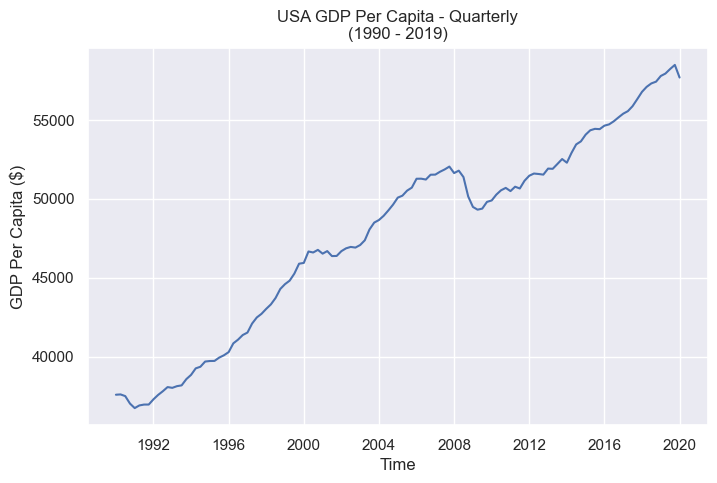

In [352]:
# Visualzie GDP Per Capita - Quarterly

plt.figure(figsize=(8, 5))
plt.plot(df_macro_2['Time'],df_macro_2['GDP Per Capita - Qrt'])
plt.title("USA GDP Per Capita - Quarterly\n(1990 - 2019)")
plt.ylabel('GDP Per Capita ($)')
plt.xlabel('Time')
plt.show()

GDP (Gross Domestic Product) dataset is in quarterly format, therefore I need to interpolate to have monthly format dataset.

In [353]:
# Function to interpolate quarterly to monthly

def interpl_func_qrt_mnth(x,y,point=2):
    step = (y-x)/(point+1)
    p1 = x + step
    p2 = x + (2*step)
    return p1,p2

In [354]:
# Create Monthly GDP list from Quarterly 

df_macro_gdp_mnth = []
df_macro_gdp_qrt = df_macro_2['GDP Per Capita - Qrt'].to_numpy()
for i in range(len(df_macro_gdp_qrt)-1):
    points = interpl_func_qrt_mnth(df_macro_gdp_qrt[i],df_macro_gdp_qrt[i+1])
    df_macro_gdp_mnth.append(df_macro_gdp_qrt[i])
    df_macro_gdp_mnth.append(int(points[0]))
    df_macro_gdp_mnth.append(int(points[1]))
    

#### 2 - Mortgage Loan Interest Rate 

In [355]:
# Check Some Columns
df_macro_3.head(5)

,Time,Mortgage Loan Interest - ByWeekly
0,1990-01-05,9.83
1,1990-01-12,9.80
2,1990-01-19,9.90
3,1990-01-26,10.05
4,1990-02-02,10.17


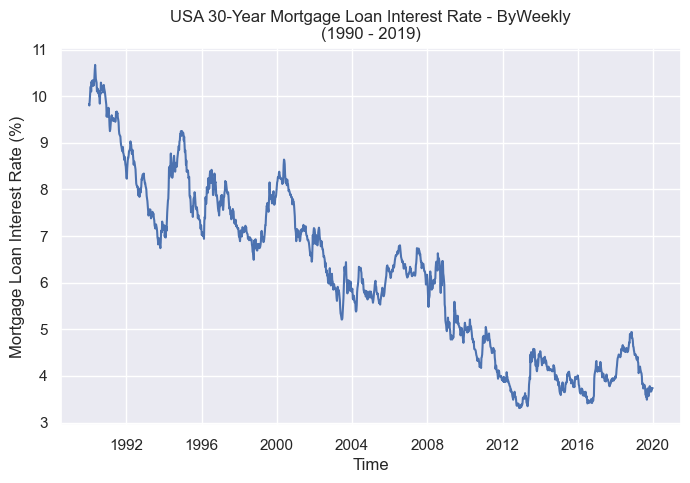

In [356]:
# Visualzie Mortgage Loan Interest Rate - Byweekly

plt.figure(figsize=(8, 5))
plt.plot(df_macro_3['Time'],df_macro_3['Mortgage Loan Interest - ByWeekly'])
plt.title("USA 30-Year Mortgage Loan Interest Rate - ByWeekly\n(1990 - 2019)")
plt.ylabel('Mortgage Loan Interest Rate (%)')
plt.xlabel('Time')
plt.show()

Interest Rate dataset that I acquired is weekly. Since all other data is monthly, I have to change it to monthly. 

In [357]:
# Create Monthly Mortgage Loan Interest Rate based on Weekly Data

df_macro_rate_mnth = df_macro_3.groupby(pd.Grouper(key='Time', freq='M')).mean()

In [358]:
df_macro_rate_mnth.head(4)

,Mortgage Loan Interest - ByWeekly
Time,
1990-01-31,9.8950
1990-02-28,10.1975
1990-03-31,10.2680
1990-04-30,10.3700


#### 3 - CPI, Unemployment Rate, Disposal Household Income

In [359]:
# Check Some Columns
df_macro_1.head(3)

,Time,CPI,Unemployment Rate,Disposal Personal Income Per Capita
0,1990-01-01,53.793610,5.4,27288
1,1990-02-01,54.004565,5.3,27326
2,1990-03-01,54.257711,5.2,27308


Disposal Personal Income Per Capita is the function of Disposal Household Income, so I will use Disposal Personal Income Per Capita in this research to calculate the correlation with Single-Family Home Price.

<br>

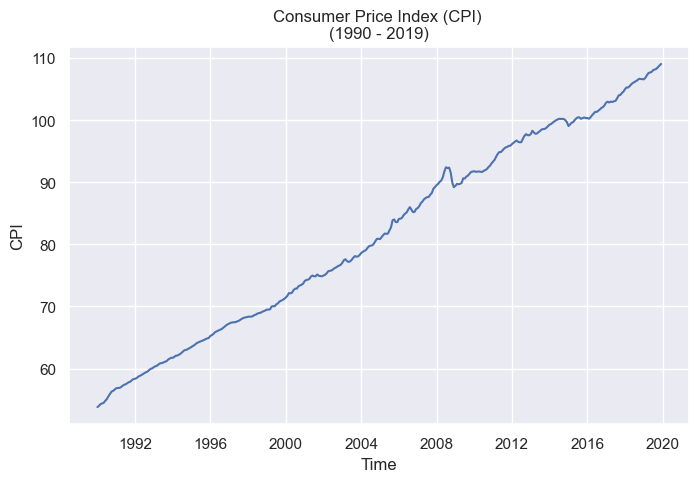

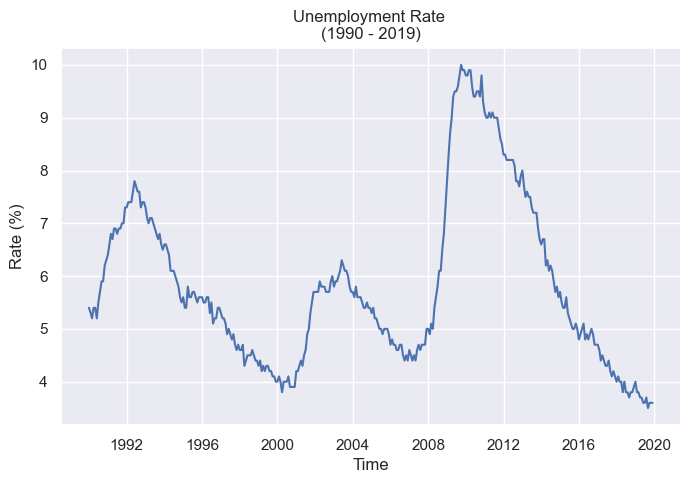

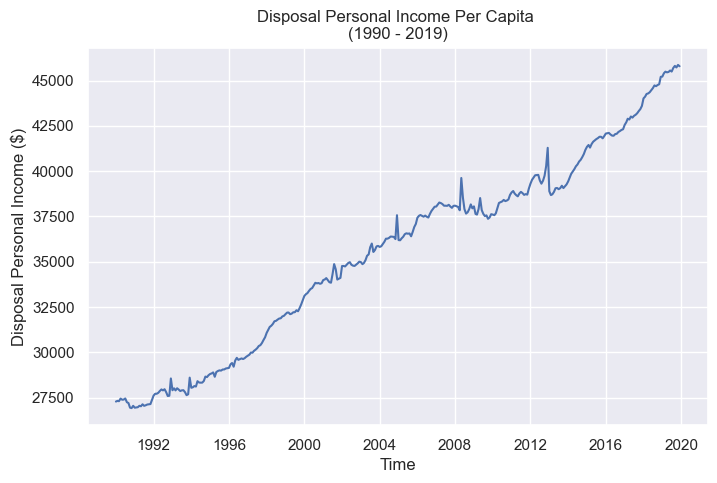

In [360]:
## CPI, Unemployment Rate, Disposal Personal Income Per Capita Visualziation 

plt.figure(figsize=(8, 5))
plt.plot(df_macro_1['Time'],df_macro_1['CPI'])
plt.title("Consumer Price Index (CPI) \n(1990 - 2019)")
plt.ylabel('CPI')
plt.xlabel('Time')
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(df_macro_1['Time'],df_macro_1['Unemployment Rate'])
plt.title("Unemployment Rate \n(1990 - 2019)")
plt.ylabel('Rate (%)')
plt.xlabel('Time')
plt.show()


plt.figure(figsize=(8, 5))
plt.plot(df_macro_1['Time'],df_macro_1['Disposal Personal Income Per Capita'])
plt.title("Disposal Personal Income Per Capita \n(1990 - 2019)")
plt.ylabel('Disposal Personal Income ($)')
plt.xlabel('Time')
plt.show()

After initial visualziation, let's intergrate all macroeconomic indicators to one dataframe:

In [361]:
df_macro_1['GDP Per Capita'] = df_macro_gdp_mnth 
df_macro_1['Interest Rate'] = df_macro_rate_mnth['Mortgage Loan Interest - ByWeekly'].to_numpy()

In [362]:
df_macro = df_macro_1.copy()

In [363]:
df_macro.head()

,Time,CPI,Unemployment Rate,Disposal Personal Income Per Capita,GDP Per Capita,Interest Rate
0,1990-01-01,53.793610,5.4,27288,37593,9.8950
1,1990-02-01,54.004565,5.3,27326,37599,10.1975
2,1990-03-01,54.257711,5.2,27308,37605,10.2680
3,1990-04-01,54.384285,5.4,27451,37612,10.3700
4,1990-05-01,54.468667,5.4,27389,37576,10.4775


Now that we have all macroeconomic indicators in one data frame. We can plot the correlation heatmap to check whether there is any multicollinearity or not. 

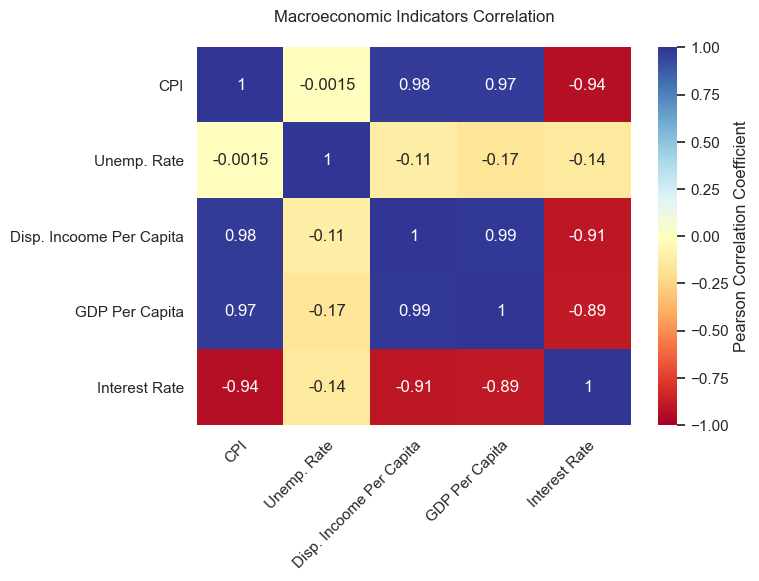

In [364]:
# Correlation Heatmap of Macroeconomic Indicators


plt.figure(figsize=(7,5))
heatmap = sns.heatmap(df_macro.corr(), annot = True, vmin=-1, vmax=1, center= 0, cmap= 'RdYlBu',
                      xticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     yticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     cbar_kws={'label': 'Pearson Correlation Coefficient', 'orientation': 'vertical'})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right',rotation_mode="anchor")
plt.title('Macroeconomic Indicators Correlation\n')
plt.show()

Now it's time to calculate the Pearson Correlation Coefficient between the macroeconomic indicators and House Price Index in each value class for both before and after the financial crisis separately. 

<br>

<font color='blue' size=5> Before Financial Crisis (1990-2006) </font> 

</br>

## 1- Cheap Class

In [365]:
# Calculating Pearson Correlation Coefficient of Cheap Class with Macroeconomic Indicators - Before Financial Crisis

# CPI (Inflation)

## Cheap Class has NaN value (from 0 to 48 index + 55 index that should be dropped to calculate correlation)
corr_bfr_crisis_che_cpi , p_value_bfr_crisis_che_cpi = pearsonr(df_bfr_crisis_che['Price Index'].iloc[48:].dropna(), df_macro['CPI'].iloc[48:204].drop(55))
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Low Value Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_che_cpi)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_cpi)


# Unemployment Rate 

corr_bfr_crisis_che_unem , p_value_bfr_crisis_che_unem = pearsonr(df_bfr_crisis_che['Price Index'].iloc[48:].dropna(), df_macro['Unemployment Rate'].iloc[48:204].drop(55))
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Low Value Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_che_unem)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_unem)


# Disposal Personal Income Per Capita  

corr_bfr_crisis_che_inc , p_value_bfr_crisis_che_inc = pearsonr(df_bfr_crisis_che['Price Index'].iloc[48:].dropna(), df_macro['Disposal Personal Income Per Capita'].iloc[48:204].drop(55))
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Low Value Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_che_inc)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_inc)


# GDP Per Capita  

corr_bfr_crisis_che_gdp , p_value_bfr_crisis_che_gdp = pearsonr(df_bfr_crisis_che['Price Index'].iloc[48:].dropna(), df_macro['GDP Per Capita'].iloc[48:204].drop(55))
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Low Value Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_che_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_gdp)


# Interest Rate  

corr_bfr_crisis_che_rate , p_value_bfr_crisis_che_rate = pearsonr(df_bfr_crisis_che['Price Index'].iloc[48:].dropna(), df_macro['Interest Rate'].iloc[48:204].drop(55))
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Low Value Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_che_rate)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_rate)

#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Low Value Class - Before Financial Crisis : 0.942
P value: 1.336e-74 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Low Value Class - Before Financial Crisis : 0.052
P value: 5.182e-01 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Low Value Class - Before Financial Crisis : 0.895
P value: 1.323e-55 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Low Value Class - Before Financial Crisis : 0.891
P value: 2.457e-54 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Low Value Class - Before Financial Crisis : -0.745
P value: 1.197e-28 
 



## 2 - Medium Class

In [366]:
# Calculating Pearson Correlation Coefficient of Medium Class with Macroeconomic Indicators - Before Financial Crisis

# CPI (Inflation)

corr_bfr_crisis_med_cpi , p_value_bfr_crisis_med_cpi = pearsonr(df_bfr_crisis_med['Price Index'], df_macro['CPI'].iloc[:204])
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Medium Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_med_cpi)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_cpi)


# Unemployment Rate 

corr_bfr_crisis_med_unem , p_value_bfr_crisis_med_unem = pearsonr(df_bfr_crisis_med['Price Index'], df_macro['Unemployment Rate'].iloc[:204])
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Medium Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_med_unem)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_unem)


# Disposal Personal Income Per Capita  

corr_bfr_crisis_med_inc , p_value_bfr_crisis_med_inc = pearsonr(df_bfr_crisis_med['Price Index'], df_macro['Disposal Personal Income Per Capita'].iloc[:204])
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Medium Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_med_inc)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_inc)


# GDP Per Capita  

corr_bfr_crisis_med_gdp , p_value_bfr_crisis_med_gdp = pearsonr(df_bfr_crisis_med['Price Index'], df_macro['GDP Per Capita'].iloc[:204])
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Medium Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_med_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_gdp)


# Interest Rate  

corr_bfr_crisis_med_rate , p_value_bfr_crisis_med_rate = pearsonr(df_bfr_crisis_med['Price Index'], df_macro['Interest Rate'].iloc[:204])
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Medium Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_med_rate)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_rate)

#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Medium Class - Before Financial Crisis : 0.908
P value: 4.914e-78 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Medium Class - Before Financial Crisis : -0.311
P value: 5.940e-06 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Medium Class - Before Financial Crisis : 0.915
P value: 1.057e-81 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Medium Class - Before Financial Crisis : 0.899
P value: 2.302e-74 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Medium Class - Before Financial Crisis : -0.719
P value: 1.051e-33 
 



## 3 - Expensive Class

In [367]:
# Calculating Pearson Correlation Coefficient of Expensive Class with Macroeconomic Indicators - Before Financial Crisis

# CPI (Inflation)

corr_bfr_crisis_exp_cpi , p_value_bfr_crisis_exp_cpi = pearsonr(df_bfr_crisis_exp['Price Index'], df_macro['CPI'].iloc[:204])
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Expensive Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_exp_cpi)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_cpi)


# Unemployment Rate 

corr_bfr_crisis_exp_unem , p_value_bfr_crisis_exp_unem = pearsonr(df_bfr_crisis_exp['Price Index'], df_macro['Unemployment Rate'].iloc[:204])
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Expensive Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_exp_unem)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_unem)


# Disposal Personal Income Per Capita  

corr_bfr_crisis_exp_inc , p_value_bfr_crisis_exp_inc = pearsonr(df_bfr_crisis_exp['Price Index'], df_macro['Disposal Personal Income Per Capita'].iloc[:204])
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Expensive Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_exp_inc)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_inc)


# GDP Per Capita  

corr_bfr_crisis_exp_gdp , p_value_bfr_crisis_exp_gdp = pearsonr(df_bfr_crisis_exp['Price Index'], df_macro['GDP Per Capita'].iloc[:204])
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Expensive Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_exp_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_gdp)


# Interest Rate  

corr_bfr_crisis_exp_rate , p_value_bfr_crisis_exp_rate = pearsonr(df_bfr_crisis_exp['Price Index'], df_macro['Interest Rate'].iloc[:204])
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Expensive Class - Before Financial Crisis : %.3f' % corr_bfr_crisis_exp_rate)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_rate)

#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Expensive Class - Before Financial Crisis : 0.938
P value: 1.227e-94 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Expensive Class - Before Financial Crisis : -0.421
P value: 3.571e-10 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Expensive Class - Before Financial Crisis : 0.956
P value: 1.273e-109 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Expensive Class - Before Financial Crisis : 0.945
P value: 7.740e-100 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Expensive Class - Before Financial Crisis : -0.724
P value: 1.755e-34 
 



<br>

<font color='blue' size=5> Aftrer Financial Crisis (2009-2019) </font> 

</br>

## 1 - Cheap Class

In [368]:
# Calculating Pearson Correlation Coefficient of Cheap Class with Macroeconomic Indicators - After Financial Crisis

# CPI (Inflation)

corr_aft_crisis_che_cpi , p_value_aft_crisis_che_cpi = pearsonr(df_aft_crisis_che['Price Index'], df_macro['CPI'].iloc[-132:])
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Low Value Class - After Financial Crisis : %.3f' % corr_aft_crisis_che_cpi)
print ('P value: %.3e \n \n' %p_value_aft_crisis_che_cpi)


# Unemployment Rate 

corr_aft_crisis_che_unem , p_value_aft_crisis_che_unem = pearsonr(df_aft_crisis_che['Price Index'], df_macro['Unemployment Rate'].iloc[-132:])
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Low Value Class - After Financial Crisis : %.3f' % corr_aft_crisis_che_unem)
print ('P value: %.3e \n \n' %p_value_aft_crisis_che_unem)


# Disposal Personal Income Per Capita  

corr_aft_crisis_che_inc , p_value_aft_crisis_che_inc = pearsonr(df_aft_crisis_che['Price Index'], df_macro['Disposal Personal Income Per Capita'].iloc[-132:])
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Low Value Class - After Financial Crisis : %.3f' % corr_aft_crisis_che_inc)
print ('P value: %.3e \n \n' %p_value_aft_crisis_che_inc)


# GDP Per Capita  

corr_aft_crisis_che_gdp , p_value_aft_crisis_che_gdp = pearsonr(df_aft_crisis_che['Price Index'], df_macro['GDP Per Capita'].iloc[-132:])
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Low Value Class - After Financial Crisis : %.3f' % corr_aft_crisis_che_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_che_gdp)


# Interest Rate  

corr_aft_crisis_che_rate , p_value_aft_crisis_che_rate = pearsonr(df_aft_crisis_che['Price Index'], df_macro['Interest Rate'].iloc[-132:])
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Low Value Class - After Financial Crisis : %.3f' % corr_aft_crisis_che_rate)
print ('P value: %.3e \n \n' %p_value_aft_crisis_che_rate)



#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Low Value Class - After Financial Crisis : 0.929
P value: 4.523e-58 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Low Value Class - After Financial Crisis : -0.966
P value: 2.346e-78 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Low Value Class - After Financial Crisis : 0.939
P value: 2.764e-62 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Low Value Class - After Financial Crisis : 0.969
P value: 2.457e-54 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Low Value Class - After Financial Crisis : -0.312
P value: 2.702e-04 
 



## 2 - Medium Class

In [369]:
# Calculating Pearson Correlation Coefficient of Medium Class with Macroeconomic Indicators - After Financial Crisis

# CPI (Inflation)

corr_aft_crisis_med_cpi , p_value_aft_crisis_med_cpi = pearsonr(df_aft_crisis_med['Price Index'], df_macro['CPI'].iloc[-132:])
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Medium Class - After Financial Crisis : %.3f' % corr_aft_crisis_med_cpi)
print ('P value: %.3e \n \n' %p_value_aft_crisis_med_cpi)


# Unemployment Rate 

corr_aft_crisis_med_unem , p_value_aft_crisis_med_unem = pearsonr(df_aft_crisis_med['Price Index'], df_macro['Unemployment Rate'].iloc[-132:])
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Medium Class - After Financial Crisis : %.3f' % corr_aft_crisis_med_unem)
print ('P value: %.3e \n \n' %p_value_aft_crisis_med_unem)


# Disposal Personal Income Per Capita  

corr_aft_crisis_med_inc , p_value_aft_crisis_med_inc = pearsonr(df_aft_crisis_med['Price Index'], df_macro['Disposal Personal Income Per Capita'].iloc[-132:])
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Medium Class - After Financial Crisis : %.3f' % corr_aft_crisis_med_inc)
print ('P value: %.3e \n \n' %p_value_aft_crisis_med_inc)


# GDP Per Capita  

corr_aft_crisis_med_gdp , p_value_aft_crisis_med_gdp = pearsonr(df_aft_crisis_med['Price Index'], df_macro['GDP Per Capita'].iloc[-132:])
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Medium Class - After Financial Crisis : %.3f' % corr_aft_crisis_med_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_med_gdp)


# Interest Rate  

corr_aft_crisis_med_rate , p_value_aft_crisis_med_rate = pearsonr(df_aft_crisis_med['Price Index'], df_macro['Interest Rate'].iloc[-132:])
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Medium Class - After Financial Crisis : %.3f' % corr_aft_crisis_med_rate)
print ('P value: %.3e \n \n' %p_value_aft_crisis_med_rate)


#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Medium Class - After Financial Crisis : 0.935
P value: 1.463e-60 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Medium Class - After Financial Crisis : -0.965
P value: 1.538e-77 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Medium Class - After Financial Crisis : 0.929
P value: 4.471e-58 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Medium Class - After Financial Crisis : 0.964
P value: 2.302e-74 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Medium Class - After Financial Crisis : -0.347
P value: 4.542e-05 
 



## 3 - Expensive Class

In [370]:
# Calculating Pearson Correlation Coefficient of Expensive Class with Macroeconomic Indicators - After Financial Crisis

# CPI (Inflation)

corr_aft_crisis_exp_cpi , p_value_aft_crisis_exp_cpi = pearsonr(df_aft_crisis_exp['Price Index'], df_macro['CPI'].iloc[-132:])
print ('#################### CPI #####################\n')
print('Pearson Correlation Coeff. Price Index with CPI in Expensive Class - After Financial Crisis : %.3f' % corr_aft_crisis_exp_cpi)
print ('P value: %.3e \n \n' %p_value_aft_crisis_exp_cpi)


# Unemployment Rate 

corr_aft_crisis_exp_unem , p_value_aft_crisis_exp_unem = pearsonr(df_aft_crisis_exp['Price Index'], df_macro['Unemployment Rate'].iloc[-132:])
print ('############ Unemployment Rate ###############\n')
print('Pearson Correlation Coeff. Price Index with Unemployment Rate in Expensive Class - After Financial Crisis : %.3f' % corr_aft_crisis_exp_unem)
print ('P value: %.3e \n \n' %p_value_aft_crisis_exp_unem)


# Disposal Personal Income Per Capita  

corr_aft_crisis_exp_inc , p_value_aft_crisis_exp_inc = pearsonr(df_aft_crisis_exp['Price Index'], df_macro['Disposal Personal Income Per Capita'].iloc[-132:])
print ('#### Disposal Personal Income Per Capita #####\n')
print('Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Expensive Class - After Financial Crisis : %.3f' % corr_aft_crisis_exp_inc)
print ('P value: %.3e \n \n' %p_value_aft_crisis_exp_inc)


# GDP Per Capita  

corr_aft_crisis_exp_gdp , p_value_aft_crisis_exp_gdp = pearsonr(df_aft_crisis_exp['Price Index'], df_macro['GDP Per Capita'].iloc[-132:])
print ('############### GDP Per Capita ###############\n')
print('Pearson Correlation Coeff. Price Index with GDP Per Capita in Expensive Class - After Financial Crisis : %.3f' % corr_aft_crisis_exp_gdp)
print ('P value: %.3e \n \n' %p_value_bfr_crisis_exp_gdp)


# Interest Rate  

corr_aft_crisis_exp_rate , p_value_aft_crisis_exp_rate = pearsonr(df_aft_crisis_exp['Price Index'], df_macro['Interest Rate'].iloc[-132:])
print ('############### Interest Rate ################\n')
print('Pearson Correlation Coeff. Price Index with Interest Rate in Expensive Class - After Financial Crisis : %.3f' % corr_aft_crisis_exp_rate)
print ('P value: %.3e \n \n' %p_value_aft_crisis_exp_rate)



#################### CPI #####################

Pearson Correlation Coeff. Price Index with CPI in Expensive Class - After Financial Crisis : 0.927
P value: 2.832e-57 
 

############ Unemployment Rate ###############

Pearson Correlation Coeff. Price Index with Unemployment Rate in Expensive Class - After Financial Crisis : -0.949
P value: 2.783e-67 
 

#### Disposal Personal Income Per Capita #####

Pearson Correlation Coeff. Price Index with Disp. Personal Income Per Capita in Expensive Class - After Financial Crisis : 0.940
P value: 1.692e-62 
 

############### GDP Per Capita ###############

Pearson Correlation Coeff. Price Index with GDP Per Capita in Expensive Class - After Financial Crisis : 0.963
P value: 7.740e-100 
 

############### Interest Rate ################

Pearson Correlation Coeff. Price Index with Interest Rate in Expensive Class - After Financial Crisis : -0.315
P value: 2.375e-04 
 



Now for Pearson Correlation Coefficient comparison across value groups, I will use the **Fisher Z Transformation** method. This method is used to compare correlations from independent samples. 



This method converts Pearson correlation coefficients of different samples, value groups in this research into z scores. Eventually, it checks the significance of the difference between the two Pearson correlation coefficients. 

![Fisher Z Transformation](fisherztransformation.png)

For the Fisher Z transformation, we need the correlation coefficient and sample size of each class and compare any two classes. (Basically, we need to do it 15 times for before the financial crisis and 15 times for after the financial crisis.

some link: https://blogs.sas.com/content/iml/2017/09/20/fishers-transformation-correlation.html


In [371]:
# Fisher Z Trnasformer Function

def FisherZTransformer (r1,r2,n1,n2):
    
    ''' This function gets Correlation Coefficients and Size of Sample 1 and 2 
        and returns Z-score of correlation coeff. difference and the probablity 
        if P > 0.05 we can say there is no significant difference between two correlation coefficients.
        
        r1 = Correlation Coefficient of Sample 1 
        r2 = Correlation Coefficient of Sample 2
        n1 = Sample 1 Size
        n2 = Sample 2 Size '''
    
    z1 = 0.5 * np.log((1 + r1)/(1 - r1))
    z2 = 0.5 * np.log((1 + r2)/(1 - r2))
    diff_r = np.sqrt(1/(n1 - 3) + 1/(n2 - 3))
    diff_z = z1 - z2
    z = abs(diff_z / diff_r)
    p = (1 - norm.cdf(z))
    p *= 2  #Two Tailed Samples
    
    # Rounding
    z = round(z,3)
    p = round(p,3)
    res = np.NaN
    if p > 0.05 : 
        res = 'There is No Significant Difference Between Two Class Pearson Correlation Coefficients'
    else : 
        res = 'There is Significant Difference Between Two Class Pearson Correlation Coefficients'
    
    return z , p , res
    

Now let's do the Fisher Z Transformation method (using the above function) to check the correlation coefficients' significant difference.

### A - Before Financial Crisis (1990 - 2006)

<br>

<font color='brown' size=3> Cheap Class Vs. Medium Class </font> 

</br>

In [372]:
## CPI 

print ('\n\n ######### CPI : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_cpi)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_cpi)
zfisher_out_bfr_crisis_che_med_cpi = FisherZTransformer(corr_bfr_crisis_che_cpi,corr_bfr_crisis_med_cpi,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_med_cpi[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_med_cpi[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_med_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_unem)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_unem)
zfisher_out_bfr_crisis_che_med_unem = FisherZTransformer(corr_bfr_crisis_che_unem,corr_bfr_crisis_med_unem,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_med_unem[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_med_unem[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_med_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_inc)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_inc)
zfisher_out_bfr_crisis_che_med_inc = FisherZTransformer(corr_bfr_crisis_che_inc,corr_bfr_crisis_med_inc,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_med_inc[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_med_inc[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_med_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_gdp)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_gdp)
zfisher_out_bfr_crisis_che_med_gdp = FisherZTransformer(corr_bfr_crisis_che_gdp,corr_bfr_crisis_med_gdp,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_med_gdp[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_med_gdp[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_med_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_rate)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_rate)
zfisher_out_bfr_crisis_che_med_rate = FisherZTransformer(corr_bfr_crisis_che_rate,corr_bfr_crisis_med_rate,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_med_rate[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_med_rate[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_med_rate[2])



 ######### CPI : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: 0.942
Medium Class Pearson Correlation Coefficient: 0.908
The Z-score is : 2.278
The P value is : 0.023
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: 0.052
Medium Class Pearson Correlation Coefficient: -0.311
The Z-score is : 3.480
The P value is : 0.001
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: 0.895
Medium Class Pearson Correlation Coefficient: 0.915
The Z-score is : 1.033
The P value is : 0.302
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### GDP Per Capita : Low Class Vs. Medium Cl

<br>

<font color='brown' size=3> Cheap Class Vs. Expensive Class </font> 

</br>

In [373]:
## CPI 

print ('\n\n ######### CPI : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_cpi)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_cpi)
zfisher_out_bfr_crisis_che_exp_cpi = FisherZTransformer(corr_bfr_crisis_che_cpi,corr_bfr_crisis_exp_cpi,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_exp_cpi[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_exp_cpi[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_exp_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_unem)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_unem)
zfisher_out_bfr_crisis_che_exp_unem = FisherZTransformer(corr_bfr_crisis_che_unem,corr_bfr_crisis_exp_unem,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_exp_unem[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_exp_unem[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_exp_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_inc)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_inc)
zfisher_out_bfr_crisis_che_exp_inc = FisherZTransformer(corr_bfr_crisis_che_inc,corr_bfr_crisis_exp_inc,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_exp_inc[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_exp_inc[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_exp_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_gdp)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_gdp)
zfisher_out_bfr_crisis_che_exp_gdp = FisherZTransformer(corr_bfr_crisis_che_gdp,corr_bfr_crisis_exp_gdp,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_exp_gdp[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_exp_gdp[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_exp_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_che_rate)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_rate)
zfisher_out_bfr_crisis_che_exp_rate = FisherZTransformer(corr_bfr_crisis_che_rate,corr_bfr_crisis_exp_rate,155,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_che_exp_rate[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_che_exp_rate[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_che_exp_rate[2])



 ######### CPI : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: 0.942
Expensive Class Pearson Correlation Coefficient: 0.938
The Z-score is : 0.373
The P value is : 0.709
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: 0.052
Expensive Class Pearson Correlation Coefficient: -0.421
The Z-score is : 4.664
The P value is : 0.000
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: 0.895
Expensive Class Pearson Correlation Coefficient: 0.956
The Z-score is : 4.188
The P value is : 0.000
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### GDP Per Capita : Low C

<br>

<font color='brown' size=3> Medium Class Vs. Expensive Class </font> 

</br>

In [374]:
## CPI 

print ('\n\n ######### CPI : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_cpi)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_cpi)
zfisher_out_bfr_crisis_med_exp_cpi = FisherZTransformer(corr_bfr_crisis_med_cpi,corr_bfr_crisis_exp_cpi,204,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_med_exp_cpi[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_med_exp_cpi[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_med_exp_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_unem)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_unem)
zfisher_out_bfr_crisis_med_exp_unem = FisherZTransformer(corr_bfr_crisis_med_unem,corr_bfr_crisis_exp_unem,204,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_med_exp_unem[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_med_exp_unem[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_med_exp_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_inc)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_inc)
zfisher_out_bfr_crisis_med_exp_inc = FisherZTransformer(corr_bfr_crisis_med_inc,corr_bfr_crisis_exp_inc,204,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_med_exp_inc[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_med_exp_inc[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_med_exp_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_gdp)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_gdp)
zfisher_out_bfr_crisis_med_exp_gdp = FisherZTransformer(corr_bfr_crisis_med_gdp,corr_bfr_crisis_exp_gdp,204,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_med_exp_gdp[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_med_exp_gdp[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_med_exp_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_med_rate)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_bfr_crisis_exp_rate)
zfisher_out_bfr_crisis_med_exp_rate = FisherZTransformer(corr_bfr_crisis_med_rate,corr_bfr_crisis_exp_rate,204,204)
print ("The Z-score is : %.3f" %zfisher_out_bfr_crisis_med_exp_rate[0])
print ("The P value is : %.3f" %zfisher_out_bfr_crisis_med_exp_rate[1])
print ("Conclusion: ", zfisher_out_bfr_crisis_med_exp_rate[2])



 ######### CPI : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: 0.908
Expensive Class Pearson Correlation Coefficient: 0.938
The Z-score is : 2.053
The P value is : 0.040
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: -0.311
Expensive Class Pearson Correlation Coefficient: -0.421
The Z-score is : 1.276
The P value is : 0.202
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: 0.915
Expensive Class Pearson Correlation Coefficient: 0.956
The Z-score is : 3.400
The P value is : 0.001
Conclusion:  There is Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### GDP

### A - After Financial Crisis (2009 - 2019)

<br>

<font color='brown' size=3> Cheap Class Vs. Medium Class </font> 

</br>

In [375]:
## CPI 

print ('\n\n ######### CPI : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_cpi)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_cpi)
zfisher_out_aft_crisis_che_med_cpi = FisherZTransformer(corr_aft_crisis_che_cpi,corr_aft_crisis_med_cpi,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_med_cpi[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_med_cpi[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_med_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_unem)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_unem)
zfisher_out_aft_crisis_che_med_unem = FisherZTransformer(corr_aft_crisis_che_unem,corr_aft_crisis_med_unem,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_med_unem[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_med_unem[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_med_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_inc)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_inc)
zfisher_out_aft_crisis_che_med_inc = FisherZTransformer(corr_aft_crisis_che_inc,corr_aft_crisis_med_inc,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_med_inc[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_med_inc[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_med_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_gdp)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_gdp)
zfisher_out_aft_crisis_che_med_gdp = FisherZTransformer(corr_aft_crisis_che_gdp,corr_aft_crisis_med_gdp,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_med_gdp[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_med_gdp[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_med_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Low Class Vs. Medium Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_rate)
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_rate)
zfisher_out_aft_crisis_che_med_rate = FisherZTransformer(corr_aft_crisis_che_rate,corr_aft_crisis_med_rate,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_med_rate[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_med_rate[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_med_rate[2])



 ######### CPI : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: 0.929
Medium Class Pearson Correlation Coefficient: 0.935
The Z-score is : 0.379
The P value is : 0.704
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: -0.966
Medium Class Pearson Correlation Coefficient: -0.965
The Z-score is : 0.120
The P value is : 0.904
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Low Class Vs. Medium Class ########

Low Class Pearson Correlation Coefficient: 0.939
Medium Class Pearson Correlation Coefficient: 0.929
The Z-score is : 0.640
The P value is : 0.522
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### GDP Per Capita : Low Class Vs. Me

<br>

<font color='brown' size=3> Cheap Class Vs. Expensive Class </font> 

</br>

In [376]:
## CPI 

print ('\n\n ######### CPI : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_cpi)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_cpi)
zfisher_out_aft_crisis_che_exp_cpi = FisherZTransformer(corr_aft_crisis_che_cpi,corr_aft_crisis_exp_cpi,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_exp_cpi[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_exp_cpi[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_exp_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_unem)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_unem)
zfisher_out_aft_crisis_che_exp_unem = FisherZTransformer(corr_aft_crisis_che_unem,corr_aft_crisis_exp_unem,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_exp_unem[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_exp_unem[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_exp_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_inc)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_inc)
zfisher_out_aft_crisis_che_exp_inc = FisherZTransformer(corr_aft_crisis_che_inc,corr_aft_crisis_exp_inc,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_exp_inc[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_exp_inc[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_exp_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_gdp)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_gdp)
zfisher_out_aft_crisis_che_exp_gdp = FisherZTransformer(corr_aft_crisis_che_gdp,corr_aft_crisis_exp_gdp,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_exp_gdp[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_exp_gdp[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_exp_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Low Class Vs. Expensive Class ########\n')
print ('Low Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_che_rate)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_rate)
zfisher_out_aft_crisis_che_exp_rate = FisherZTransformer(corr_aft_crisis_che_rate,corr_aft_crisis_exp_rate,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_che_exp_rate[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_che_exp_rate[1])
print ("Conclusion: ", zfisher_out_aft_crisis_che_exp_rate[2])



 ######### CPI : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: 0.929
Expensive Class Pearson Correlation Coefficient: 0.927
The Z-score is : 0.122
The P value is : 0.903
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: -0.966
Expensive Class Pearson Correlation Coefficient: -0.949
The Z-score is : 1.643
The P value is : 0.100
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Low Class Vs. Expensive Class ########

Low Class Pearson Correlation Coefficient: 0.939
Expensive Class Pearson Correlation Coefficient: 0.940
The Z-score is : 0.032
The P value is : 0.974
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### GDP Per Capita 

<br>

<font color='brown' size=3> Medium Class Vs. Expensive Class </font> 

</br>

In [377]:
## CPI 

print ('\n\n ######### CPI : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_cpi)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_cpi)
zfisher_out_aft_crisis_med_exp_cpi = FisherZTransformer(corr_aft_crisis_med_cpi,corr_aft_crisis_exp_cpi,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_med_exp_cpi[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_med_exp_cpi[1])
print ("Conclusion: ", zfisher_out_aft_crisis_med_exp_cpi[2])


## Unemployment Rate

print ('\n\n ######### Unemployment Rate : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_unem)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_unem)
zfisher_out_aft_crisis_med_exp_unem = FisherZTransformer(corr_aft_crisis_med_unem,corr_aft_crisis_exp_unem,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_med_exp_unem[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_med_exp_unem[1])
print ("Conclusion: ", zfisher_out_aft_crisis_med_exp_unem[2])


## Disposal Personal Income Per Capita

print ('\n\n ######### Disposal Personal Income Per Capita : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_inc)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_inc)
zfisher_out_aft_crisis_med_exp_inc = FisherZTransformer(corr_aft_crisis_med_inc,corr_aft_crisis_exp_inc,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_med_exp_inc[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_med_exp_inc[1])
print ("Conclusion: ", zfisher_out_aft_crisis_med_exp_inc[2])


## GDP Per Capita

print ('\n\n ######### GDP Per Capita : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_gdp)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_gdp)
zfisher_out_aft_crisis_med_exp_gdp = FisherZTransformer(corr_aft_crisis_med_gdp,corr_aft_crisis_exp_gdp,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_med_exp_gdp[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_med_exp_gdp[1])
print ("Conclusion: ", zfisher_out_aft_crisis_med_exp_gdp[2])


## Interest Rate 

print ('\n\n ######### Interest Rate : Medium Class Vs. Expensive Class ########\n')
print ('Medium Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_med_rate)
print ('Expensive Class Pearson Correlation Coefficient: %.3f' %corr_aft_crisis_exp_rate)
zfisher_out_aft_crisis_med_exp_rate = FisherZTransformer(corr_aft_crisis_med_rate,corr_aft_crisis_exp_rate,132,132)
print ("The Z-score is : %.3f" %zfisher_out_aft_crisis_med_exp_rate[0])
print ("The P value is : %.3f" %zfisher_out_aft_crisis_med_exp_rate[1])
print ("Conclusion: ", zfisher_out_aft_crisis_med_exp_rate[2])



 ######### CPI : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: 0.935
Expensive Class Pearson Correlation Coefficient: 0.927
The Z-score is : 0.501
The P value is : 0.616
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Unemployment Rate : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: -0.965
Expensive Class Pearson Correlation Coefficient: -0.949
The Z-score is : 1.522
The P value is : 0.128
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 ######### Disposal Personal Income Per Capita : Medium Class Vs. Expensive Class ########

Medium Class Pearson Correlation Coefficient: 0.929
Expensive Class Pearson Correlation Coefficient: 0.940
The Z-score is : 0.672
The P value is : 0.501
Conclusion:  There is No Significant Difference Between Two Class Pearson Correlation Coefficients


 #######

In [378]:
#  Separate Macroeconomic Indicators Dataframe into two groups (before and after financial crisis)


cut_year_1 = 2007
cut_year_2 = 2009 
df_macro_bfr_crisis = df_macro[df_macro['Time'].dt.year < cut_year_1].copy()
df_macro_aft_crisis = df_macro[df_macro['Time'].dt.year >= cut_year_2].copy()


#  Add House Price Index of Each Class to Before and After Dataframes of Macroeconomic indicators

df_macro_bfr_crisis[['Low Class Price Index']] = df_bfr_crisis_che.loc[:,['Price Index']].copy()
df_macro_bfr_crisis[['Medium Class Price Index']] = df_bfr_crisis_med.loc[:,['Price Index']].copy()
df_macro_bfr_crisis[['Expensive Class Price Index']] = df_bfr_crisis_exp.loc[:,['Price Index']].copy()

df_macro_aft_crisis[['Low Class Price Index']] = df_aft_crisis_che.loc[:,['Price Index']].copy()
df_macro_aft_crisis[['Medium Class Price Index']] = df_aft_crisis_med.loc[:,['Price Index']].copy()
df_macro_aft_crisis[['Expensive Class Price Index']] = df_aft_crisis_exp.loc[:,['Price Index']].copy()

In [379]:
# Create Correlation Table of Macroeconomic Indicators with House Price Index Across Value Groups - Before Financial Crisis

corr_table_bfr_crisis = df_macro_bfr_crisis.corr().loc[:,['Low Class Price Index','Medium Class Price Index','Expensive Class Price Index']].iloc[:5,]
corr_table_bfr_crisis 

,Low Class Price Index,Medium Class Price Index,Expensive Class Price Index
CPI,0.942291,0.907514,0.937622
Unemployment Rate,0.052288,-0.311069,-0.421105
Disposal Personal Income Per Capita,0.895310,0.915270,0.956082
GDP Per Capita,0.890993,0.899000,0.944796
Interest Rate,-0.744588,-0.718624,-0.724484


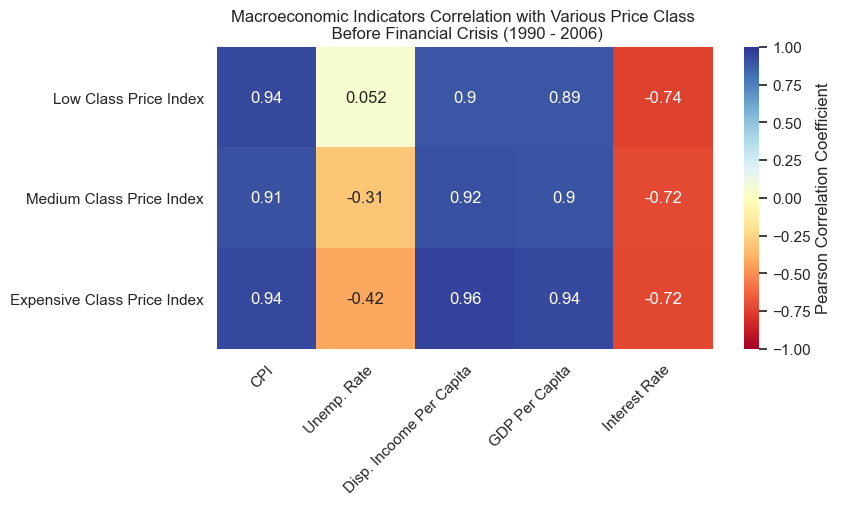

In [380]:
# Correlation Heatmap of Macroeconomic Indicators with Various Price Class - Before Financial Crisis


plt.figure(figsize=(8,4))
heatmap = sns.heatmap(corr_table_bfr_crisis.T, annot = True, vmin=-1, vmax=1, center= 0, cmap= 'RdYlBu',
                     xticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     cbar_kws={'label': 'Pearson Correlation Coefficient', 'orientation': 'vertical'})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right',rotation_mode="anchor")
plt.title('Macroeconomic Indicators Correlation with Various Price Class \n Before Financial Crisis (1990 - 2006)')
plt.show()

In [381]:
# Create Correlation Table of Macroeconomic Indicators with House Price Index Across Value Groups - After Financial Crisis

corr_table_aft_crisis = df_macro_aft_crisis.corr().loc[:,['Low Class Price Index','Medium Class Price Index','Expensive Class Price Index']].iloc[:5,]
corr_table_aft_crisis

,Low Class Price Index,Medium Class Price Index,Expensive Class Price Index
CPI,0.929257,0.935430,0.927155
Unemployment Rate,-0.966144,-0.965133,-0.949465
Disposal Personal Income Per Capita,0.939374,0.929270,0.939844
GDP Per Capita,0.968549,0.964412,0.963441
Interest Rate,-0.312040,-0.347146,-0.314728


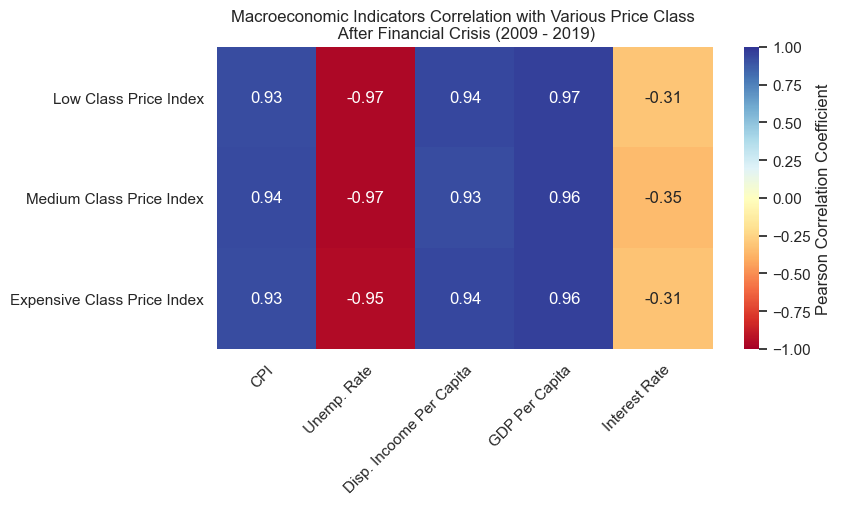

In [382]:
# Correlation Heatmap of Macroeconomic Indicators with Various Price Class - After Financial Crisis


plt.figure(figsize=(8,4))
heatmap = sns.heatmap(corr_table_aft_crisis.T, annot = True, vmin=-1, vmax=1, center= 0, cmap= 'RdYlBu',
                     xticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     cbar_kws={'label': 'Pearson Correlation Coefficient', 'orientation': 'vertical'})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right',rotation_mode="anchor")
plt.title('Macroeconomic Indicators Correlation with Various Price Class \n After Financial Crisis (2009 - 2019)')
plt.show()

Now, after having the correlation coefficient, we can run the Fisher Z transformation to check whether there is a significant difference between Pearson Correlation Coefficient for any macroeconomic indicators across value groups or not. 

For the purpose of having better perspective, I am going to for a new table with rows as macroeconomic indicators and columns as group comparison (Cheap Vs. Medium - Cheap Vs. Expensive - Medium vs. Expensive) 

In [383]:
# Create Fisher Z Transformation Result (p-value) for better visualization purpose of Final Result


# P Value of Correlation Coefficient Comparision (Z Fisher Transformation Output) - Before Financial Crisis
data_bfr_crisis_fisher_p_value = {
'Low Vs. Medium': [zfisher_out_bfr_crisis_che_med_cpi[1],zfisher_out_bfr_crisis_che_med_unem[1],
                      zfisher_out_bfr_crisis_che_med_inc[1],zfisher_out_bfr_crisis_che_med_gdp[1],zfisher_out_bfr_crisis_che_med_rate[1]],
'Low Vs. Expensive': [zfisher_out_bfr_crisis_che_exp_cpi[1],zfisher_out_bfr_crisis_che_exp_unem[1],
                        zfisher_out_bfr_crisis_che_exp_inc[1],zfisher_out_bfr_crisis_che_exp_gdp[1],zfisher_out_bfr_crisis_che_exp_rate[1]],
'Medium Vs. Expensive': [zfisher_out_bfr_crisis_med_exp_cpi[1],zfisher_out_bfr_crisis_med_exp_unem[1],
                         zfisher_out_bfr_crisis_med_exp_inc[1],zfisher_out_bfr_crisis_med_exp_gdp[1],zfisher_out_bfr_crisis_med_exp_rate[1]]
                                 }

df_bfr_crisis_fisher_p_value = pd.DataFrame(data = data_bfr_crisis_fisher_p_value,
                                   columns = ['Low Vs. Medium','Low Vs. Expensive','Medium Vs. Expensive'],
                                   index = ['CPI','Unemployment Rate','Disposal Personal Income Per Capita','GDP Per Capita','Interest Rate'])

# P Value of Correlation Coefficient Comparision (Z Fisher Transformation Output) - After Financial Crisis
data_aft_crisis_fisher_p_value = {
'Low Vs. Medium': [zfisher_out_aft_crisis_che_med_cpi[1],zfisher_out_aft_crisis_che_med_unem[1],
                      zfisher_out_aft_crisis_che_med_inc[1],zfisher_out_aft_crisis_che_med_gdp[1],zfisher_out_aft_crisis_che_med_rate[1]],
'Low Vs. Expensive': [zfisher_out_aft_crisis_che_exp_cpi[1],zfisher_out_aft_crisis_che_exp_unem[1],
                        zfisher_out_aft_crisis_che_exp_inc[1],zfisher_out_aft_crisis_che_exp_gdp[1],zfisher_out_aft_crisis_che_exp_rate[1]],
'Medium Vs. Expensive': [zfisher_out_aft_crisis_med_exp_cpi[1],zfisher_out_aft_crisis_med_exp_unem[1],
                         zfisher_out_aft_crisis_med_exp_inc[1],zfisher_out_aft_crisis_med_exp_gdp[1],zfisher_out_aft_crisis_med_exp_rate[1]]
                                 }

df_aft_crisis_fisher_p_value = pd.DataFrame(data = data_aft_crisis_fisher_p_value,
                                   columns = ['Low Vs. Medium','Low Vs. Expensive','Medium Vs. Expensive'],
                                   index = ['CPI','Unemployment Rate','Disposal Personal Income Per Capita','GDP Per Capita','Interest Rate'])

In [384]:
# Let's take a look at rows
df_bfr_crisis_fisher_p_value

,Low Vs. Medium,Low Vs. Expensive,Medium Vs. Expensive
CPI,0.023,0.709,0.040
Unemployment Rate,0.001,0.000,0.202
Disposal Personal Income Per Capita,0.302,0.000,0.001
GDP Per Capita,0.708,0.001,0.002
Interest Rate,0.603,0.684,0.902


<br> 

Now it's time to visualize the final results (P-value of Fisher Z transformation). 

<br>

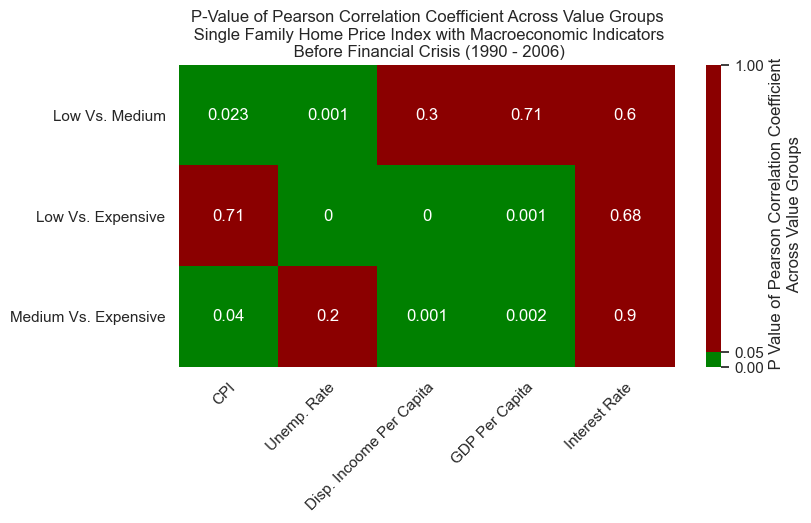

In [385]:
# Z Fisher P Value Heatmap - Before Financial Crisis


plt.figure(figsize=(8,4))
heatmap = sns.heatmap(df_bfr_crisis_fisher_p_value.T, annot = True, vmin=0, vmax=1, center= 0.05, cmap= colors.ListedColormap(['green', 'darkred']),
                     xticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     cbar_kws={'label': ' P Value of Pearson Correlation Coefficient\n Across Value Groups', 
                               'ticks': [0.0, 0.05, 1.0],
                               'orientation': 'vertical'})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right',rotation_mode="anchor")
#plt.pcolor(df_bfr_crisis_fisher_p_value.T < 0.05, cmap='RdYlGn')
plt.title('P-Value of Pearson Correlation Coefficient Across Value Groups\n Single Family Home Price Index with Macroeconomic Indicators\n Before Financial Crisis (1990 - 2006)')
plt.show()

The above figure shows that before the financial crisis, disposable income per capita, GDP per capita, and interest rate had the statistically same impact on cheap and medium classes. But inflation and unemployment rate impact these two classes differently. Inflation could boost cheap classes more than medium classes, and unemployment decreased the single-family home prices more in the medium value regions than cheap regions. 
Moreover, medium and expensive classes had a statistically significant different correlation with inflation, disposable income, and GDP. An increase in these mentioned indicators led to more growth in the single-family home price index in the expensive class compared to the medium class. However, unemployment and interest rates had the same negative impacts on these two groups' price indexes. 
One fascinating point is that inflation impacted expensive and cheap classes very similarly, and it's different from medium classes. This tells us that medium regions have lower sensitivity to inflation compared to cheap and expensive classes. 


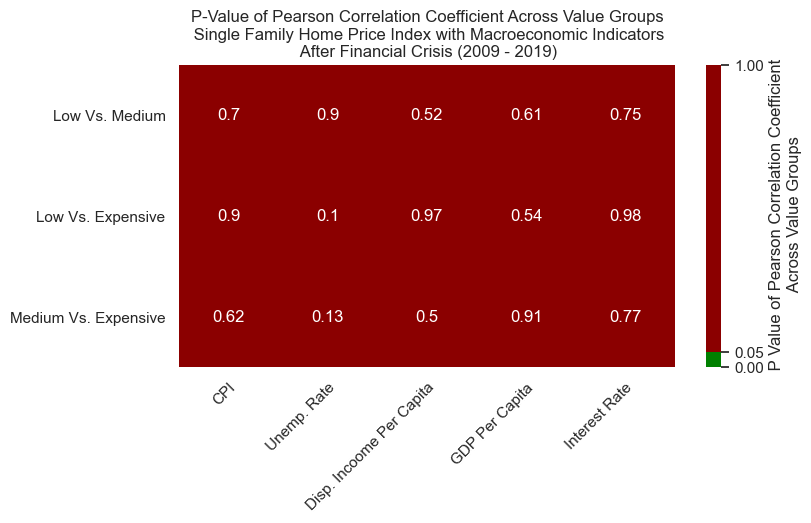

In [386]:
# Z Fisher P Value Heatmap - After Financial Crisis


plt.figure(figsize=(8,4))
heatmap = sns.heatmap(df_aft_crisis_fisher_p_value.T, annot = True, vmin=0, vmax=1, center= 0.05, cmap= colors.ListedColormap(['green', 'darkred']),
                     xticklabels = ['CPI', 'Unemp. Rate', 'Disp. Incoome Per Capita','GDP Per Capita','Interest Rate'],
                     cbar_kws={'label': ' P Value of Pearson Correlation Coefficient\n Across Value Groups', 
                               'ticks': [0.0, 0.05, 1.0],
                               'orientation': 'vertical'})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right',rotation_mode="anchor")
#plt.pcolor(df_aft_crisis_fisher_p_value.T < 0.05, cmap='RdYlGn')
plt.title('P-Value of Pearson Correlation Coefficient Across Value Groups\n Single Family Home Price Index with Macroeconomic Indicators\n After Financial Crisis (2009 - 2019)')
plt.show()

The above figure concludes that all macroeconomic indicators had a similar impact across value groups after the financial crisis. In other words, it seems that the Bay Area single-family home market proceeds towards a very solid and uniform market in terms of sensitivity to macroeconomic indicators. However, the current conclusion should be made with caution as we have recently gone through a financial crisis, and this behavior may change over time. 